In [1]:
from scipy import stats


In [2]:
import pandas as pd

In [3]:
import sys
sys.path.insert(0,'/data/AS/Samora/gloabl_files')

In [4]:
import COGStats

In [5]:
df = pd.read_csv('all_samples6.csv')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 371610 entries, 0 to 371609
Data columns (total 56 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   P_MASTER_ID                           371610 non-null  int64  
 1   DOB                                   371609 non-null  object 
 2   Sex                                   371610 non-null  object 
 3   Ethnicity                             371610 non-null  object 
 4   PatAgeAtSampleDate                    371609 non-null  float64
 5   SR_SAMPLE_ID                          371610 non-null  int64  
 6   SR_SAMPLE_NO                          371607 non-null  object 
 7   SR_P_MASTER_ID                        371610 non-null  int64  
 8   SR_P_ORIG_PAT_ID                      333175 non-null  float64
 9   SR_TMS_NO                             313571 non-null  object 
 10  SR_SAMPLE_DATETM                      371610 non-null  object 
 11  

In [7]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate',
       'SR_SAMPLE_ID', 'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID',
       'SR_TMS_NO', 'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM',
       'SR_CURRENT_DOSE', 'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS',
       'SR_DOSAGE_MORNING', 'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON',
       'SR_DOSAGE_EVENING', 'FORMULATION', 'SR_FORMULATION_ID',
       'SR_ARIVAL_DATETM', 'SR_TMS_FROM_LIMS', 'SR_WEIGHT',
       'SR_WEIGHT_DATA_ENTRY_CONVERSION', 'SMOKER_QUAL', 'SR_SMOKER_QUANTITY',
       'ETHANOL_QUAL', 'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE',
       'CAFFEINE_CHOCOLATE', 'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P

In [8]:
df['CAFFEINE_COFFEE'].value_counts()

Unknown                     305890
3 cups or more per day       15152
Less than 3 cups per day      5395
None                          1898
Name: CAFFEINE_COFFEE, dtype: int64

In [9]:
df['CAFFEINE_CHOCOLATE'].value_counts()

Unknown                     311042
Less than 3 bars per day     11130
None                          4184
3 or more bars per day        1979
Name: CAFFEINE_CHOCOLATE, dtype: int64

In [10]:
#pd.get_dummies(df[['CAFFEINE_CHOCOLATE', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate']], columns=['CAFFEINE_CHOCOLATE', 'Sex', 'Ethnicity'])

In [11]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate',
       'SR_SAMPLE_ID', 'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID',
       'SR_TMS_NO', 'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM',
       'SR_CURRENT_DOSE', 'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS',
       'SR_DOSAGE_MORNING', 'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON',
       'SR_DOSAGE_EVENING', 'FORMULATION', 'SR_FORMULATION_ID',
       'SR_ARIVAL_DATETM', 'SR_TMS_FROM_LIMS', 'SR_WEIGHT',
       'SR_WEIGHT_DATA_ENTRY_CONVERSION', 'SMOKER_QUAL', 'SR_SMOKER_QUANTITY',
       'ETHANOL_QUAL', 'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE',
       'CAFFEINE_CHOCOLATE', 'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P

In [12]:
pd.get_dummies(df[['CAFFEINE_CHOCOLATE', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate']], columns=['CAFFEINE_CHOCOLATE', 'Sex', 'Ethnicity']).columns

Index(['PatAgeAtSampleDate', 'CAFFEINE_CHOCOLATE_3 or more bars per day',
       'CAFFEINE_CHOCOLATE_Less than 3 bars per day',
       'CAFFEINE_CHOCOLATE_None', 'CAFFEINE_CHOCOLATE_Unknown', 'Sex_Female',
       'Sex_Male', 'Ethnicity_Afro-caribbean', 'Ethnicity_Asian',
       'Ethnicity_Caucasian', 'Ethnicity_Mixed', 'Ethnicity_Unknown'],
      dtype='object')

In [13]:
#pd.get_dummies(df[['SR_NORCLOZAPINE','CAFFEINE_CHOCOLATE', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate','SR_CURRENT_DOSE','SR_WEIGHT','SR_DERIVED_SMOKER_STATUS','ETHANOL_QUAL','SR_ETHANOL_QUANTITY']], columns=['CAFFEINE_CHOCOLATE', 'Sex', 'Ethnicity','SR_DERIVED_SMOKER_STATUS','ETHANOL_QUAL'])

In [14]:
COGStats.genMissingValueDF(df)

,column_name,percent_missing
P_MASTER_ID,P_MASTER_ID,0.000000
DOB,DOB,0.000269
Sex,Sex,0.000000
Ethnicity,Ethnicity,0.000000
PatAgeAtSampleDate,PatAgeAtSampleDate,0.000269
SR_SAMPLE_ID,SR_SAMPLE_ID,0.000000
SR_SAMPLE_NO,SR_SAMPLE_NO,0.000807
SR_P_MASTER_ID,SR_P_MASTER_ID,0.000000
SR_P_ORIG_PAT_ID,SR_P_ORIG_PAT_ID,10.342833
SR_TMS_NO,SR_TMS_NO,15.618256


In [15]:
import statsmodels.api as sm


In [16]:
X = pd.get_dummies(df[['SR_NORCLOZAPINE','CAFFEINE_CHOCOLATE', 'CAFFEINE_COFFEE', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate','SR_CURRENT_DOSE','SR_WEIGHT','SR_DERIVED_SMOKER_STATUS','DERIVED_CLOZ_BRAND','FORMULATION']], columns=['CAFFEINE_CHOCOLATE', 'CAFFEINE_COFFEE','Sex', 'Ethnicity','SR_DERIVED_SMOKER_STATUS','DERIVED_CLOZ_BRAND','FORMULATION'])
y = df['SR_CLOZAPINE']

In [17]:
COGStats.genMissingValueDF(X)

,column_name,percent_missing
SR_NORCLOZAPINE,SR_NORCLOZAPINE,0.000000
PatAgeAtSampleDate,PatAgeAtSampleDate,0.000269
SR_CURRENT_DOSE,SR_CURRENT_DOSE,19.515621
SR_WEIGHT,SR_WEIGHT,76.884906
CAFFEINE_CHOCOLATE_3 or more bars per day,CAFFEINE_CHOCOLATE_3 or more bars per day,0.000000
CAFFEINE_CHOCOLATE_Less than 3 bars per day,CAFFEINE_CHOCOLATE_Less than 3 bars per day,0.000000
CAFFEINE_CHOCOLATE_None,CAFFEINE_CHOCOLATE_None,0.000000
CAFFEINE_CHOCOLATE_Unknown,CAFFEINE_CHOCOLATE_Unknown,0.000000
CAFFEINE_COFFEE_3 cups or more per day,CAFFEINE_COFFEE_3 cups or more per day,0.000000
CAFFEINE_COFFEE_Less than 3 cups per day,CAFFEINE_COFFEE_Less than 3 cups per day,0.000000


In [18]:
X = X.fillna(X.mean())

In [19]:
mod = sm.OLS(y, X)

In [20]:
res = mod.fit()

In [21]:
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:           SR_CLOZAPINE   R-squared:                       0.658
Model:                            OLS   Adj. R-squared:                  0.658
Method:                 Least Squares   F-statistic:                 3.104e+04
Date:                Mon, 30 Oct 2023   Prob (F-statistic):               0.00
Time:                        16:03:48   Log-Likelihood:                 77917.
No. Observations:              371610   AIC:                        -1.558e+05
Df Residuals:                  371586   BIC:                        -1.555e+05
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import (datasets, feature_selection, linear_model, metrics, svm,
                     tree)
from sklearn.metrics import (accuracy_score, classification_report,
                             confusion_matrix, f1_score, matthews_corrcoef,
                             mean_squared_error, plot_confusion_matrix,
                             precision_recall_curve, r2_score, roc_auc_score,
                             roc_curve)
import sklearn
from sklearn.metrics import *


In [23]:
from xgboost import XGBRegressor
import shap
from sklearn.model_selection import train_test_split

In [24]:
test_size = 0.25
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=1) #fix?

In [25]:
model = XGBRegressor()
model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [26]:
y_pred = model.predict(X_test)

In [27]:
explainer = shap.TreeExplainer(model)
        


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


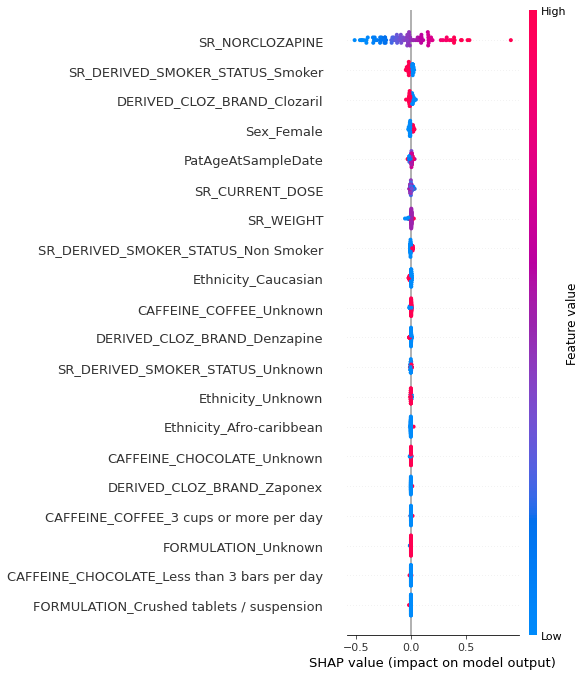

In [28]:
X_sampled = X_train.sample(100, random_state=10)
shap_values = explainer.shap_values(X_sampled)

shap.summary_plot(shap_values, X_sampled)

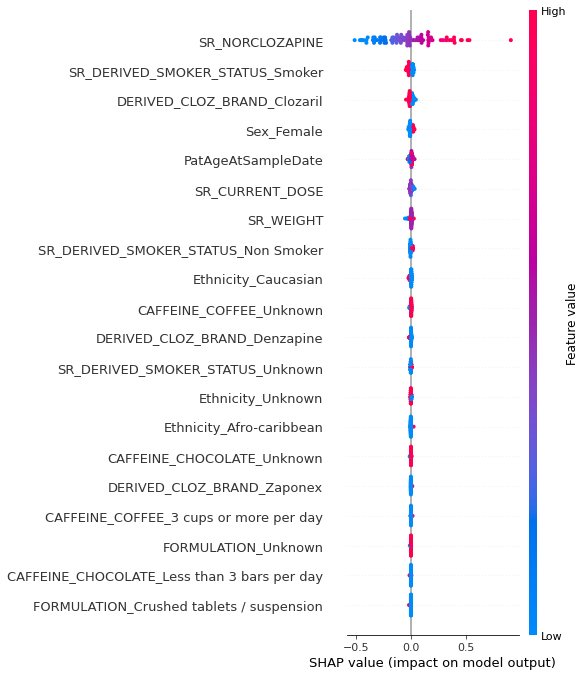

In [29]:
fig = shap.summary_plot(shap_values, X_sampled, show=True)
#plt.tight_layout()
#plt.savefig(f'{file_path}shap.png', bbox_inches='tight', dpi=300)

In [30]:
from xgboost import plot_tree
import matplotlib.pyplot as plt

In [31]:
%matplotlib inline

In [32]:
try:
    plot_tree(model)
    plt.rcParams['figure.figsize'] = [20, 20]
    plt.savefig(f'tree.png', dpi=900)
    plt.show()
    #plt.savefig(f'tree.png', bbox_inches='tight', dpi=300)
except:
    pass

In [33]:
y_test

296107    0.47
121111    0.25
65166     0.81
1141      0.74
338817    0.41
          ... 
332634    0.25
224780    0.21
203188    0.82
101717    0.60
289911    1.02
Name: SR_CLOZAPINE, Length: 92903, dtype: float64

In [34]:
#auc = metrics.roc_auc_score(y_test, y_pred)
ev = explained_variance_score(y_test, y_pred)
nae  = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
medae = median_absolute_error(y_test, y_pred)

In [35]:
print(ev, nae, mse, r2, medae)

0.6690420302222406 0.1326424168140836 0.036976550476178344 0.6690213484647887 0.09541833400726318


In [36]:
df2 = df.copy()

In [37]:
df2 = pd.get_dummies(df2[['SR_CLOZAPINE','SR_NORCLOZAPINE','CAFFEINE_CHOCOLATE','CAFFEINE_COFFEE', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate','SR_CURRENT_DOSE','SR_WEIGHT','SR_DERIVED_SMOKER_STATUS','DERIVED_CLOZ_BRAND','FORMULATION']], columns=['CAFFEINE_CHOCOLATE','CAFFEINE_COFFEE', 'Sex', 'Ethnicity','SR_DERIVED_SMOKER_STATUS','DERIVED_CLOZ_BRAND','FORMULATION'])

In [38]:
df2.shape

(371610, 29)

In [39]:
df2.dropna(inplace=True)

In [40]:
df2.columns

Index(['SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'PatAgeAtSampleDate',
       'SR_CURRENT_DOSE', 'SR_WEIGHT',
       'CAFFEINE_CHOCOLATE_3 or more bars per day',
       'CAFFEINE_CHOCOLATE_Less than 3 bars per day',
       'CAFFEINE_CHOCOLATE_None', 'CAFFEINE_CHOCOLATE_Unknown',
       'CAFFEINE_COFFEE_3 cups or more per day',
       'CAFFEINE_COFFEE_Less than 3 cups per day', 'CAFFEINE_COFFEE_None',
       'CAFFEINE_COFFEE_Unknown', 'Sex_Female', 'Sex_Male',
       'Ethnicity_Afro-caribbean', 'Ethnicity_Asian', 'Ethnicity_Caucasian',
       'Ethnicity_Mixed', 'Ethnicity_Unknown',
       'SR_DERIVED_SMOKER_STATUS_Non Smoker',
       'SR_DERIVED_SMOKER_STATUS_Smoker', 'SR_DERIVED_SMOKER_STATUS_Unknown',
       'DERIVED_CLOZ_BRAND_Clozaril', 'DERIVED_CLOZ_BRAND_Denzapine',
       'DERIVED_CLOZ_BRAND_Zaponex',
       'FORMULATION_Crushed tablets / suspension', 'FORMULATION_Oral tablets',
       'FORMULATION_Unknown'],
      dtype='object')

<AxesSubplot:ylabel='CAFFEINE_COFFEE'>

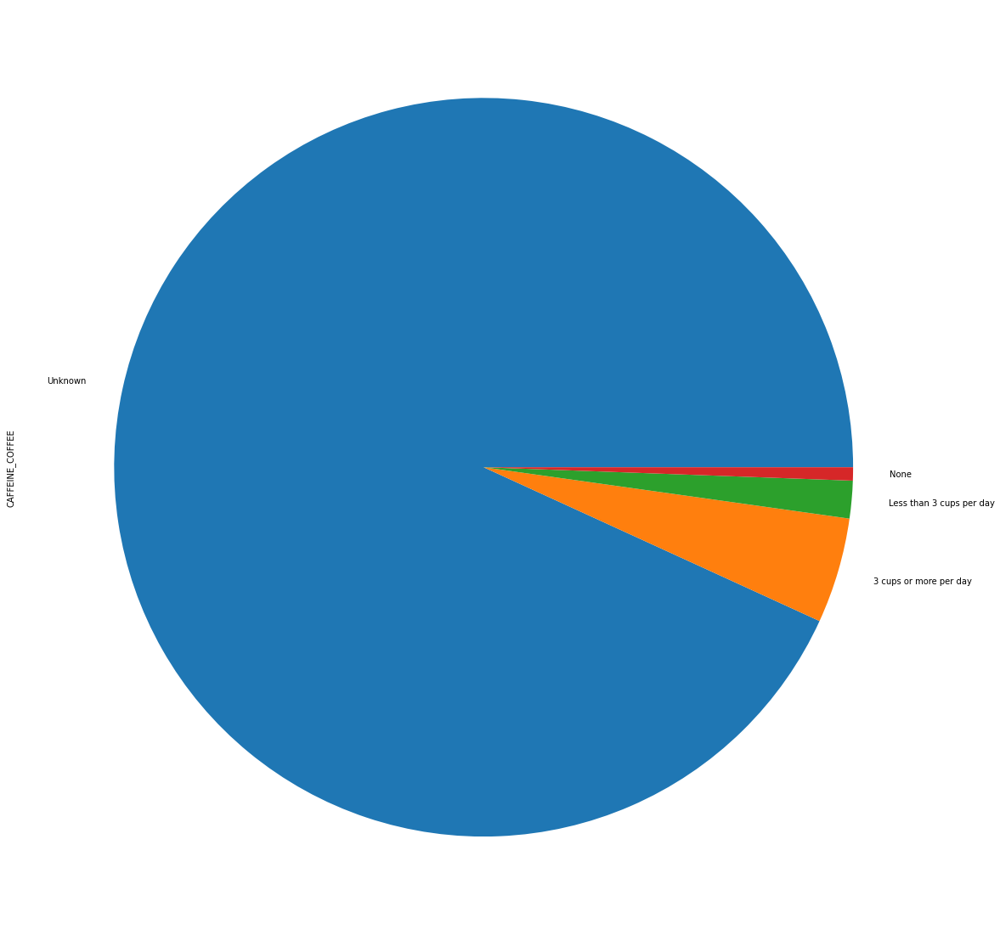

In [41]:
df['CAFFEINE_COFFEE'].value_counts().plot(kind='pie')

<AxesSubplot:ylabel='CAFFEINE_CHOCOLATE'>

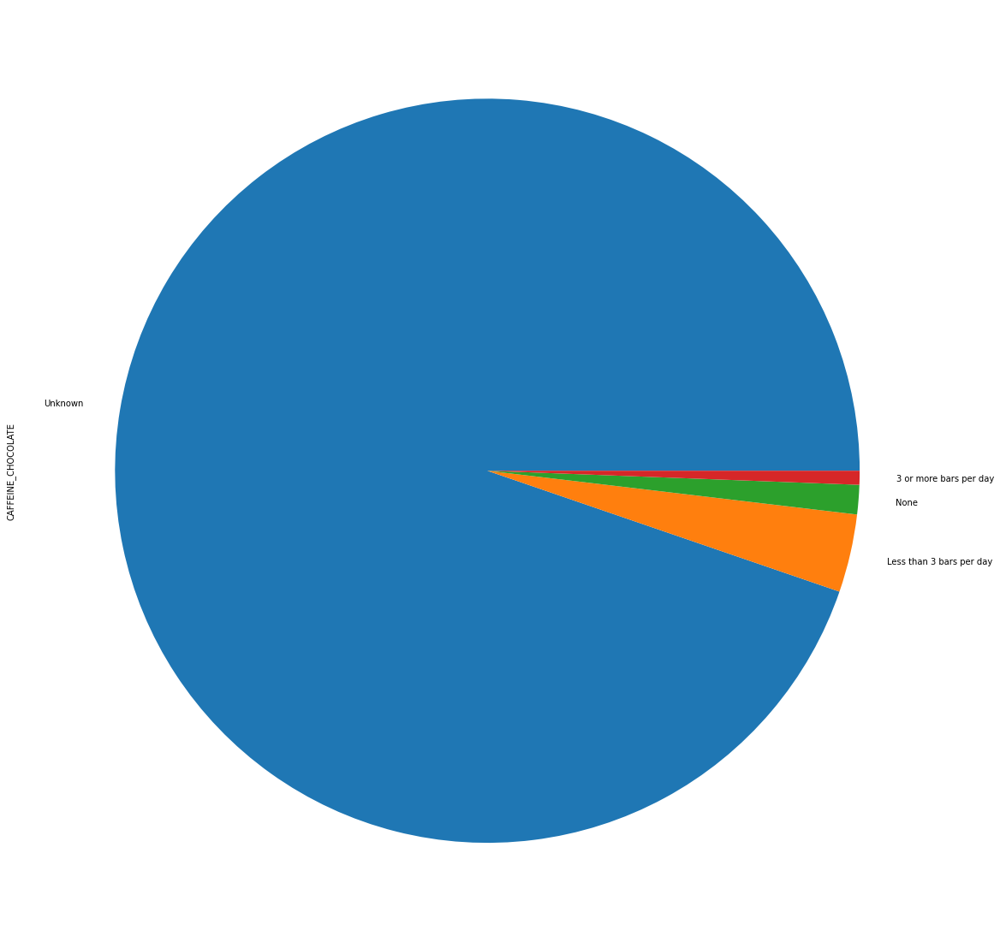

In [42]:
df['CAFFEINE_CHOCOLATE'].value_counts().plot(kind='pie')

In [43]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate',
       'SR_SAMPLE_ID', 'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID',
       'SR_TMS_NO', 'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM',
       'SR_CURRENT_DOSE', 'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS',
       'SR_DOSAGE_MORNING', 'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON',
       'SR_DOSAGE_EVENING', 'FORMULATION', 'SR_FORMULATION_ID',
       'SR_ARIVAL_DATETM', 'SR_TMS_FROM_LIMS', 'SR_WEIGHT',
       'SR_WEIGHT_DATA_ENTRY_CONVERSION', 'SMOKER_QUAL', 'SR_SMOKER_QUANTITY',
       'ETHANOL_QUAL', 'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE',
       'CAFFEINE_CHOCOLATE', 'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P

In [44]:
X = df2.drop('SR_CLOZAPINE', axis=1)
y = df2['SR_CLOZAPINE']

mod = sm.OLS(y, X)
res = mod.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           SR_CLOZAPINE   R-squared:                       0.654
Model:                            OLS   Adj. R-squared:                  0.654
Method:                 Least Squares   F-statistic:                     7108.
Date:                Mon, 30 Oct 2023   Prob (F-statistic):               0.00
Time:                        16:03:58   Log-Likelihood:                 17197.
No. Observations:               82643   AIC:                        -3.435e+04
Df Residuals:                   82620   BIC:                        -3.413e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
===============================================================================================================
                                                  coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------
SR_NORCLOZAPINE                                 1.3220      0.004    341.874      0.000       1.314       1.330
PatAgeAtSampleDate                              0.0009   6.15e-05     13.919      0.000       0.001       0.001
SR_CURRENT_DOSE                             -7.153e-06   4.73e-06     -1.513      0.130   -1.64e-05    2.11e-06
SR_WEIGHT                                       0.0009    3.5e-05     25.590      0.000       0.001       0.001
CAFFEINE_CHOCOLATE_3 or more bars per day       0.0040      0.005      0.887      0.375      -0.005       0.013
CAFFEINE_CHOCOLATE_Less than 3 bars per day     0.0020      0.003      0.774      0.439      -0.003       0.007
CAFFEINE_CHOCOLATE_None                         0.0082      0.003      2.377      0.017       0.001       0.015
CAFFEINE_CHOCOLATE_Unknown                      0.0070      0.003      2.263      0.024       0.001       0.013
CAFFEINE_COFFEE_3 cups or more per day         -0.0063      0.002     -2.699      0.007      -0.011      -0.002
CAFFEINE_COFFEE_Less than 3 cups per day        0.0016      0.003      0.513      0.608      -0.005       0.008
CAFFEINE_COFFEE_None                            0.0166      0.005      3.558      0.000       0.007       0.026
CAFFEINE_COFFEE_Unknown                         0.0092      0.003      2.821      0.005       0.003       0.016
Sex_Female                                      0.0291      0.002     16.063      0.000       0.026       0.033
Sex_Male                                       -0.0079      0.002     -4.274      0.000      -0.012      -0.004
Ethnicity_Afro-caribbean                        0.0281      0.004      7.331      0.000       0.021       0.036
Ethnicity_Asian                                 0.0270      0.004      6.339      0.000       0.019       0.035
Ethnicity_Caucasian                            -0.0264      0.002    -12.481      0.000      -0.030      -0.022
Ethnicity_Mixed                                 0.0064      0.006      1.028      0.304      -0.006       0.019
Ethnicity_Unknown                              -0.0139      0.002     -6.454      0.000      -0.018      -0.010
SR_DERIVED_SMOKER_STATUS_Non Smoker             0.0340      0.002     20.880      0.000       0.031       0.037
SR_DERIVED_SMOKER_STATUS_Smoker                -0.0273      0.002    -17.277      0.000      -0.030      -0.024
SR_DERIVED_SMOKER_STATUS_Unknown                0.0145      0.003      5.792      0.000       0.010       0.019
DERIVED_CLOZ_BRAND_Clozaril                    -0.0479      0.003    -17.518      0.000      -0.053      -0.043
DERIVED_CLOZ_BRAND_Denzapine                   -0.0353      0.003    -10.531      0.000      -0.042      -0.029
DERIVED_CLOZ_BRAND_Zaponex                     -0.0234     

In [45]:
#%pip install researchpy

In [46]:
import pandas as pd
import researchpy as rp
import scipy.stats as stats

In [47]:
#keep nan
df2 = df.copy()
df2 = pd.get_dummies(df2[['SR_CLOZAPINE','SR_NORCLOZAPINE','CAFFEINE_CHOCOLATE','CAFFEINE_COFFEE', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate','SR_CURRENT_DOSE','SR_WEIGHT','SR_DERIVED_SMOKER_STATUS','DERIVED_CLOZ_BRAND','FORMULATION']], columns=['CAFFEINE_CHOCOLATE','CAFFEINE_COFFEE', 'Sex', 'Ethnicity','SR_DERIVED_SMOKER_STATUS','DERIVED_CLOZ_BRAND','FORMULATION'])

In [48]:
df2.columns

Index(['SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'PatAgeAtSampleDate',
       'SR_CURRENT_DOSE', 'SR_WEIGHT',
       'CAFFEINE_CHOCOLATE_3 or more bars per day',
       'CAFFEINE_CHOCOLATE_Less than 3 bars per day',
       'CAFFEINE_CHOCOLATE_None', 'CAFFEINE_CHOCOLATE_Unknown',
       'CAFFEINE_COFFEE_3 cups or more per day',
       'CAFFEINE_COFFEE_Less than 3 cups per day', 'CAFFEINE_COFFEE_None',
       'CAFFEINE_COFFEE_Unknown', 'Sex_Female', 'Sex_Male',
       'Ethnicity_Afro-caribbean', 'Ethnicity_Asian', 'Ethnicity_Caucasian',
       'Ethnicity_Mixed', 'Ethnicity_Unknown',
       'SR_DERIVED_SMOKER_STATUS_Non Smoker',
       'SR_DERIVED_SMOKER_STATUS_Smoker', 'SR_DERIVED_SMOKER_STATUS_Unknown',
       'DERIVED_CLOZ_BRAND_Clozaril', 'DERIVED_CLOZ_BRAND_Denzapine',
       'DERIVED_CLOZ_BRAND_Zaponex',
       'FORMULATION_Crushed tablets / suspension', 'FORMULATION_Oral tablets',
       'FORMULATION_Unknown'],
      dtype='object')

In [49]:
df2.columns = map(lambda x : x.replace("-", "_").replace(" ", "_"), df2.columns)

In [50]:
df2.columns

Index(['SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'PatAgeAtSampleDate',
       'SR_CURRENT_DOSE', 'SR_WEIGHT',
       'CAFFEINE_CHOCOLATE_3_or_more_bars_per_day',
       'CAFFEINE_CHOCOLATE_Less_than_3_bars_per_day',
       'CAFFEINE_CHOCOLATE_None', 'CAFFEINE_CHOCOLATE_Unknown',
       'CAFFEINE_COFFEE_3_cups_or_more_per_day',
       'CAFFEINE_COFFEE_Less_than_3_cups_per_day', 'CAFFEINE_COFFEE_None',
       'CAFFEINE_COFFEE_Unknown', 'Sex_Female', 'Sex_Male',
       'Ethnicity_Afro_caribbean', 'Ethnicity_Asian', 'Ethnicity_Caucasian',
       'Ethnicity_Mixed', 'Ethnicity_Unknown',
       'SR_DERIVED_SMOKER_STATUS_Non_Smoker',
       'SR_DERIVED_SMOKER_STATUS_Smoker', 'SR_DERIVED_SMOKER_STATUS_Unknown',
       'DERIVED_CLOZ_BRAND_Clozaril', 'DERIVED_CLOZ_BRAND_Denzapine',
       'DERIVED_CLOZ_BRAND_Zaponex',
       'FORMULATION_Crushed_tablets_/_suspension', 'FORMULATION_Oral_tablets',
       'FORMULATION_Unknown'],
      dtype='object')

In [51]:
df2.shape

(371610, 29)

In [52]:
df2[df2['SR_CLOZAPINE']>=0.01].shape

(371610, 29)

In [53]:
CAFFEINE_CHOCOLATE_3_or_more_bars_per_day = df2[df2['CAFFEINE_CHOCOLATE_3_or_more_bars_per_day']==1]

In [54]:
CAFFEINE_CHOCOLATE_Less_than_3_bars_per_day = df2[df2['CAFFEINE_CHOCOLATE_Less_than_3_bars_per_day']==1]

In [55]:
CAFFEINE_CHOCOLATE_None = df2[df2['CAFFEINE_CHOCOLATE_None']==1]

In [56]:
CAFFEINE_CHOCOLATE_Unknown = df2[df2['CAFFEINE_CHOCOLATE_Unknown']==1]

In [57]:
CAFFEINE_COFFEE_3_cups_or_more_per_day = df2[df2['CAFFEINE_COFFEE_3_cups_or_more_per_day']==1]

In [58]:
CAFFEINE_COFFEE_Less_than_3_cups_per_day = df2[df2['CAFFEINE_COFFEE_Less_than_3_cups_per_day']==1]

In [59]:
CAFFEINE_COFFEE_None = df2[df2['CAFFEINE_COFFEE_None']==1]

In [60]:
CAFFEINE_COFFEE_Unknown = df2[df2['CAFFEINE_COFFEE_Unknown']==1]

In [61]:
chocolate_group_list = [CAFFEINE_CHOCOLATE_3_or_more_bars_per_day,
                        CAFFEINE_CHOCOLATE_Less_than_3_bars_per_day,
                       CAFFEINE_CHOCOLATE_None,
                       #CAFFEINE_CHOCOLATE_Unknown
                       ]

coffee_group_list = [CAFFEINE_COFFEE_3_cups_or_more_per_day,
                    CAFFEINE_COFFEE_Less_than_3_cups_per_day,
                    CAFFEINE_COFFEE_None,
                     
                    #CAFFEINE_COFFEE_Unknown
                     
                    ]

In [62]:
COGStats.getVariableName(coffee_group_list[0], globals())

'CAFFEINE_COFFEE_3_cups_or_more_per_day'

In [63]:
outcome_var = 'SR_CLOZAPINE'

In [64]:
rp.ttest(group1 = coffee_group_list[0][outcome_var],
        group2  = coffee_group_list[1][outcome_var],
        group1_name = COGStats.getVariableName(coffee_group_list[0], globals()),
        group2_name = COGStats.getVariableName(coffee_group_list[1], globals()))

(                                   Variable        N      Mean        SD  \
 0    CAFFEINE_COFFEE_3_cups_or_more_per_day  15152.0  0.482639  0.344813   
 1  CAFFEINE_COFFEE_Less_than_3_cups_per_day   5395.0  0.521944  0.354209   
 2                                  combined  20547.0  0.492959  0.347727   
 
          SE  95% Conf.  Interval  
 0  0.002801   0.477148  0.488129  
 1  0.004822   0.512491  0.531398  
 2  0.002426   0.488204  0.497714  ,
                                   Independent t-test     results
 0  Difference (CAFFEINE_COFFEE_3_cups_or_more_per...     -0.0393
 1                              Degrees of freedom =   20545.0000
 2                                               t =      -7.1384
 3                           Two side test p value =       0.0000
 4                          Difference < 0 p value =       0.0000
 5                          Difference > 0 p value =       1.0000
 6                                       Cohen's d =      -0.1132
 7               

In [65]:
len(coffee_group_list)

3

# Coffee, Chocolate, sex, smoking status on Clozapine

chocolate_group_list = [<br>CAFFEINE_CHOCOLATE_3_or_more_bars_per_day,<br>
                        CAFFEINE_CHOCOLATE_Less_than_3_bars_per_day,<br>
                       CAFFEINE_CHOCOLATE_None,<br>
                       CAFFEINE_CHOCOLATE_Unknown<br>]<br>

coffee_group_list = [<br>CAFFEINE_COFFEE_3_cups_or_more_per_day,<br>
                    CAFFEINE_COFFEE_Less_than_3_cups_per_day,<br>
                    CAFFEINE_COFFEE_None,<br>
                    CAFFEINE_COFFEE_Unknown<br>]<br>

# All male and female Clozapine

In [66]:
outcome_var = 'SR_CLOZAPINE'

In [67]:

#perform Kruskal-Wallis Test 
stats.kruskal(coffee_group_list[0][outcome_var], 
             coffee_group_list[1][outcome_var],
             coffee_group_list[2][outcome_var],
             #coffee_group_list[3][outcome_var]
             )

KruskalResult(statistic=117.70774972390107, pvalue=2.7547799209041455e-26)

In [68]:
stats.kruskal(chocolate_group_list[0][outcome_var], 
             chocolate_group_list[1][outcome_var],
             chocolate_group_list[2][outcome_var],
             #chocolate_group_list[3][outcome_var]
             )

KruskalResult(statistic=0.24425737146707963, pvalue=0.8850344698642568)

# Male choc, coffee

In [69]:
chocolate_group_list[0][chocolate_group_list[0]['Sex_Male']==1][outcome_var].shape[0]

1414

In [70]:
chocolate_group_list[1][chocolate_group_list[1]['Sex_Male']==1][outcome_var].shape[0]

8044

In [71]:
chocolate_group_list[2][chocolate_group_list[2]['Sex_Male']==1][outcome_var].shape[0]

3158

In [72]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Male']==1][outcome_var], 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Male']==1][outcome_var],
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Male']==1][outcome_var],
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=0.7406826332565599, pvalue=0.6904986117542598)

In [73]:
sum_list = []
for i in range(0,3):
    print(chocolate_group_list[i][chocolate_group_list[i]['Sex_Male']==1][outcome_var].shape[0])
    sum_list.append(chocolate_group_list[i][chocolate_group_list[i]['Sex_Male']==1][outcome_var].shape[0])
    
print(f"Sum: {sum(sum_list)}")

1414
8044
3158
Sum: 12616


In [74]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Male']==1][outcome_var], 
             coffee_group_list[1][coffee_group_list[1]['Sex_Male']==1][outcome_var],
             coffee_group_list[2][coffee_group_list[2]['Sex_Male']==1][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=63.08738956517107, pvalue=1.9986991008105474e-14)

In [75]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][coffee_group_list[i]['Sex_Male']==1][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][coffee_group_list[i]['Sex_Male']==1][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

11294
3900
1364
Sum: 16558


## Female choc, coffee


In [76]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Female']==1][outcome_var], 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Female']==1][outcome_var],
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Female']==1][outcome_var],
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Female']==1][outcome_var]
             )

KruskalResult(statistic=0.1401083665455768, pvalue=0.9323433011259068)

In [77]:
sum_list = []
for i in range(0,3):
    print(chocolate_group_list[i][chocolate_group_list[i]['Sex_Female']==1][outcome_var].shape[0])
    sum_list.append(chocolate_group_list[i][chocolate_group_list[i]['Sex_Female']==1][outcome_var].shape[0])
    
print(f"Sum: {sum(sum_list)}")

565
3086
1026
Sum: 4677


In [78]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Female']==1][outcome_var], 
             coffee_group_list[1][coffee_group_list[1]['Sex_Female']==1][outcome_var],
             coffee_group_list[2][coffee_group_list[2]['Sex_Female']==1][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Female']==1][outcome_var]
             )

KruskalResult(statistic=51.09478682438173, pvalue=8.033559490187129e-12)

In [79]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

3858
1495
534
Sum: 5887


# Smoker/non smoker Coffee Clozapine

## Male non smoker

In [80]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
             coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #coffee_group_list[3][(coffee_group_list[3]['Sex_Male']==1) & (coffee_group_list[3]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=9.01695365515992, pvalue=0.011015225492001823)

In [81]:
sum_list = []
for elem in [coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
             coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var]]:
    print(elem.shape)
    sum_list.append(elem.shape[0])
print(sum(sum_list))

(1838,)
(1268,)
(533,)
3639


## Male smoker

In [82]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
             coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #coffee_group_list[3][(coffee_group_list[3]['Sex_Male']==1) & (coffee_group_list[3]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=4.495474910872997, pvalue=0.10563796498297016)

In [83]:
sum_list = []
for elem in [coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
             coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             ]:
    print(elem.shape)
    sum_list.append(elem.shape[0])
print(sum(sum_list))

(9131,)
(2530,)
(802,)
12463


## Female non smoker

In [84]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
             coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #coffee_group_list[3][(coffee_group_list[3]['Sex_Female']==1) & (coffee_group_list[3]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=2.73629129607349, pvalue=0.25457860045108704)

In [85]:
sum_list = []
for elem in [coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
             coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
   ]:
    print(elem.shape)
    sum_list.append(elem.shape[0])
print(sum(sum_list))

(979,)
(738,)
(295,)
2012


## Female smoker

In [86]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
             coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #coffee_group_list[3][(coffee_group_list[3]['Sex_Female']==1) & (coffee_group_list[3]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=11.285847161662975, pvalue=0.0035424964772262186)

In [87]:
sum_list = []
for elem in [coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
             coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             ]:
    print(elem.shape)
    sum_list.append(elem.shape[0])
print(sum(sum_list))

(2776,)
(709,)
(230,)
3715


# Smoker/non smoker Chocolate Clozapine

## Male non smoker

In [88]:
stats.kruskal(chocolate_group_list[0][(chocolate_group_list[0]['Sex_Male']==1) & (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
             chocolate_group_list[1][(chocolate_group_list[1]['Sex_Male']==1) & (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             chocolate_group_list[2][(chocolate_group_list[2]['Sex_Male']==1) & (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #chocolate_group_list[3][(chocolate_group_list[3]['Sex_Male']==1) & (chocolate_group_list[3]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=0.6666330130034147, pvalue=0.7165433676269477)

In [89]:
sum_list = []
for elem in [chocolate_group_list[0][(chocolate_group_list[0]['Sex_Male']==1) & (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
             chocolate_group_list[1][(chocolate_group_list[1]['Sex_Male']==1) & (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             chocolate_group_list[2][(chocolate_group_list[2]['Sex_Male']==1) & (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
                ]:
    print(elem.shape)
    sum_list.append(elem.shape[0])
print(sum(sum_list))

(283,)
(1913,)
(777,)
2973


## Male smoker

In [90]:
stats.kruskal(chocolate_group_list[0][(chocolate_group_list[0]['Sex_Male']==1) & (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
             chocolate_group_list[1][(chocolate_group_list[1]['Sex_Male']==1) & (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             chocolate_group_list[2][(chocolate_group_list[2]['Sex_Male']==1) & (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #chocolate_group_list[3][(chocolate_group_list[3]['Sex_Male']==1) & (chocolate_group_list[3]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=0.4706832939477187, pvalue=0.7903007996238487)

In [91]:
sum_list = []
for elem in [chocolate_group_list[0][(chocolate_group_list[0]['Sex_Male']==1) & (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
             chocolate_group_list[1][(chocolate_group_list[1]['Sex_Male']==1) & (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             chocolate_group_list[2][(chocolate_group_list[2]['Sex_Male']==1) & (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
               ]:
    print(elem.shape)
    sum_list.append(elem.shape[0])
print(sum(sum_list))

(1073,)
(5963,)
(2332,)
9368


## Female non smoker

In [92]:
stats.kruskal(chocolate_group_list[0][(chocolate_group_list[0]['Sex_Female']==1) & (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
             chocolate_group_list[1][(chocolate_group_list[1]['Sex_Female']==1) & (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             chocolate_group_list[2][(chocolate_group_list[2]['Sex_Female']==1) & (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #chocolate_group_list[3][(chocolate_group_list[3]['Sex_Female']==1) & (chocolate_group_list[3]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=2.5234896055518092, pvalue=0.2831595376851145)

In [93]:
sum_list = []
for elem in [chocolate_group_list[0][(chocolate_group_list[0]['Sex_Female']==1) & (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
             chocolate_group_list[1][(chocolate_group_list[1]['Sex_Female']==1) & (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             chocolate_group_list[2][(chocolate_group_list[2]['Sex_Female']==1) & (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
               ]:
    print(elem.shape)
    sum_list.append(elem.shape[0])
print(sum(sum_list))

(178,)
(1063,)
(433,)
1674


## Female smoker

In [94]:
stats.kruskal(chocolate_group_list[0][(chocolate_group_list[0]['Sex_Female']==1) & (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
             chocolate_group_list[1][(chocolate_group_list[1]['Sex_Female']==1) & (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             chocolate_group_list[2][(chocolate_group_list[2]['Sex_Female']==1) & (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #chocolate_group_list[3][(chocolate_group_list[3]['Sex_Female']==1) & (chocolate_group_list[3]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=0.25214699475474456, pvalue=0.8815500527854487)

In [95]:
sum_list = []
for elem in [chocolate_group_list[0][(chocolate_group_list[0]['Sex_Female']==1) & (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
             chocolate_group_list[1][(chocolate_group_list[1]['Sex_Female']==1) & (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             chocolate_group_list[2][(chocolate_group_list[2]['Sex_Female']==1) & (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
              ]:
    print(elem.shape)
    sum_list.append(elem.shape[0])
print(sum(sum_list))

(374,)
(1943,)
(576,)
2893


# Coffee, Chocolate, sex, smoking status on Clozapine

# All male and female Clozapine

In [96]:
#perform Kruskal-Wallis Test 
stats.kruskal(coffee_group_list[0][outcome_var], 
             coffee_group_list[1][outcome_var],
             coffee_group_list[2][outcome_var],
             #coffee_group_list[3][outcome_var]
             )

KruskalResult(statistic=117.70774972390107, pvalue=2.7547799209041455e-26)

In [97]:
stats.kruskal(chocolate_group_list[0][outcome_var], 
             chocolate_group_list[1][outcome_var],
             chocolate_group_list[2][outcome_var],
             #chocolate_group_list[3][outcome_var]
             )

KruskalResult(statistic=0.24425737146707963, pvalue=0.8850344698642568)

# Male choc, coffee

In [98]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Male']==1][outcome_var], 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Male']==1][outcome_var],
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Male']==1][outcome_var],
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=0.7406826332565599, pvalue=0.6904986117542598)

In [99]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Male']==1][outcome_var], 
             coffee_group_list[1][coffee_group_list[1]['Sex_Male']==1][outcome_var],
             coffee_group_list[2][coffee_group_list[2]['Sex_Male']==1][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=63.08738956517107, pvalue=1.9986991008105474e-14)

## Female choc, coffee


In [100]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Female']==1][outcome_var], 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Female']==1][outcome_var],
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Female']==1][outcome_var],
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Female']==1][outcome_var]
             )

KruskalResult(statistic=0.1401083665455768, pvalue=0.9323433011259068)

In [101]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Female']==1][outcome_var], 
             coffee_group_list[1][coffee_group_list[1]['Sex_Female']==1][outcome_var],
             coffee_group_list[2][coffee_group_list[2]['Sex_Female']==1][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Female']==1][outcome_var]
             )

KruskalResult(statistic=51.09478682438173, pvalue=8.033559490187129e-12)

# -----------------------------------------------------------------------------------------------

# Smoker/non smoker Coffee NorClozapine

In [102]:
outcome_var = 'SR_NORCLOZAPINE'

## Male non smoker

In [103]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
             coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #coffee_group_list[3][(coffee_group_list[3]['Sex_Male']==1) & (coffee_group_list[3]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=12.718950519051669, pvalue=0.001730274418699973)

## Male smoker

In [104]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
             coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #coffee_group_list[3][(coffee_group_list[3]['Sex_Male']==1) & (coffee_group_list[3]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=1.056328644330919, pvalue=0.5896864510965378)

## Female non smoker

In [105]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
             coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #coffee_group_list[3][(coffee_group_list[3]['Sex_Female']==1) & (coffee_group_list[3]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=1.0060311909795105, pvalue=0.6047043636598753)

## Female smoker

In [106]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
             coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #coffee_group_list[3][(coffee_group_list[3]['Sex_Female']==1) & (coffee_group_list[3]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=5.986281919276092, pvalue=0.050129733713590134)

# Smoker/non smoker Chocolate NorClozapine

## Male non smoker

In [107]:
stats.kruskal(chocolate_group_list[0][(chocolate_group_list[0]['Sex_Male']==1) & (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
             chocolate_group_list[1][(chocolate_group_list[1]['Sex_Male']==1) & (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             chocolate_group_list[2][(chocolate_group_list[2]['Sex_Male']==1) & (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #chocolate_group_list[3][(chocolate_group_list[3]['Sex_Male']==1) & (chocolate_group_list[3]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=2.2271830813793905, pvalue=0.3283774596321191)

## Male smoker

In [108]:
stats.kruskal(chocolate_group_list[0][(chocolate_group_list[0]['Sex_Male']==1) & (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
             chocolate_group_list[1][(chocolate_group_list[1]['Sex_Male']==1) & (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             chocolate_group_list[2][(chocolate_group_list[2]['Sex_Male']==1) & (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #chocolate_group_list[3][(chocolate_group_list[3]['Sex_Male']==1) & (chocolate_group_list[3]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=2.014398416034055, pvalue=0.3652405110503638)

## Female non smoker

In [109]:
stats.kruskal(chocolate_group_list[0][(chocolate_group_list[0]['Sex_Female']==1) & (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
             chocolate_group_list[1][(chocolate_group_list[1]['Sex_Female']==1) & (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             chocolate_group_list[2][(chocolate_group_list[2]['Sex_Female']==1) & (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #chocolate_group_list[3][(chocolate_group_list[3]['Sex_Female']==1) & (chocolate_group_list[3]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=11.02088234609559, pvalue=0.004044322743392679)

## Female smoker

In [110]:
stats.kruskal(chocolate_group_list[0][(chocolate_group_list[0]['Sex_Female']==1) & (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
             chocolate_group_list[1][(chocolate_group_list[1]['Sex_Female']==1) & (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             chocolate_group_list[2][(chocolate_group_list[2]['Sex_Female']==1) & (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #chocolate_group_list[3][(chocolate_group_list[3]['Sex_Female']==1) & (chocolate_group_list[3]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var]
             )

KruskalResult(statistic=0.7310378185454042, pvalue=0.6938365192446624)

# Male, female, choc / coffee on NORCLOZAPINE outcome

# Male choc, coffee

In [111]:
outcome_var = 'SR_NORCLOZAPINE'

In [112]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Male']==1][outcome_var], 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Male']==1][outcome_var],
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Male']==1][outcome_var],
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=1.5220976544673364, pvalue=0.467176182860637)

In [113]:
sum_list = []
for i in range(0,3):
    print(chocolate_group_list[i][chocolate_group_list[i]['Sex_Male']==1][outcome_var].shape[0])
    sum_list.append(chocolate_group_list[i][chocolate_group_list[i]['Sex_Male']==1][outcome_var].shape[0])
    
print(f"Sum: {sum(sum_list)}")

1414
8044
3158
Sum: 12616


In [114]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Male']==1][outcome_var], 
             coffee_group_list[1][coffee_group_list[1]['Sex_Male']==1][outcome_var],
             coffee_group_list[2][coffee_group_list[2]['Sex_Male']==1][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=10.017537771198294, pvalue=0.006679121008810356)

In [115]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][coffee_group_list[i]['Sex_Male']==1][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][coffee_group_list[i]['Sex_Male']==1][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

11294
3900
1364
Sum: 16558


## Female choc, coffee


In [116]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Female']==1][outcome_var], 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Female']==1][outcome_var],
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Female']==1][outcome_var],
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Female']==1][outcome_var]
             )

KruskalResult(statistic=1.0156701445526806, pvalue=0.6017970165898239)

In [117]:
sum_list = []
for i in range(0,3):
    print(chocolate_group_list[i][chocolate_group_list[i]['Sex_Female']==1][outcome_var].shape[0])
    sum_list.append(chocolate_group_list[i][chocolate_group_list[i]['Sex_Female']==1][outcome_var].shape[0])
    
print(f"Sum: {sum(sum_list)}")

565
3086
1026
Sum: 4677


In [118]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Female']==1][outcome_var], 
             coffee_group_list[1][coffee_group_list[1]['Sex_Female']==1][outcome_var],
             coffee_group_list[2][coffee_group_list[2]['Sex_Female']==1][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Female']==1][outcome_var]
             )

KruskalResult(statistic=24.171833564391402, pvalue=5.638363003471683e-06)

In [119]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

3858
1495
534
Sum: 5887


# Male, female, choc / coffee on dose outcome

In [120]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate',
       'SR_SAMPLE_ID', 'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID',
       'SR_TMS_NO', 'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM',
       'SR_CURRENT_DOSE', 'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS',
       'SR_DOSAGE_MORNING', 'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON',
       'SR_DOSAGE_EVENING', 'FORMULATION', 'SR_FORMULATION_ID',
       'SR_ARIVAL_DATETM', 'SR_TMS_FROM_LIMS', 'SR_WEIGHT',
       'SR_WEIGHT_DATA_ENTRY_CONVERSION', 'SMOKER_QUAL', 'SR_SMOKER_QUANTITY',
       'ETHANOL_QUAL', 'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE',
       'CAFFEINE_CHOCOLATE', 'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P

In [121]:
outcome_var = 'SR_CURRENT_DOSE'

# Male choc, coffee

In [122]:
chocolate_group_list[0][chocolate_group_list[0]['Sex_Male']==1][outcome_var].shape[0]

1414

In [123]:
chocolate_group_list[1][chocolate_group_list[1]['Sex_Male']==1][outcome_var].shape[0]

8044

In [124]:
chocolate_group_list[2][chocolate_group_list[2]['Sex_Male']==1][outcome_var].shape[0]

3158

In [125]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Male']==1][outcome_var].dropna(), 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Male']==1][outcome_var].dropna(),
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Male']==1][outcome_var].dropna(),
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=17.253841097451968, pvalue=0.00017921568224474115)

In [126]:
sum_list = []
for i in range(0,3):
    print(chocolate_group_list[i][chocolate_group_list[i]['Sex_Male']==1][outcome_var].shape[0])
    sum_list.append(chocolate_group_list[i][chocolate_group_list[i]['Sex_Male']==1][outcome_var].shape[0])
    
print(f"Sum: {sum(sum_list)}")

1414
8044
3158
Sum: 12616


In [127]:
sum_list = []
for i in range(0,3):
    print(chocolate_group_list[i][chocolate_group_list[i]['Sex_Male']==1][outcome_var].dropna().shape[0])
    sum_list.append(chocolate_group_list[i][chocolate_group_list[i]['Sex_Male']==1][outcome_var].dropna().shape[0])
    
print(f"Sum: {sum(sum_list)}")

1405
8007
3147
Sum: 12559


In [128]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Male']==1][outcome_var], 
             coffee_group_list[1][coffee_group_list[1]['Sex_Male']==1][outcome_var],
             coffee_group_list[2][coffee_group_list[2]['Sex_Male']==1][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=nan, pvalue=nan)

In [129]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Male']==1][outcome_var].dropna(), 
             coffee_group_list[1][coffee_group_list[1]['Sex_Male']==1][outcome_var].dropna(),
             coffee_group_list[2][coffee_group_list[2]['Sex_Male']==1][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=103.01628301061645, pvalue=4.268726902786254e-23)

In [130]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][coffee_group_list[i]['Sex_Male']==1][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][coffee_group_list[i]['Sex_Male']==1][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

11244
3880
1355
Sum: 16479


In [131]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][coffee_group_list[i]['Sex_Male']==1][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][coffee_group_list[i]['Sex_Male']==1][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

11294
3900
1364
Sum: 16558


## Female choc, coffee


In [132]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Female']==1][outcome_var], 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Female']==1][outcome_var],
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Female']==1][outcome_var],
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Female']==1][outcome_var]
             )

KruskalResult(statistic=nan, pvalue=nan)

In [133]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Female']==1][outcome_var].dropna(), 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Female']==1][outcome_var].dropna(),
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Female']==1][outcome_var].dropna(),
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Female']==1][outcome_var]
             )

KruskalResult(statistic=4.527434534286621, pvalue=0.10396330619530489)

In [134]:
sum_list = []
for i in range(0,3):
    print(chocolate_group_list[i][chocolate_group_list[i]['Sex_Female']==1][outcome_var].shape[0])
    sum_list.append(chocolate_group_list[i][chocolate_group_list[i]['Sex_Female']==1][outcome_var].shape[0])
    
print(f"Sum: {sum(sum_list)}")

565
3086
1026
Sum: 4677


In [135]:
sum_list = []
for i in range(0,3):
    print(chocolate_group_list[i][chocolate_group_list[i]['Sex_Female']==1][outcome_var].dropna().shape[0])
    sum_list.append(chocolate_group_list[i][chocolate_group_list[i]['Sex_Female']==1][outcome_var].dropna().shape[0])
    
print(f"Sum: {sum(sum_list)}")

562
3073
1019
Sum: 4654


In [136]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Female']==1][outcome_var], 
             coffee_group_list[1][coffee_group_list[1]['Sex_Female']==1][outcome_var],
             coffee_group_list[2][coffee_group_list[2]['Sex_Female']==1][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Female']==1][outcome_var]
             )

KruskalResult(statistic=nan, pvalue=nan)

In [137]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Female']==1][outcome_var].dropna(), 
              coffee_group_list[1][coffee_group_list[1]['Sex_Female']==1][outcome_var].dropna(),
              coffee_group_list[2][coffee_group_list[2]['Sex_Female']==1][outcome_var].dropna()
#coffee_group_list[3][coffee_group_list[3]['Sex_Female']==1][outcome_var]
)

KruskalResult(statistic=49.95031884019286, pvalue=1.4237248953213279e-11)

In [138]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

3858
1495
534
Sum: 5887


In [139]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

3832
1486
530
Sum: 5848


# On Age

In [140]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate',
       'SR_SAMPLE_ID', 'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID',
       'SR_TMS_NO', 'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM',
       'SR_CURRENT_DOSE', 'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS',
       'SR_DOSAGE_MORNING', 'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON',
       'SR_DOSAGE_EVENING', 'FORMULATION', 'SR_FORMULATION_ID',
       'SR_ARIVAL_DATETM', 'SR_TMS_FROM_LIMS', 'SR_WEIGHT',
       'SR_WEIGHT_DATA_ENTRY_CONVERSION', 'SMOKER_QUAL', 'SR_SMOKER_QUANTITY',
       'ETHANOL_QUAL', 'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE',
       'CAFFEINE_CHOCOLATE', 'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P

In [141]:
outcome_var = 'PatAgeAtSampleDate'

# Male choc, coffee

In [142]:
chocolate_group_list[0][chocolate_group_list[0]['Sex_Male']==1][outcome_var].shape[0]

1414

In [143]:
chocolate_group_list[1][chocolate_group_list[1]['Sex_Male']==1][outcome_var].shape[0]

8044

In [144]:
chocolate_group_list[2][chocolate_group_list[2]['Sex_Male']==1][outcome_var].shape[0]

3158

In [145]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Male']==1][outcome_var].dropna(), 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Male']==1][outcome_var].dropna(),
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Male']==1][outcome_var].dropna(),
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=62.188577637243874, pvalue=3.132722651936928e-14)

In [146]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Male']==1][outcome_var], 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Male']==1][outcome_var],
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Male']==1][outcome_var],
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=62.188577637243874, pvalue=3.132722651936928e-14)

In [147]:
sum_list = []
for i in range(0,3):
    print(chocolate_group_list[i][chocolate_group_list[i]['Sex_Male']==1][outcome_var].shape[0])
    sum_list.append(chocolate_group_list[i][chocolate_group_list[i]['Sex_Male']==1][outcome_var].shape[0])
    
print(f"Sum: {sum(sum_list)}")

1414
8044
3158
Sum: 12616


In [148]:
sum_list = []
for i in range(0,3):
    print(chocolate_group_list[i][chocolate_group_list[i]['Sex_Male']==1][outcome_var].dropna().shape[0])
    sum_list.append(chocolate_group_list[i][chocolate_group_list[i]['Sex_Male']==1][outcome_var].dropna().shape[0])
    
print(f"Sum: {sum(sum_list)}")

1414
8044
3158
Sum: 12616


In [149]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Male']==1][outcome_var], 
             coffee_group_list[1][coffee_group_list[1]['Sex_Male']==1][outcome_var],
             coffee_group_list[2][coffee_group_list[2]['Sex_Male']==1][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=10.393273130750469, pvalue=0.005535150263154903)

In [150]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Male']==1][outcome_var].dropna(), 
             coffee_group_list[1][coffee_group_list[1]['Sex_Male']==1][outcome_var].dropna(),
             coffee_group_list[2][coffee_group_list[2]['Sex_Male']==1][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=10.393273130750469, pvalue=0.005535150263154903)

In [151]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][coffee_group_list[i]['Sex_Male']==1][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][coffee_group_list[i]['Sex_Male']==1][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

11294
3900
1364
Sum: 16558


In [152]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][coffee_group_list[i]['Sex_Male']==1][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][coffee_group_list[i]['Sex_Male']==1][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

11294
3900
1364
Sum: 16558


## Female choc, coffee


In [153]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Female']==1][outcome_var], 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Female']==1][outcome_var],
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Female']==1][outcome_var],
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Female']==1][outcome_var]
             )

KruskalResult(statistic=49.24994676591005, pvalue=2.0207376943724976e-11)

In [154]:
stats.kruskal(chocolate_group_list[0][chocolate_group_list[0]['Sex_Female']==1][outcome_var].dropna(), 
             chocolate_group_list[1][chocolate_group_list[1]['Sex_Female']==1][outcome_var].dropna(),
             chocolate_group_list[2][chocolate_group_list[2]['Sex_Female']==1][outcome_var].dropna(),
             #chocolate_group_list[3][chocolate_group_list[3]['Sex_Female']==1][outcome_var]
             )

KruskalResult(statistic=49.24994676591005, pvalue=2.0207376943724976e-11)

In [155]:
sum_list = []
for i in range(0,3):
    print(chocolate_group_list[i][chocolate_group_list[i]['Sex_Female']==1][outcome_var].shape[0])
    sum_list.append(chocolate_group_list[i][chocolate_group_list[i]['Sex_Female']==1][outcome_var].shape[0])
    
print(f"Sum: {sum(sum_list)}")

565
3086
1026
Sum: 4677


In [156]:
sum_list = []
for i in range(0,3):
    print(chocolate_group_list[i][chocolate_group_list[i]['Sex_Female']==1][outcome_var].dropna().shape[0])
    sum_list.append(chocolate_group_list[i][chocolate_group_list[i]['Sex_Female']==1][outcome_var].dropna().shape[0])
    
print(f"Sum: {sum(sum_list)}")

565
3086
1026
Sum: 4677


In [157]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Female']==1][outcome_var], 
             coffee_group_list[1][coffee_group_list[1]['Sex_Female']==1][outcome_var],
             coffee_group_list[2][coffee_group_list[2]['Sex_Female']==1][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Female']==1][outcome_var]
             )

KruskalResult(statistic=0.4477949490906468, pvalue=0.7993970887180779)

In [158]:
stats.kruskal(coffee_group_list[0][coffee_group_list[0]['Sex_Female']==1][outcome_var].dropna(), 
              coffee_group_list[1][coffee_group_list[1]['Sex_Female']==1][outcome_var].dropna(),
              coffee_group_list[2][coffee_group_list[2]['Sex_Female']==1][outcome_var].dropna()
#coffee_group_list[3][coffee_group_list[3]['Sex_Female']==1][outcome_var]
)

KruskalResult(statistic=0.4477949490906468, pvalue=0.7993970887180779)

In [159]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

3858
1495
534
Sum: 5887


In [160]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

3858
1495
534
Sum: 5887


In [161]:
# on Smoking

In [162]:
outcome_var = 'SR_DERIVED_SMOKER_STATUS'

In [163]:
coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']

45662     1
45663     1
45664     1
45665     1
45666     1
         ..
337942    0
337943    0
337948    0
337949    0
337965    0
Name: SR_DERIVED_SMOKER_STATUS_Non_Smoker, Length: 1898, dtype: uint8

In [164]:
#coffee_group_list[i][coffee_group_list[i]['Sex_Female']==1][outcome_var]

In [165]:
chocolate_group_list[0][(chocolate_group_list[0]['Sex_Male']==1)  & ((chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1) | (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1))]

,SR_CLOZAPINE,SR_NORCLOZAPINE,PatAgeAtSampleDate,SR_CURRENT_DOSE,SR_WEIGHT,CAFFEINE_CHOCOLATE_3_or_more_bars_per_day,CAFFEINE_CHOCOLATE_Less_than_3_bars_per_day,CAFFEINE_CHOCOLATE_None,CAFFEINE_CHOCOLATE_Unknown,CAFFEINE_COFFEE_3_cups_or_more_per_day,...,Ethnicity_Unknown,SR_DERIVED_SMOKER_STATUS_Non_Smoker,SR_DERIVED_SMOKER_STATUS_Smoker,SR_DERIVED_SMOKER_STATUS_Unknown,DERIVED_CLOZ_BRAND_Clozaril,DERIVED_CLOZ_BRAND_Denzapine,DERIVED_CLOZ_BRAND_Zaponex,FORMULATION_Crushed_tablets_/_suspension,FORMULATION_Oral_tablets,FORMULATION_Unknown
40789,0.46,0.48,31.0,375.0,95.0,1,0,0,0,1,...,0,1,0,0,1,0,0,0,0,1
40842,0.47,0.32,27.0,400.0,NaN,1,0,0,0,1,...,0,1,0,0,1,0,0,0,0,1
40843,1.58,1.27,33.0,600.0,NaN,1,0,0,0,1,...,0,1,0,0,1,0,0,0,0,1
40880,0.96,0.68,26.0,400.0,NaN,1,0,0,0,1,...,0,1,0,0,1,0,0,0,0,1
40886,0.58,0.62,22.0,500.0,NaN,1,0,0,0,1,...,0,1,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346810,0.51,0.60,26.0,575.0,108.0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,0,1
346952,1.86,1.00,30.0,900.0,87.0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,0,1
347046,0.87,0.56,21.0,500.0,NaN,1,0,0,0,0,...,0,1,0,0,1,0,0,0,0,1
347110,0.30,0.13,36.0,300.0,100.0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,0,1


In [166]:
chocolate_group_list[0][(chocolate_group_list[0]['Sex_Male']==1)  & ((chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1) | (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1))][['SR_DERIVED_SMOKER_STATUS_Smoker', 'SR_DERIVED_SMOKER_STATUS_Non_Smoker']]

,SR_DERIVED_SMOKER_STATUS_Smoker,SR_DERIVED_SMOKER_STATUS_Non_Smoker
40789,0,1
40842,0,1
40843,0,1
40880,0,1
40886,0,1
...,...,...
346810,0,1
346952,0,1
347046,0,1
347110,0,1


In [167]:
chocolate_group_list[0][(chocolate_group_list[0]['Sex_Male']==1)  & ((chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1) | (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1))][['SR_DERIVED_SMOKER_STATUS_Smoker', 'SR_DERIVED_SMOKER_STATUS_Non_Smoker']].stack()

40789   SR_DERIVED_SMOKER_STATUS_Smoker        0
        SR_DERIVED_SMOKER_STATUS_Non_Smoker    1
40842   SR_DERIVED_SMOKER_STATUS_Smoker        0
        SR_DERIVED_SMOKER_STATUS_Non_Smoker    1
40843   SR_DERIVED_SMOKER_STATUS_Smoker        0
                                              ..
347046  SR_DERIVED_SMOKER_STATUS_Non_Smoker    1
347110  SR_DERIVED_SMOKER_STATUS_Smoker        0
        SR_DERIVED_SMOKER_STATUS_Non_Smoker    1
358977  SR_DERIVED_SMOKER_STATUS_Smoker        0
        SR_DERIVED_SMOKER_STATUS_Non_Smoker    1
Length: 2712, dtype: uint8

In [168]:
import numpy as np

In [169]:
res0 = pd.Series(chocolate_group_list[0][(chocolate_group_list[0]['Sex_Male']==1)  & ((chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1) | (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1))][['SR_DERIVED_SMOKER_STATUS_Smoker', 'SR_DERIVED_SMOKER_STATUS_Non_Smoker']].columns[np.where(chocolate_group_list[0][(chocolate_group_list[0]['Sex_Male']==1)  & ((chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1) | (chocolate_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1))][['SR_DERIVED_SMOKER_STATUS_Smoker', 'SR_DERIVED_SMOKER_STATUS_Non_Smoker']]!=0)[1]])
res1 = pd.Series(chocolate_group_list[1][(chocolate_group_list[1]['Sex_Male']==1)  & ((chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1) | (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1))][['SR_DERIVED_SMOKER_STATUS_Smoker', 'SR_DERIVED_SMOKER_STATUS_Non_Smoker']].columns[np.where(chocolate_group_list[1][(chocolate_group_list[1]['Sex_Male']==1)  & ((chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1) | (chocolate_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1))][['SR_DERIVED_SMOKER_STATUS_Smoker', 'SR_DERIVED_SMOKER_STATUS_Non_Smoker']]!=0)[1]])
res2 = pd.Series(chocolate_group_list[2][(chocolate_group_list[2]['Sex_Male']==1)  & ((chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1) | (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1))][['SR_DERIVED_SMOKER_STATUS_Smoker', 'SR_DERIVED_SMOKER_STATUS_Non_Smoker']].columns[np.where(chocolate_group_list[2][(chocolate_group_list[2]['Sex_Male']==1)  & ((chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1) | (chocolate_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1))][['SR_DERIVED_SMOKER_STATUS_Smoker', 'SR_DERIVED_SMOKER_STATUS_Non_Smoker']]!=0)[1]])


In [170]:



# #----------step 2: Create a cross tab which is a contigency table
# data_cont=pd.crosstab(res0, res1,res2)
# data_cont
# from scipy.stats import chi2_contingency
# stat, p, dof, expected = chi2_contingency(data_cont)
# #-----------interpret p-value
# alpha = 0.05
# print("p value is " + str(p))
# if p <= alpha:
    
#     print('Dependent (reject H0)')
    
# else:
#     print('Independent (H0 holds true)')

In [171]:
#keep nan
df2 = df.copy()
df2 = pd.get_dummies(df2[['SR_CLOZAPINE','SR_NORCLOZAPINE','CAFFEINE_CHOCOLATE','CAFFEINE_COFFEE', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate','SR_CURRENT_DOSE','SR_WEIGHT','SR_DERIVED_SMOKER_STATUS','DERIVED_CLOZ_BRAND','FORMULATION']], columns=['CAFFEINE_CHOCOLATE','CAFFEINE_COFFEE', 'Sex', 'Ethnicity','SR_DERIVED_SMOKER_STATUS','DERIVED_CLOZ_BRAND','FORMULATION'])

In [172]:
# from scipy.stats import chi2_contingency 
 
# info = [[100, 200, 300], [50, 60, 70]] 
# print(info)
# stat, p, dof= chi2_contingency(info) 
 
# print(dof)
 
# significance_level = 0.05
# print("p value: " + str(p)) 
# if p <= significance_level: 
#     print('Reject NULL HYPOTHESIS') 
# else: 
#     print('ACCEPT NULL HYPOTHESIS') 

In [173]:


data_interim=coffee_group_list[i][['SR_DERIVED_SMOKER_STATUS_Non_Smoker', 'SR_DERIVED_SMOKER_STATUS_Smoker']]
#----------step 2: Create a cross tab which is a contigency table
data_cont=pd.crosstab(data_interim['SR_DERIVED_SMOKER_STATUS_Non_Smoker'], data_interim['SR_DERIVED_SMOKER_STATUS_Smoker'])
data_cont
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_cont)
#-----------interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    
    print('Dependent (reject H0)')
    
else:
    print('Independent (H0 holds true)')

p value is 0.0
Dependent (reject H0)


In [174]:
data_interim

,SR_DERIVED_SMOKER_STATUS_Non_Smoker,SR_DERIVED_SMOKER_STATUS_Smoker
45662,1,0
45663,1,0
45664,1,0
45665,1,0
45666,1,0
...,...,...
337942,0,0
337943,0,0
337948,0,0
337949,0,0


In [175]:
df.shape

(371610, 56)

In [176]:
# rp.ttest(group1= df['bp_after'][df['sex'] == 'Male'], group1_name= "Male",
#          group2= df['bp_after'][df['sex'] == 'Female'], group2_name= "Female")


There were no significant differences in the median age at sample collection, dose, and median plasma clozapine and norclozapine concentrations in relation to coffee ingestion for either male, or female smokers.

In [177]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate',
       'SR_SAMPLE_ID', 'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID',
       'SR_TMS_NO', 'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM',
       'SR_CURRENT_DOSE', 'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS',
       'SR_DOSAGE_MORNING', 'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON',
       'SR_DOSAGE_EVENING', 'FORMULATION', 'SR_FORMULATION_ID',
       'SR_ARIVAL_DATETM', 'SR_TMS_FROM_LIMS', 'SR_WEIGHT',
       'SR_WEIGHT_DATA_ENTRY_CONVERSION', 'SMOKER_QUAL', 'SR_SMOKER_QUANTITY',
       'ETHANOL_QUAL', 'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE',
       'CAFFEINE_CHOCOLATE', 'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P

In [178]:
#Male Smokers on age

In [179]:
outcome_var = 'PatAgeAtSampleDate'

In [180]:
coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)]

,SR_CLOZAPINE,SR_NORCLOZAPINE,PatAgeAtSampleDate,SR_CURRENT_DOSE,SR_WEIGHT,CAFFEINE_CHOCOLATE_3_or_more_bars_per_day,CAFFEINE_CHOCOLATE_Less_than_3_bars_per_day,CAFFEINE_CHOCOLATE_None,CAFFEINE_CHOCOLATE_Unknown,CAFFEINE_COFFEE_3_cups_or_more_per_day,...,Ethnicity_Unknown,SR_DERIVED_SMOKER_STATUS_Non_Smoker,SR_DERIVED_SMOKER_STATUS_Smoker,SR_DERIVED_SMOKER_STATUS_Unknown,DERIVED_CLOZ_BRAND_Clozaril,DERIVED_CLOZ_BRAND_Denzapine,DERIVED_CLOZ_BRAND_Zaponex,FORMULATION_Crushed_tablets_/_suspension,FORMULATION_Oral_tablets,FORMULATION_Unknown
32699,0.33,0.33,24.0,250.0,110.0,0,1,0,0,1,...,0,1,0,0,1,0,0,0,0,1
40786,0.45,0.35,39.0,250.0,86.0,0,1,0,0,1,...,0,1,0,0,1,0,0,0,0,1
40787,0.84,0.36,20.0,350.0,89.0,0,0,1,0,1,...,0,1,0,0,1,0,0,0,0,1
40789,0.46,0.48,31.0,375.0,95.0,1,0,0,0,1,...,0,1,0,0,1,0,0,0,0,1
40791,0.86,0.69,25.0,375.0,89.0,0,0,1,0,1,...,0,1,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132106,0.20,0.14,34.0,550.0,75.0,0,0,0,1,1,...,0,1,0,0,1,0,0,1,0,0
132107,0.17,0.14,39.0,75.0,96.0,0,1,0,0,1,...,0,1,0,0,1,0,0,1,0,0
132108,0.46,0.26,22.0,350.0,NaN,0,0,0,1,1,...,0,1,0,0,1,0,0,1,0,0
132109,0.37,0.50,41.0,450.0,82.0,0,0,0,1,1,...,1,1,0,0,0,0,0,1,0,0


Coffee Male Non Smokers on age::

In [181]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=2.0533500682096975, pvalue=0.35819597215343874)

In [182]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=2.0533500682096975, pvalue=0.35819597215343874)

In [183]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


In [184]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


## Female, coffee non smokers on age


In [185]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=0.09434437794230761, pvalue=0.9539231284060661)

In [186]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=0.09434437794230761, pvalue=0.9539231284060661)

In [187]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

979
738
295
Sum: 2012


In [188]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


# Smokers

In [189]:
coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)]

,SR_CLOZAPINE,SR_NORCLOZAPINE,PatAgeAtSampleDate,SR_CURRENT_DOSE,SR_WEIGHT,CAFFEINE_CHOCOLATE_3_or_more_bars_per_day,CAFFEINE_CHOCOLATE_Less_than_3_bars_per_day,CAFFEINE_CHOCOLATE_None,CAFFEINE_CHOCOLATE_Unknown,CAFFEINE_COFFEE_3_cups_or_more_per_day,...,Ethnicity_Unknown,SR_DERIVED_SMOKER_STATUS_Non_Smoker,SR_DERIVED_SMOKER_STATUS_Smoker,SR_DERIVED_SMOKER_STATUS_Unknown,DERIVED_CLOZ_BRAND_Clozaril,DERIVED_CLOZ_BRAND_Denzapine,DERIVED_CLOZ_BRAND_Zaponex,FORMULATION_Crushed_tablets_/_suspension,FORMULATION_Oral_tablets,FORMULATION_Unknown
51524,0.30,0.27,69.0,325.0,60.0,0,0,1,0,1,...,0,0,1,0,1,0,0,0,0,1
51525,0.22,0.21,25.0,275.0,116.0,0,0,1,0,1,...,0,0,1,0,1,0,0,0,0,1
51526,0.58,0.39,21.0,400.0,76.0,0,0,1,0,1,...,0,0,1,0,1,0,0,0,0,1
51527,0.30,0.24,35.0,275.0,100.0,0,0,0,1,1,...,0,0,1,0,1,0,0,0,0,1
51528,0.42,0.18,41.0,150.0,106.0,0,1,0,0,1,...,0,0,1,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204001,0.32,0.24,35.0,500.0,NaN,0,0,0,1,1,...,0,0,1,0,1,0,0,0,0,1
204002,0.67,0.34,51.0,600.0,NaN,0,0,0,1,1,...,0,0,1,0,1,0,0,0,0,1
204003,0.55,0.31,51.0,450.0,NaN,0,0,0,1,1,...,0,0,1,0,1,0,0,0,0,1
204005,0.70,0.53,39.0,700.0,55.0,0,1,0,0,1,...,0,0,1,0,1,0,0,0,0,1


Coffee Male Smokers on age::

In [190]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=28.39734470355598, pvalue=6.817025951002818e-07)

In [191]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=28.39734470355598, pvalue=6.817025951002818e-07)

In [192]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

9131
2530
802
Sum: 12463


In [193]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

9131
2530
802
Sum: 12463


## Female, coffee smokers on age


In [194]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=0.48320343864489584, pvalue=0.7853689125321572)

In [195]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=0.48320343864489584, pvalue=0.7853689125321572)

In [196]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

979
738
295
Sum: 2012


In [197]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


# On dose

In [198]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate',
       'SR_SAMPLE_ID', 'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID',
       'SR_TMS_NO', 'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM',
       'SR_CURRENT_DOSE', 'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS',
       'SR_DOSAGE_MORNING', 'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON',
       'SR_DOSAGE_EVENING', 'FORMULATION', 'SR_FORMULATION_ID',
       'SR_ARIVAL_DATETM', 'SR_TMS_FROM_LIMS', 'SR_WEIGHT',
       'SR_WEIGHT_DATA_ENTRY_CONVERSION', 'SMOKER_QUAL', 'SR_SMOKER_QUANTITY',
       'ETHANOL_QUAL', 'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE',
       'CAFFEINE_CHOCOLATE', 'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P

In [199]:
outcome_var = 'SR_CURRENT_DOSE'

In [200]:
coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)]

,SR_CLOZAPINE,SR_NORCLOZAPINE,PatAgeAtSampleDate,SR_CURRENT_DOSE,SR_WEIGHT,CAFFEINE_CHOCOLATE_3_or_more_bars_per_day,CAFFEINE_CHOCOLATE_Less_than_3_bars_per_day,CAFFEINE_CHOCOLATE_None,CAFFEINE_CHOCOLATE_Unknown,CAFFEINE_COFFEE_3_cups_or_more_per_day,...,Ethnicity_Unknown,SR_DERIVED_SMOKER_STATUS_Non_Smoker,SR_DERIVED_SMOKER_STATUS_Smoker,SR_DERIVED_SMOKER_STATUS_Unknown,DERIVED_CLOZ_BRAND_Clozaril,DERIVED_CLOZ_BRAND_Denzapine,DERIVED_CLOZ_BRAND_Zaponex,FORMULATION_Crushed_tablets_/_suspension,FORMULATION_Oral_tablets,FORMULATION_Unknown
32699,0.33,0.33,24.0,250.0,110.0,0,1,0,0,1,...,0,1,0,0,1,0,0,0,0,1
40786,0.45,0.35,39.0,250.0,86.0,0,1,0,0,1,...,0,1,0,0,1,0,0,0,0,1
40787,0.84,0.36,20.0,350.0,89.0,0,0,1,0,1,...,0,1,0,0,1,0,0,0,0,1
40789,0.46,0.48,31.0,375.0,95.0,1,0,0,0,1,...,0,1,0,0,1,0,0,0,0,1
40791,0.86,0.69,25.0,375.0,89.0,0,0,1,0,1,...,0,1,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132106,0.20,0.14,34.0,550.0,75.0,0,0,0,1,1,...,0,1,0,0,1,0,0,1,0,0
132107,0.17,0.14,39.0,75.0,96.0,0,1,0,0,1,...,0,1,0,0,1,0,0,1,0,0
132108,0.46,0.26,22.0,350.0,NaN,0,0,0,1,1,...,0,1,0,0,1,0,0,1,0,0
132109,0.37,0.50,41.0,450.0,82.0,0,0,0,1,1,...,1,1,0,0,0,0,0,1,0,0


Coffee Male Non Smokers on dose::

In [201]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=nan, pvalue=nan)

In [202]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=11.695735232239928, pvalue=0.0028860467608241066)

In [203]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

1830
1260
526
Sum: 3616


In [204]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


## Female, coffee non smokers on dose


In [205]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=nan, pvalue=nan)

In [206]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=2.039973561171488, pvalue=0.3605997070584786)

In [207]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

975
735
295
Sum: 2005


In [208]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


# Smokers

In [209]:
coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)]

,SR_CLOZAPINE,SR_NORCLOZAPINE,PatAgeAtSampleDate,SR_CURRENT_DOSE,SR_WEIGHT,CAFFEINE_CHOCOLATE_3_or_more_bars_per_day,CAFFEINE_CHOCOLATE_Less_than_3_bars_per_day,CAFFEINE_CHOCOLATE_None,CAFFEINE_CHOCOLATE_Unknown,CAFFEINE_COFFEE_3_cups_or_more_per_day,...,Ethnicity_Unknown,SR_DERIVED_SMOKER_STATUS_Non_Smoker,SR_DERIVED_SMOKER_STATUS_Smoker,SR_DERIVED_SMOKER_STATUS_Unknown,DERIVED_CLOZ_BRAND_Clozaril,DERIVED_CLOZ_BRAND_Denzapine,DERIVED_CLOZ_BRAND_Zaponex,FORMULATION_Crushed_tablets_/_suspension,FORMULATION_Oral_tablets,FORMULATION_Unknown
51524,0.30,0.27,69.0,325.0,60.0,0,0,1,0,1,...,0,0,1,0,1,0,0,0,0,1
51525,0.22,0.21,25.0,275.0,116.0,0,0,1,0,1,...,0,0,1,0,1,0,0,0,0,1
51526,0.58,0.39,21.0,400.0,76.0,0,0,1,0,1,...,0,0,1,0,1,0,0,0,0,1
51527,0.30,0.24,35.0,275.0,100.0,0,0,0,1,1,...,0,0,1,0,1,0,0,0,0,1
51528,0.42,0.18,41.0,150.0,106.0,0,1,0,0,1,...,0,0,1,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204001,0.32,0.24,35.0,500.0,NaN,0,0,0,1,1,...,0,0,1,0,1,0,0,0,0,1
204002,0.67,0.34,51.0,600.0,NaN,0,0,0,1,1,...,0,0,1,0,1,0,0,0,0,1
204003,0.55,0.31,51.0,450.0,NaN,0,0,0,1,1,...,0,0,1,0,1,0,0,0,0,1
204005,0.70,0.53,39.0,700.0,55.0,0,1,0,0,1,...,0,0,1,0,1,0,0,0,0,1


Coffee Male Smokers on dose::

In [210]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=nan, pvalue=nan)

In [211]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=22.905321111795843, pvalue=1.0621178739412906e-05)

In [212]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

9098
2519
800
Sum: 12417


In [213]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

9131
2530
802
Sum: 12463


## Female, coffee smokers on dose


In [214]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=nan, pvalue=nan)

In [215]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=2.4301327751201423, pvalue=0.2966903170939794)

In [216]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

975
735
295
Sum: 2005


In [217]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


# On clozapine

In [218]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate',
       'SR_SAMPLE_ID', 'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID',
       'SR_TMS_NO', 'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM',
       'SR_CURRENT_DOSE', 'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS',
       'SR_DOSAGE_MORNING', 'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON',
       'SR_DOSAGE_EVENING', 'FORMULATION', 'SR_FORMULATION_ID',
       'SR_ARIVAL_DATETM', 'SR_TMS_FROM_LIMS', 'SR_WEIGHT',
       'SR_WEIGHT_DATA_ENTRY_CONVERSION', 'SMOKER_QUAL', 'SR_SMOKER_QUANTITY',
       'ETHANOL_QUAL', 'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE',
       'CAFFEINE_CHOCOLATE', 'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P

In [219]:
outcome_var = 'SR_CLOZAPINE'

In [220]:
f"Male Non Smokers on {outcome_var}"

'Male Non Smokers on SR_CLOZAPINE'

In [221]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=9.01695365515992, pvalue=0.011015225492001823)

In [222]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=9.01695365515992, pvalue=0.011015225492001823)

In [223]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


In [224]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


In [225]:
f"Female Non Smokers on {outcome_var}"

'Female Non Smokers on SR_CLOZAPINE'

In [226]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=2.73629129607349, pvalue=0.25457860045108704)

In [227]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=2.73629129607349, pvalue=0.25457860045108704)

In [228]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

979
738
295
Sum: 2012


In [229]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


# Smokers

Coffee Male Smokers on dose::

In [230]:
f"male Smokers on {outcome_var}"

'male Smokers on SR_CLOZAPINE'

In [231]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=4.495474910872997, pvalue=0.10563796498297016)

In [232]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=4.495474910872997, pvalue=0.10563796498297016)

In [233]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

9131
2530
802
Sum: 12463


In [234]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

9131
2530
802
Sum: 12463


## Female, coffee smokers on dose


In [235]:
f"female Smokers on {outcome_var}"

'female Smokers on SR_CLOZAPINE'

In [236]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=11.285847161662975, pvalue=0.0035424964772262186)

In [237]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=11.285847161662975, pvalue=0.0035424964772262186)

In [238]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

2776
709
230
Sum: 3715


In [239]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


# On NORCLOZAPINE

# On clozapine

In [240]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate',
       'SR_SAMPLE_ID', 'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID',
       'SR_TMS_NO', 'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM',
       'SR_CURRENT_DOSE', 'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS',
       'SR_DOSAGE_MORNING', 'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON',
       'SR_DOSAGE_EVENING', 'FORMULATION', 'SR_FORMULATION_ID',
       'SR_ARIVAL_DATETM', 'SR_TMS_FROM_LIMS', 'SR_WEIGHT',
       'SR_WEIGHT_DATA_ENTRY_CONVERSION', 'SMOKER_QUAL', 'SR_SMOKER_QUANTITY',
       'ETHANOL_QUAL', 'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE',
       'CAFFEINE_CHOCOLATE', 'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P

In [241]:
outcome_var = 'SR_NORCLOZAPINE'

In [242]:
f"Male Non Smokers on {outcome_var}"

'Male Non Smokers on SR_NORCLOZAPINE'

In [243]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=12.718950519051669, pvalue=0.001730274418699973)

In [244]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=12.718950519051669, pvalue=0.001730274418699973)

In [245]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


In [246]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


In [247]:
f"Female Non Smokers on {outcome_var}"

'Female Non Smokers on SR_NORCLOZAPINE'

In [248]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=1.0060311909795105, pvalue=0.6047043636598753)

In [249]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=1.0060311909795105, pvalue=0.6047043636598753)

In [250]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

979
738
295
Sum: 2012


In [251]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


# Smokers

Coffee Male Smokers on dose::

In [252]:
f"male Smokers on {outcome_var}"

'male Smokers on SR_NORCLOZAPINE'

In [253]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=1.056328644330919, pvalue=0.5896864510965378)

In [254]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Male']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Male']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Male']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=1.056328644330919, pvalue=0.5896864510965378)

In [255]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

9131
2530
802
Sum: 12463


In [256]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

9131
2530
802
Sum: 12463


In [257]:
f"female Smokers on {outcome_var}"

'female Smokers on SR_NORCLOZAPINE'

In [258]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var], 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var],
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=5.986281919276092, pvalue=0.050129733713590134)

In [259]:
stats.kruskal(coffee_group_list[0][(coffee_group_list[0]['Sex_Female']==1) & (coffee_group_list[0]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(), 
              coffee_group_list[1][(coffee_group_list[1]['Sex_Female']==1) & (coffee_group_list[1]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
              coffee_group_list[2][(coffee_group_list[2]['Sex_Female']==1) & (coffee_group_list[2]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna(),
             #coffee_group_list[3][coffee_group_list[3]['Sex_Male']==1][outcome_var]
             )

KruskalResult(statistic=5.986281919276092, pvalue=0.050129733713590134)

In [260]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna().shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Female']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Smoker']==1)][outcome_var].dropna().shape[0])

print(f"Sum: {sum(sum_list)}")

2776
709
230
Sum: 3715


In [261]:
sum_list = []
for i in range(0,3):
    print(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])
    sum_list.append(coffee_group_list[i][(coffee_group_list[i]['Sex_Male']==1) & (coffee_group_list[i]['SR_DERIVED_SMOKER_STATUS_Non_Smoker']==1)][outcome_var].shape[0])

print(f"Sum: {sum(sum_list)}")

1838
1268
533
Sum: 3639


In [262]:
# cloz < 0.01 
# drop nans
#table one smoking no cig smoked clozapine

In [263]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate',
       'SR_SAMPLE_ID', 'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID',
       'SR_TMS_NO', 'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM',
       'SR_CURRENT_DOSE', 'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS',
       'SR_DOSAGE_MORNING', 'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON',
       'SR_DOSAGE_EVENING', 'FORMULATION', 'SR_FORMULATION_ID',
       'SR_ARIVAL_DATETM', 'SR_TMS_FROM_LIMS', 'SR_WEIGHT',
       'SR_WEIGHT_DATA_ENTRY_CONVERSION', 'SMOKER_QUAL', 'SR_SMOKER_QUANTITY',
       'ETHANOL_QUAL', 'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE',
       'CAFFEINE_CHOCOLATE', 'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P

In [264]:
df['SR_SMOKER_QUANTITY'].value_counts()[0:5]

Series([], Name: SR_SMOKER_QUANTITY, dtype: int64)

In [265]:
#possible linear mixed model with n cigarettes enter
#also possibly within only smokers
#no ethinicity, weight, or formulation.
#enter sex in same model


In [266]:
df['SR_SMOKER_QUANTITY'].value_counts()[0:5]

Series([], Name: SR_SMOKER_QUANTITY, dtype: int64)

In [267]:
df[['SR_SMOKER_QUANTITY', 'SR_CLOZAPINE', 'SR_CURRENT_DOSE']].dropna()

,SR_SMOKER_QUANTITY,SR_CLOZAPINE,SR_CURRENT_DOSE
4304,1.0,0.40,500.0
13969,1.0,0.78,300.0
18871,1.0,0.63,300.0
36835,10.0,0.18,525.0
45675,4.0,0.78,475.0
...,...,...,...
346237,10.0,0.71,300.0
346437,525.0,0.25,425.0
346824,12.0,0.76,200.0
371594,20.0,0.60,425.0


In [268]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Sex', 'Ethnicity', 'PatAgeAtSampleDate',
       'SR_SAMPLE_ID', 'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID',
       'SR_TMS_NO', 'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM',
       'SR_CURRENT_DOSE', 'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS',
       'SR_DOSAGE_MORNING', 'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON',
       'SR_DOSAGE_EVENING', 'FORMULATION', 'SR_FORMULATION_ID',
       'SR_ARIVAL_DATETM', 'SR_TMS_FROM_LIMS', 'SR_WEIGHT',
       'SR_WEIGHT_DATA_ENTRY_CONVERSION', 'SMOKER_QUAL', 'SR_SMOKER_QUANTITY',
       'ETHANOL_QUAL', 'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE',
       'CAFFEINE_CHOCOLATE', 'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P

In [269]:
df = pd.get_dummies(df, columns =['Sex'])

In [270]:
import statsmodels.api as sm

exog = df[['SR_SMOKER_QUANTITY', 'SR_CLOZAPINE', 'SR_CURRENT_DOSE','Sex_Male', 'PatAgeAtSampleDate', 'SR_NORCLOZAPINE']].dropna()[['SR_SMOKER_QUANTITY', 'SR_CURRENT_DOSE', 'Sex_Male', 'PatAgeAtSampleDate', 'SR_NORCLOZAPINE']]

endog = df[['SR_SMOKER_QUANTITY', 'SR_CLOZAPINE', 'SR_CURRENT_DOSE','Sex_Male', 'PatAgeAtSampleDate', 'SR_NORCLOZAPINE']].dropna()['SR_CLOZAPINE']

exog = sm.add_constant(exog, prepend=False)

# Fit and summarize OLS model
mod = sm.OLS(endog, exog)

res = mod.fit()

print(res.summary())

                            OLS Regression Results                            
Dep. Variable:           SR_CLOZAPINE   R-squared:                       0.617
Model:                            OLS   Adj. R-squared:                  0.617
Method:                 Least Squares   F-statistic:                     5427.
Date:                Mon, 30 Oct 2023   Prob (F-statistic):               0.00
Time:                        16:04:02   Log-Likelihood:                 3560.8
No. Observations:               16823   AIC:                            -7110.
Df Residuals:                   16817   BIC:                            -7063.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
SR_SMOKER_QUANTITY    -0.0010      0

In [271]:
from sklearn.preprocessing import StandardScaler
data = df[['SR_SMOKER_QUANTITY', 'SR_CLOZAPINE', 'SR_CURRENT_DOSE','Sex_Male', 'PatAgeAtSampleDate', 'SR_NORCLOZAPINE']].dropna()


scaler = StandardScaler()

In [272]:
scaler.fit(data)

StandardScaler()

In [273]:
scaler.transform(data)

array([[-1.88890868, -0.12786902,  0.09333112, -1.80347659,  2.03869756,
         0.49191656],
       [-1.88890868,  1.07254423, -1.05215302,  0.5544846 , -0.09464727,
         0.79818825],
       [-1.88890868,  0.59869689, -1.05215302, -1.80347659,  1.45687624,
         1.41073165],
       ...,
       [-0.85431688,  1.00936458, -1.62489509, -1.80347659,  0.97202514,
         0.33878071],
       [-0.10188649,  0.50392743, -0.33622543,  0.5544846 ,  0.87505492,
         1.30864108],
       [-0.57215549, -0.69648582,  0.66607318,  0.5544846 , -0.09464727,
        -0.93735136]])

In [274]:
ddata = scaler.transform(data)

In [275]:
ddf = pd.DataFrame(data=ddata, columns=data.columns)

In [276]:
exog = ddf[['SR_SMOKER_QUANTITY', 'SR_CLOZAPINE', 'SR_CURRENT_DOSE','Sex_Male', 'PatAgeAtSampleDate', 'SR_NORCLOZAPINE']].dropna()[['SR_SMOKER_QUANTITY', 'SR_CURRENT_DOSE', 'Sex_Male', 'PatAgeAtSampleDate', 'SR_NORCLOZAPINE']]

endog = ddf[['SR_SMOKER_QUANTITY', 'SR_CLOZAPINE', 'SR_CURRENT_DOSE','Sex_Male', 'PatAgeAtSampleDate', 'SR_NORCLOZAPINE']].dropna()['SR_CLOZAPINE']

exog = sm.add_constant(exog, prepend=False)

# Fit and summarize OLS model
mod = sm.OLS(endog, exog)

res = mod.fit()

print(res.summary())

                            OLS Regression Results                            
Dep. Variable:           SR_CLOZAPINE   R-squared:                       0.617
Model:                            OLS   Adj. R-squared:                  0.617
Method:                 Least Squares   F-statistic:                     5427.
Date:                Mon, 30 Oct 2023   Prob (F-statistic):               0.00
Time:                        16:04:02   Log-Likelihood:                -15790.
No. Observations:               16823   AIC:                         3.159e+04
Df Residuals:                   16817   BIC:                         3.164e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
SR_SMOKER_QUANTITY    -0.0330      0

In [277]:
#pd.read_csv('data_cloz_mm_brand.csv')

In [278]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Ethnicity', 'PatAgeAtSampleDate', 'SR_SAMPLE_ID',
       'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID', 'SR_TMS_NO',
       'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM', 'SR_CURRENT_DOSE',
       'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS', 'SR_DOSAGE_MORNING',
       'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON', 'SR_DOSAGE_EVENING',
       'FORMULATION', 'SR_FORMULATION_ID', 'SR_ARIVAL_DATETM',
       'SR_TMS_FROM_LIMS', 'SR_WEIGHT', 'SR_WEIGHT_DATA_ENTRY_CONVERSION',
       'SMOKER_QUAL', 'SR_SMOKER_QUANTITY', 'ETHANOL_QUAL',
       'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE', 'CAFFEINE_CHOCOLATE',
       'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P_AGE_AT

In [279]:
df[['SR_SMOKER_QUANTITY', 'SR_CLOZAPINE', 'SR_CURRENT_DOSE','Sex_Male', 'PatAgeAtSampleDate', 'SR_NORCLOZAPINE','P_MASTER_ID']].dropna().to_csv('data_cloz_norcloz_smok_quant.csv')

In [280]:
df[['SR_SMOKER_QUANTITY', 'SR_CLOZAPINE', 'SR_CURRENT_DOSE','Sex_Male', 'PatAgeAtSampleDate', 'SR_NORCLOZAPINE','P_MASTER_ID']].dropna().shape

(16823, 7)

In [281]:
pd.set_option('use_inf_as_na',True)

In [282]:
df['SR_CURRENT_DOSE_logarithm_base10'] = df['SR_CURRENT_DOSE'].apply(np.log10)

In [283]:
df['SR_CLOZAPINE_logarithm_base10'] = df['SR_CLOZAPINE'].apply(np.log10)

In [284]:
df['SR_NORCLOZAPINE_logarithm_base10'] = df['SR_NORCLOZAPINE'].apply(np.log10)

In [285]:
df[['SR_SMOKER_QUANTITY',
    'SR_CLOZAPINE_logarithm_base10',
    'SR_CURRENT_DOSE_logarithm_base10',
    'Sex_Male',
    'PatAgeAtSampleDate',
    'SR_NORCLOZAPINE_logarithm_base10',
    'P_MASTER_ID']].dropna().shape

(16786, 7)

In [286]:
df[['SR_SMOKER_QUANTITY',
    'SR_CLOZAPINE_logarithm_base10',
    'SR_CURRENT_DOSE_logarithm_base10',
    'Sex_Male',
    'PatAgeAtSampleDate',
    'SR_NORCLOZAPINE_logarithm_base10',
    'P_MASTER_ID']].dropna().to_csv('data_cloz_norcloz_smok_quant.csv')

In [287]:
df[['SR_SMOKER_QUANTITY',
    'SR_CLOZAPINE_logarithm_base10',
    'SR_CURRENT_DOSE_logarithm_base10',
    'Sex_Male',
    'PatAgeAtSampleDate',
    'SR_NORCLOZAPINE_logarithm_base10',
    'P_MASTER_ID']].dropna()['SR_CURRENT_DOSE_logarithm_base10'].describe()

count    16786.000000
mean         2.654045
std          0.172363
min          1.113943
25%          2.544068
50%          2.653213
75%          2.778151
max          3.041393
Name: SR_CURRENT_DOSE_logarithm_base10, dtype: float64

In [288]:
10**-2.0

0.01

In [289]:
df[['SR_SMOKER_QUANTITY',
    'SR_CLOZAPINE_logarithm_base10',
    'SR_CURRENT_DOSE_logarithm_base10',
    'Sex_Male',
    'PatAgeAtSampleDate',
    'SR_NORCLOZAPINE_logarithm_base10',
    'P_MASTER_ID']].dropna()[df[['SR_SMOKER_QUANTITY',
    'SR_CLOZAPINE_logarithm_base10',
    'SR_CURRENT_DOSE_logarithm_base10',
    'Sex_Male',
    'PatAgeAtSampleDate',
    'SR_NORCLOZAPINE_logarithm_base10',
    'P_MASTER_ID']].dropna()['SR_SMOKER_QUANTITY']>0].shape

(16785, 7)

In [290]:
df['SR_SMOKER_QUANTITY'].value_counts()[0:5]

Series([], Name: SR_SMOKER_QUANTITY, dtype: int64)

In [291]:
df2 = df.copy()

In [292]:
df2['SR_SMOKER_QUANTITY'] = df2['SR_SMOKER_QUANTITY'].fillna(0)

In [293]:
df2[['SR_SMOKER_QUANTITY',
    'SR_CLOZAPINE_logarithm_base10',
    'SR_CURRENT_DOSE_logarithm_base10',
    'Sex_Male',
    'PatAgeAtSampleDate',
    'SR_NORCLOZAPINE_logarithm_base10',
    'P_MASTER_ID']].dropna().to_csv('data_cloz_norcloz_smok_quant_nonsmokers.csv')

# table one comparisons mann whitney u 

In [294]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Ethnicity', 'PatAgeAtSampleDate', 'SR_SAMPLE_ID',
       'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID', 'SR_TMS_NO',
       'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM', 'SR_CURRENT_DOSE',
       'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS', 'SR_DOSAGE_MORNING',
       'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON', 'SR_DOSAGE_EVENING',
       'FORMULATION', 'SR_FORMULATION_ID', 'SR_ARIVAL_DATETM',
       'SR_TMS_FROM_LIMS', 'SR_WEIGHT', 'SR_WEIGHT_DATA_ENTRY_CONVERSION',
       'SMOKER_QUAL', 'SR_SMOKER_QUANTITY', 'ETHANOL_QUAL',
       'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE', 'CAFFEINE_CHOCOLATE',
       'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P_AGE_AT

In [295]:
df[(df['Sex_Male']==1) & (df['SR_DERIVED_SMOKER_STATUS'] == 'Smoker')]['SR_CURRENT_DOSE'].dropna()

2         800.0
3         250.0
5         425.0
6         300.0
7         325.0
          ...  
371600    350.0
371601    650.0
371605    500.0
371606    300.0
371609    400.0
Name: SR_CURRENT_DOSE, Length: 105316, dtype: float64

In [296]:
from scipy.stats import mannwhitneyu



In [297]:
smoking_status_list = ['Smoker', 'Non Smoker']

sex_list = [1,0]

outcome_var_list =['SR_CURRENT_DOSE', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE']

In [298]:
group_a = df[(df['Sex_Male'] == sex_list[0]) & (df['SR_DERIVED_SMOKER_STATUS']==smoking_status_list[0])][outcome_var_list[0]].dropna()

In [299]:
group_b = df[(df['Sex_Male'] == sex_list[0]) & (df['SR_DERIVED_SMOKER_STATUS']==smoking_status_list[1])][outcome_var_list[0]].dropna()

In [300]:
group_b.isna().value_counts()

False    60792
Name: SR_CURRENT_DOSE, dtype: int64

In [301]:
group_a.isna().value_counts()

False    105316
Name: SR_CURRENT_DOSE, dtype: int64

In [302]:
U1, p = mannwhitneyu(group_a, group_b, method="auto")
print(U1, p)

4045990281.0 0.0


{'lognorm': {'s': 0.1878649027243344, 'loc': -415.58916098548576, 'scale': 848.9992327052289}}


,sumsquare_error,aic,bic,kl_div
lognorm,0.000285,1679.194636,-2.077652e+06,NaN
gamma,0.000285,1688.919020,-2.077576e+06,NaN
norm,0.000290,1774.613218,-2.075808e+06,NaN
cauchy,0.000294,1600.586255,-2.074198e+06,NaN
powerlaw,0.000366,1430.228424,-2.051143e+06,NaN


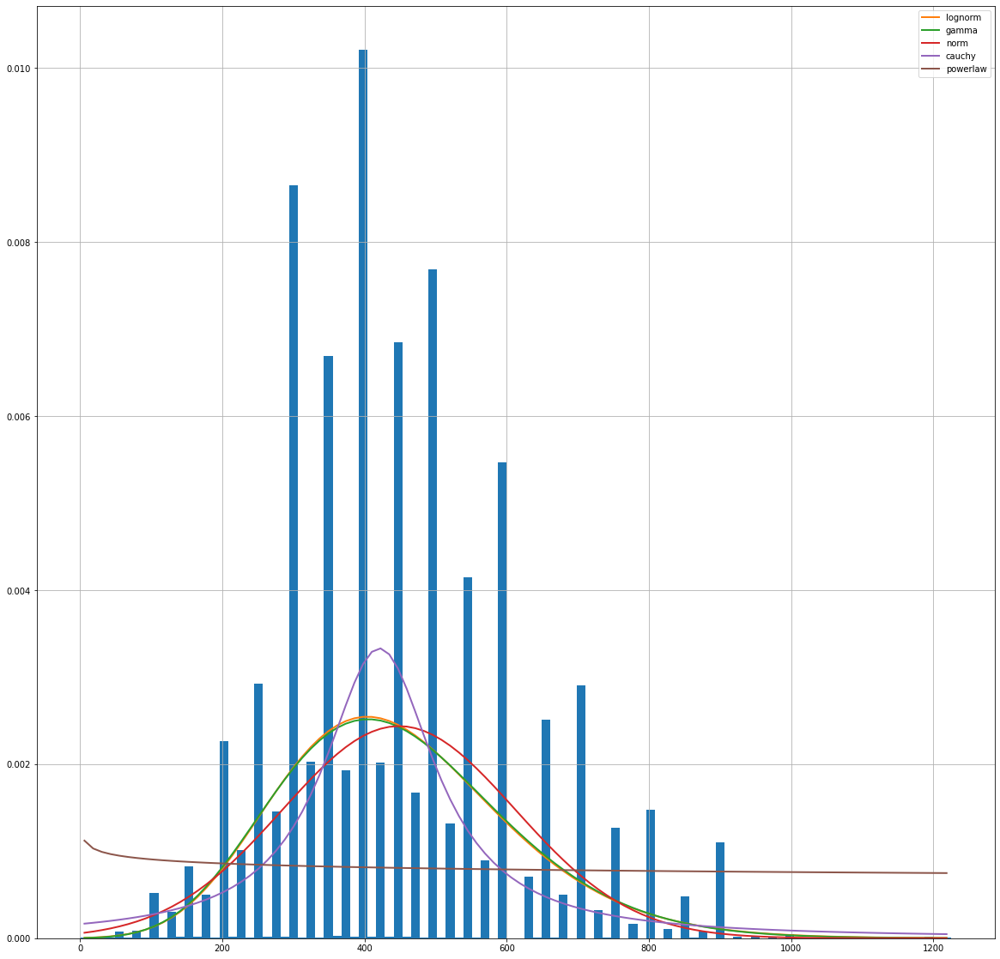

In [303]:
COGStats.fitCommonDist(group_a)

In [304]:
import scipy

In [305]:
#scipy.stats.ks_2samp(data1, data2, alternative='two-sided', method='auto')

In [306]:
#df

In [307]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Ethnicity', 'PatAgeAtSampleDate', 'SR_SAMPLE_ID',
       'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID', 'SR_TMS_NO',
       'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM', 'SR_CURRENT_DOSE',
       'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS', 'SR_DOSAGE_MORNING',
       'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON', 'SR_DOSAGE_EVENING',
       'FORMULATION', 'SR_FORMULATION_ID', 'SR_ARIVAL_DATETM',
       'SR_TMS_FROM_LIMS', 'SR_WEIGHT', 'SR_WEIGHT_DATA_ENTRY_CONVERSION',
       'SMOKER_QUAL', 'SR_SMOKER_QUANTITY', 'ETHANOL_QUAL',
       'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE', 'CAFFEINE_CHOCOLATE',
       'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P_AGE_AT

In [308]:
df['SR_DERIVED_SMOKER_STATUS'].value_counts()

Smoker        149410
Unknown       124151
Non Smoker     98049
Name: SR_DERIVED_SMOKER_STATUS, dtype: int64

If the KS statistic is large, then the p-value will be small, and this may be taken as evidence against the null hypothesis in favor of the alternative.

In [309]:
smokers = df[df['SR_DERIVED_SMOKER_STATUS'] == 'Smoker']

non_smokers = df[df['SR_DERIVED_SMOKER_STATUS'] == 'Non Smoker']

In [310]:
smoking_status_groups = [
    smokers,
    non_smokers
    
]

In [311]:
male = df[df['Sex_Male']==1]

female = df[df['Sex_Male']==0]

In [312]:
sex_groups = [
    male,
    female
    
]

# Clozapine

In [313]:
outcome_var = 'SR_CLOZAPINE'

In [314]:
f"smokers non smokers on {outcome_var}"  

'smokers non smokers on SR_CLOZAPINE'

In [315]:
data1 = smokers[outcome_var]
data2 = non_smokers[outcome_var]

In [316]:
scipy.stats.ks_2samp(data1, data2, alternative='two-sided')

KstestResult(statistic=0.21482628914565993, pvalue=0.0)

In [317]:
outcome_var = 'SR_CLOZAPINE'

In [318]:
f"male female on {outcome_var}"  

'male female on SR_CLOZAPINE'

In [319]:
data1 = male[outcome_var]
data2 = female[outcome_var]

In [320]:
scipy.stats.ks_2samp(data1, data2, alternative='two-sided')

KstestResult(statistic=0.0820706946453777, pvalue=0.0)

Indeed, the p-value is lower than our threshold of 0.05, so we reject the null hypothesis in favor of the default “two-sided” alternative: the data were not drawn from the same distribution.

# Dose

In [321]:
outcome_var = 'SR_CURRENT_DOSE'

In [322]:
f"smokers non smokers on {outcome_var}"  

'smokers non smokers on SR_CURRENT_DOSE'

In [323]:
data1 = smokers[outcome_var]
data2 = non_smokers[outcome_var]

In [324]:
scipy.stats.ks_2samp(data1, data2, alternative='two-sided')

KstestResult(statistic=0.2027762606214462, pvalue=0.0)

In [325]:
outcome_var = 'SR_CURRENT_DOSE'

In [326]:
f"male female on {outcome_var}"  

'male female on SR_CURRENT_DOSE'

In [327]:
data1 = male[outcome_var]
data2 = female[outcome_var]

In [328]:
scipy.stats.ks_2samp(data1, data2, alternative='two-sided')

KstestResult(statistic=0.10271340605966678, pvalue=0.0)

# part two


In [329]:
#potentially track individual samples over time, did their weight increase as a function of dose ? 

#can plot figure 6 using the raw dose values
#can extract equation for each of the lines. 

#also on norclozapine

#could assess partial adherence
#constant held values for patients and multiple samples. 
#only 11 

#can we model pat cloz over time controlling for dose at individual level. to assess for unreported non adherence. 




In [330]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Ethnicity', 'PatAgeAtSampleDate', 'SR_SAMPLE_ID',
       'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID', 'SR_TMS_NO',
       'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM', 'SR_CURRENT_DOSE',
       'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS', 'SR_DOSAGE_MORNING',
       'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON', 'SR_DOSAGE_EVENING',
       'FORMULATION', 'SR_FORMULATION_ID', 'SR_ARIVAL_DATETM',
       'SR_TMS_FROM_LIMS', 'SR_WEIGHT', 'SR_WEIGHT_DATA_ENTRY_CONVERSION',
       'SMOKER_QUAL', 'SR_SMOKER_QUANTITY', 'ETHANOL_QUAL',
       'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE', 'CAFFEINE_CHOCOLATE',
       'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P_AGE_AT

In [331]:
df['P_MASTER_ID'].value_counts()

100272    194
107380    173
125169    156
100538    133
136576    130
         ... 
113374      1
140381      1
117551      1
134527      1
134153      1
Name: P_MASTER_ID, Length: 48098, dtype: int64

In [332]:
df['SR_SAMPLE_DATETM']

0         2011-04-28 13:30:00.000
1         2015-02-03 00:00:00.000
2         2016-03-15 09:10:00.000
3         2014-04-02 10:30:00.000
4         2015-01-27 00:00:00.000
                   ...           
371605    2011-08-30 10:40:00.000
371606    2010-01-26 08:30:00.000
371607    2010-05-24 10:05:00.000
371608    2010-07-13 11:00:00.000
371609    2016-05-12 00:00:00.000
Name: SR_SAMPLE_DATETM, Length: 371610, dtype: object

In [333]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Ethnicity', 'PatAgeAtSampleDate', 'SR_SAMPLE_ID',
       'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID', 'SR_TMS_NO',
       'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM', 'SR_CURRENT_DOSE',
       'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS', 'SR_DOSAGE_MORNING',
       'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON', 'SR_DOSAGE_EVENING',
       'FORMULATION', 'SR_FORMULATION_ID', 'SR_ARIVAL_DATETM',
       'SR_TMS_FROM_LIMS', 'SR_WEIGHT', 'SR_WEIGHT_DATA_ENTRY_CONVERSION',
       'SMOKER_QUAL', 'SR_SMOKER_QUANTITY', 'ETHANOL_QUAL',
       'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE', 'CAFFEINE_CHOCOLATE',
       'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P_AGE_AT

In [334]:
#df[df['P_MASTER_ID'] == 100272].sort_values(by='SR_SAMPLE_DATETM')

<AxesSubplot:xlabel='SR_WEIGHT', ylabel='SR_SAMPLE_DATETM'>

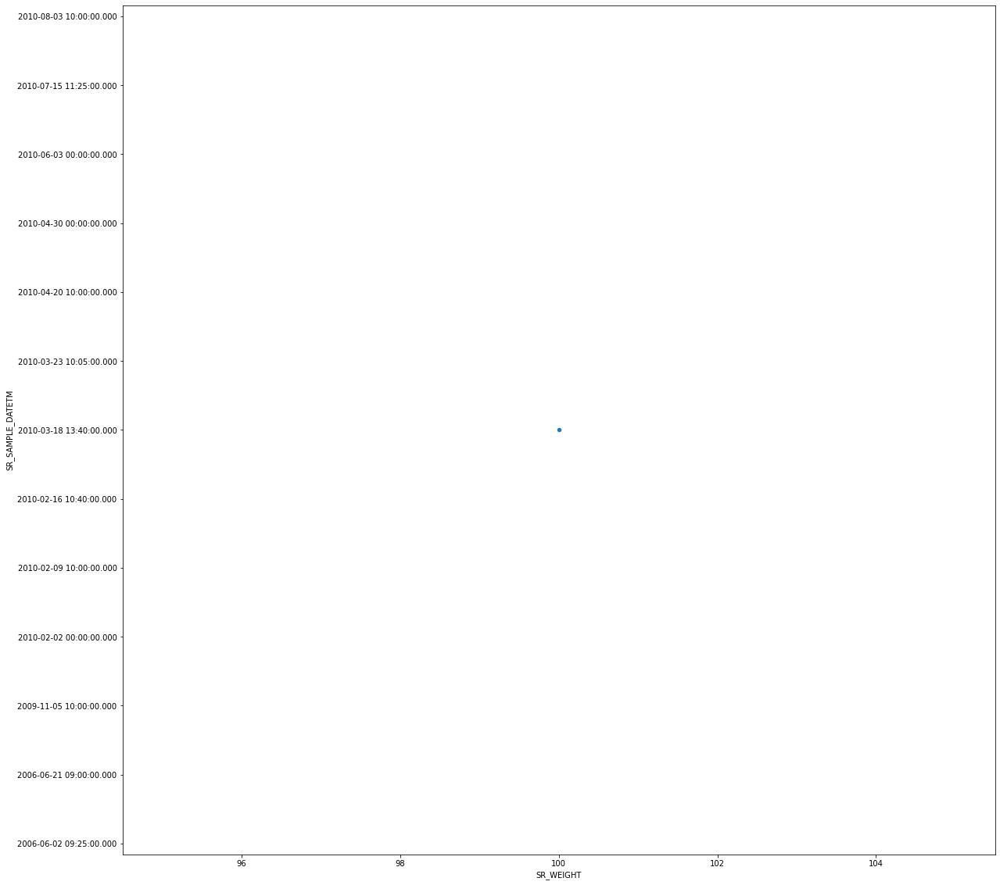

In [335]:
df[df['P_MASTER_ID'] == 100272].sort_values(by='SR_SAMPLE_DATETM')[['SR_WEIGHT', 'SR_SAMPLE_DATETM']].plot(kind='scatter', x='SR_WEIGHT', y='SR_SAMPLE_DATETM')

<AxesSubplot:xlabel='SR_CURRENT_DOSE', ylabel='SR_SAMPLE_DATETM'>

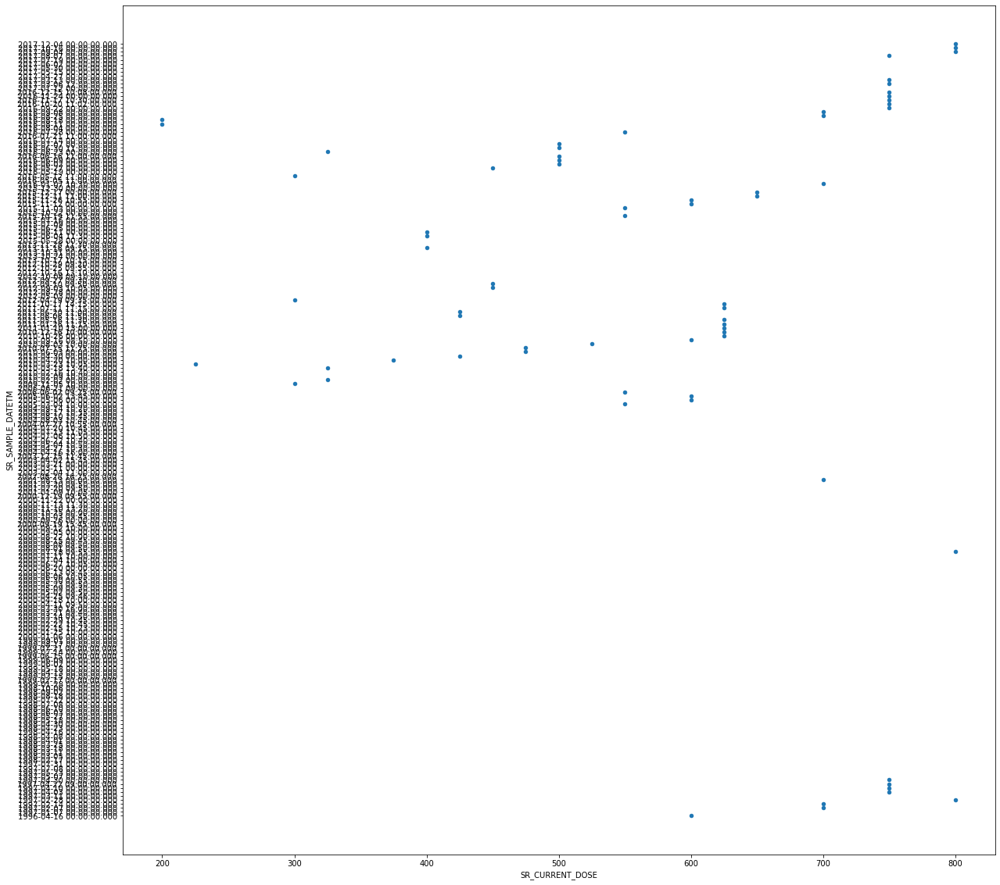

In [336]:
df[df['P_MASTER_ID'] == 100272].sort_values(by='SR_SAMPLE_DATETM')[['SR_CURRENT_DOSE', 'SR_SAMPLE_DATETM']].plot(kind='scatter', x='SR_CURRENT_DOSE', y='SR_SAMPLE_DATETM')

In [337]:
#df

In [338]:
#df[df['P_MASTER_ID'].value_counts()>20]

<AxesSubplot:ylabel='Frequency'>

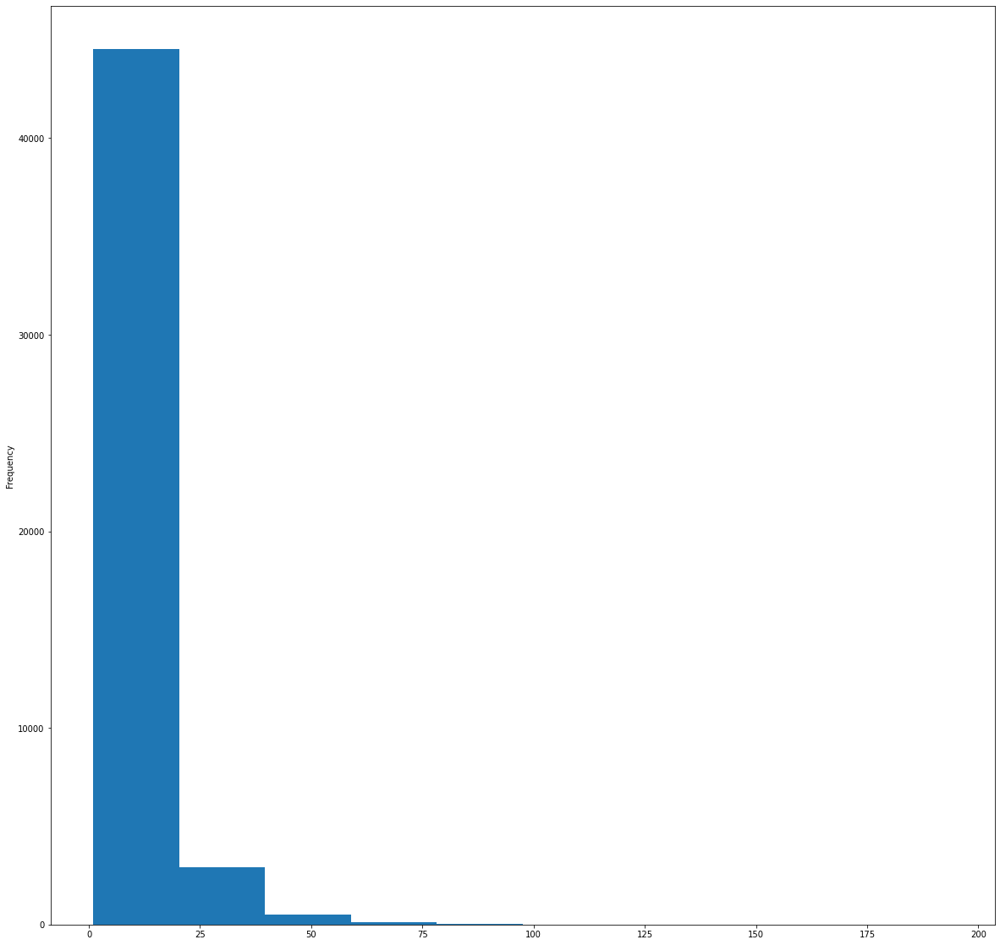

In [339]:
df['P_MASTER_ID'].value_counts().plot(kind='hist')

In [340]:
#df[df['client_idcode']]

In [341]:
#test of difference of one proportion on sample inclusion for fig 1 and fig 2

In [342]:
# male smoker and female smoker same distribution

# male non smoker and female non smoker

# ask the same question for fig 1 and two. 



In [343]:
male_smoker = male[male['SR_DERIVED_SMOKER_STATUS'] == 'Smoker']
male_nonsmoker = male[male['SR_DERIVED_SMOKER_STATUS'] == 'Non Smoker']
male_unknown = male[male['SR_DERIVED_SMOKER_STATUS'] == 'Unknown']

female_smoker = female[female['SR_DERIVED_SMOKER_STATUS'] == 'Smoker']
female_nonsmoker = female[female['SR_DERIVED_SMOKER_STATUS'] == 'Non Smoker']
female_unknown = female[female['SR_DERIVED_SMOKER_STATUS'] == 'Unknown']

In [344]:
#Do male and female smokers have the same distribution?
#and the same for non smokers

In [345]:
male.columns

Index(['P_MASTER_ID', 'DOB', 'Ethnicity', 'PatAgeAtSampleDate', 'SR_SAMPLE_ID',
       'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID', 'SR_TMS_NO',
       'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM', 'SR_CURRENT_DOSE',
       'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS', 'SR_DOSAGE_MORNING',
       'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON', 'SR_DOSAGE_EVENING',
       'FORMULATION', 'SR_FORMULATION_ID', 'SR_ARIVAL_DATETM',
       'SR_TMS_FROM_LIMS', 'SR_WEIGHT', 'SR_WEIGHT_DATA_ENTRY_CONVERSION',
       'SMOKER_QUAL', 'SR_SMOKER_QUANTITY', 'ETHANOL_QUAL',
       'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE', 'CAFFEINE_CHOCOLATE',
       'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P_AGE_AT

In [346]:

outcome_var = 'SR_CLOZAPINE'

In [347]:
scipy.stats.ks_2samp(male_smoker[outcome_var], male_nonsmoker[outcome_var], alternative='two-sided')

KstestResult(statistic=0.2174586607805537, pvalue=0.0)

In [348]:
scipy.stats.ks_2samp(female_smoker[outcome_var], female_nonsmoker[outcome_var], alternative='two-sided')

KstestResult(statistic=0.19349155107009425, pvalue=0.0)

In [349]:
outcome_var = 'SR_CURRENT_DOSE'

In [350]:
scipy.stats.ks_2samp(male_smoker[outcome_var], male_nonsmoker[outcome_var], alternative='two-sided')

KstestResult(statistic=0.191093490647195, pvalue=0.0)

In [351]:
scipy.stats.ks_2samp(female_smoker[outcome_var], female_nonsmoker[outcome_var], alternative='two-sided')

KstestResult(statistic=0.20341971632240008, pvalue=0.0)

In [352]:
## adherence over time?


In [353]:
# write in text explanation to email of these results. 


# 
The mean (SD) median plasma clozapine:norclozapine ratio by dose band all patients) in the male and female smokers (1.48 ± 0.05 and 1.51 ± 0.08, respectively) were significantly different to the corresponding values for the non-smokers (1.58 ± 0.16 and 1.69 ± 0.14, respectively). The median body weight by dose band (all patients) was not significantly different in either the male or the female smokers and non-smokers (88.1 ± 3.1 and 88.7 ± 2.7 kg, respectively, and 80.7 ± 3.2 and 78.5 ± 4.5 kg, respectively) (Supplementary Table 2).  

In [354]:
# statistical comparison for ^


In [355]:
outcome_var = 'SR_CLOZ_NCLOZ_RATIO'

In [356]:
male_smoker[outcome_var]

2         1.60
3         1.33
5         1.55
6         1.33
7         1.70
          ... 
371603    1.63
371605    1.28
371606    1.75
371608    1.50
371609    1.67
Name: SR_CLOZ_NCLOZ_RATIO, Length: 112472, dtype: float64

In [357]:
stats.kruskal(male_smoker[outcome_var], female_smoker[outcome_var])

KruskalResult(statistic=nan, pvalue=nan)

# caffeine

# table 1 caffine:
stats done already..?

#ignore non recorded

**PRESENTATION

also for chocolate table

#was proportion done?


Another set of kruskal wallis on subset of > 1.5ml cloz:


    
   * of interest is male non smokers significantly different
   
Valproate:

# mixed model enter confounds, partial repeated sample, 
## 
#enter valporate dose as variable in mixed model



In [358]:
df['SR_DERIVED_SMOKER_STATUS'].value_counts()

Smoker        149410
Unknown       124151
Non Smoker     98049
Name: SR_DERIVED_SMOKER_STATUS, dtype: int64

In [359]:
sex_bool_dict = {'female': 0,
                 'male': 1
    
}

group_list_dict = {'coffee group': coffee_group_list,
                   'chocolate group': chocolate_group_list}

smoking_list_dict = {'smoking': {'SR_DERIVED_SMOKER_STATUS_Smoker':1},
                     'non smoking': {'SR_DERIVED_SMOKER_STATUS_Non_Smoker':0}}

outcome_var_list = ['PatAgeAtSampleDate',
                    'SR_CURRENT_DOSE',
                    'SR_CLOZAPINE',
                    'SR_NORCLOZAPINE',
                    #'SR_DERIVED_SMOKER_STATUS'
                   ]

In [360]:
sex_bool_keys = list(sex_bool_dict.keys())
group_list_keys = list(group_list_dict.keys())
smoking_list_keys = list(smoking_list_dict.keys())


In [361]:
smoking_list_keys

['smoking', 'non smoking']

In [362]:
smoking_list_dict.get(smoking_list_keys[0]), smoking_list_dict.get(smoking_list_keys[1])

({'SR_DERIVED_SMOKER_STATUS_Smoker': 1},
 {'SR_DERIVED_SMOKER_STATUS_Non_Smoker': 0})

In [363]:
sex_bool_keys

['female', 'male']

In [364]:
smoking = 1

In [365]:

outcome_var  = outcome_var_list[0]
sex_bool     = sex_bool_dict.get(sex_bool_keys[0])
group_list   = group_list_dict.get(group_list_keys[0])
smoking_bool = smoking_list_dict.get(smoking_list_keys[0]).get(list(smoking_list_dict.get(smoking_list_keys[0]).keys())[0])
smoking_col  = list(smoking_list_dict.get(smoking_list_keys[0]).keys())[0]
 
print(outcome_var," " ,sex_bool_keys[0], " ",group_list_keys[0], " ",smoking_list_keys[0])
print(outcome_var, sex_bool, smoking_bool, smoking_col)
    
g1 = group_list[0][(group_list[0]['Sex_Male']==sex_bool)  & (group_list[0][smoking_col]==smoking)][outcome_var]    
g2 = group_list[1][(group_list[1]['Sex_Male']==sex_bool)  & (group_list[1][smoking_col]==smoking)][outcome_var]  
g3 = group_list[2][(group_list[2]['Sex_Male']==sex_bool)  & (group_list[2][smoking_col]==smoking)][outcome_var]
    
stat, p = stats.kruskal(g1,
                        g2,
                        g3
             )

print(stat, p)

PatAgeAtSampleDate   female   coffee group   smoking
PatAgeAtSampleDate 0 1 SR_DERIVED_SMOKER_STATUS_Smoker
0.48320343864489584 0.7853689125321572


In [366]:
sex_bool_keys, group_list_keys, smoking_list_keys, outcome_var_list

(['female', 'male'],
 ['coffee group', 'chocolate group'],
 ['smoking', 'non smoking'],
 ['PatAgeAtSampleDate', 'SR_CURRENT_DOSE', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE'])

In [367]:

outcome_var  = outcome_var_list[1]
sex_bool     = sex_bool_dict.get(sex_bool_keys[1])
group_list   = group_list_dict.get(group_list_keys[0])
smoking_bool = smoking_list_dict.get(smoking_list_keys[1]).get(list(smoking_list_dict.get(smoking_list_keys[1]).keys())[0])
smoking_col  = list(smoking_list_dict.get(smoking_list_keys[1]).keys())[0]
 
print(outcome_var," " ,sex_bool_keys[1], " ",group_list_keys[0], " ",smoking_list_keys[1])
print(outcome_var, sex_bool, smoking_bool, smoking_col)
    
g1 = group_list[0][(group_list[0]['Sex_Male']==sex_bool)  & (group_list[0][smoking_col]==smoking)][outcome_var].dropna()    
g2 = group_list[1][(group_list[1]['Sex_Male']==sex_bool)  & (group_list[1][smoking_col]==smoking)][outcome_var].dropna()  
g3 = group_list[2][(group_list[2]['Sex_Male']==sex_bool)  & (group_list[2][smoking_col]==smoking)][outcome_var].dropna()
    
stat, p = stats.kruskal(g1,
                        g2,
                        g3
             )

print(stat, p)

SR_CURRENT_DOSE   male   coffee group   non smoking
SR_CURRENT_DOSE 1 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker
11.695735232239928 0.0028860467608241066


In [368]:
g1.isna().value_counts()

False    1830
Name: SR_CURRENT_DOSE, dtype: int64

In [369]:
import scipy.stats as ss

In [370]:
results_df = pd.DataFrame(columns=['Outcome', 'Sex', 'Group', 'Smoking', 'Test', 'H', 'p', 'Significance', 'Sample Size'])


In [371]:
import os
# Define a directory to save the figures
figure_dir = 'figures'  # Change this directory path to your preferred location

# Create the figure directory if it doesn't exist
if not os.path.exists(figure_dir):
    os.makedirs(figure_dir)

PatAgeAtSampleDate   female   coffee group   smoking
PatAgeAtSampleDate 0 1 SR_DERIVED_SMOKER_STATUS_Smoker


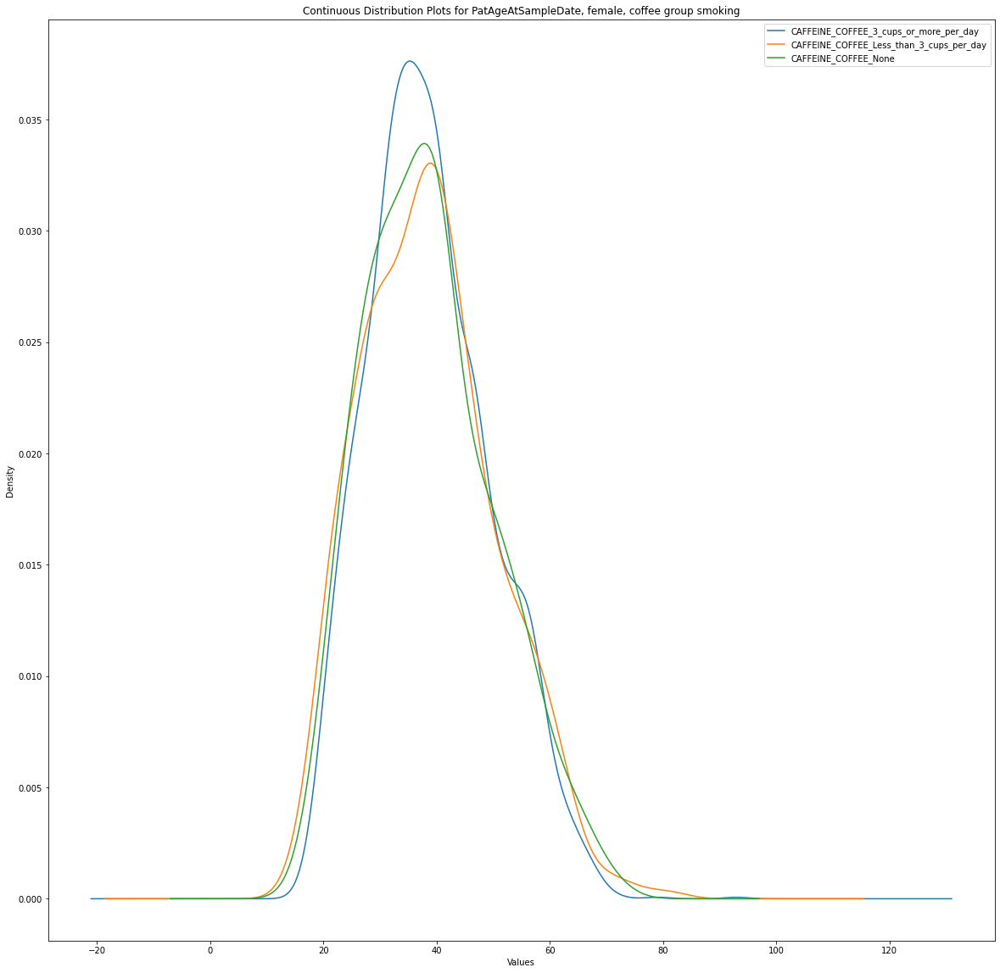

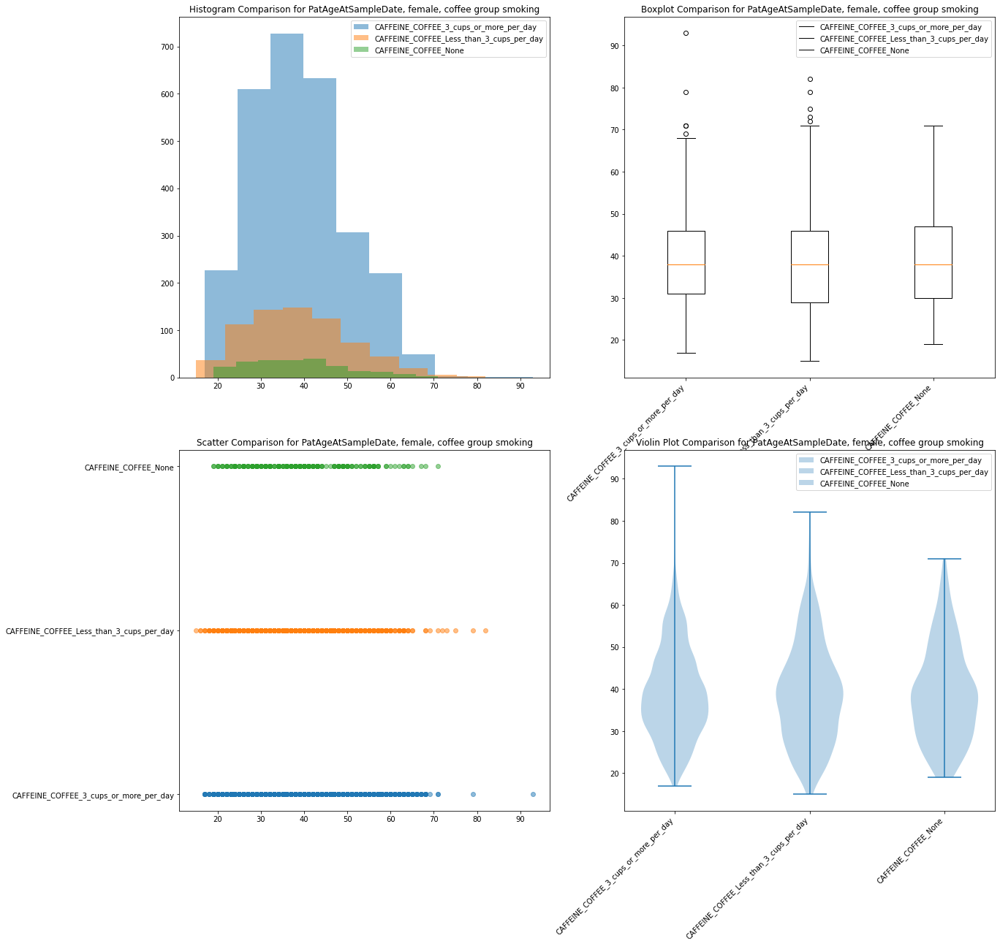

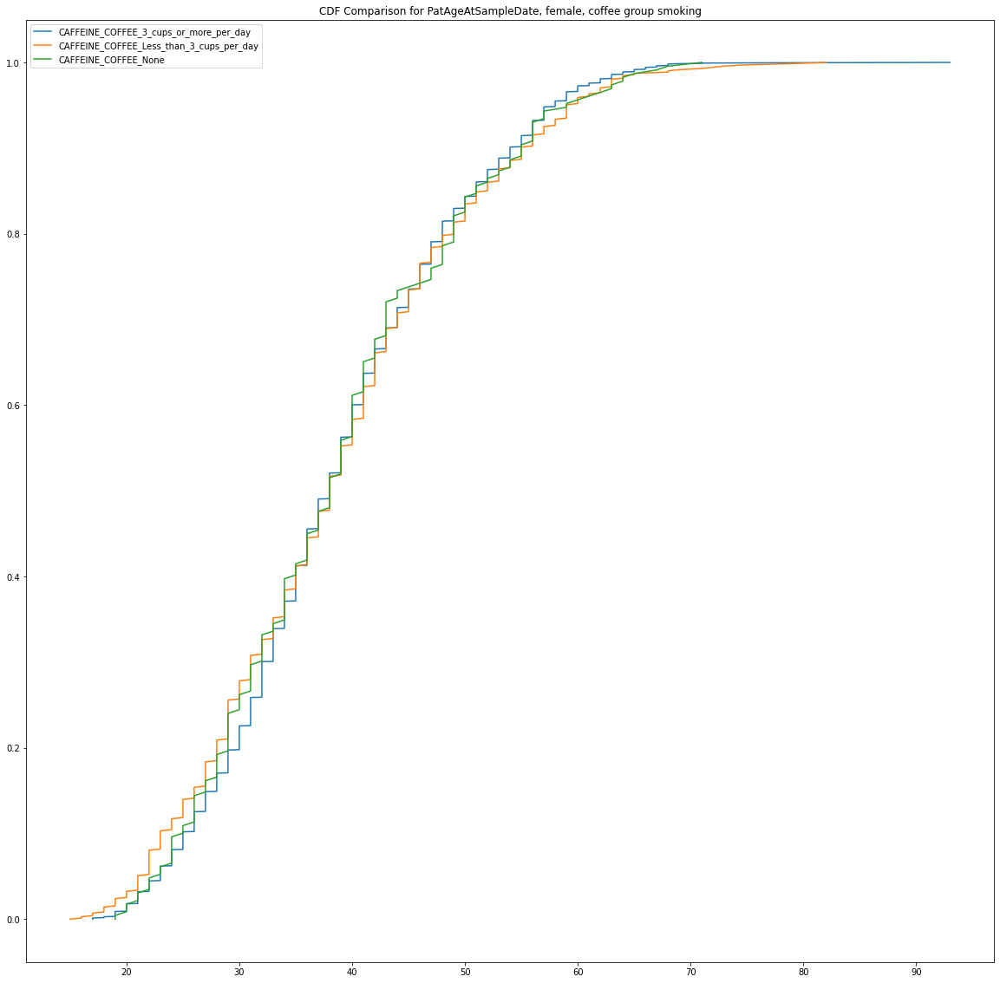

H=0.48320343864489584, p=0.7853689125321572


A Kruskal-Wallis test on PatAgeAtSampleDate between smoking females in the coffee group was not statistically signficant, H (2, N = 3715)=0.48 ,p>.05
2776 709 230
n=3715


SR_CLOZAPINE   female   coffee group   non smoking
SR_CLOZAPINE 0 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


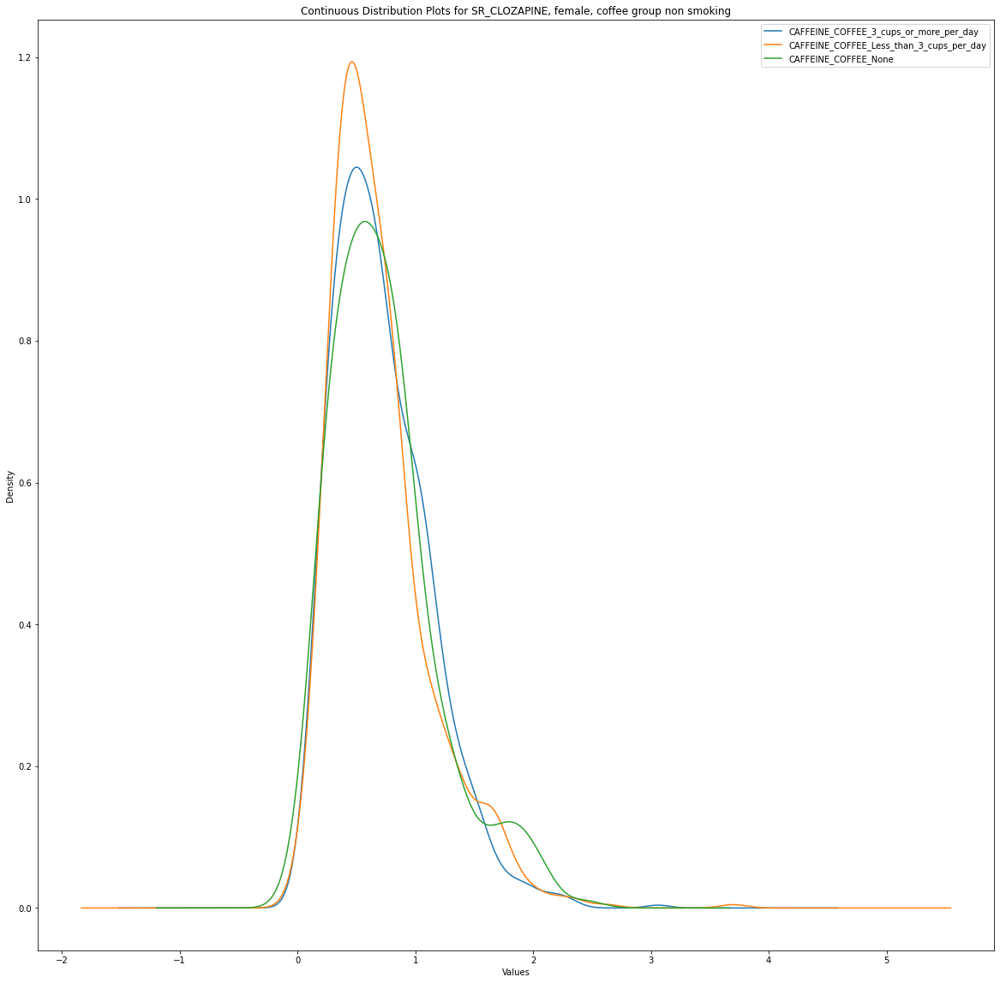

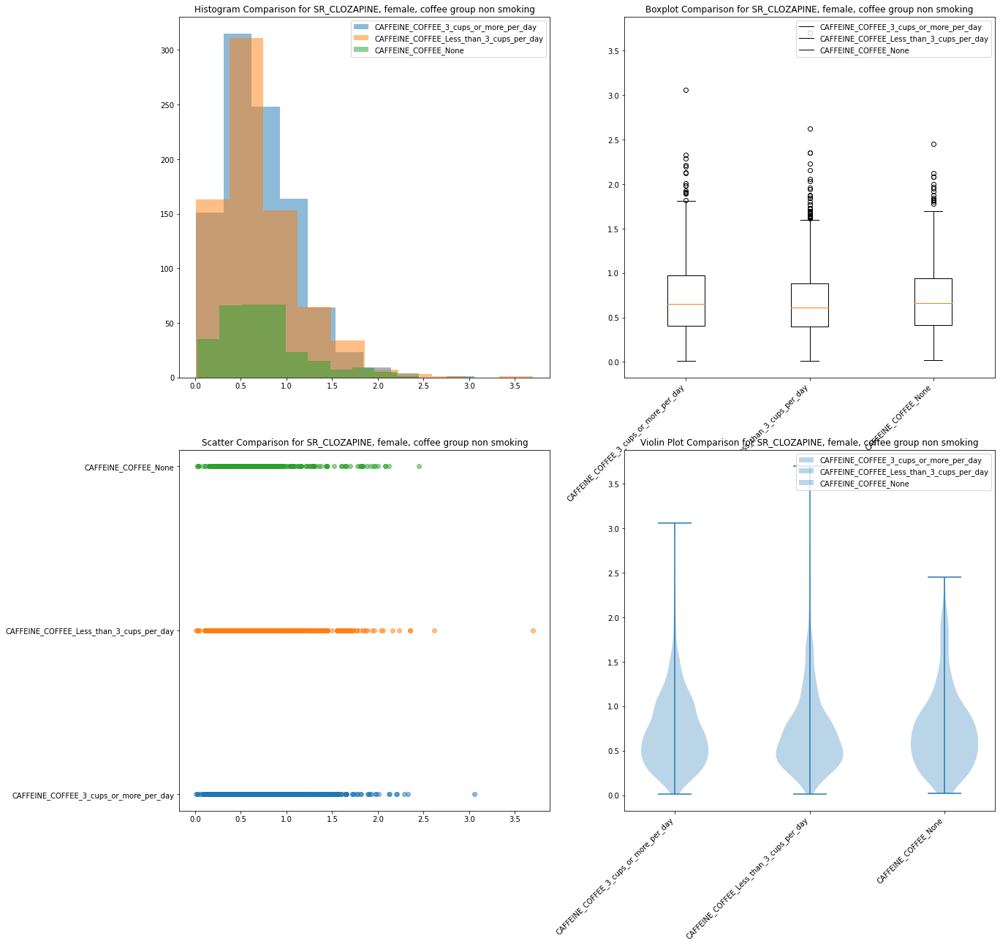

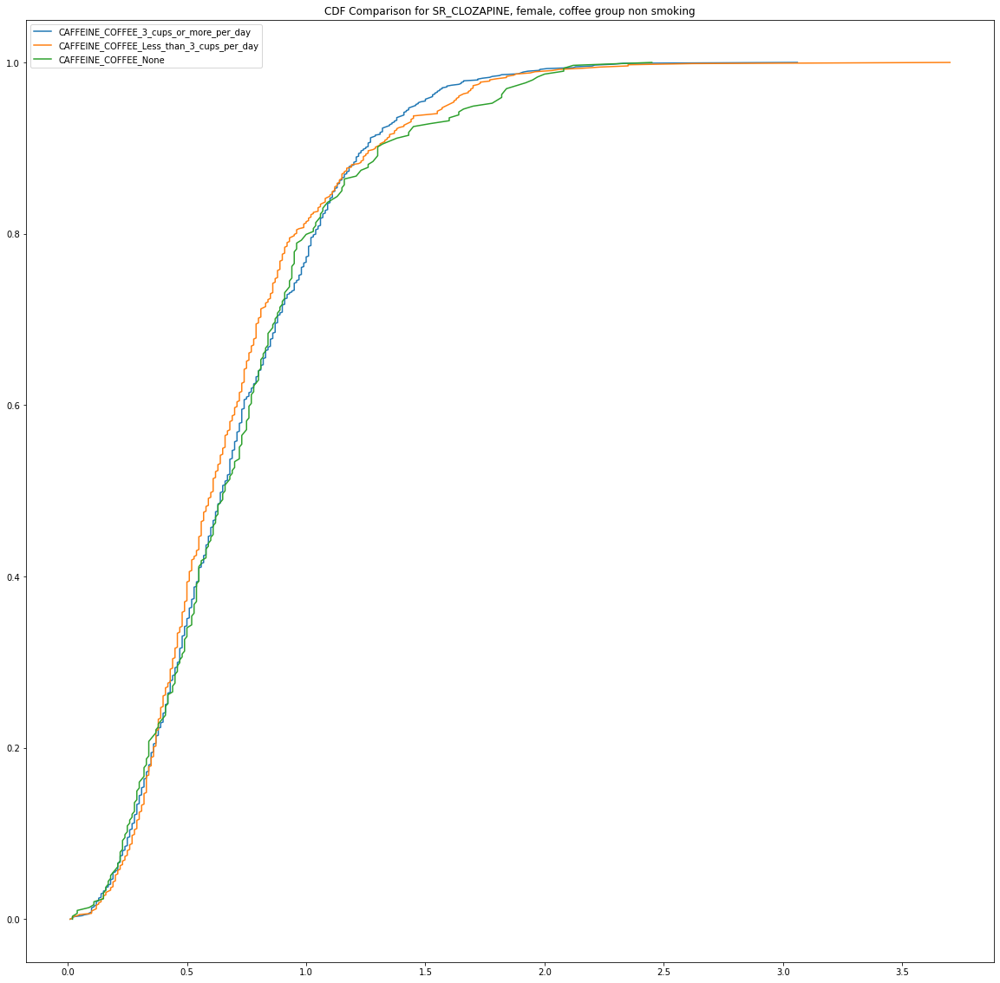

H=2.73629129607349, p=0.25457860045108704


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking females in the coffee group was not statistically signficant, H (2, N = 2012)=2.74 ,p>.05
979 738 295
n=2012


SR_CLOZAPINE   female   chocolate group   smoking
SR_CLOZAPINE 0 1 SR_DERIVED_SMOKER_STATUS_Smoker


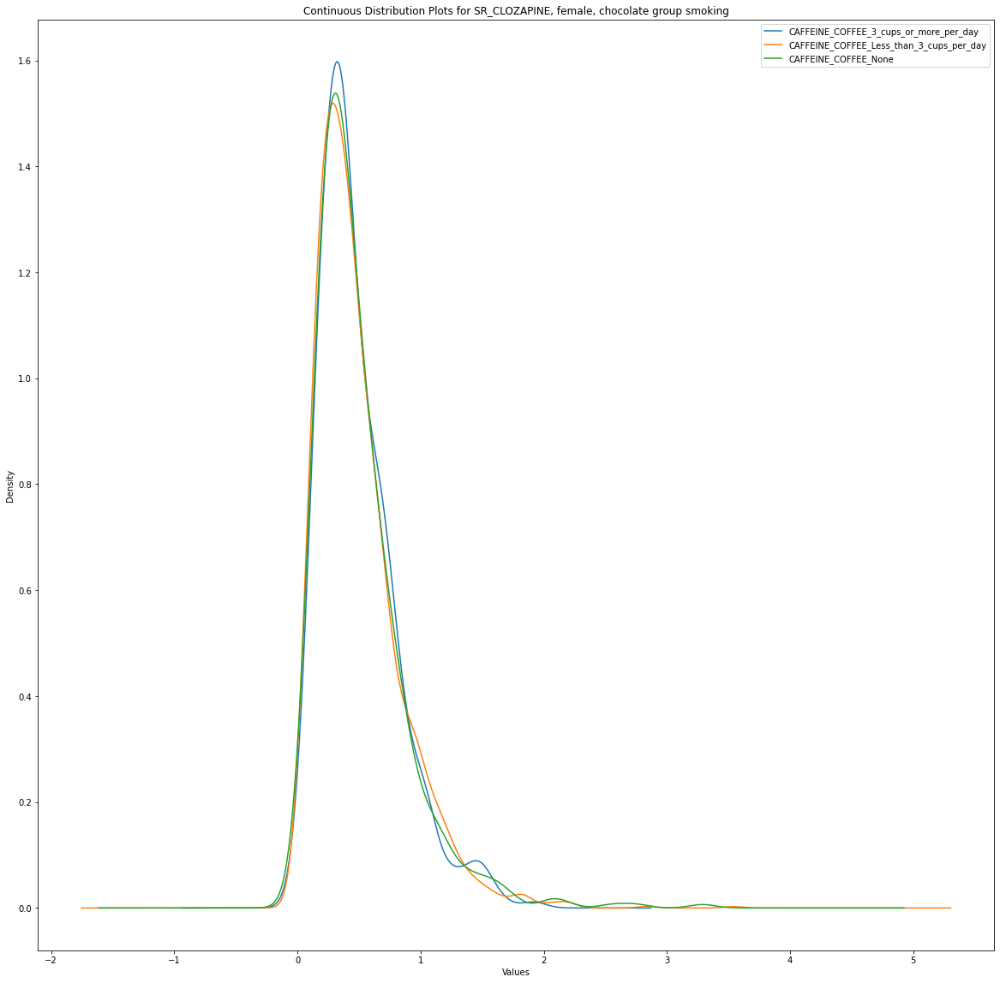

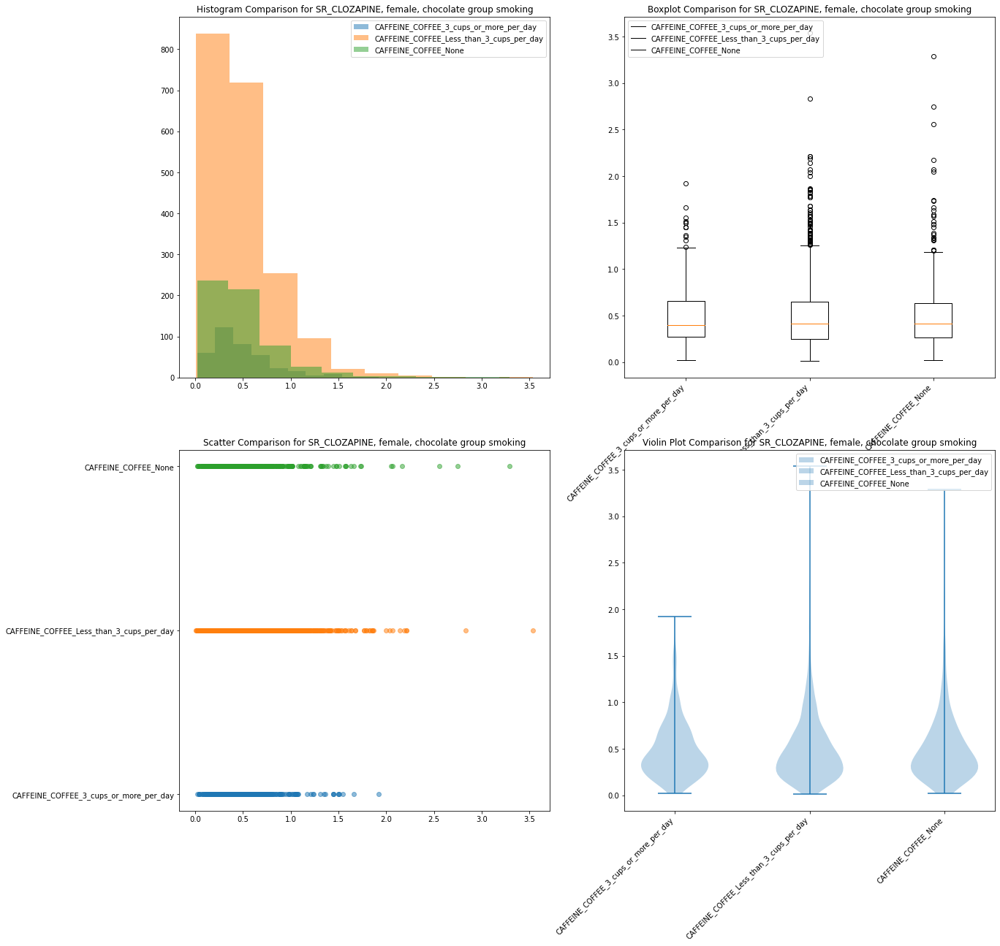

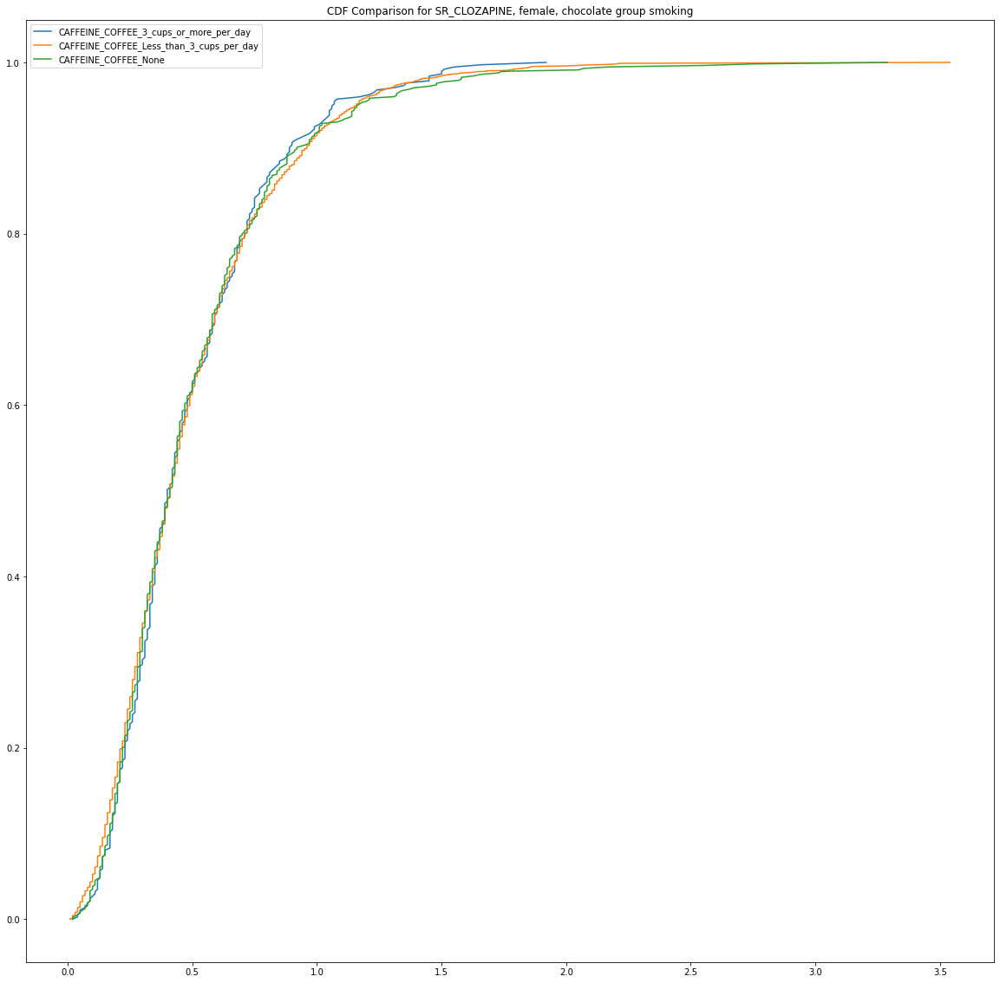

H=0.25214699475474456, p=0.8815500527854487


A Kruskal-Wallis test on SR_CLOZAPINE between smoking females in the chocolate group was not statistically signficant, H (2, N = 2893)=0.25 ,p>.05
374 1943 576
n=2893


SR_CLOZAPINE   female   chocolate group   non smoking
SR_CLOZAPINE 0 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


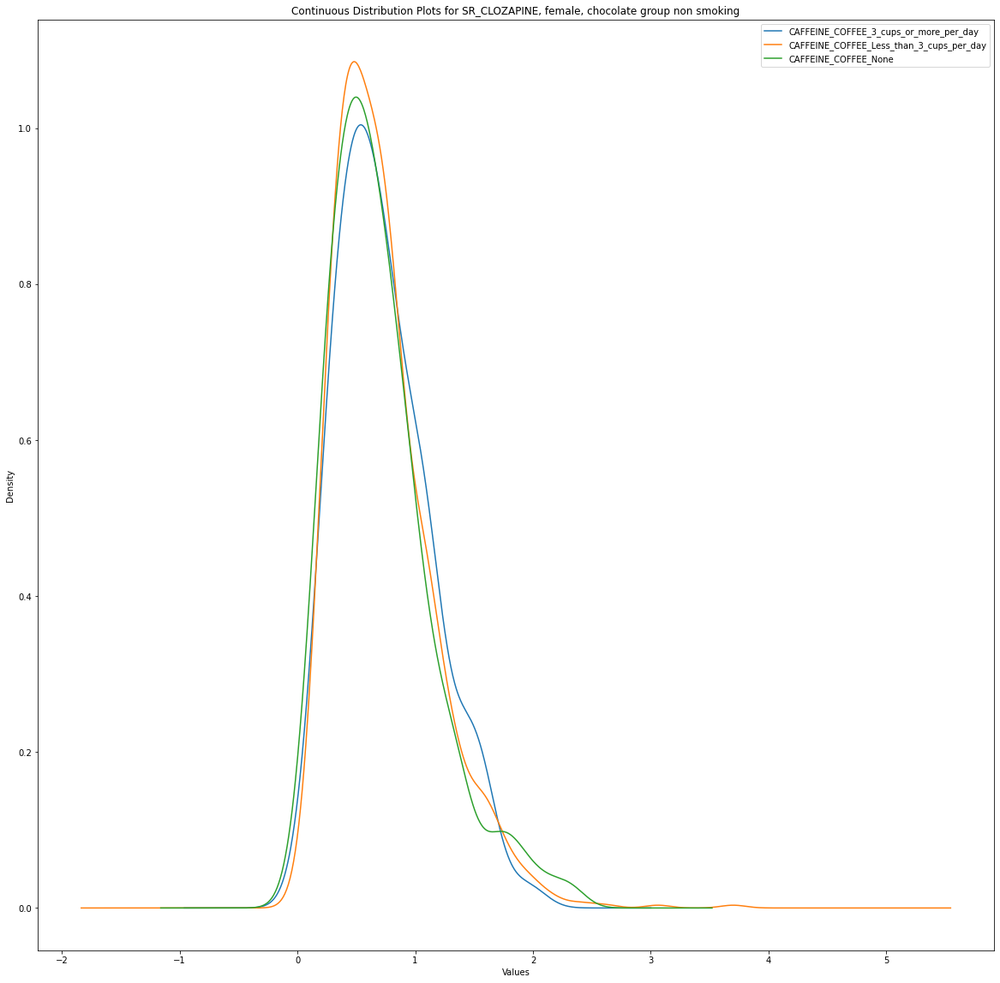

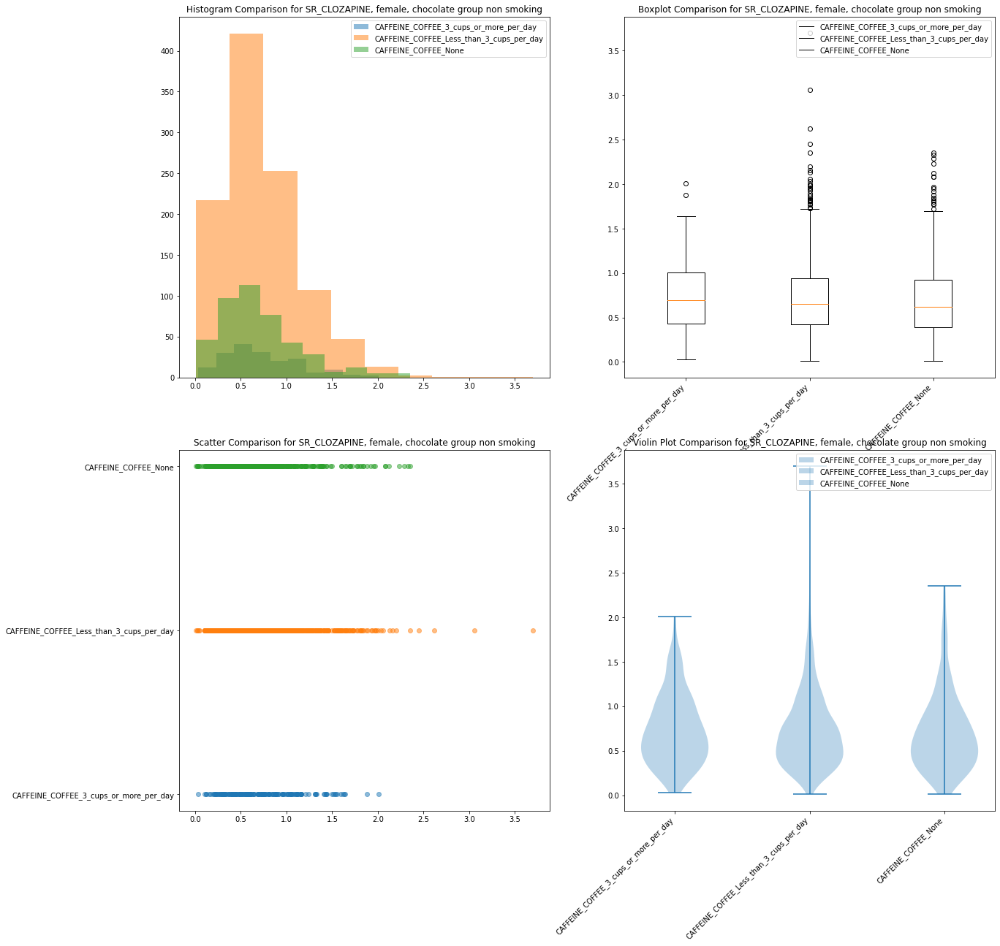

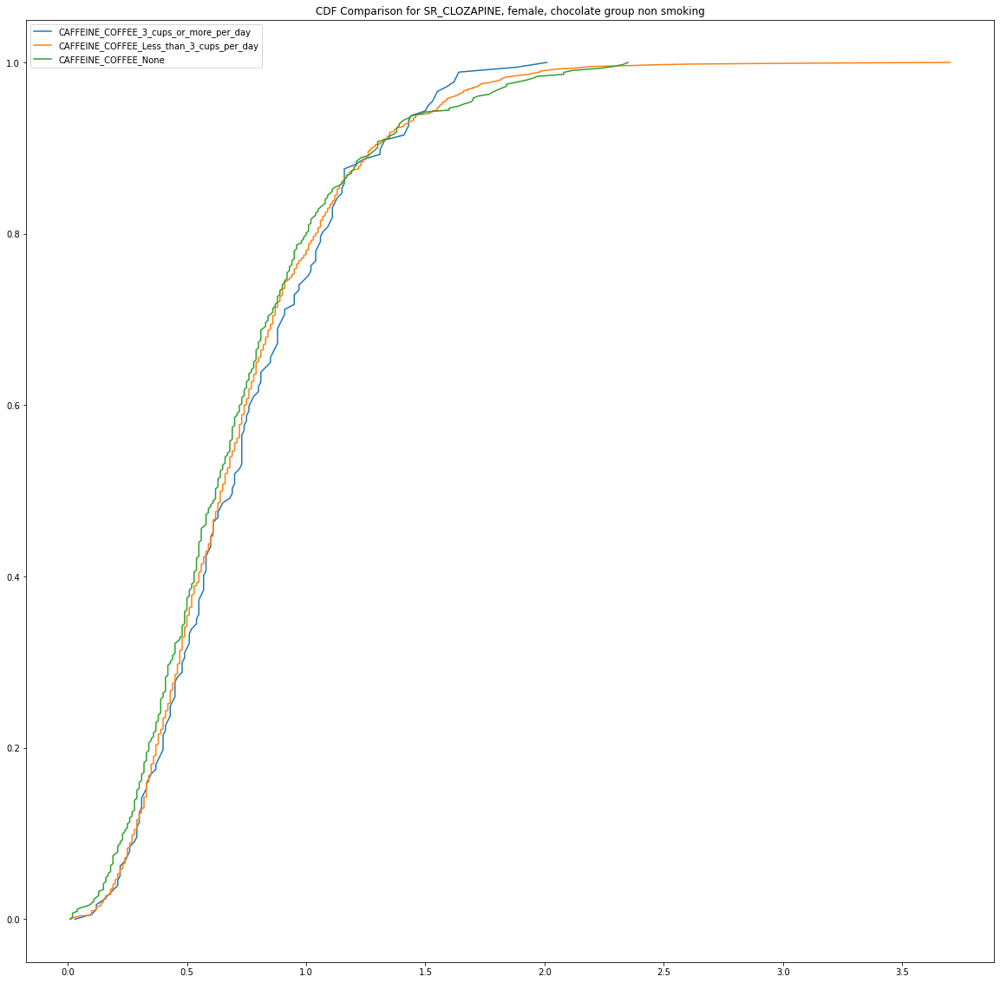

H=2.5234896055518092, p=0.2831595376851145


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking females in the chocolate group was not statistically signficant, H (2, N = 1674)=2.52 ,p>.05
178 1063 433
n=1674


SR_CLOZAPINE   male   coffee group   smoking
SR_CLOZAPINE 1 1 SR_DERIVED_SMOKER_STATUS_Smoker


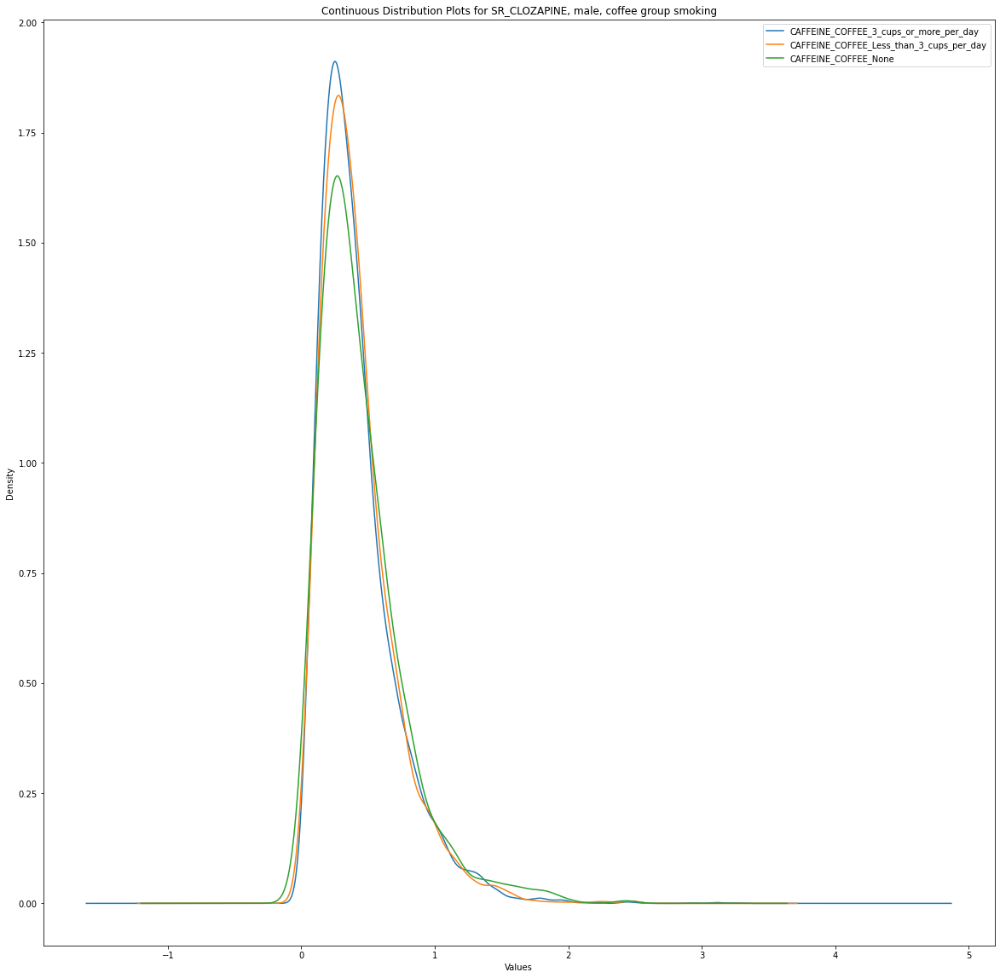

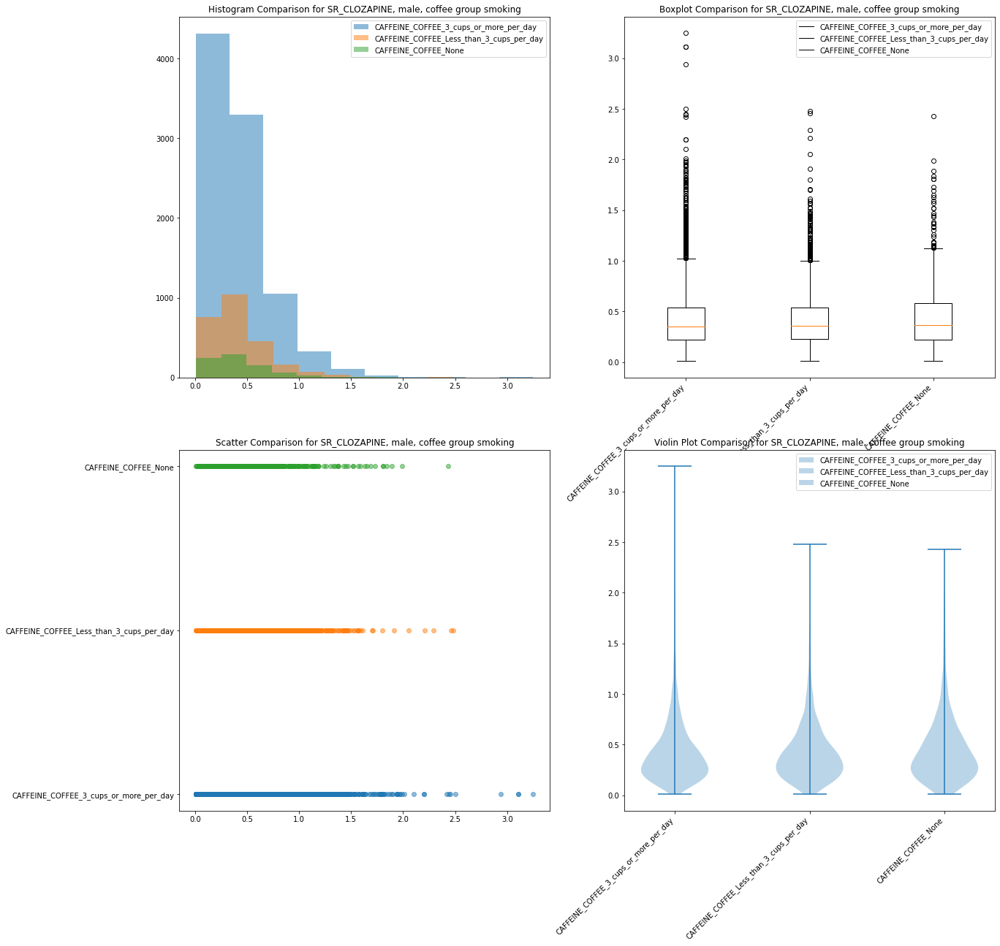

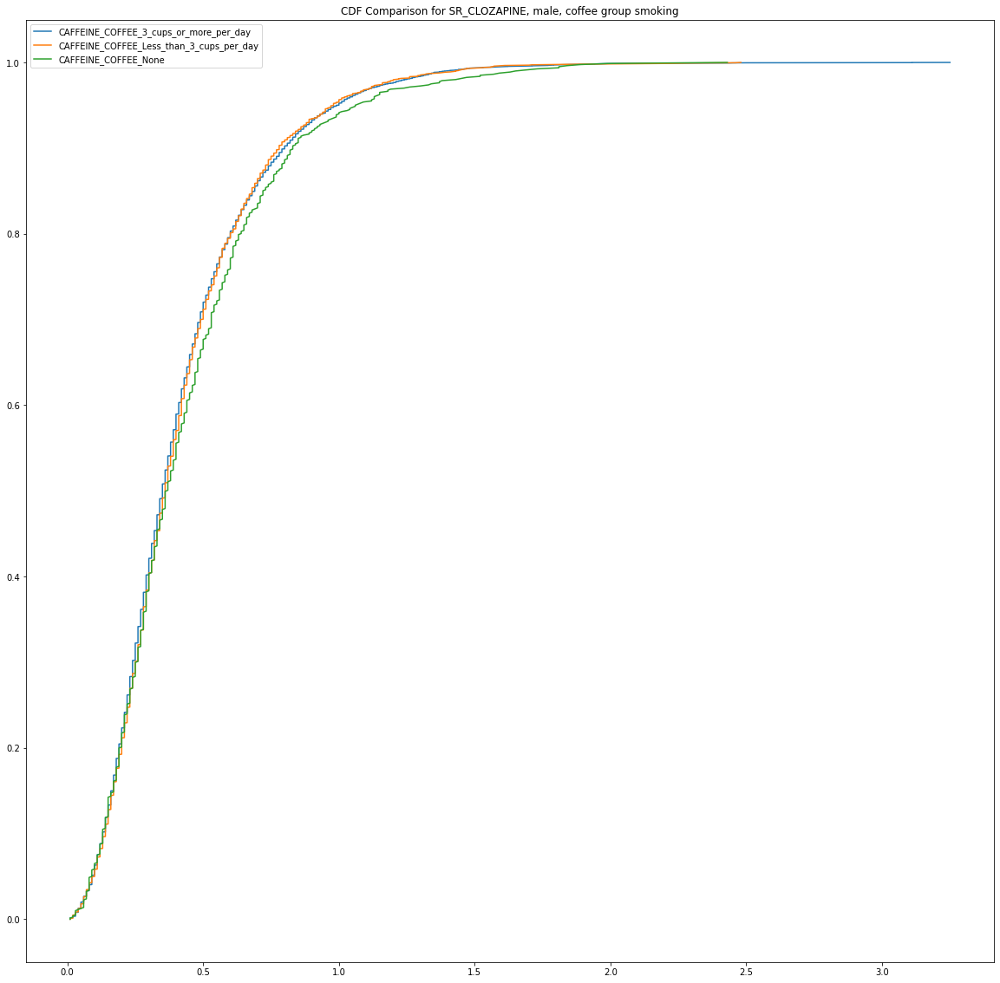

H=4.495474910872997, p=0.10563796498297016


A Kruskal-Wallis test on SR_CLOZAPINE between smoking males in the coffee group was not statistically signficant, H (2, N = 12463)=4.5 ,p>.05
9131 2530 802
n=12463


SR_CLOZAPINE   male   coffee group   non smoking
SR_CLOZAPINE 1 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


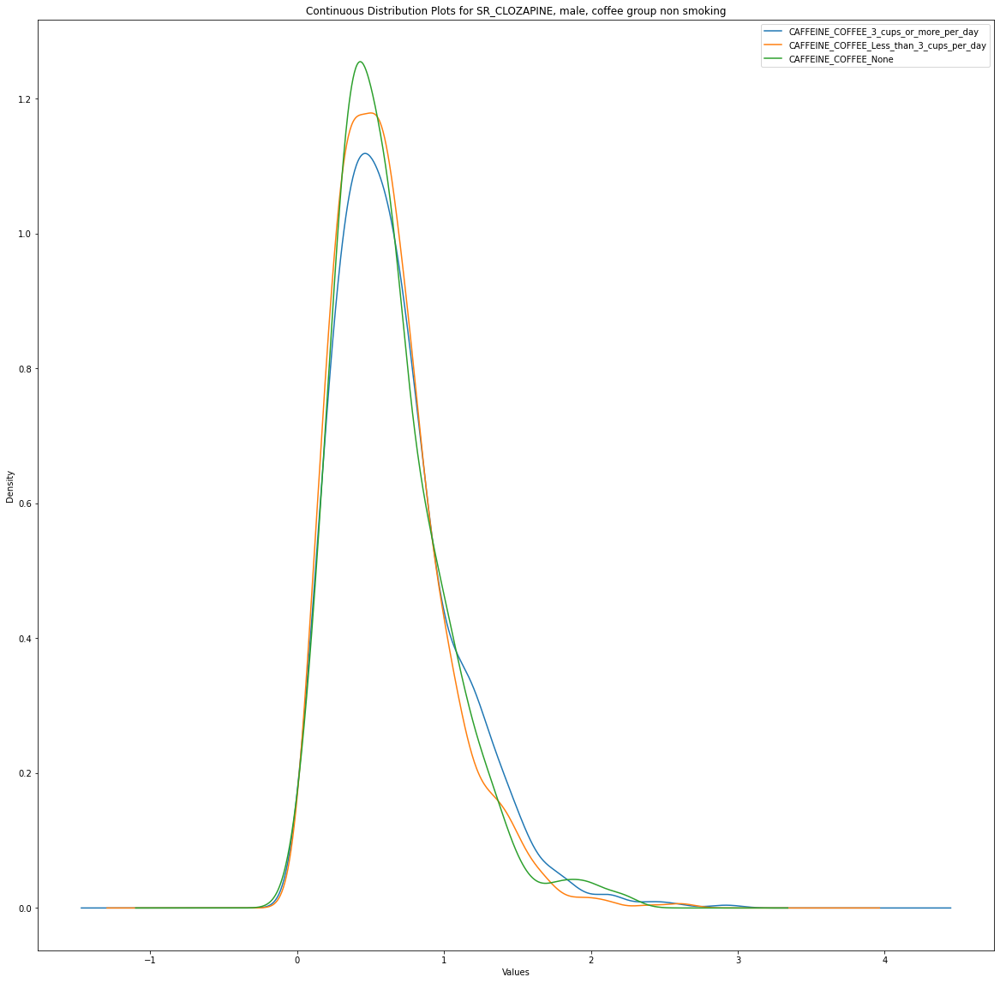

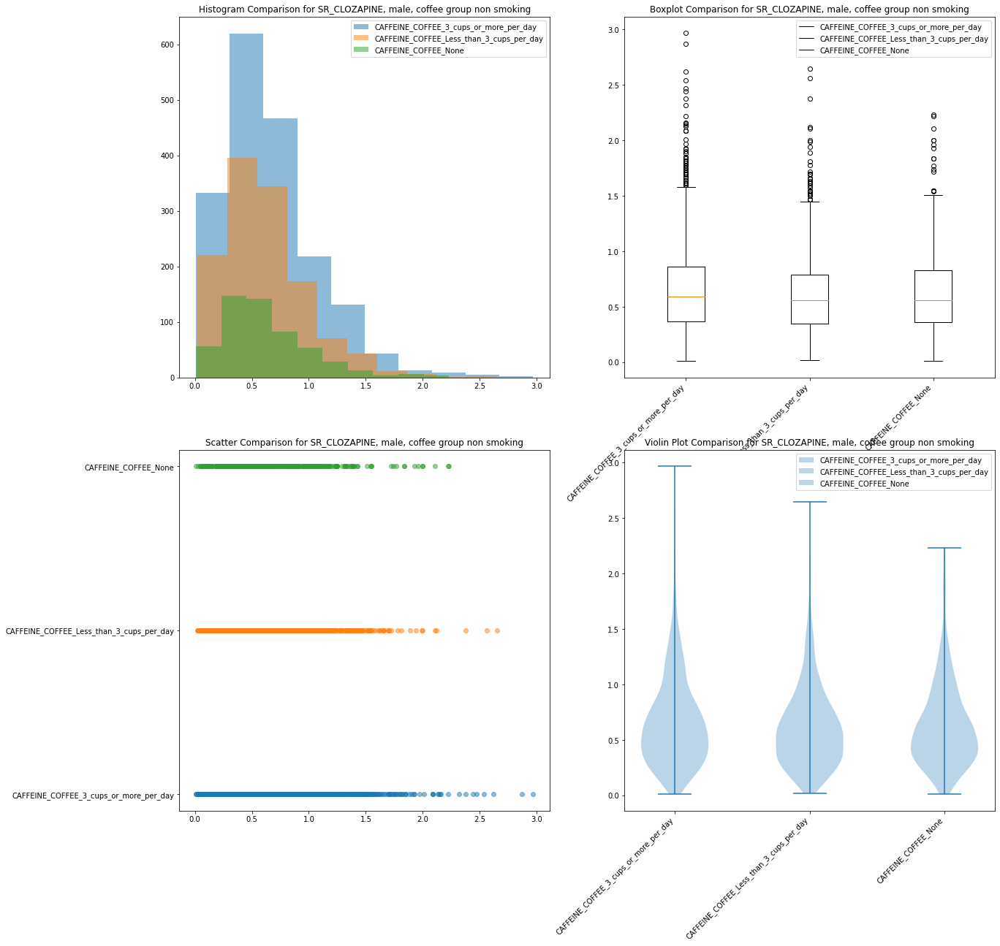

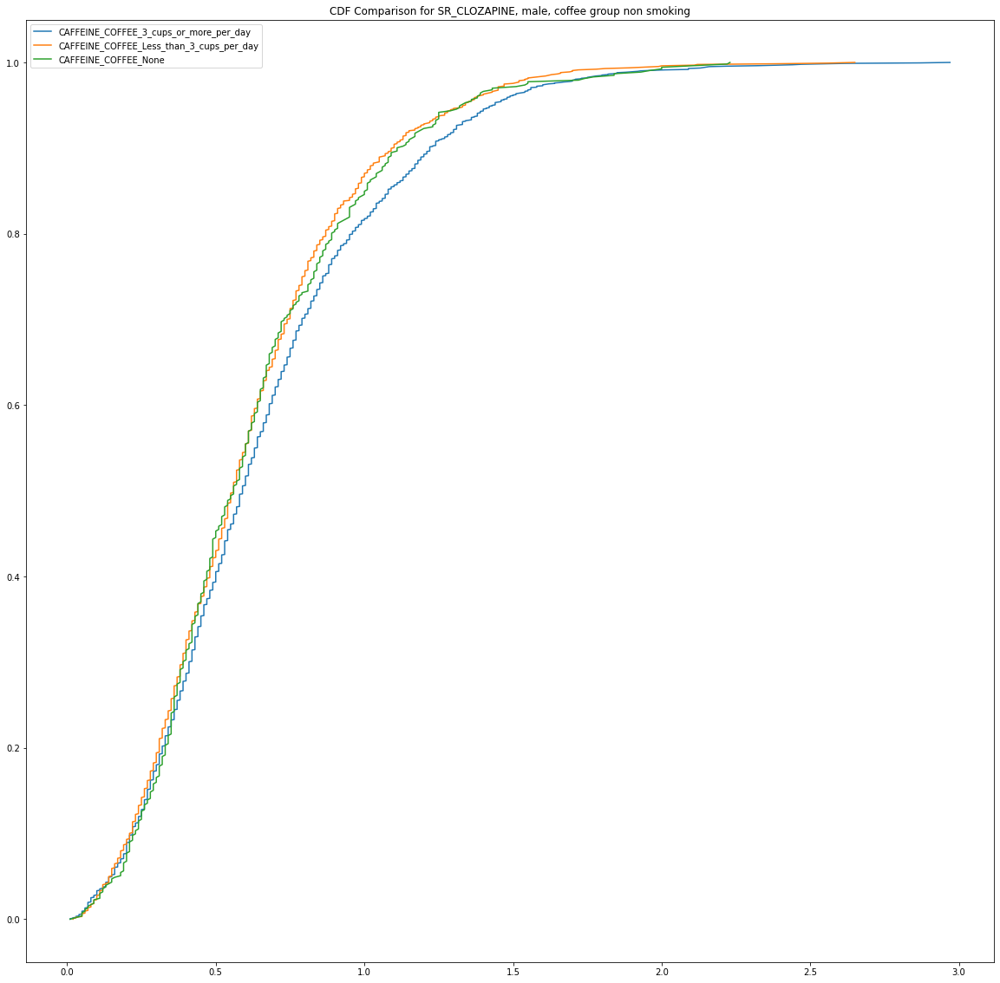

H=9.01695365515992, p=0.011015225492001823


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking males in the coffee group was statistically signficant at H (2, N = 3639)=9.02 ,p<.05
1838 1268 533
n=3639


SR_CLOZAPINE   male   chocolate group   smoking
SR_CLOZAPINE 1 1 SR_DERIVED_SMOKER_STATUS_Smoker


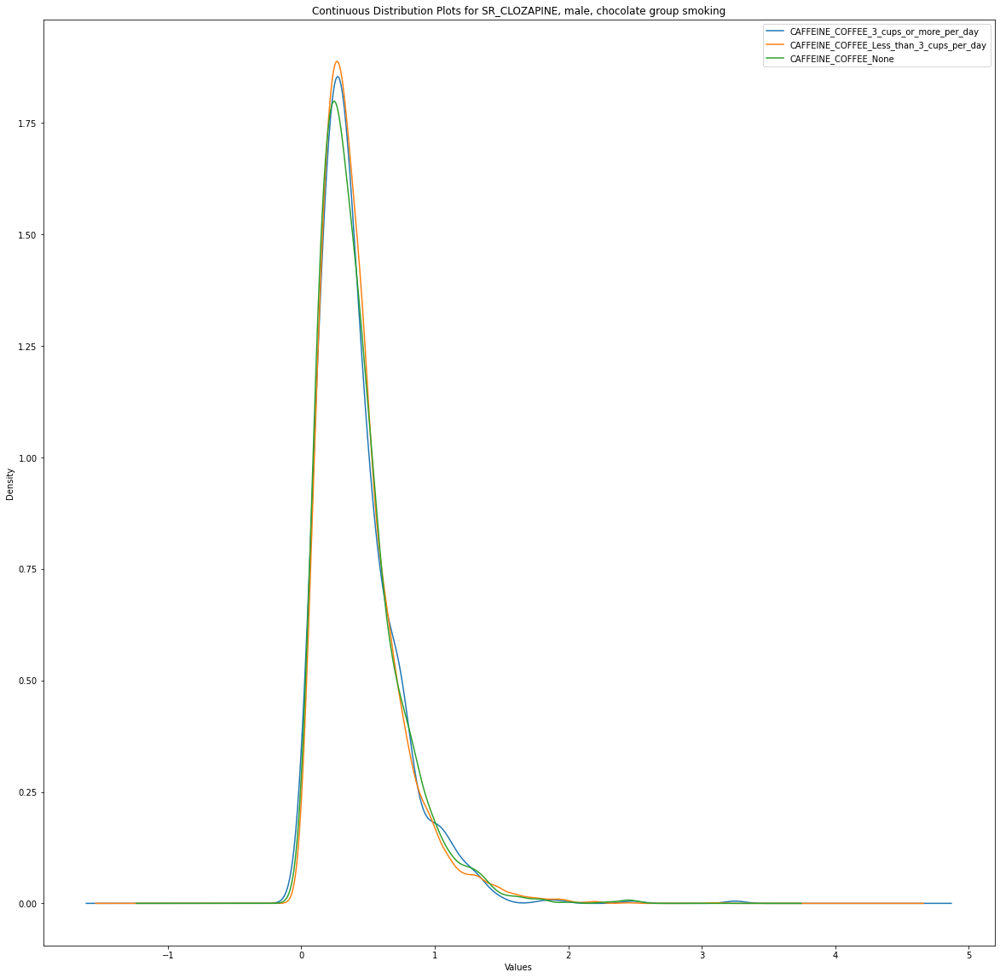

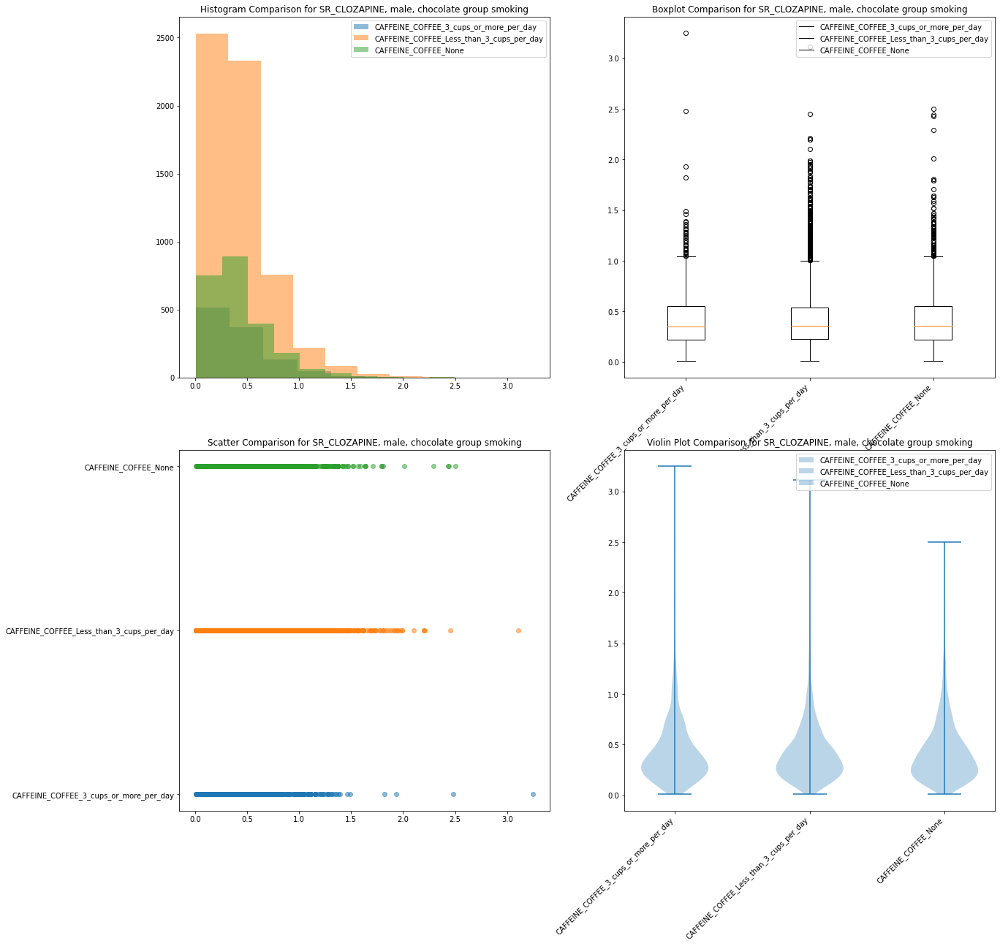

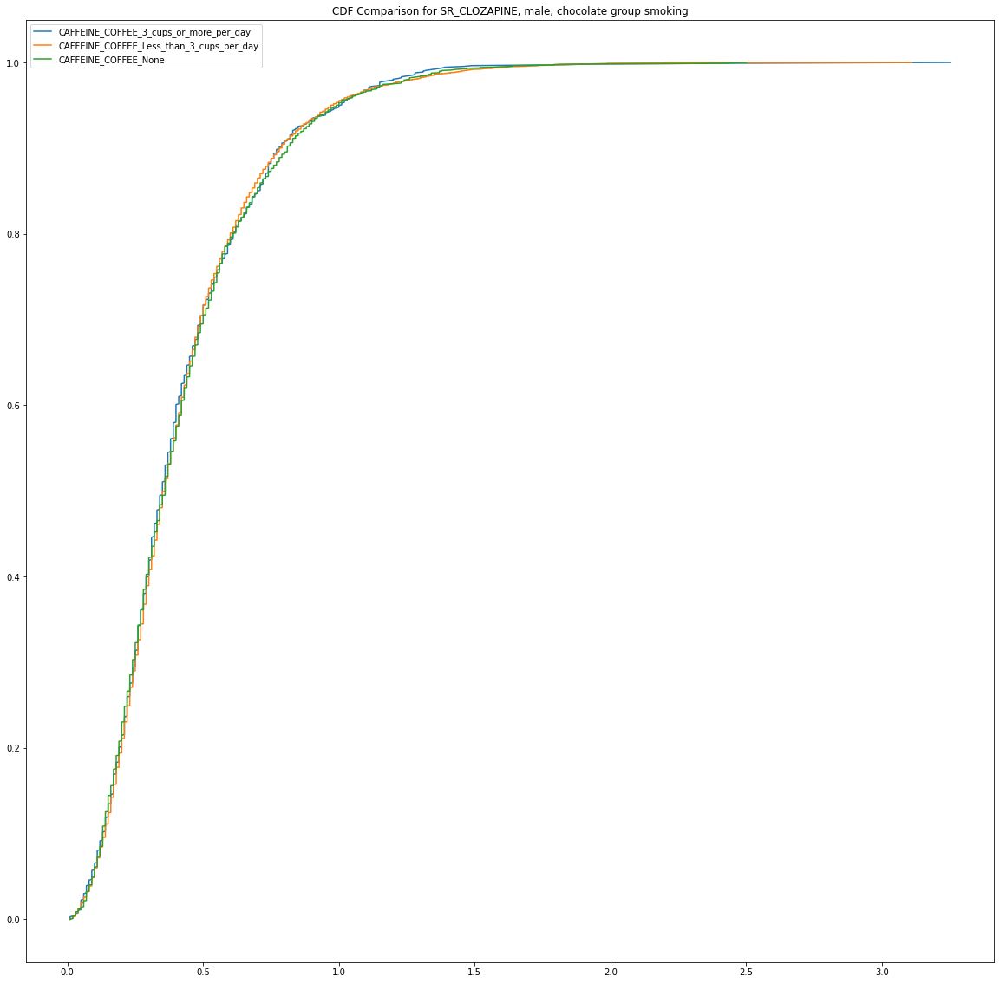

H=0.4706832939477187, p=0.7903007996238487


A Kruskal-Wallis test on SR_CLOZAPINE between smoking males in the chocolate group was not statistically signficant, H (2, N = 9368)=0.47 ,p>.05
1073 5963 2332
n=9368


SR_CLOZAPINE   male   chocolate group   non smoking
SR_CLOZAPINE 1 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


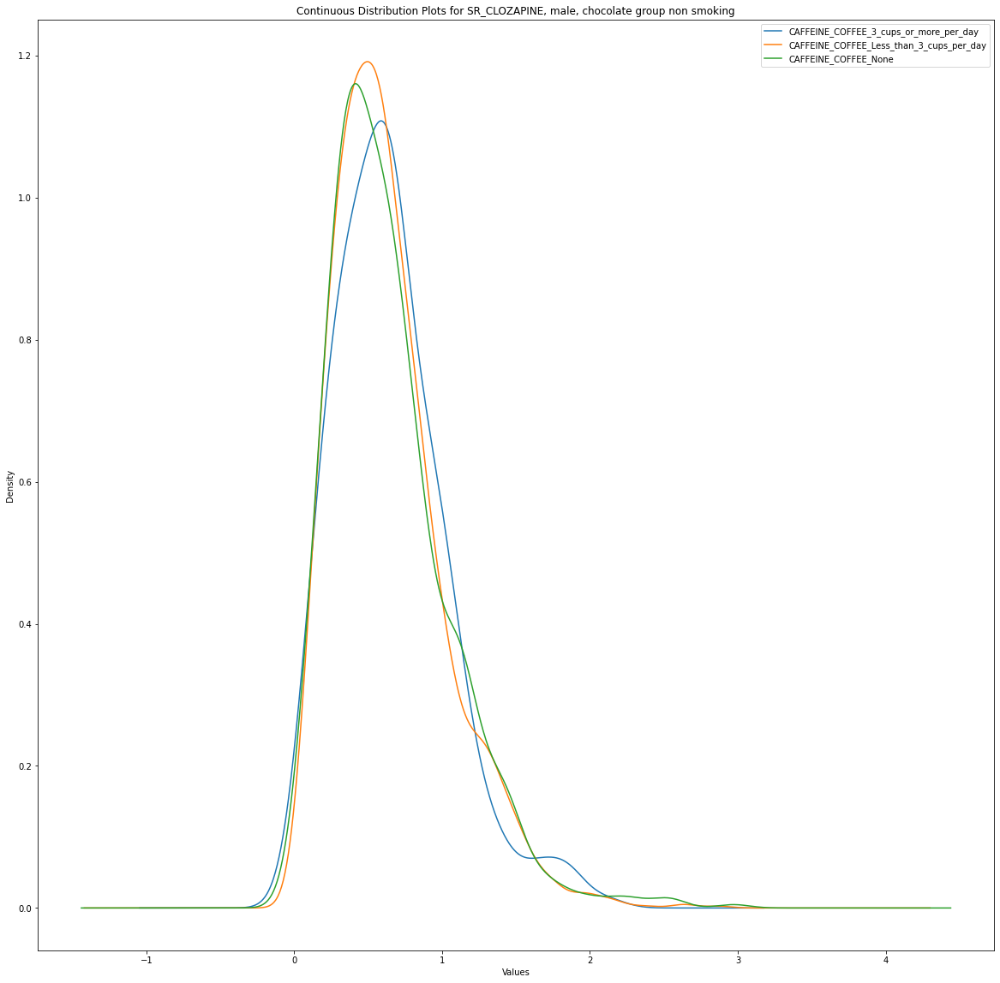

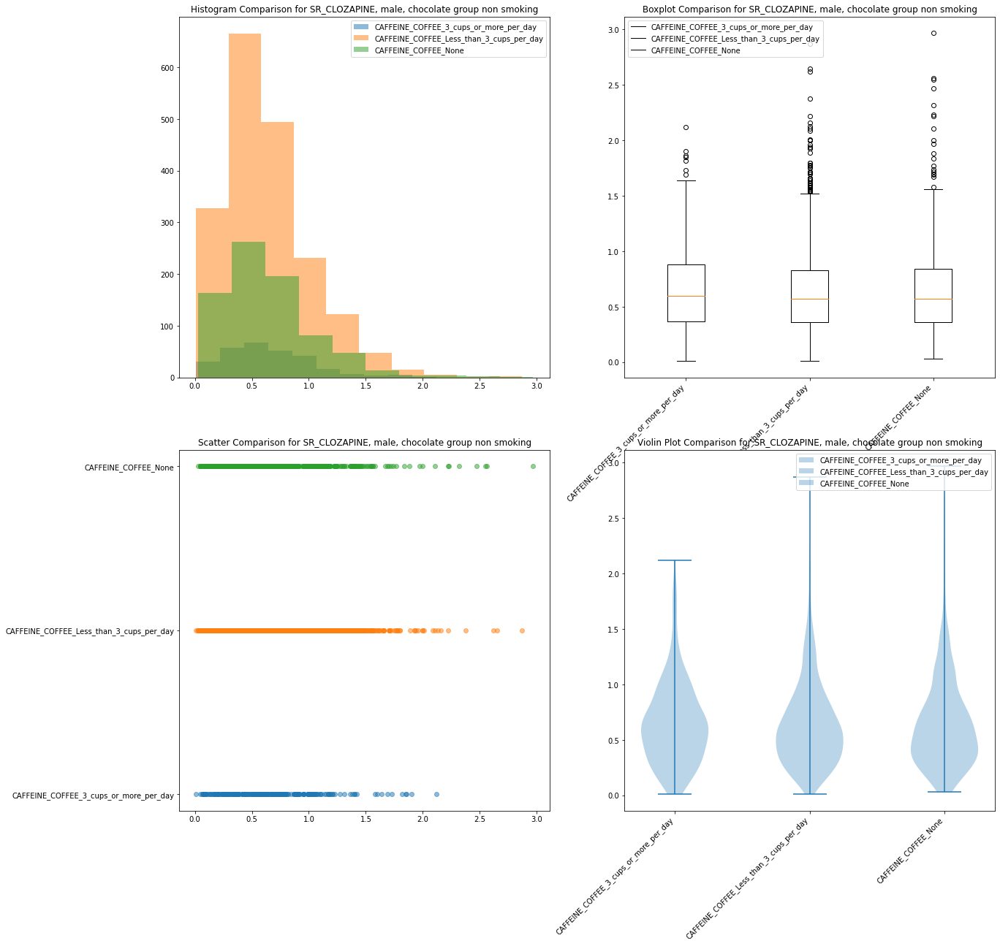

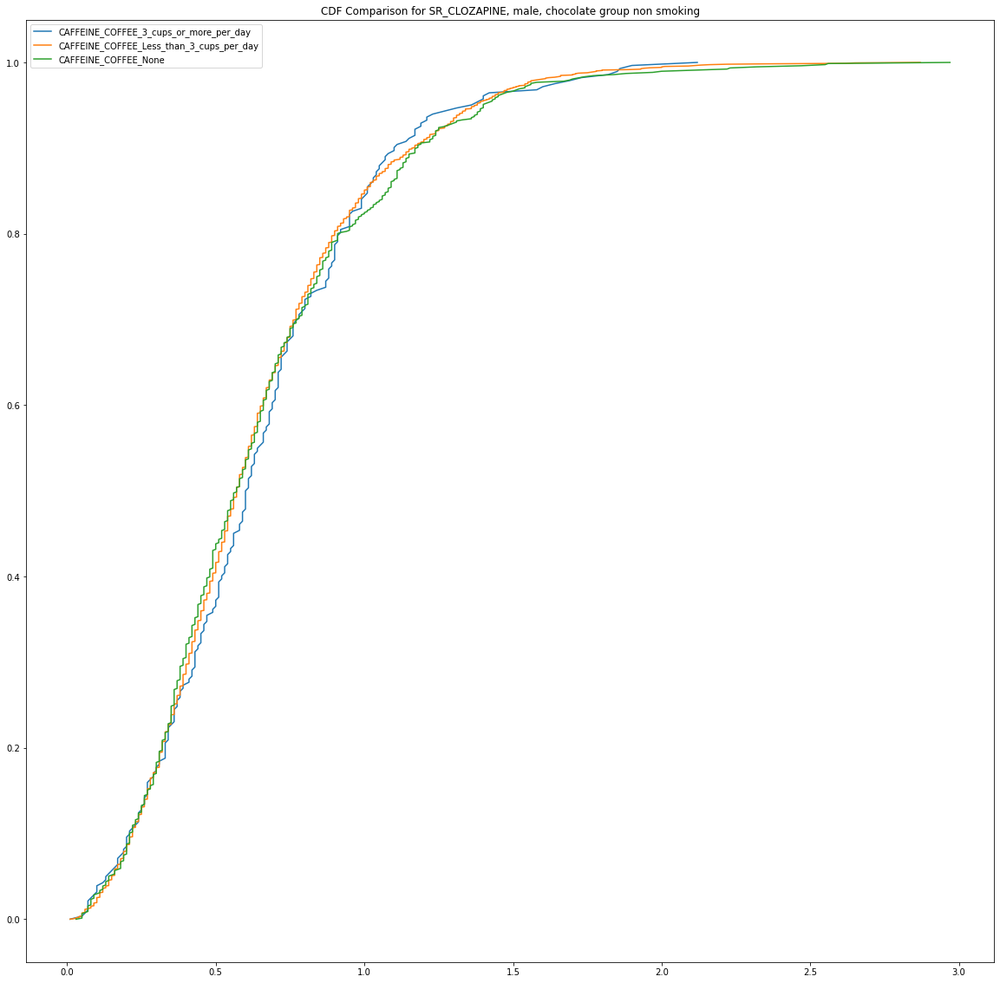

H=0.6666330130034147, p=0.7165433676269477


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking males in the chocolate group was not statistically signficant, H (2, N = 2973)=0.67 ,p>.05
283 1913 777
n=2973


SR_CURRENT_DOSE   female   coffee group   smoking
SR_CURRENT_DOSE 0 1 SR_DERIVED_SMOKER_STATUS_Smoker


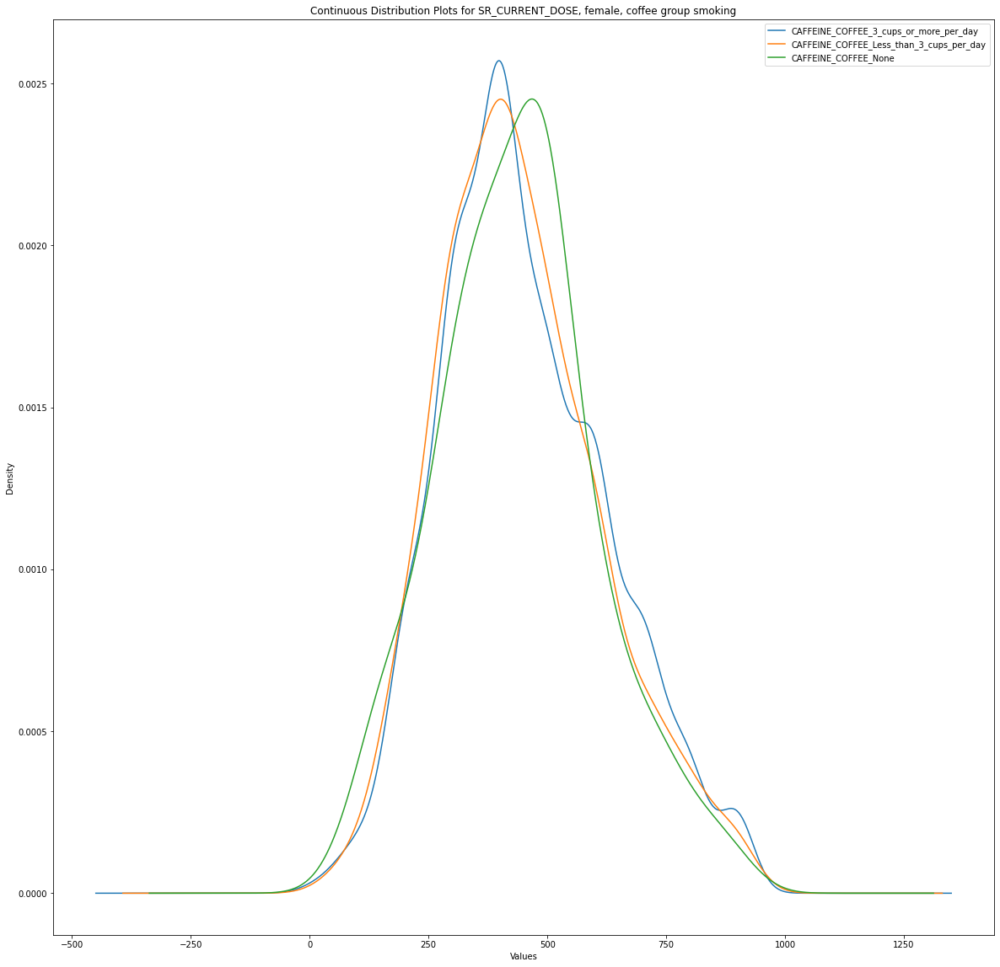

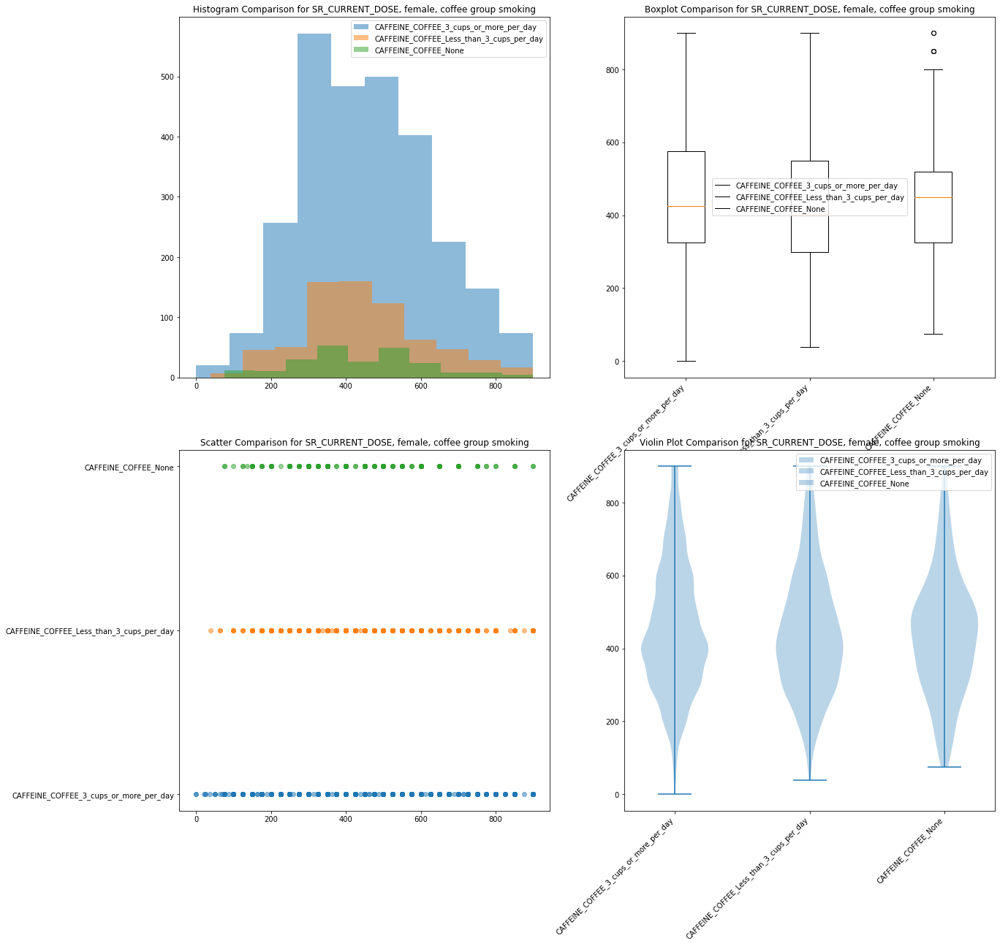

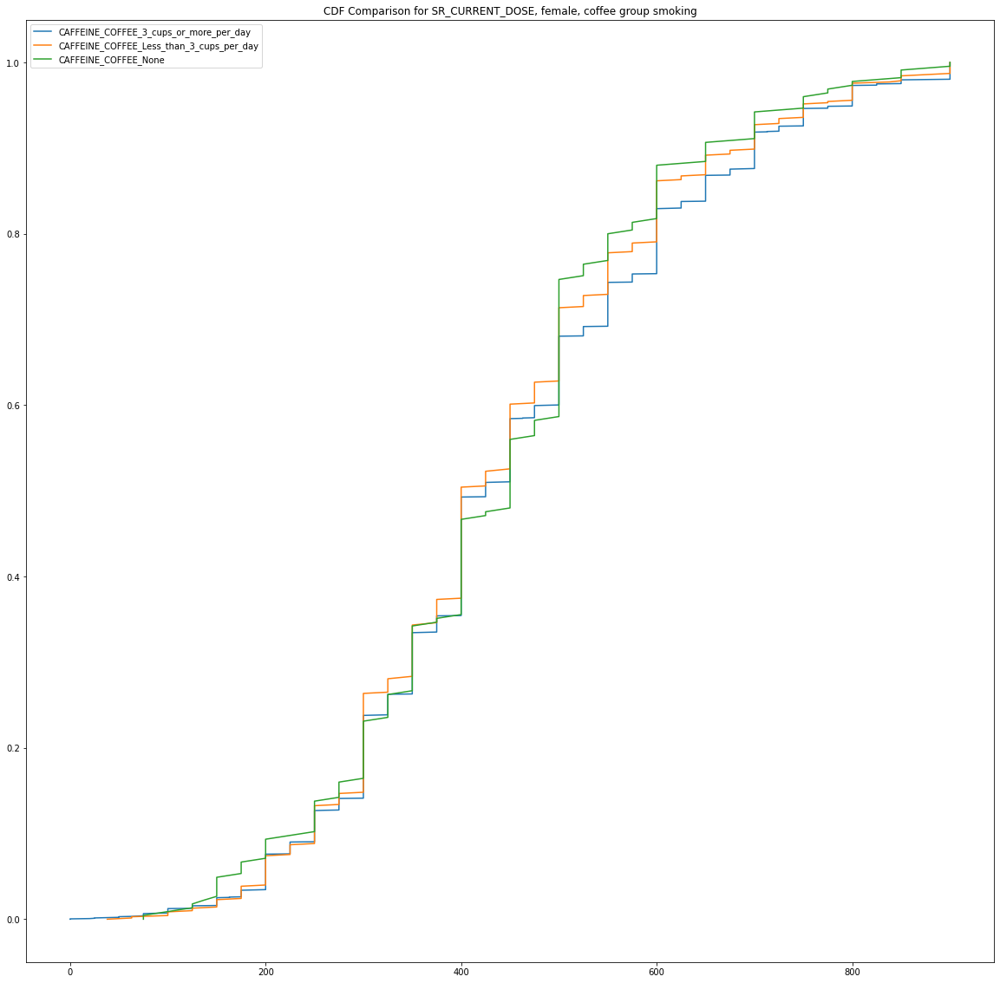

H=2.4301327751201423, p=0.2966903170939794


A Kruskal-Wallis test on SR_CURRENT_DOSE between smoking females in the coffee group was not statistically signficant, H (2, N = 3684)=2.43 ,p>.05
2755 703 226
n=3684


SR_CLOZAPINE   female   coffee group   non smoking
SR_CLOZAPINE 0 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


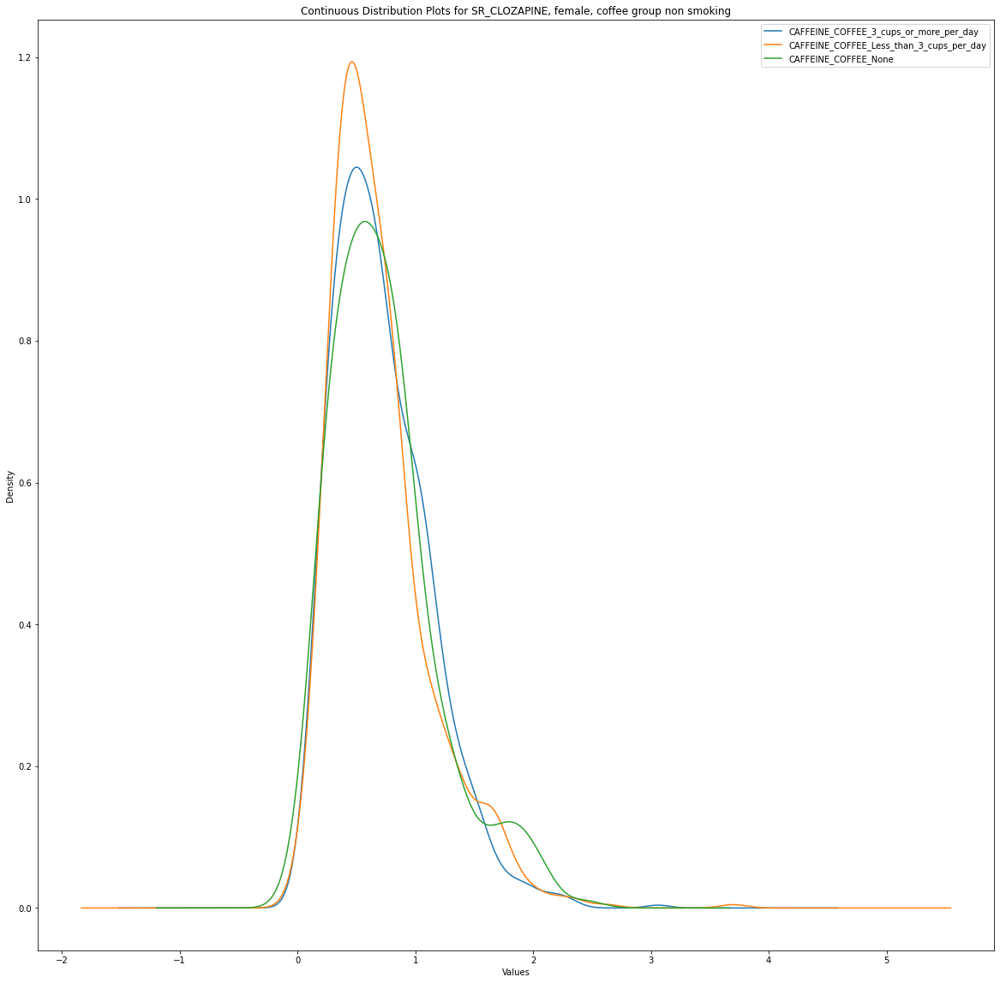

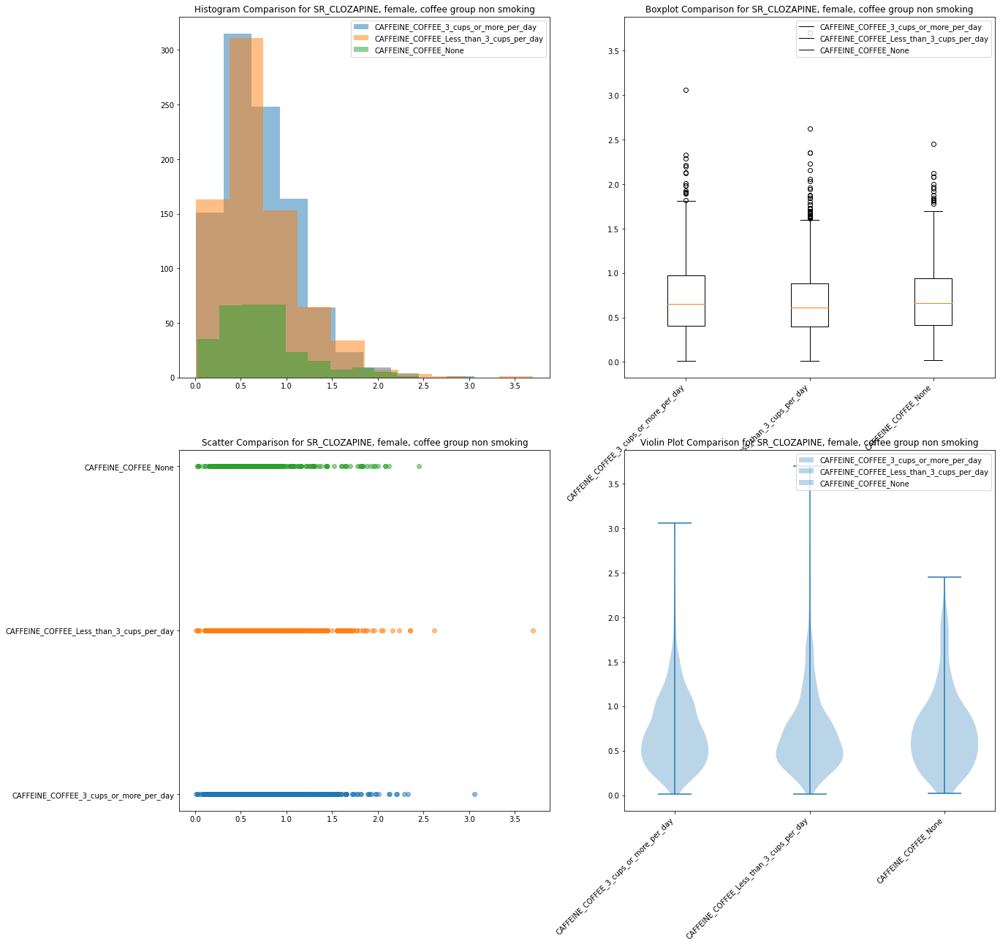

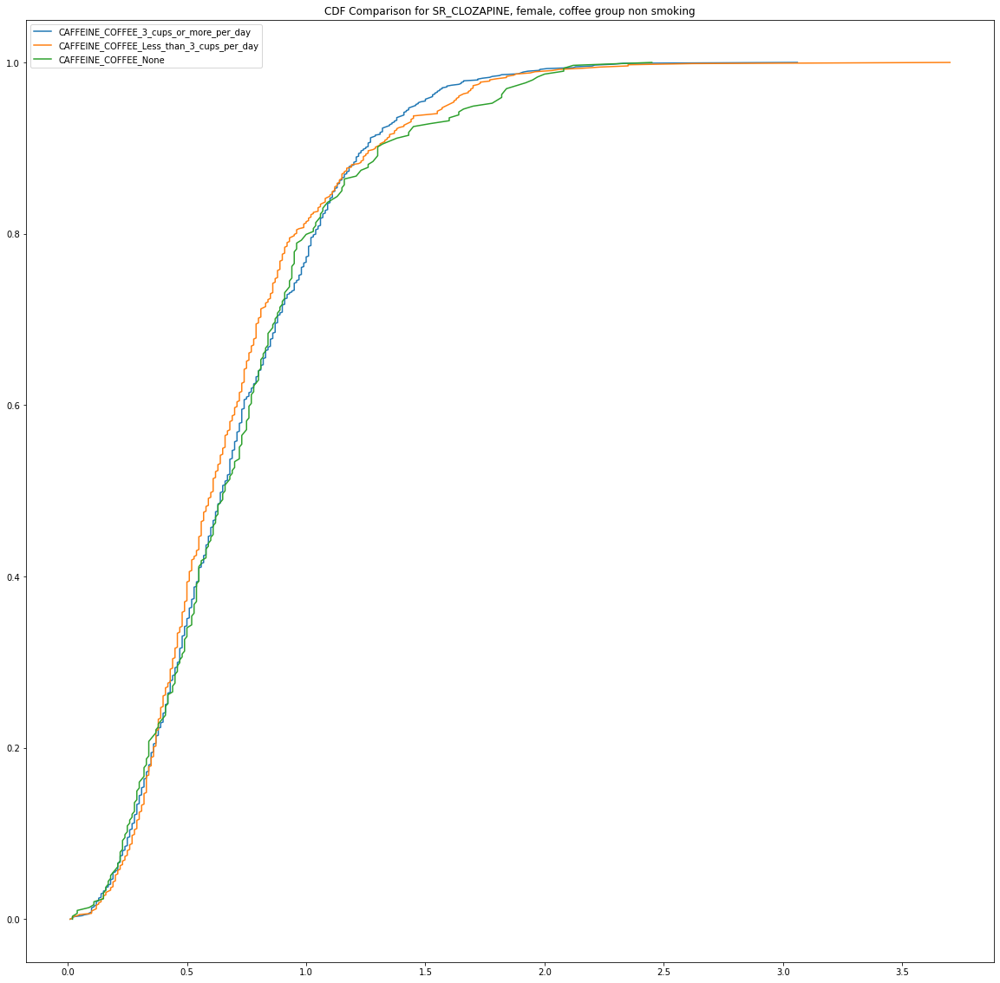

H=2.73629129607349, p=0.25457860045108704


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking females in the coffee group was not statistically signficant, H (2, N = 2012)=2.74 ,p>.05
979 738 295
n=2012


SR_CLOZAPINE   female   chocolate group   smoking
SR_CLOZAPINE 0 1 SR_DERIVED_SMOKER_STATUS_Smoker


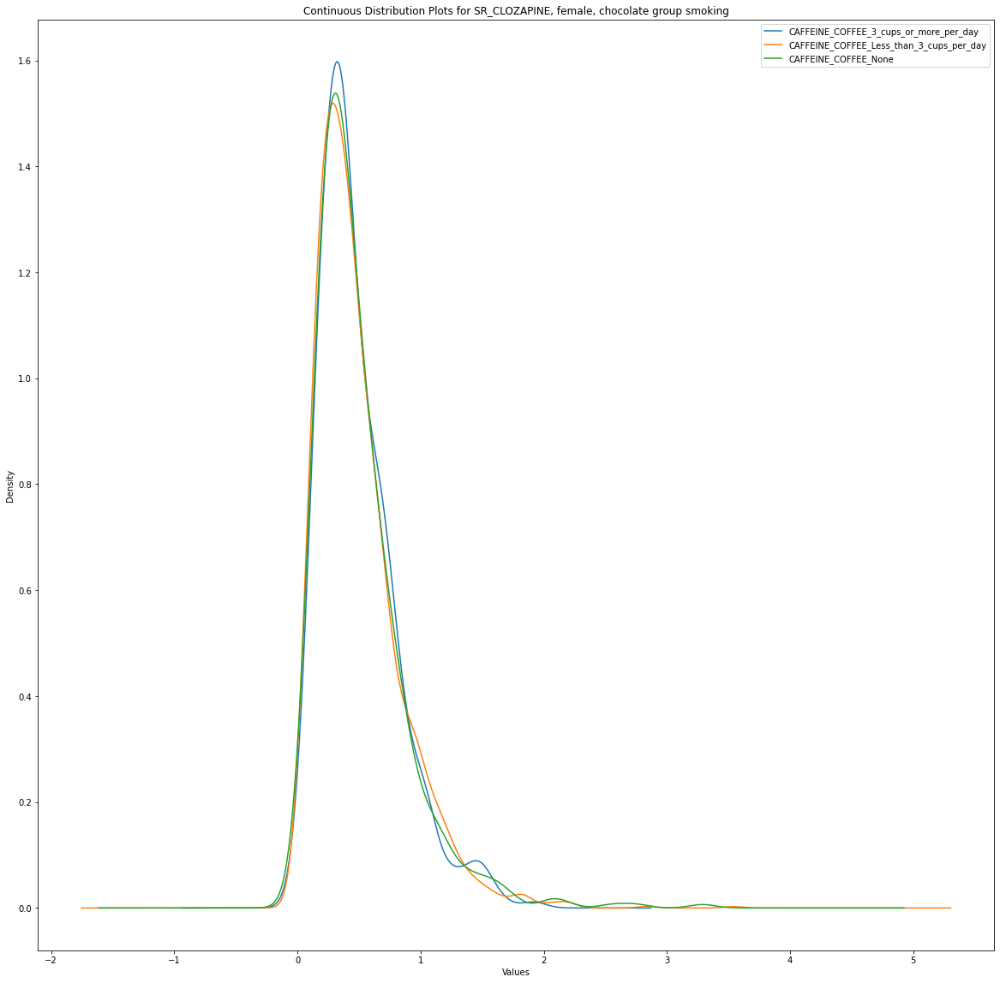

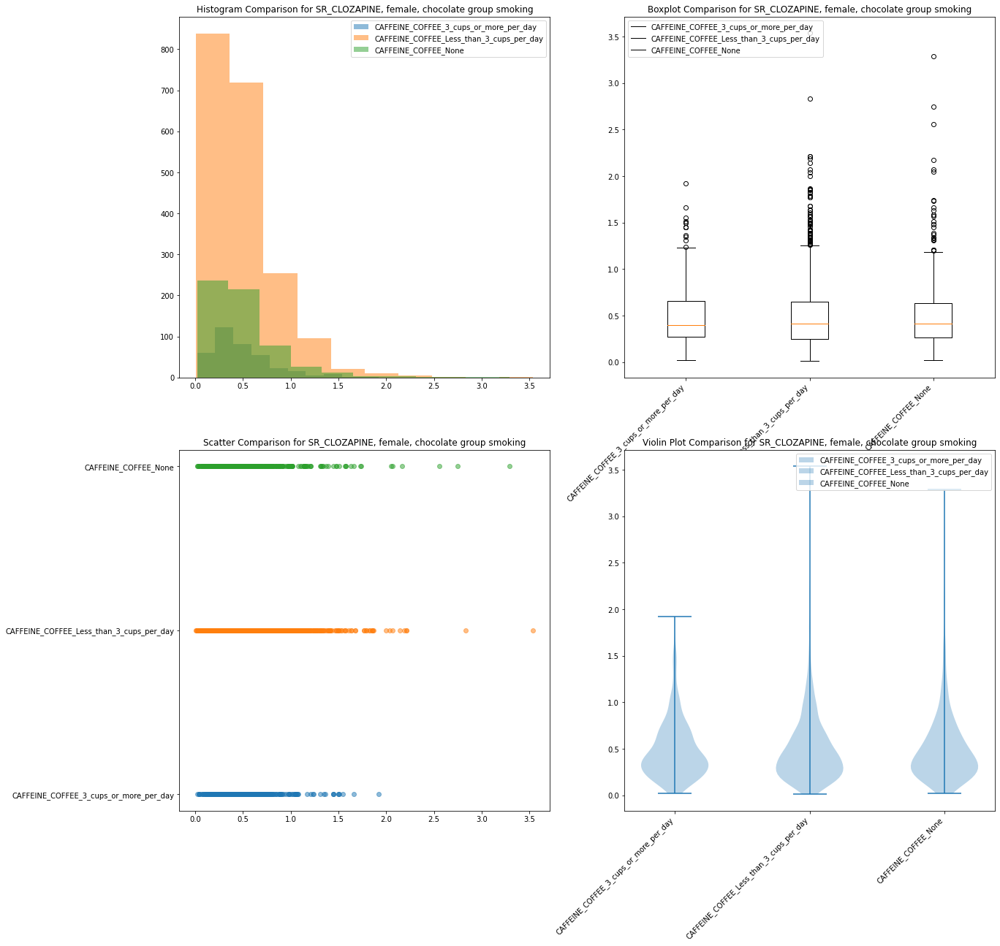

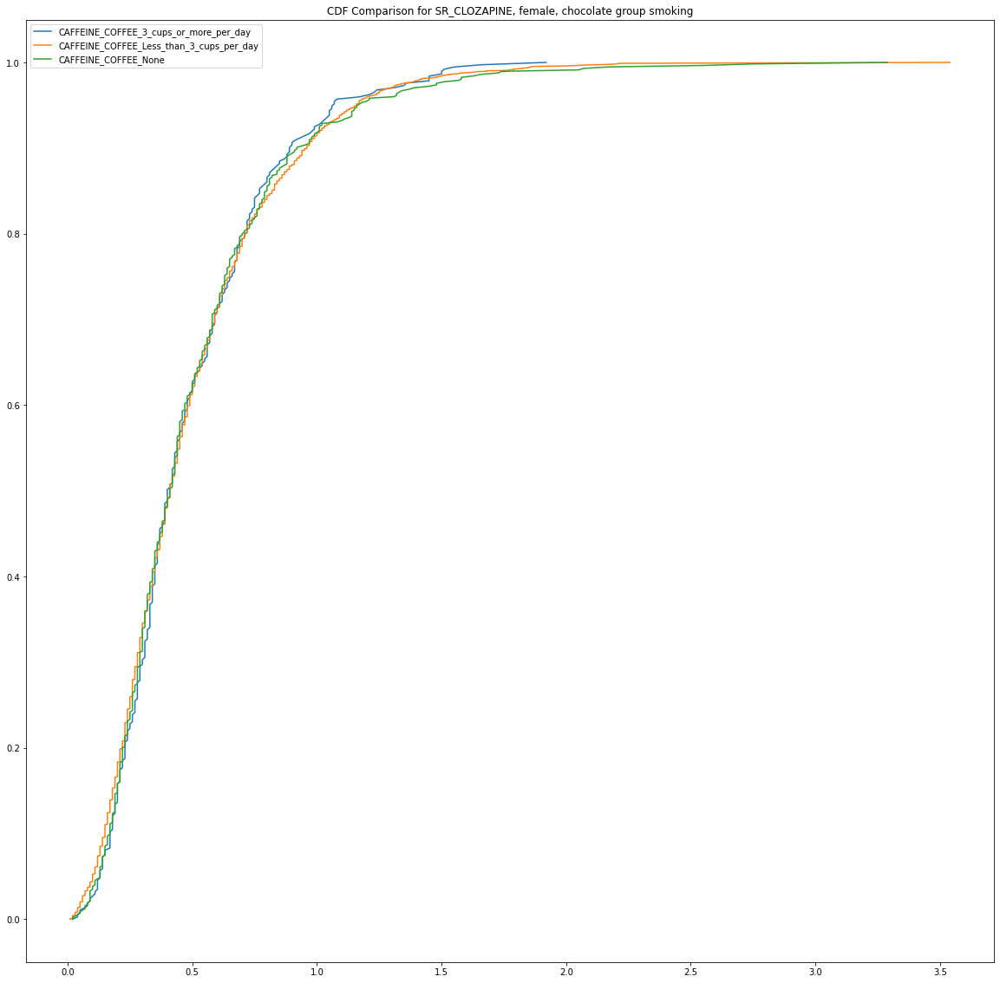

H=0.25214699475474456, p=0.8815500527854487


A Kruskal-Wallis test on SR_CLOZAPINE between smoking females in the chocolate group was not statistically signficant, H (2, N = 2893)=0.25 ,p>.05
374 1943 576
n=2893


SR_CLOZAPINE   female   chocolate group   non smoking
SR_CLOZAPINE 0 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


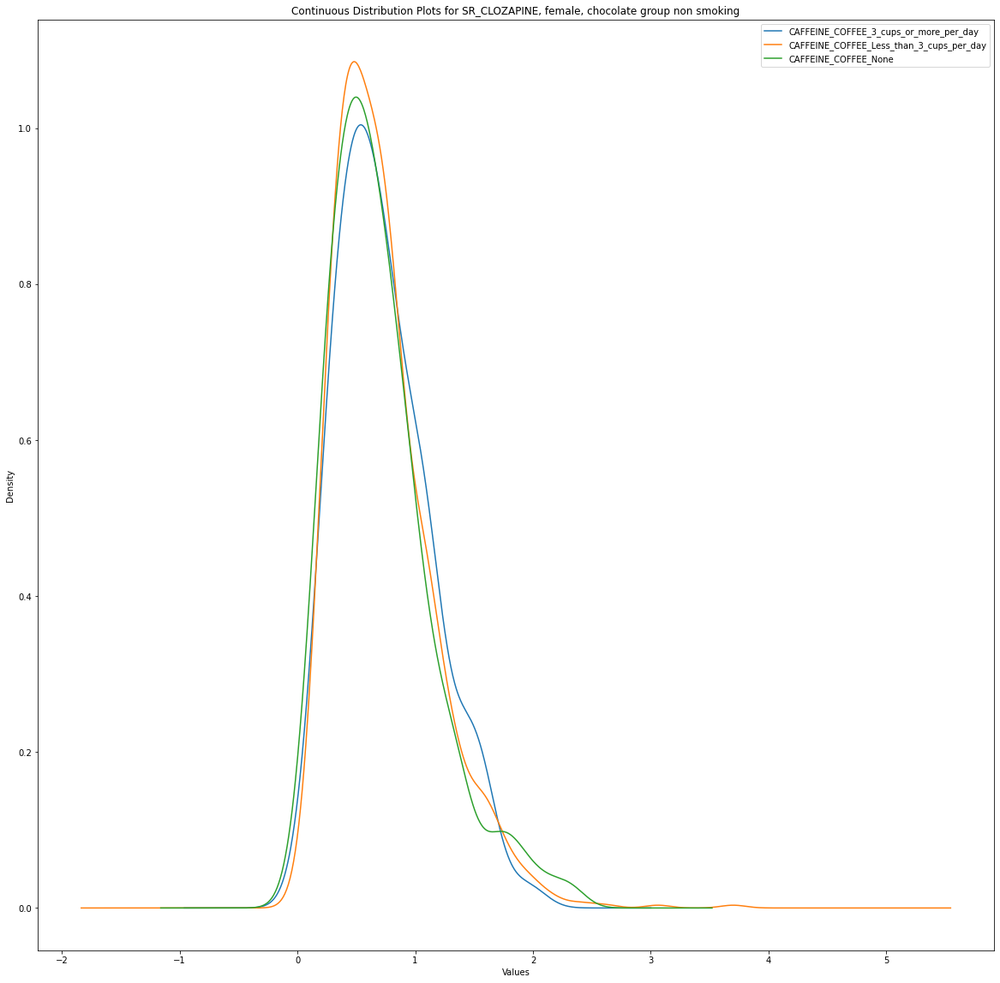

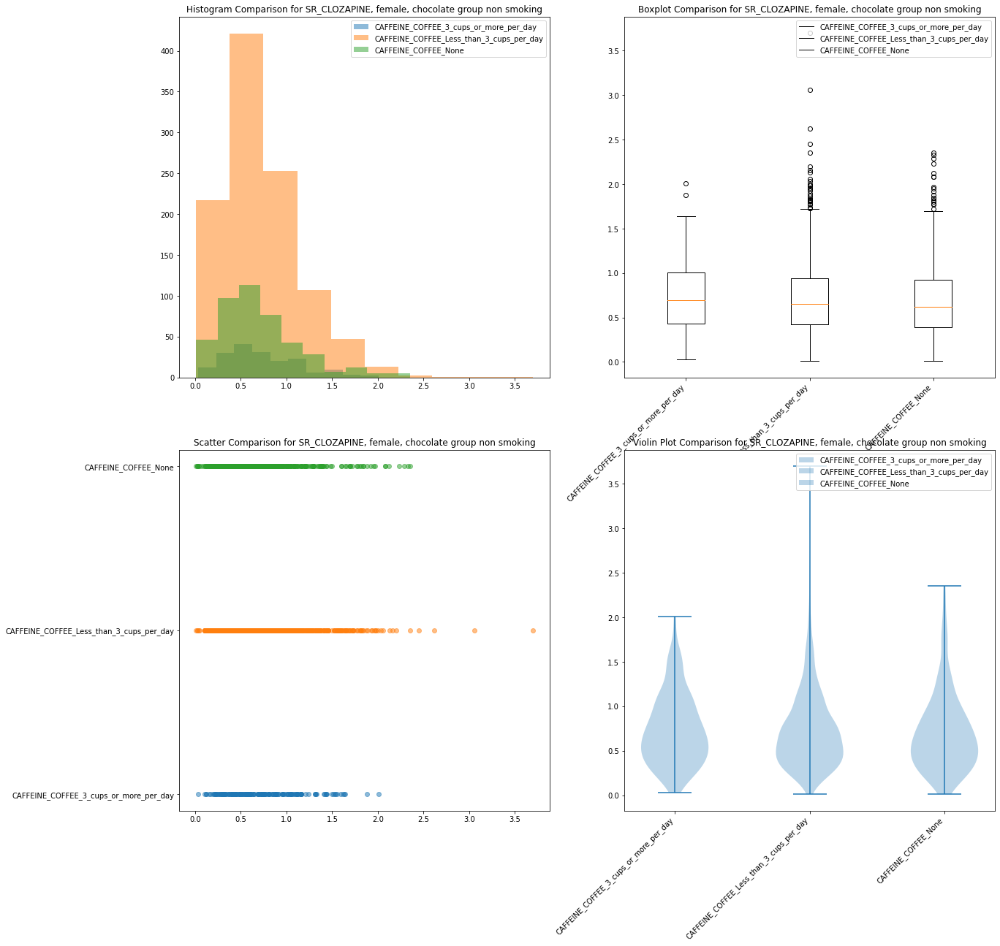

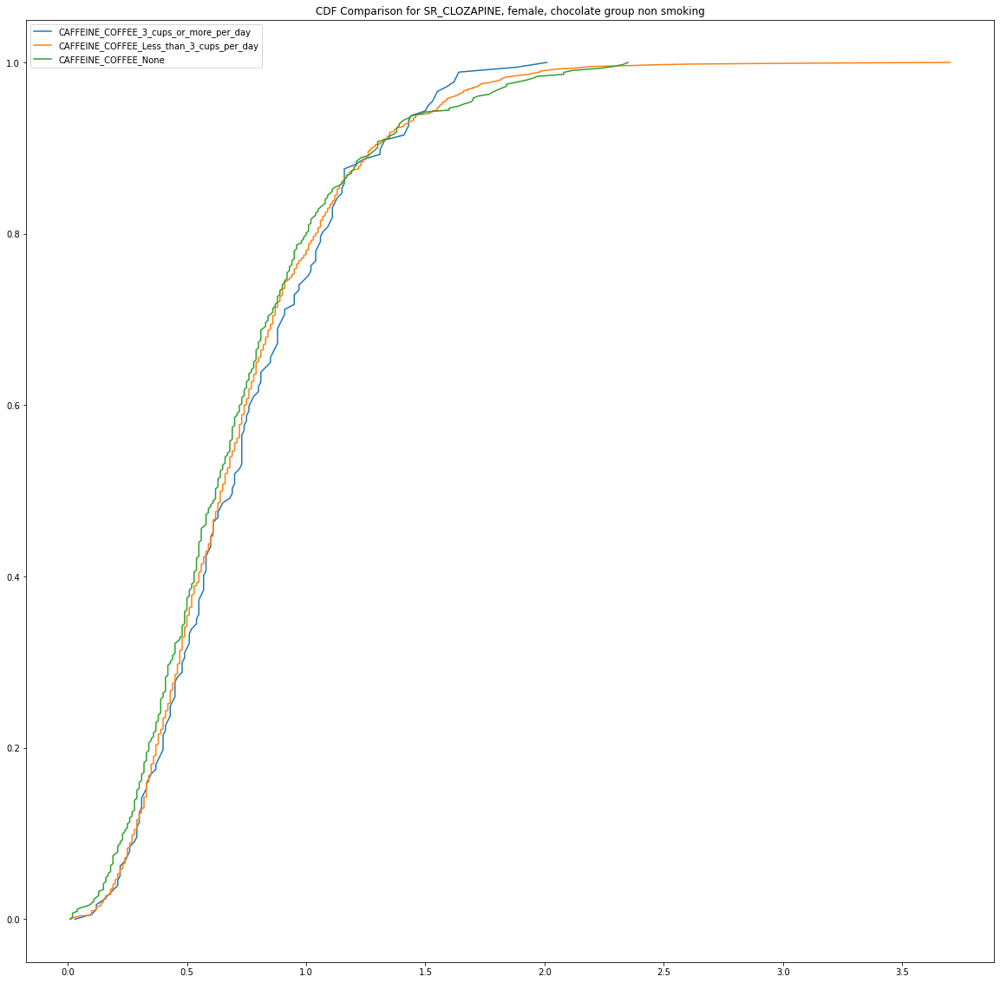

H=2.5234896055518092, p=0.2831595376851145


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking females in the chocolate group was not statistically signficant, H (2, N = 1674)=2.52 ,p>.05
178 1063 433
n=1674


SR_CLOZAPINE   male   coffee group   smoking
SR_CLOZAPINE 1 1 SR_DERIVED_SMOKER_STATUS_Smoker


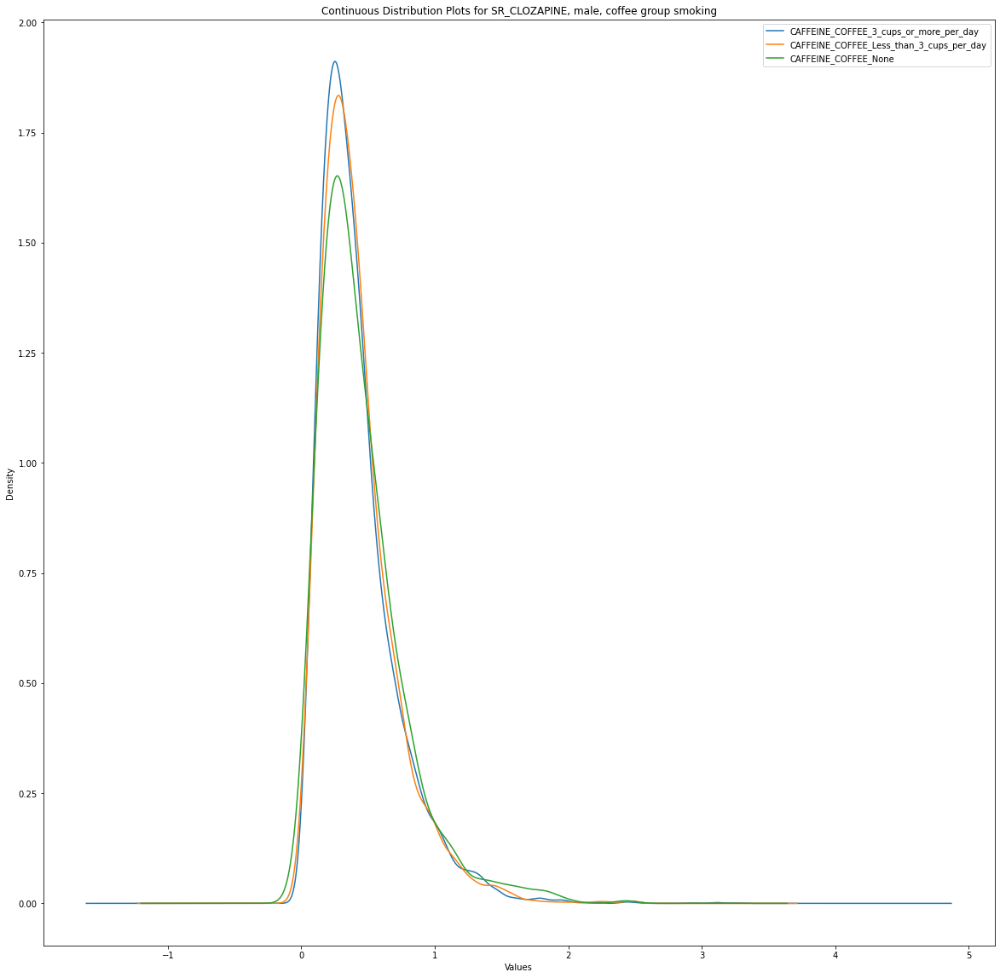

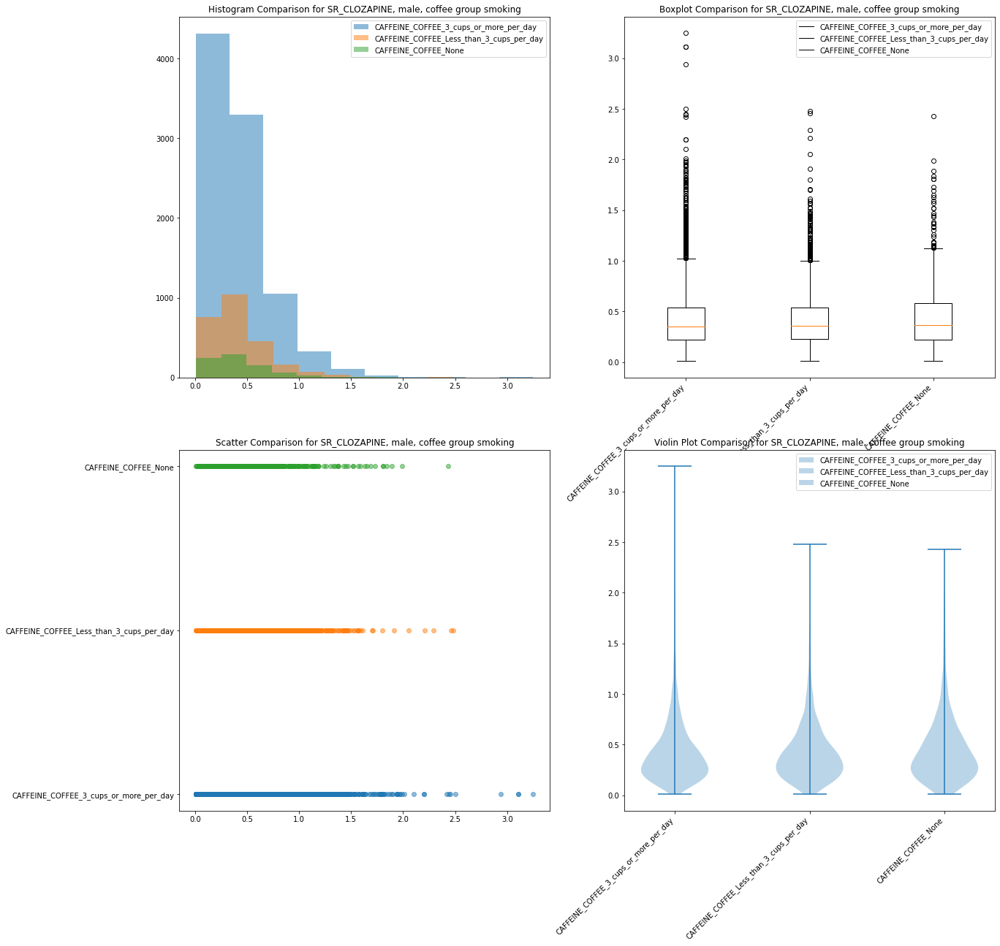

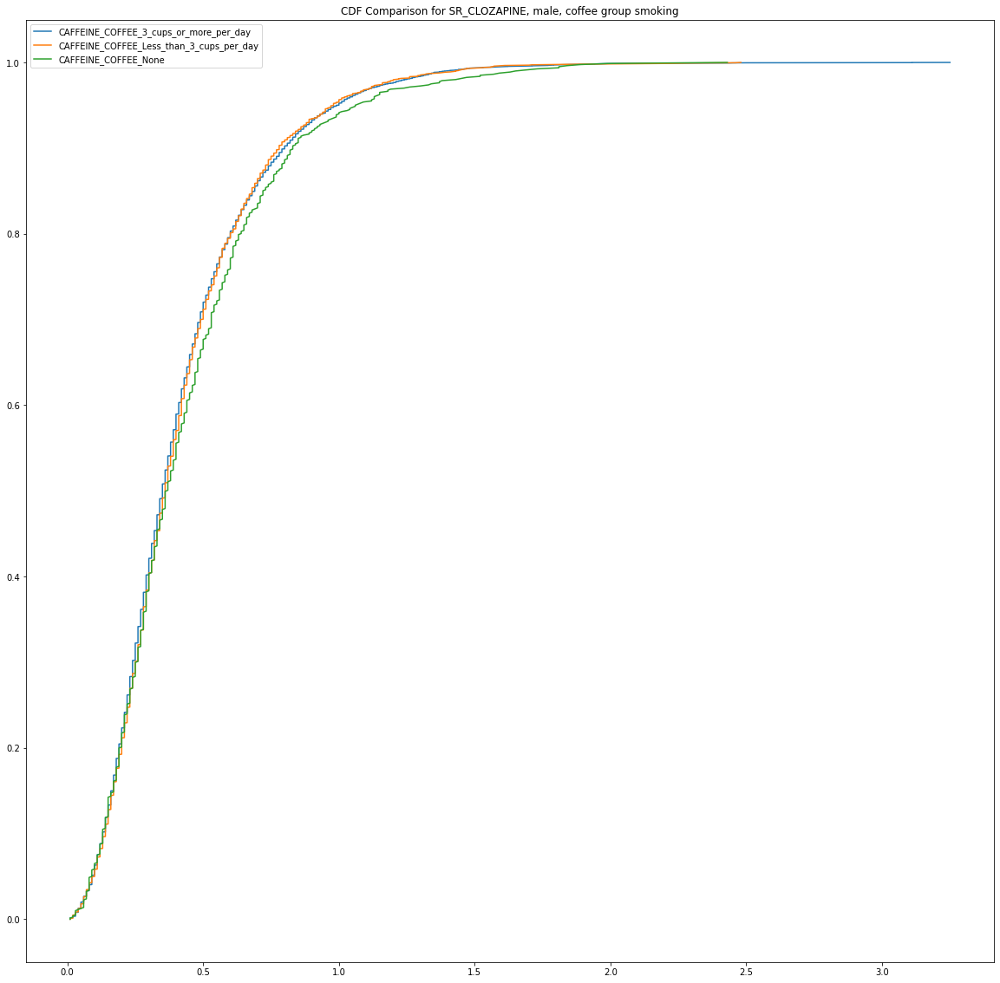

H=4.495474910872997, p=0.10563796498297016


A Kruskal-Wallis test on SR_CLOZAPINE between smoking males in the coffee group was not statistically signficant, H (2, N = 12463)=4.5 ,p>.05
9131 2530 802
n=12463


SR_CLOZAPINE   male   coffee group   non smoking
SR_CLOZAPINE 1 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


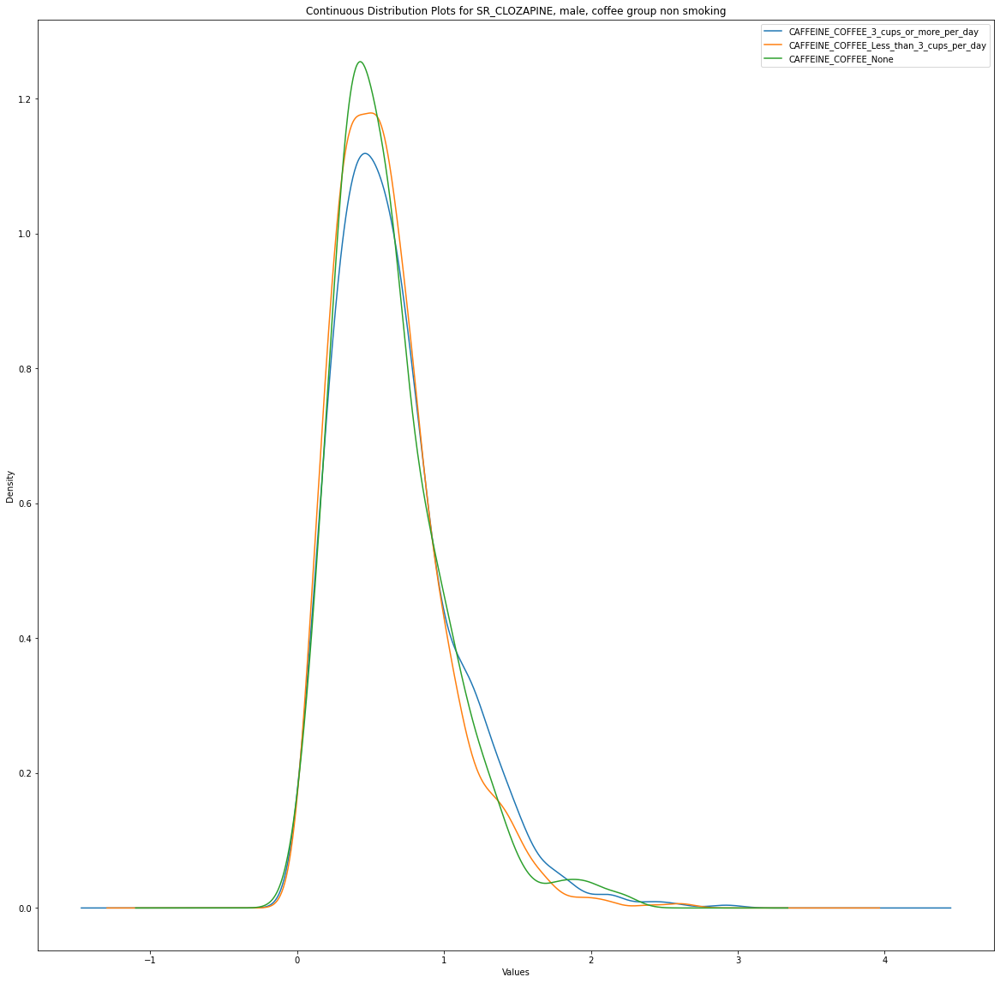

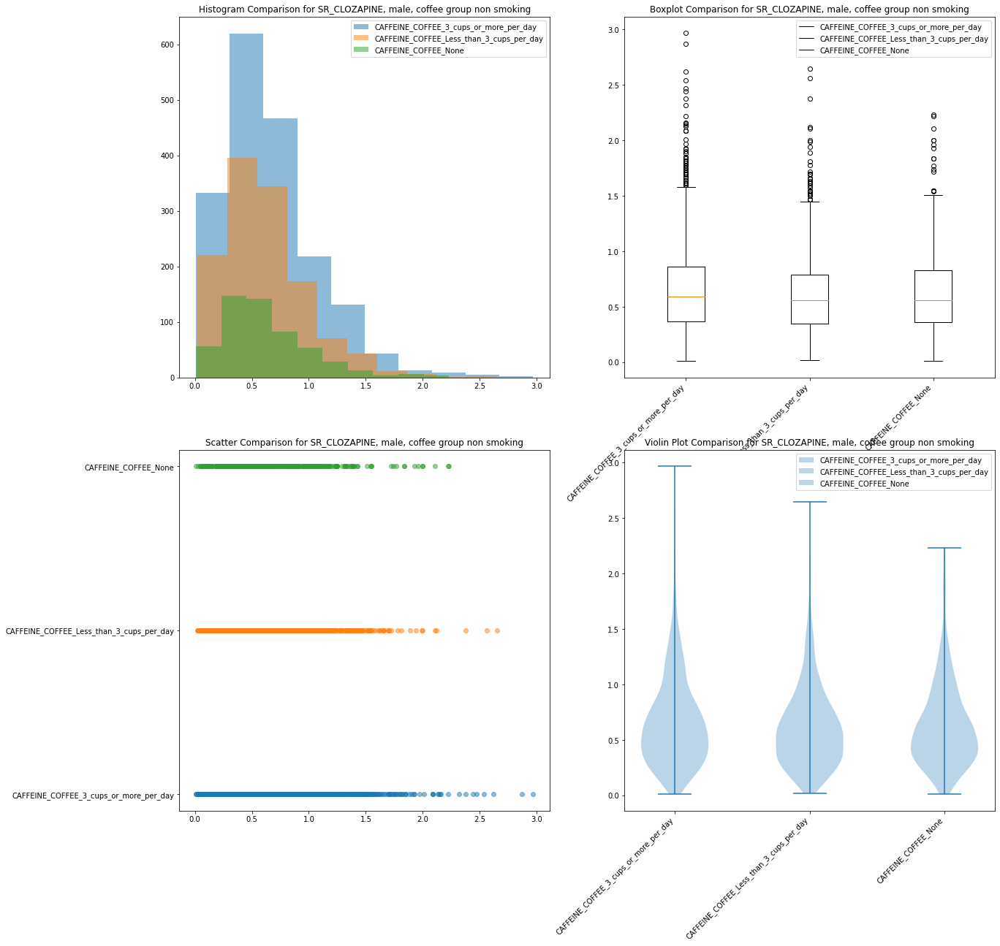

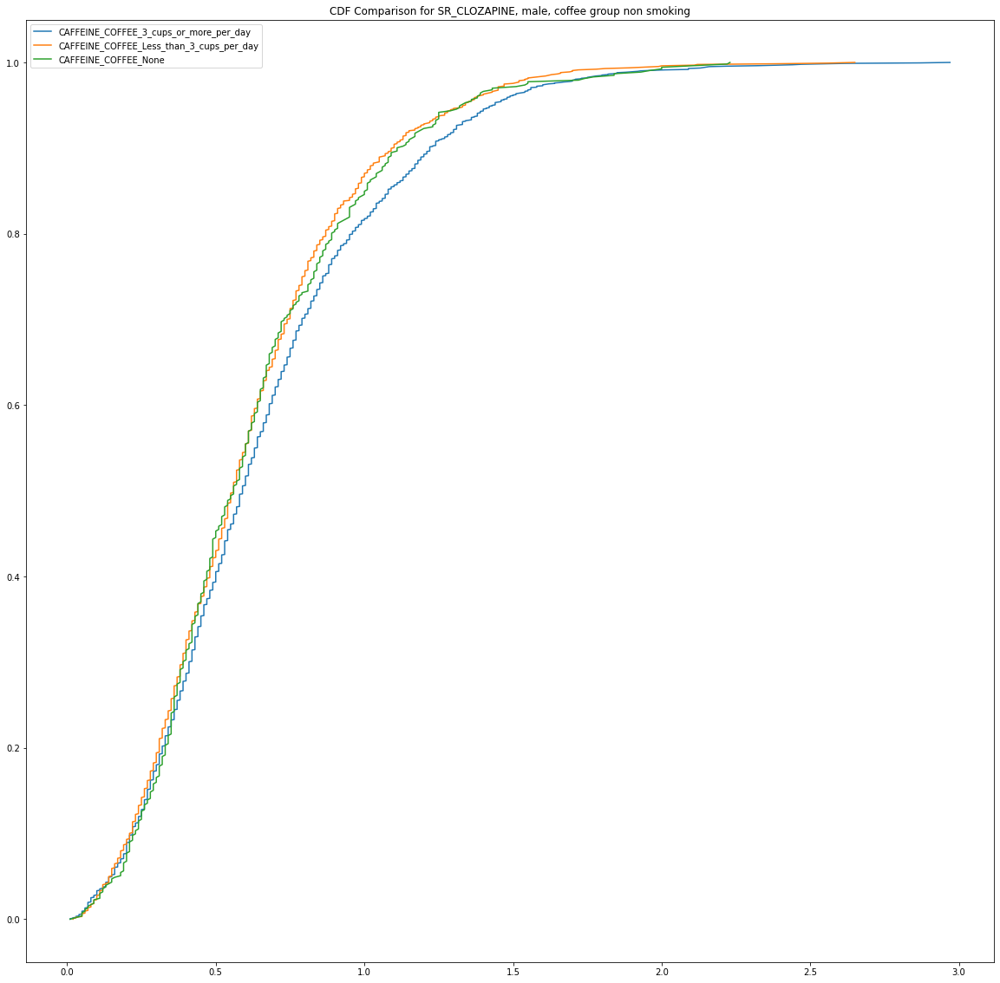

H=9.01695365515992, p=0.011015225492001823


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking males in the coffee group was statistically signficant at H (2, N = 3639)=9.02 ,p<.05
1838 1268 533
n=3639


SR_CLOZAPINE   male   chocolate group   smoking
SR_CLOZAPINE 1 1 SR_DERIVED_SMOKER_STATUS_Smoker


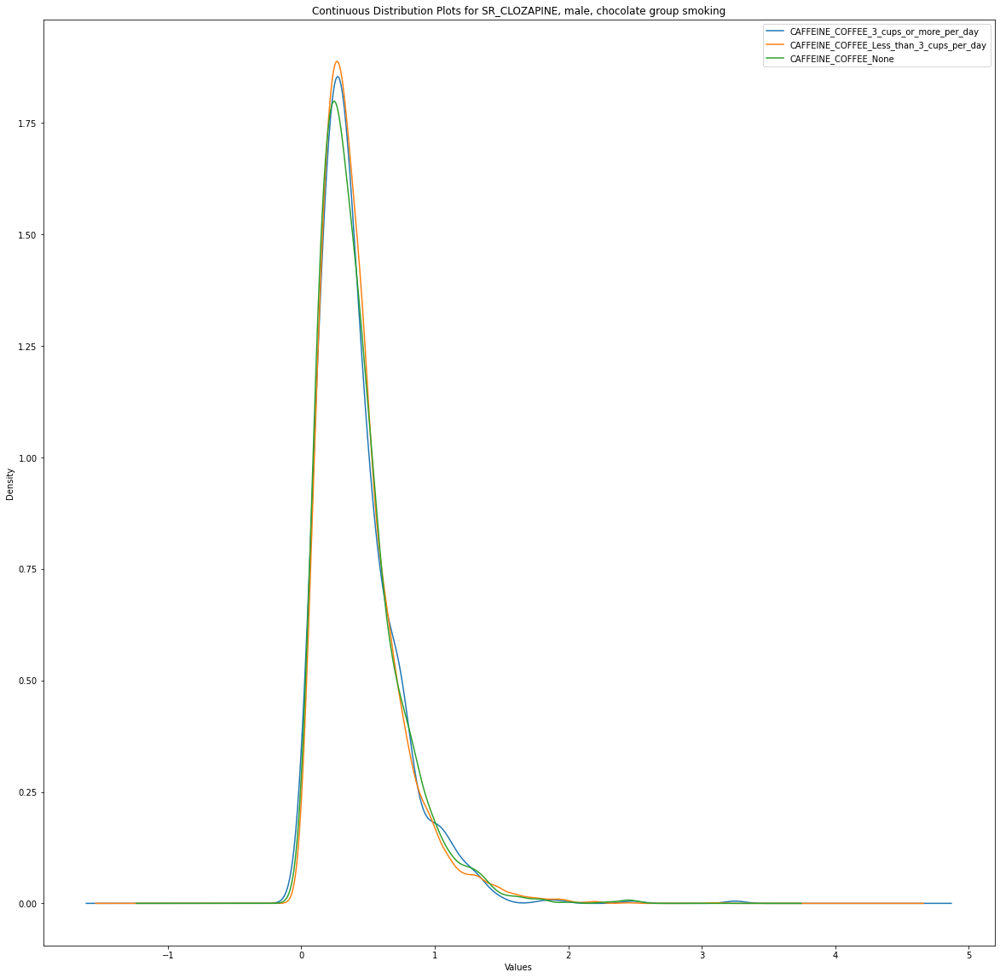

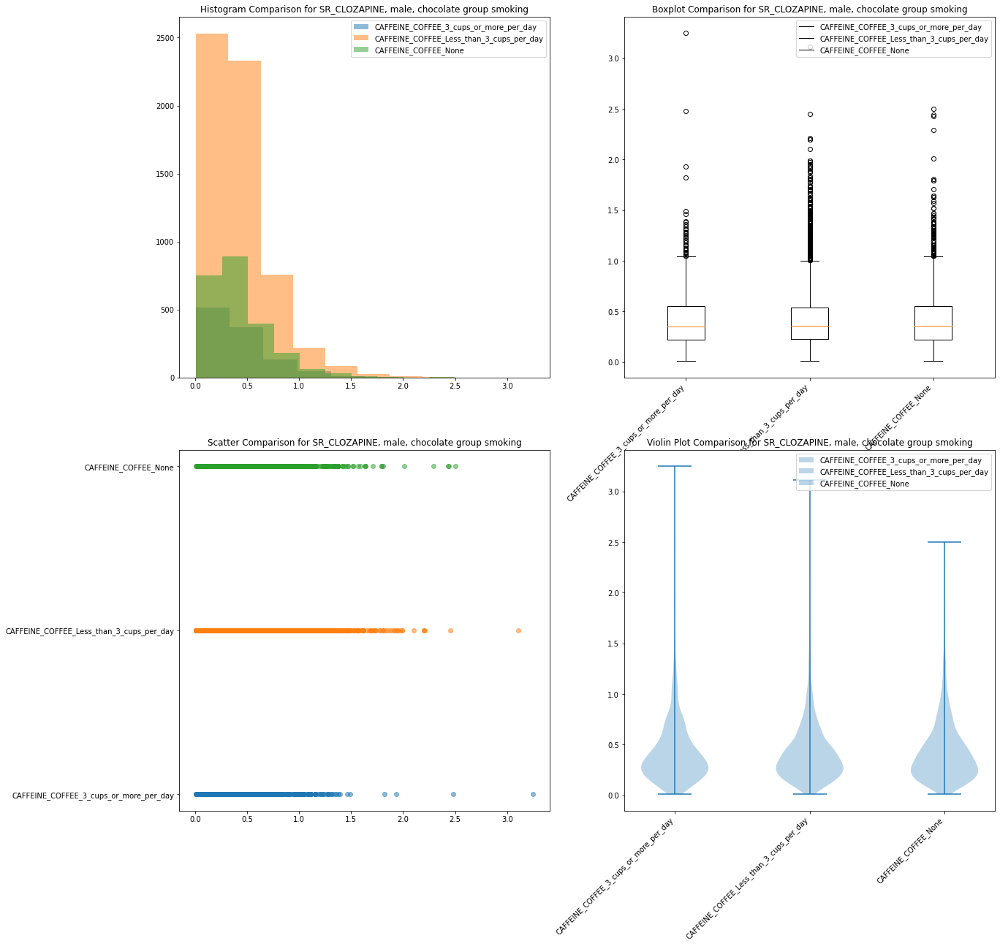

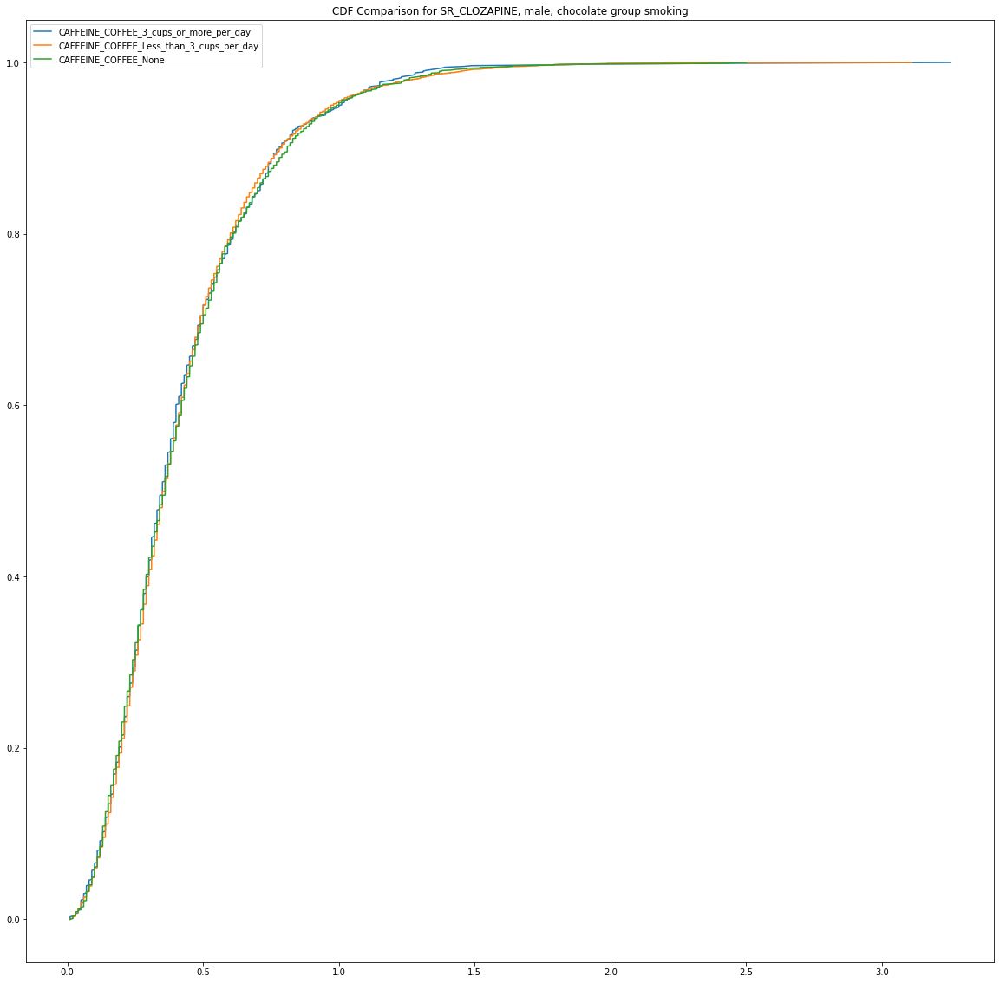

H=0.4706832939477187, p=0.7903007996238487


A Kruskal-Wallis test on SR_CLOZAPINE between smoking males in the chocolate group was not statistically signficant, H (2, N = 9368)=0.47 ,p>.05
1073 5963 2332
n=9368


SR_CLOZAPINE   male   chocolate group   non smoking
SR_CLOZAPINE 1 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


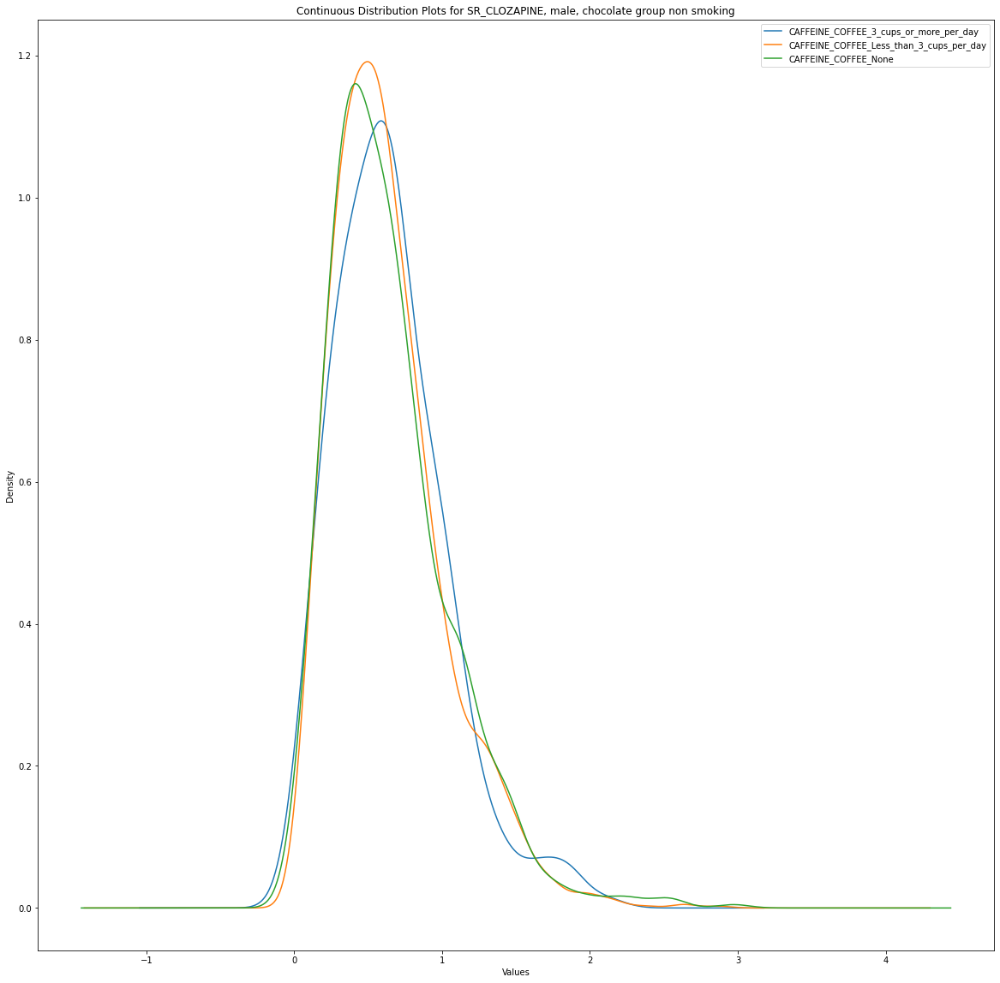

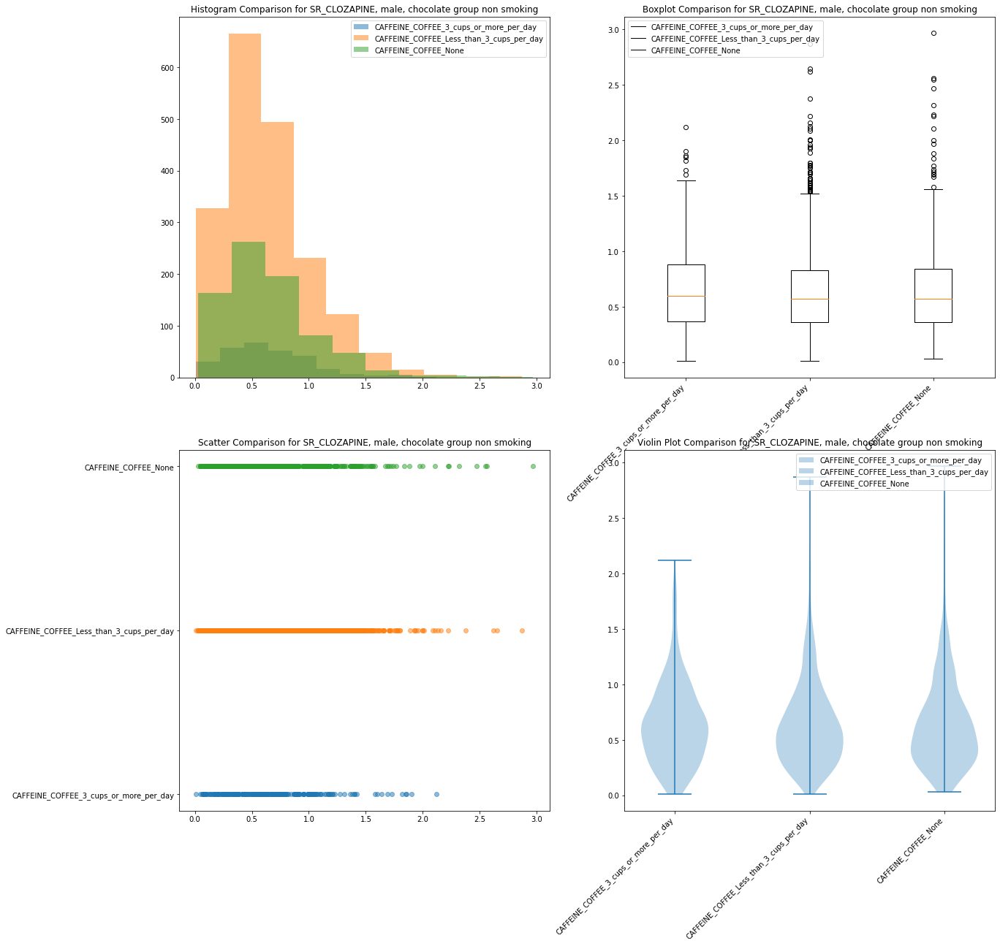

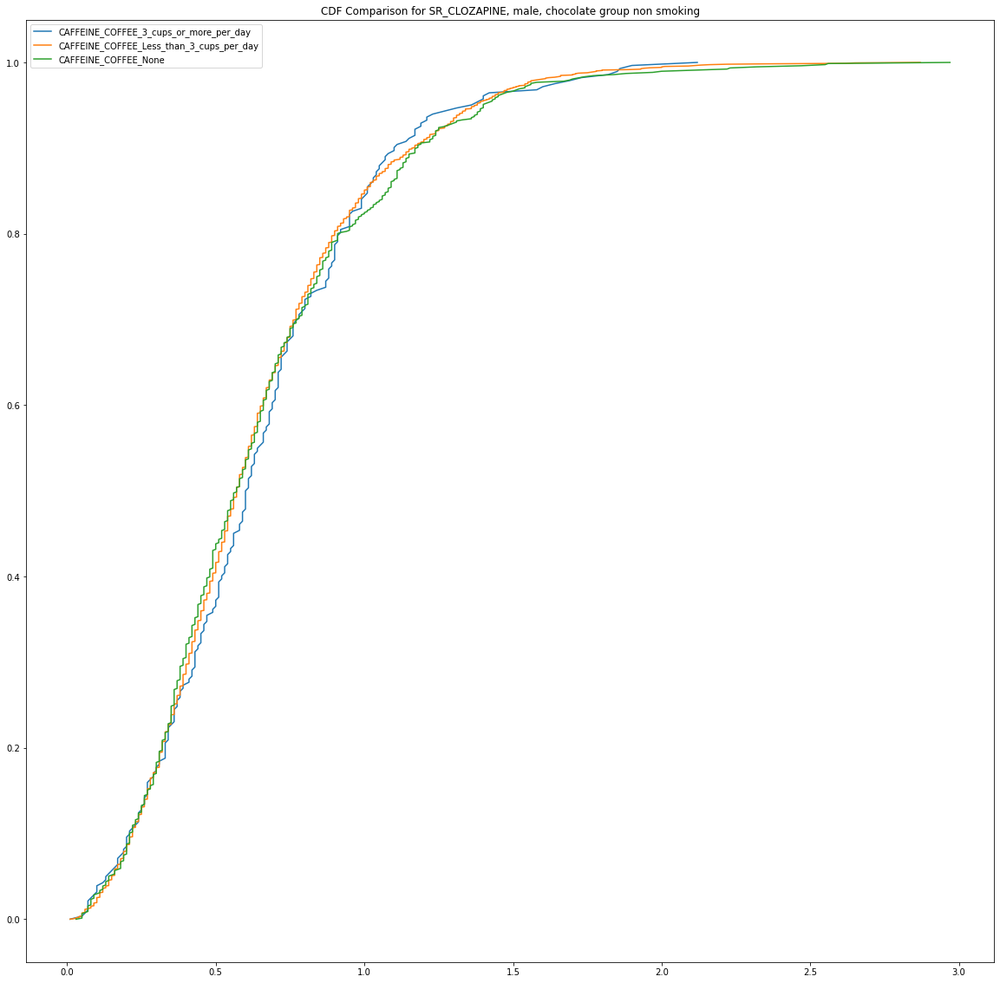

H=0.6666330130034147, p=0.7165433676269477


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking males in the chocolate group was not statistically signficant, H (2, N = 2973)=0.67 ,p>.05
283 1913 777
n=2973


SR_CLOZAPINE   female   coffee group   smoking
SR_CLOZAPINE 0 1 SR_DERIVED_SMOKER_STATUS_Smoker


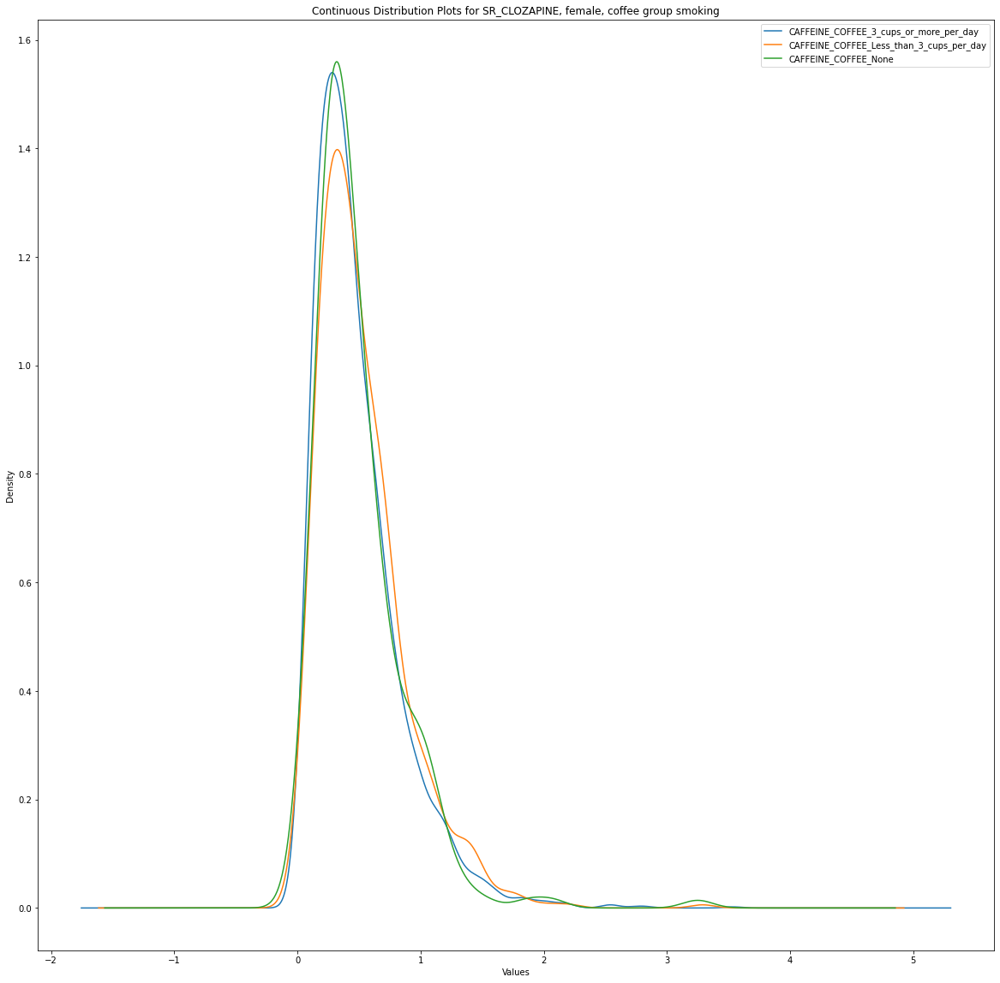

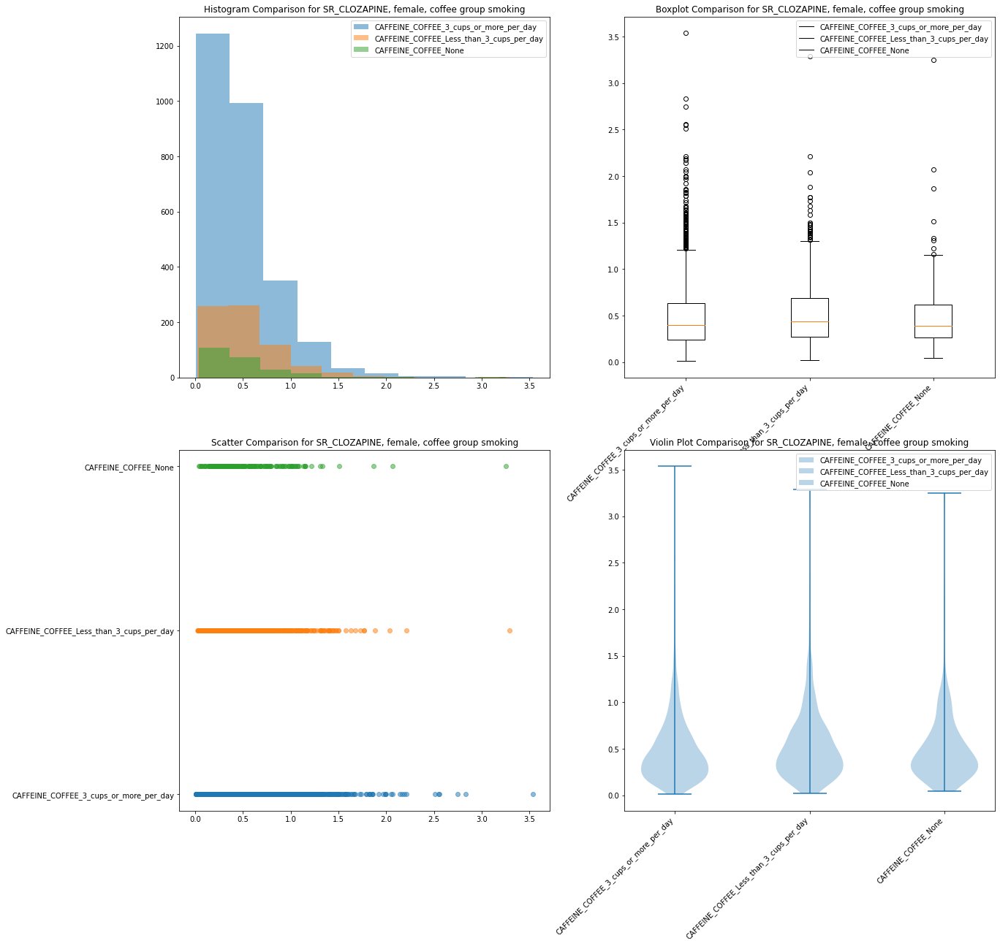

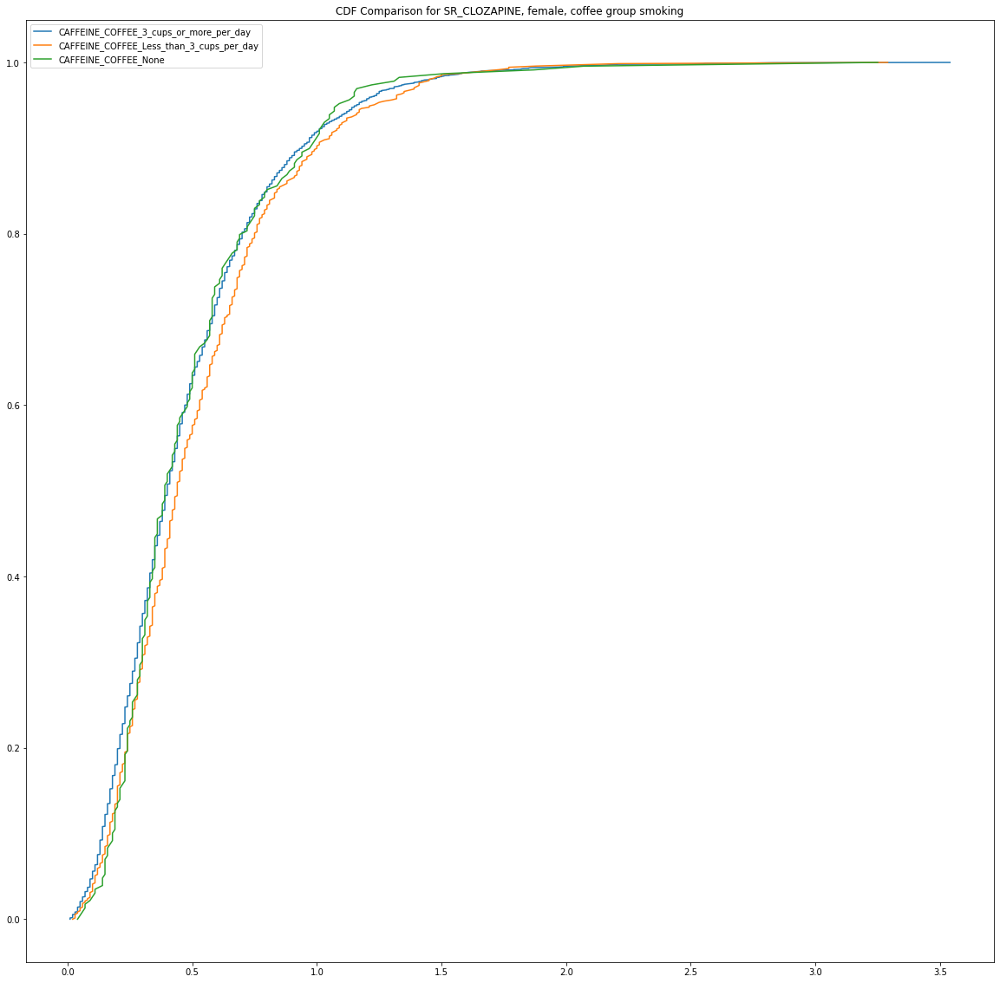

H=11.285847161662975, p=0.0035424964772262186


A Kruskal-Wallis test on SR_CLOZAPINE between smoking females in the coffee group was statistically signficant at H (2, N = 3715)=11.29 ,p<.05
2776 709 230
n=3715


SR_CLOZAPINE   female   coffee group   non smoking
SR_CLOZAPINE 0 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


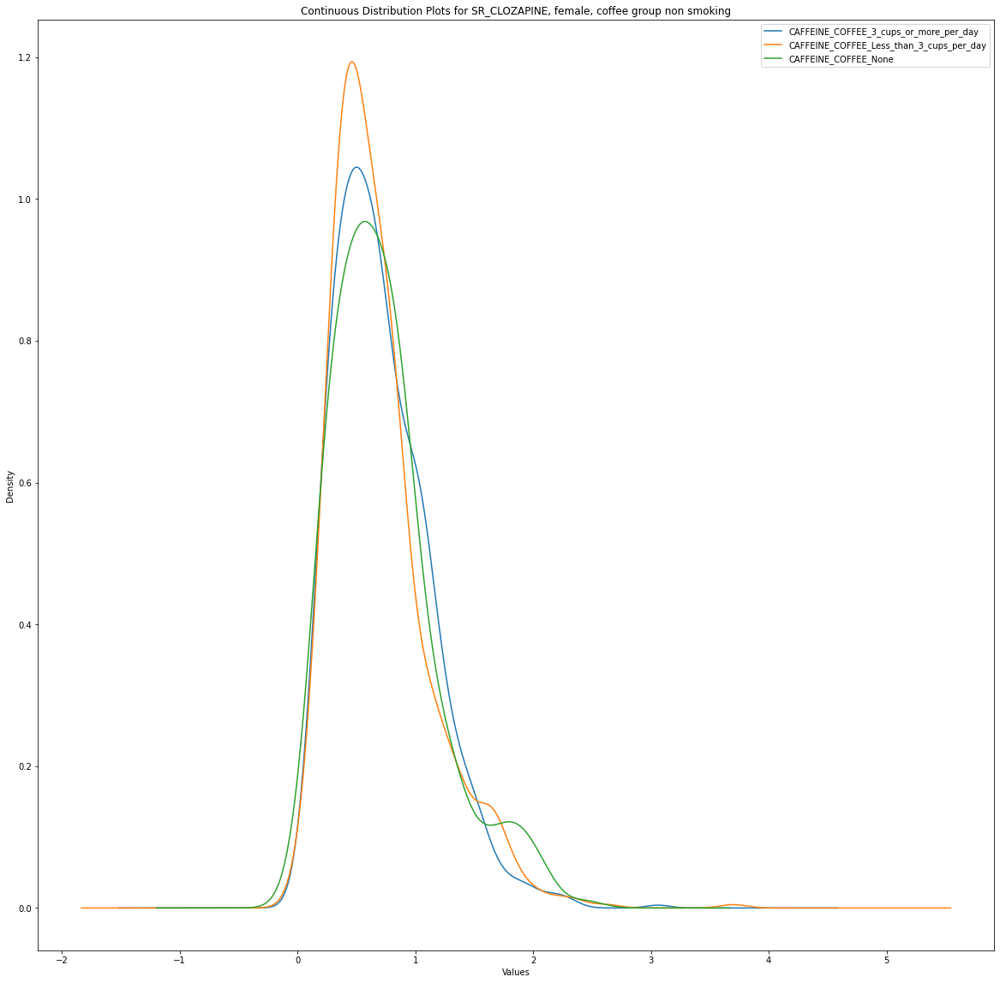

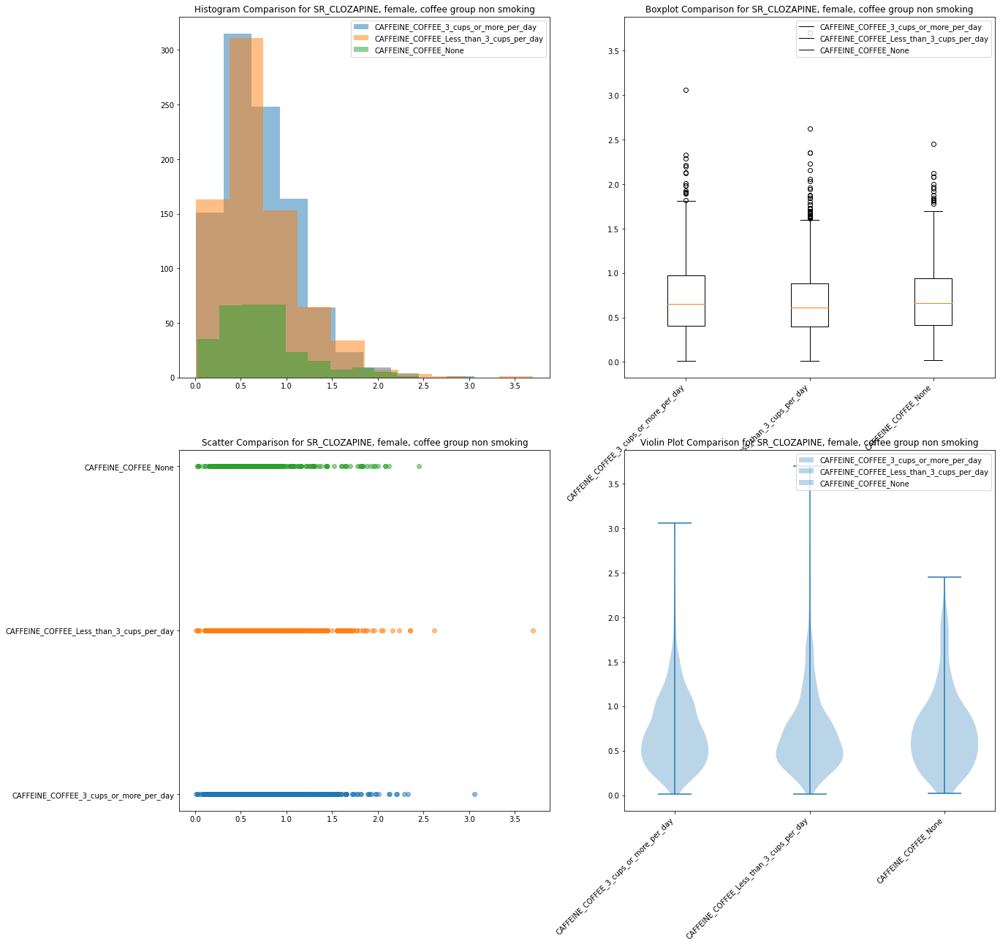

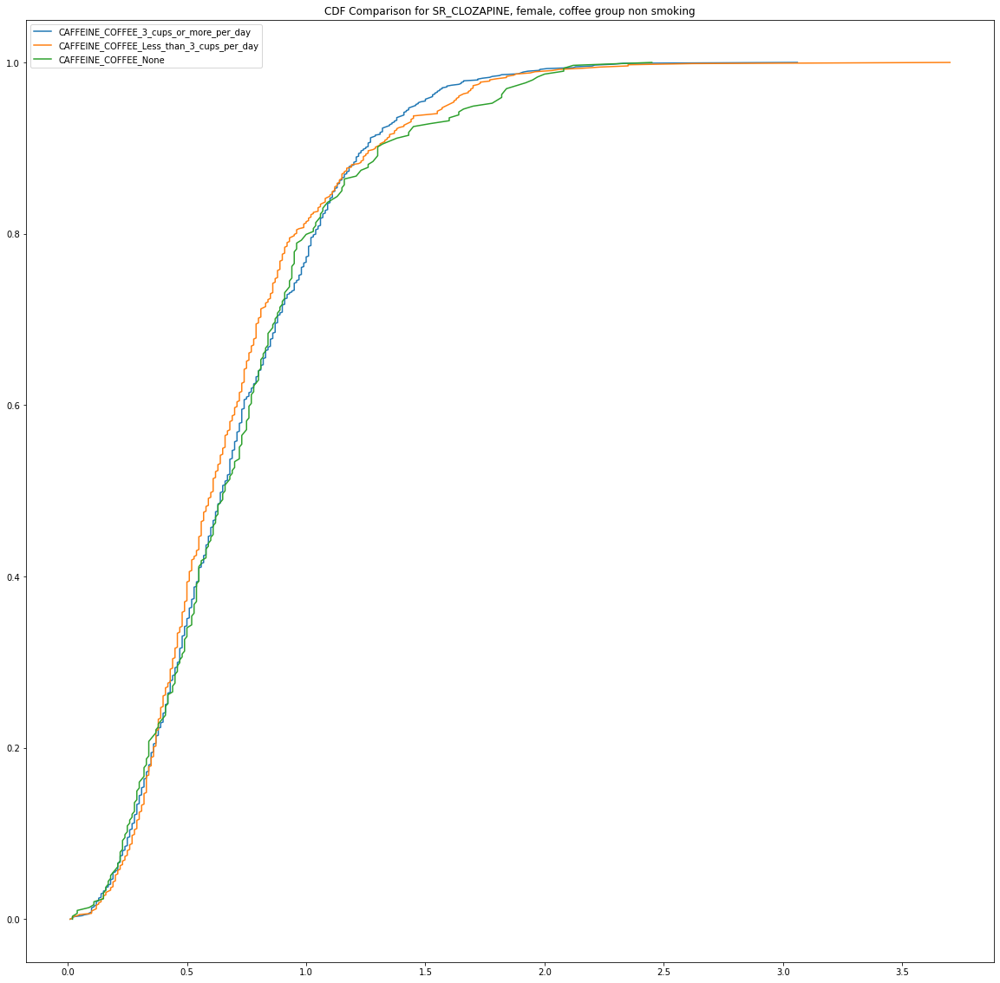

H=2.73629129607349, p=0.25457860045108704


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking females in the coffee group was not statistically signficant, H (2, N = 2012)=2.74 ,p>.05
979 738 295
n=2012


SR_CLOZAPINE   female   chocolate group   smoking
SR_CLOZAPINE 0 1 SR_DERIVED_SMOKER_STATUS_Smoker


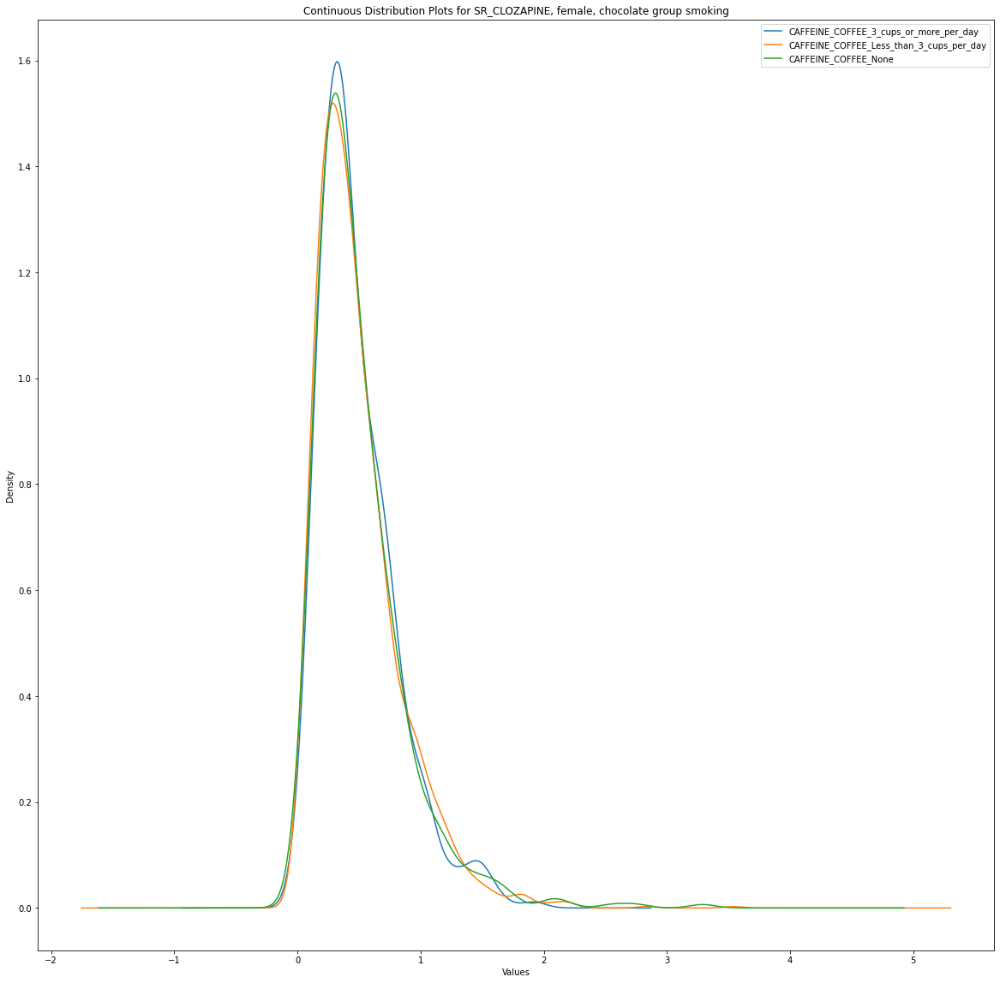

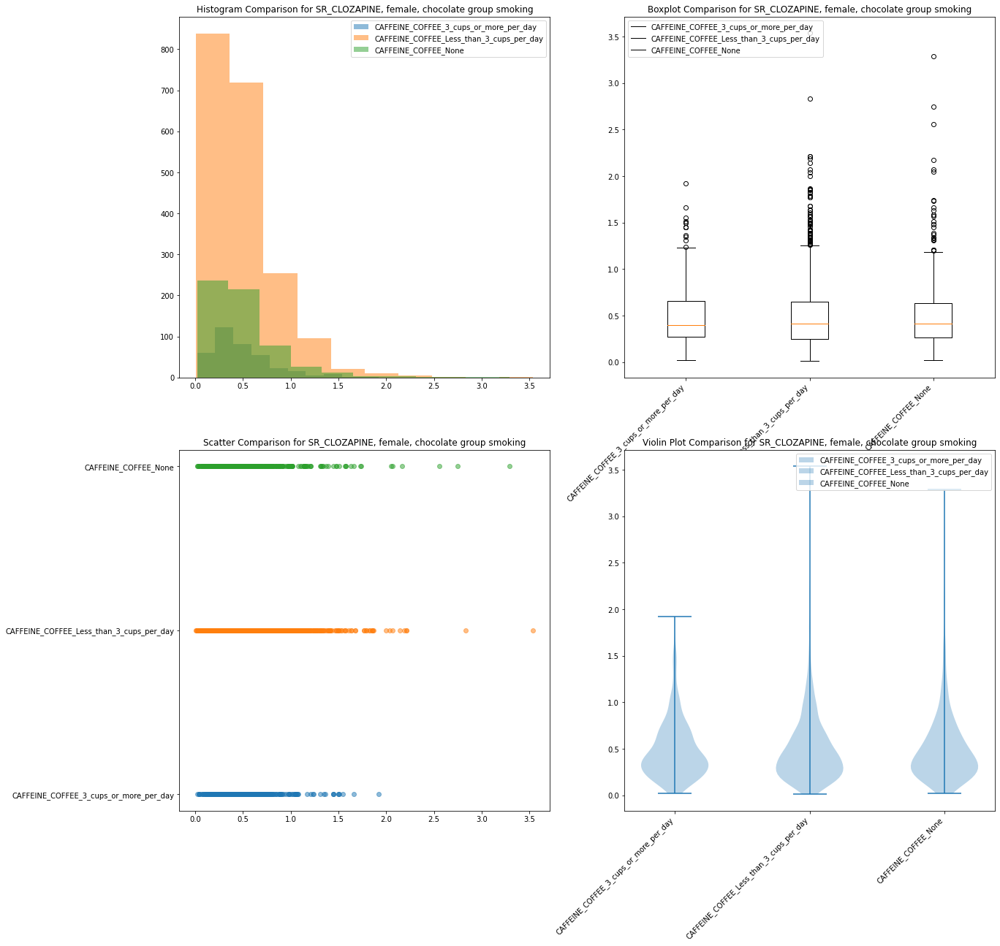

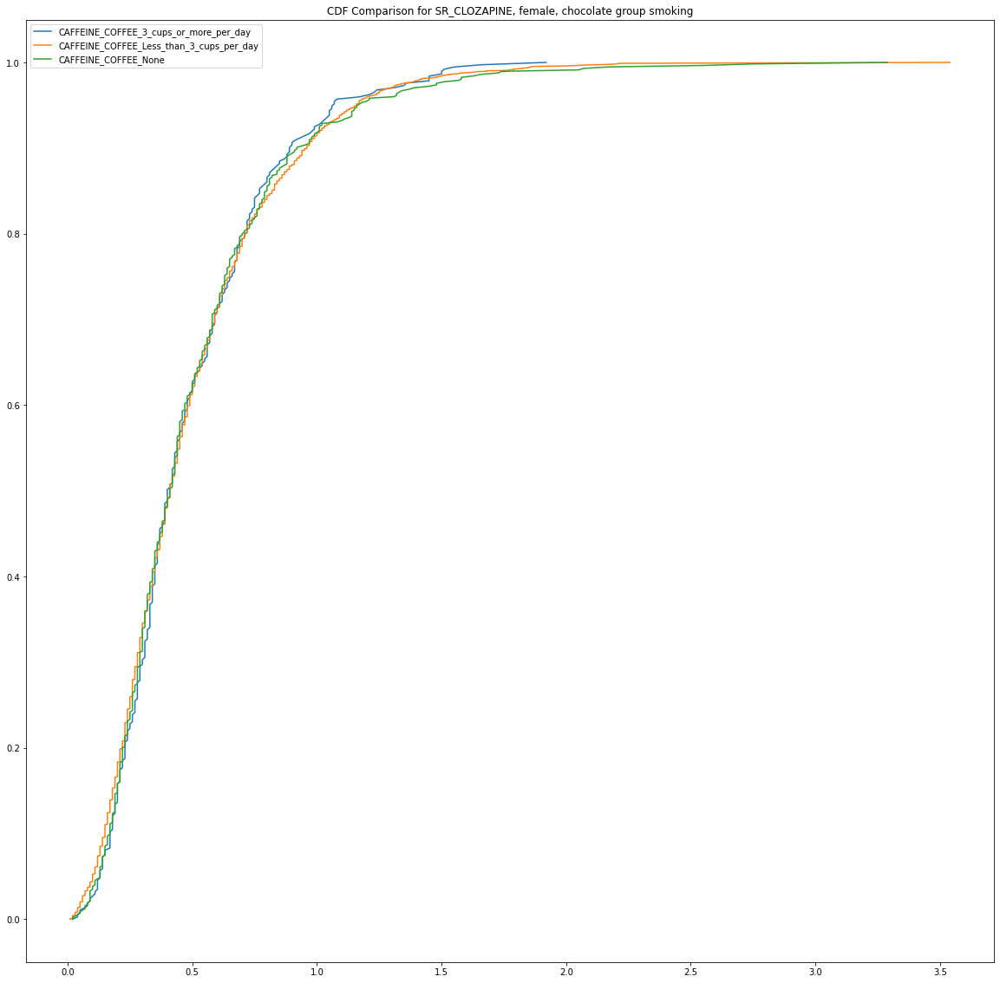

H=0.25214699475474456, p=0.8815500527854487


A Kruskal-Wallis test on SR_CLOZAPINE between smoking females in the chocolate group was not statistically signficant, H (2, N = 2893)=0.25 ,p>.05
374 1943 576
n=2893


SR_CLOZAPINE   female   chocolate group   non smoking
SR_CLOZAPINE 0 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


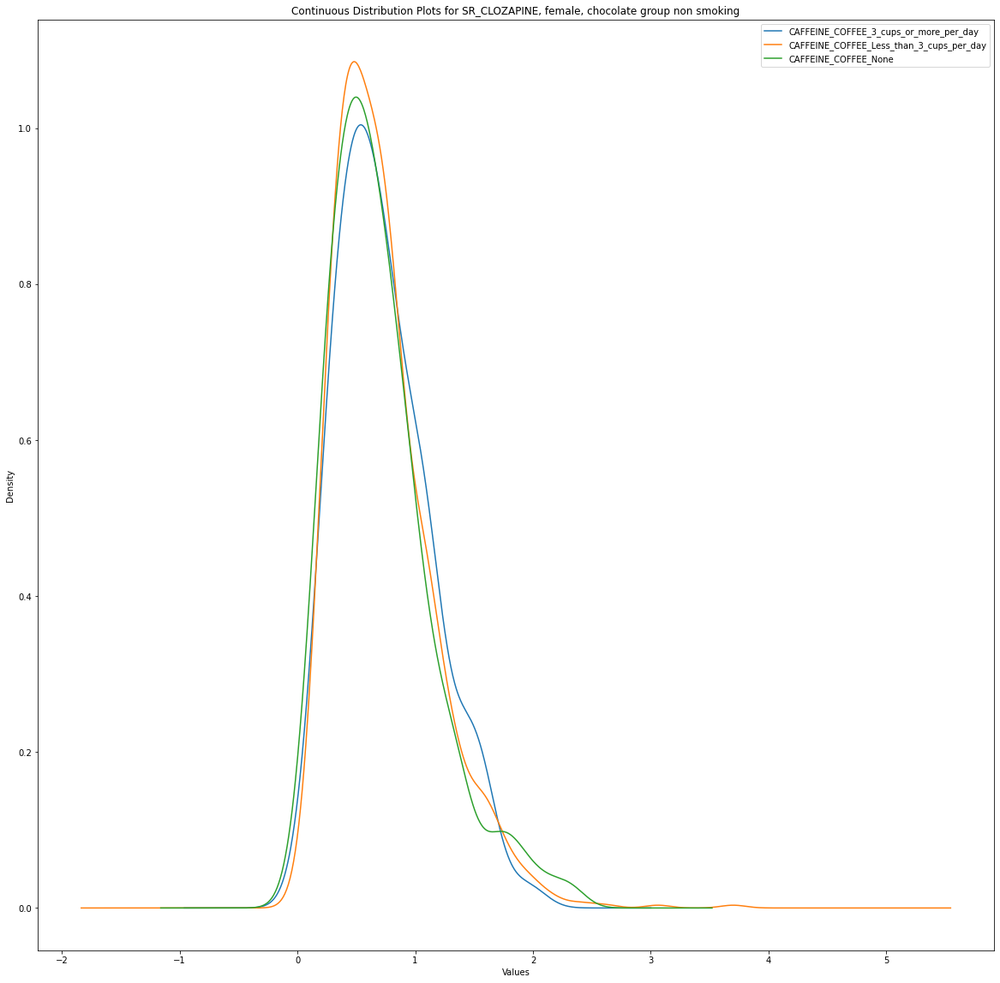

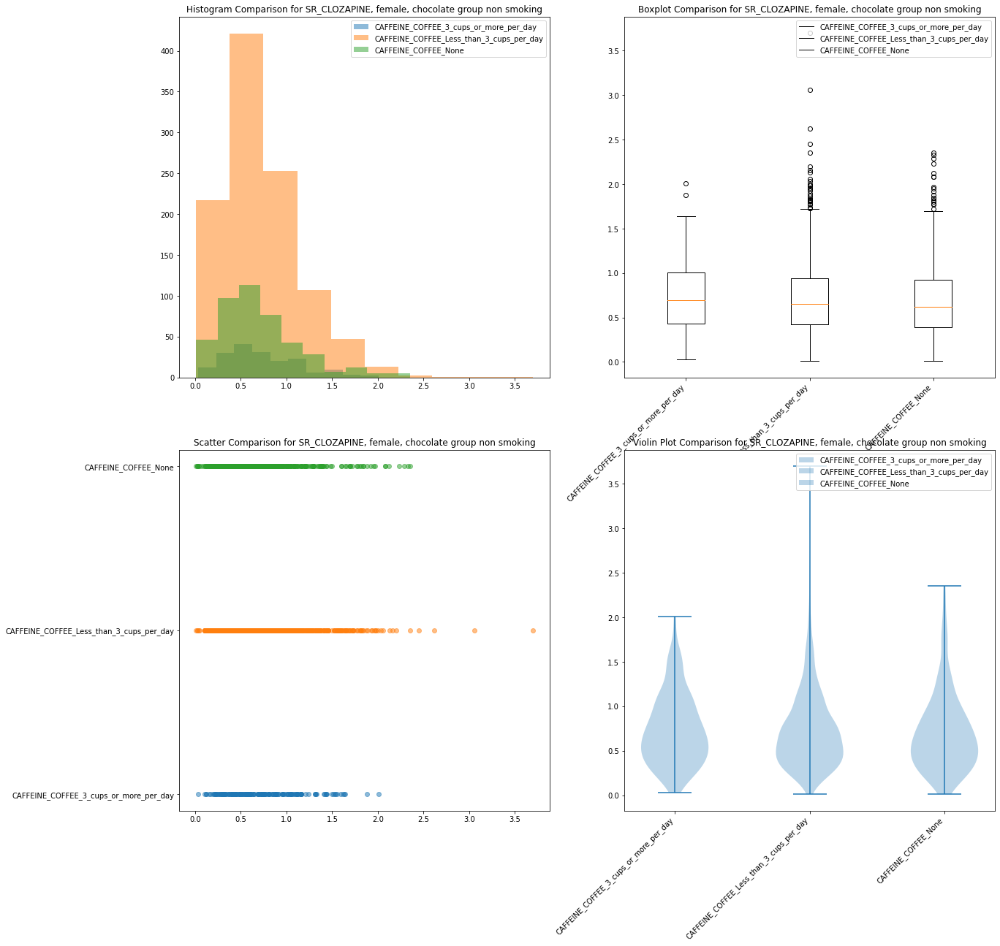

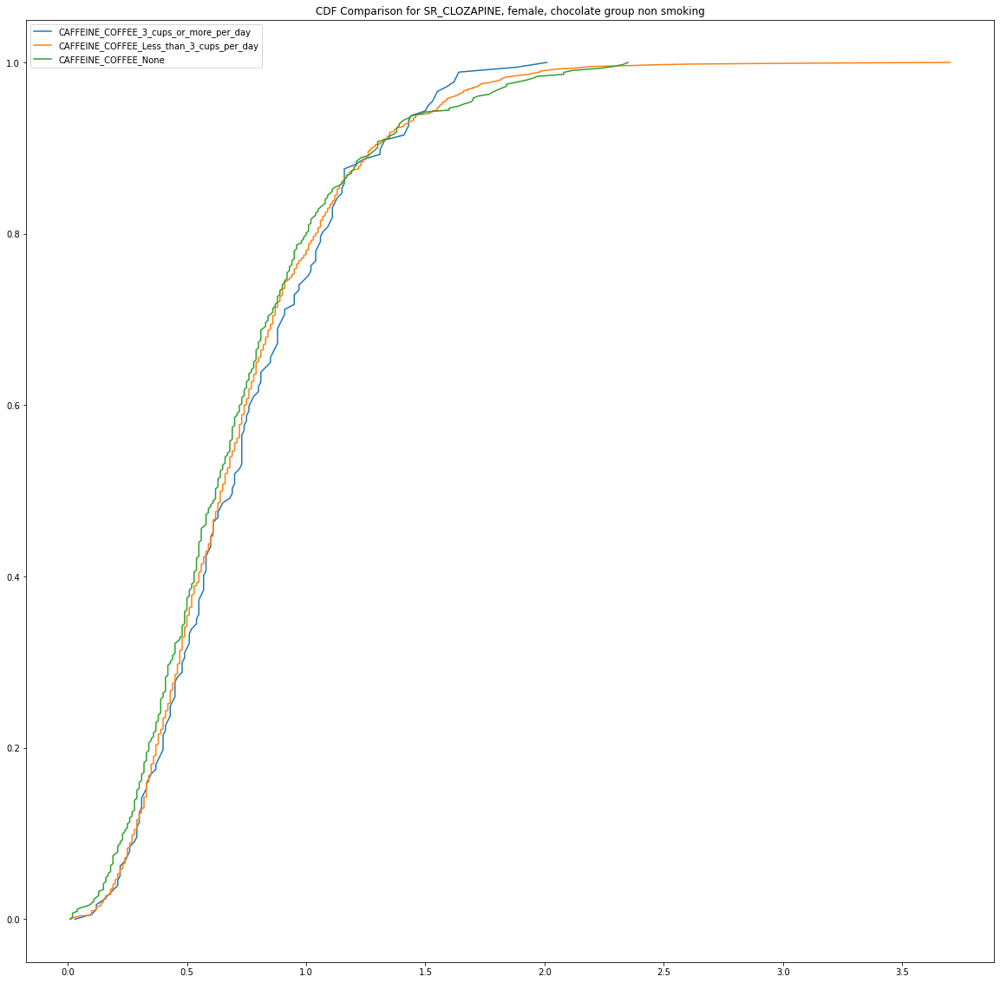

H=2.5234896055518092, p=0.2831595376851145


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking females in the chocolate group was not statistically signficant, H (2, N = 1674)=2.52 ,p>.05
178 1063 433
n=1674


SR_CLOZAPINE   male   coffee group   smoking
SR_CLOZAPINE 1 1 SR_DERIVED_SMOKER_STATUS_Smoker


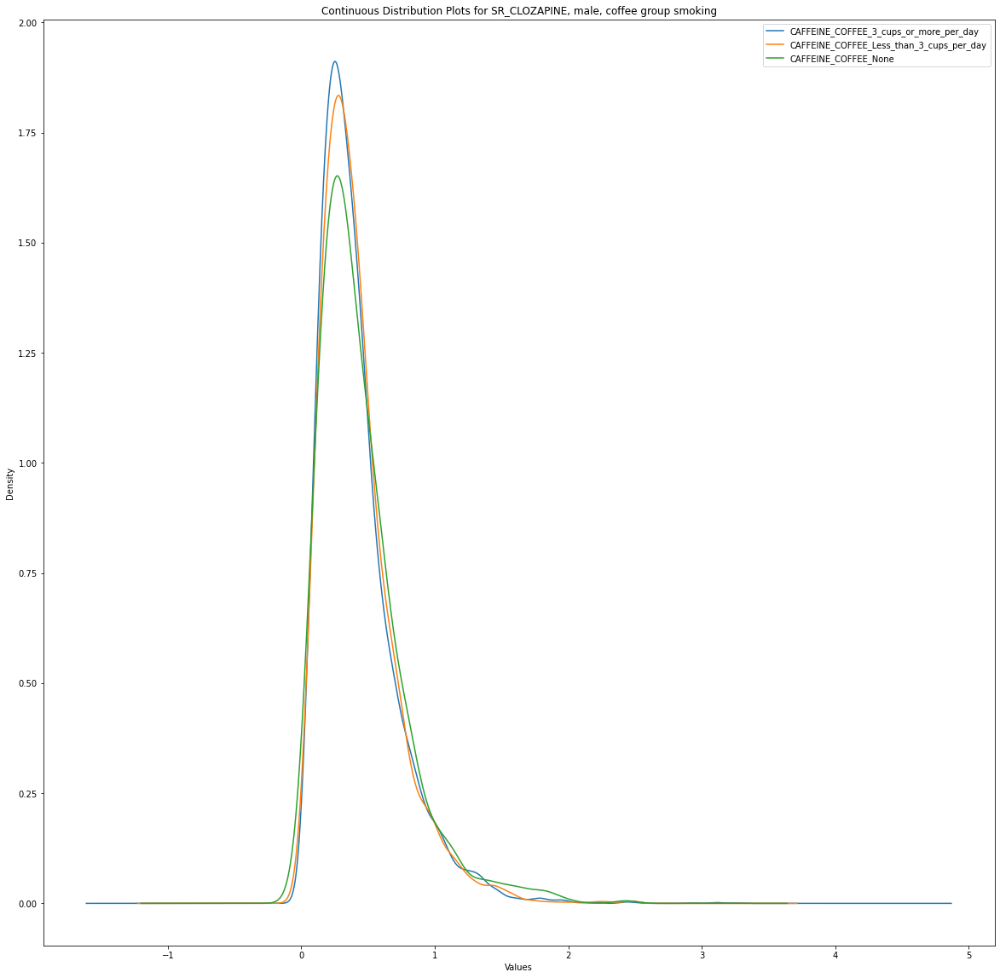

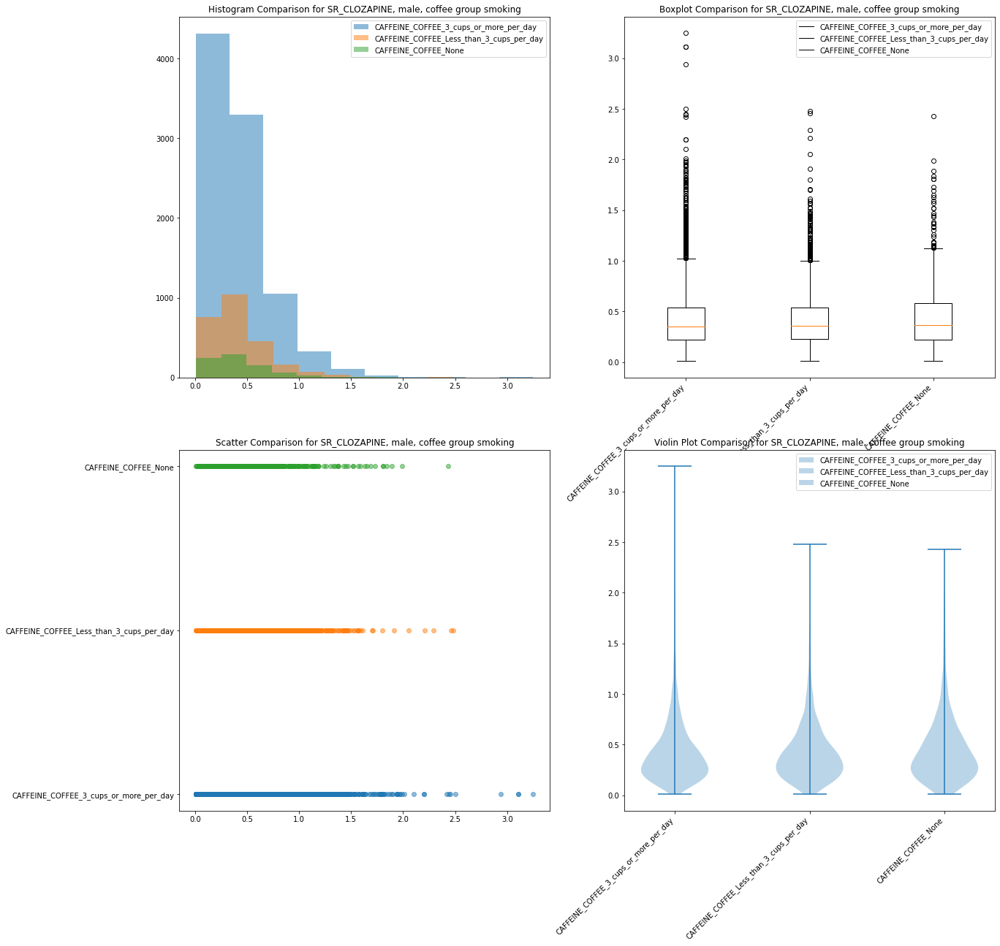

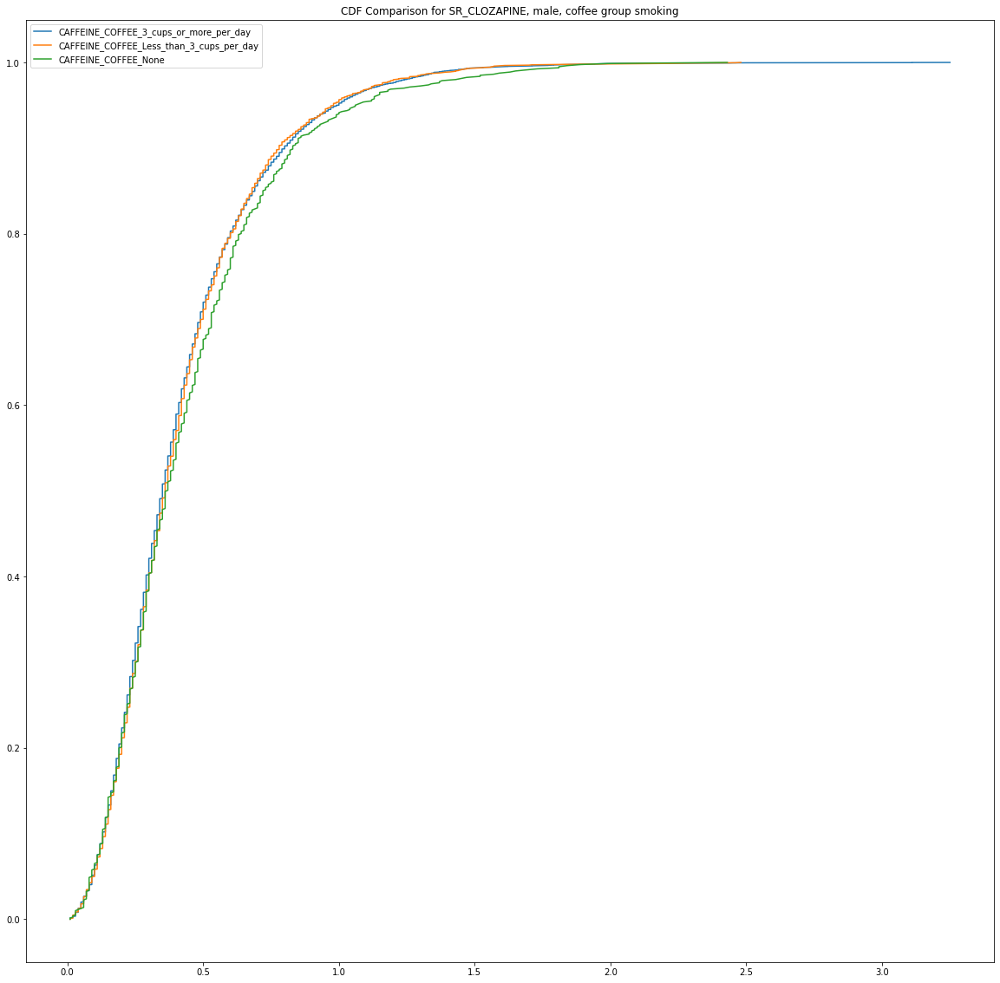

H=4.495474910872997, p=0.10563796498297016


A Kruskal-Wallis test on SR_CLOZAPINE between smoking males in the coffee group was not statistically signficant, H (2, N = 12463)=4.5 ,p>.05
9131 2530 802
n=12463


SR_CLOZAPINE   male   coffee group   non smoking
SR_CLOZAPINE 1 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


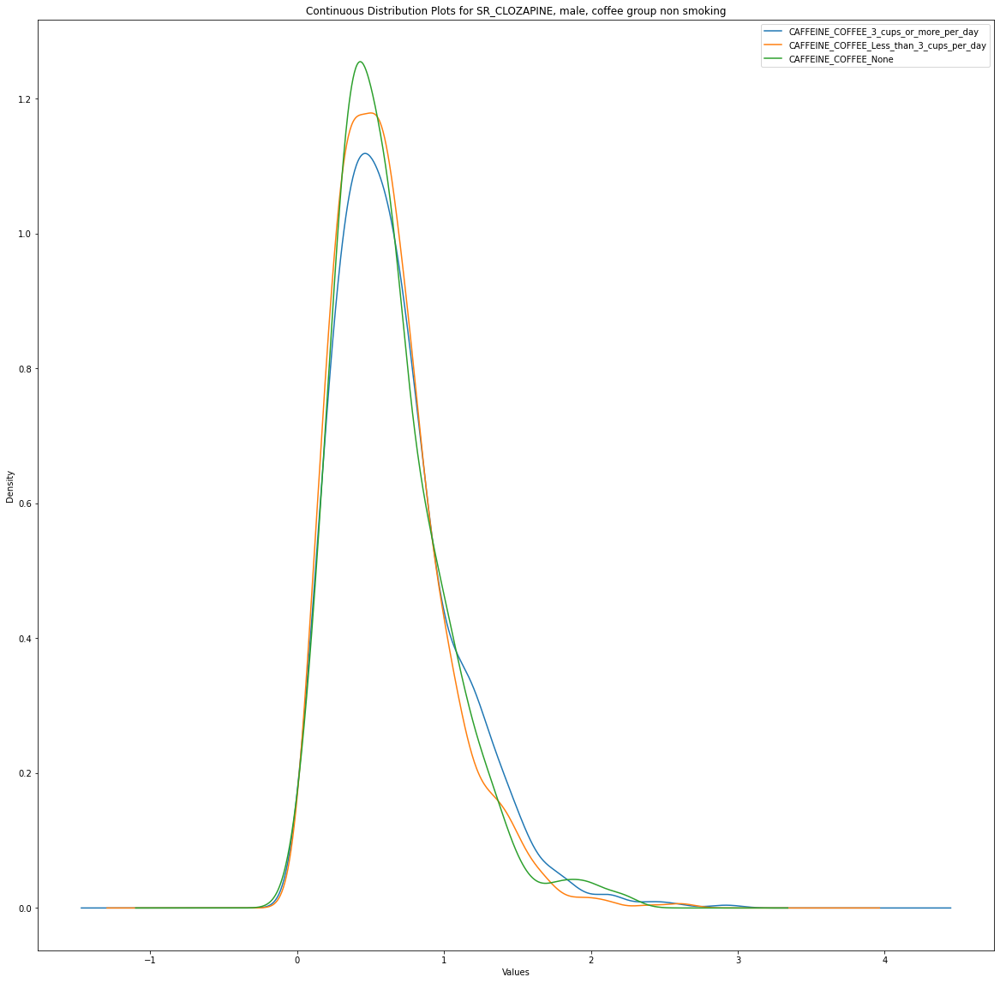

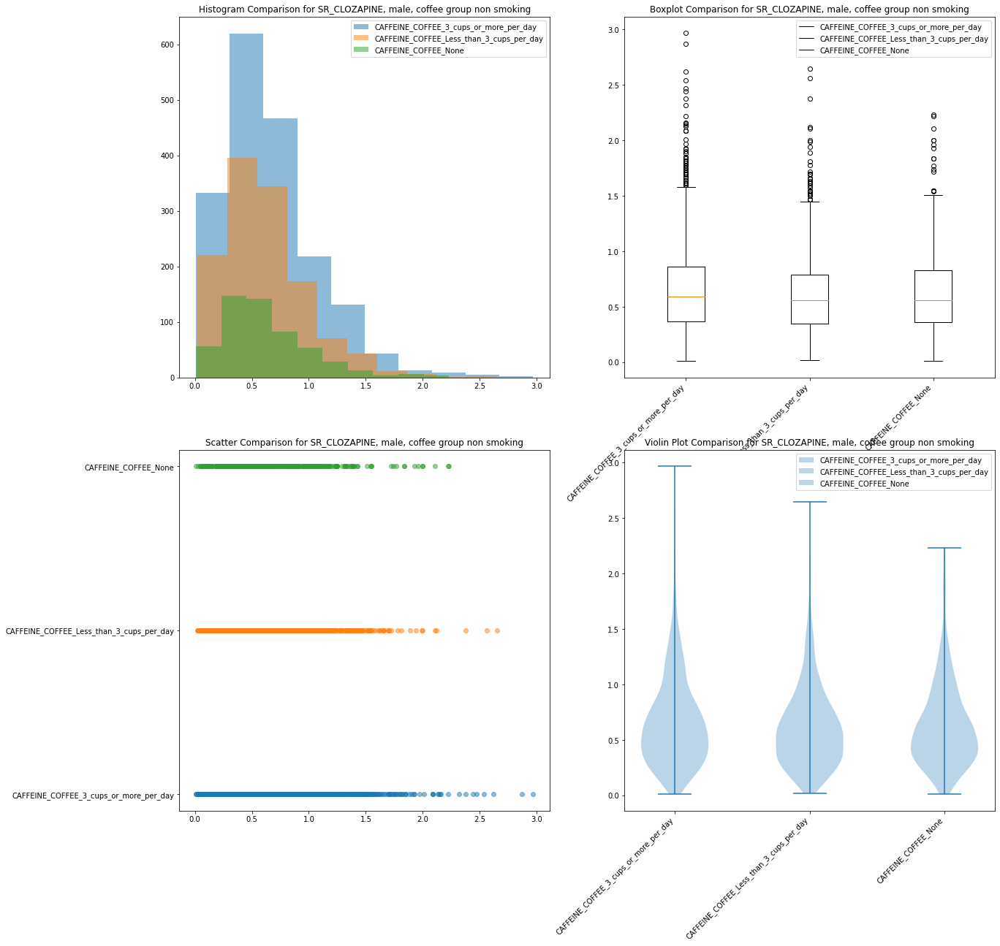

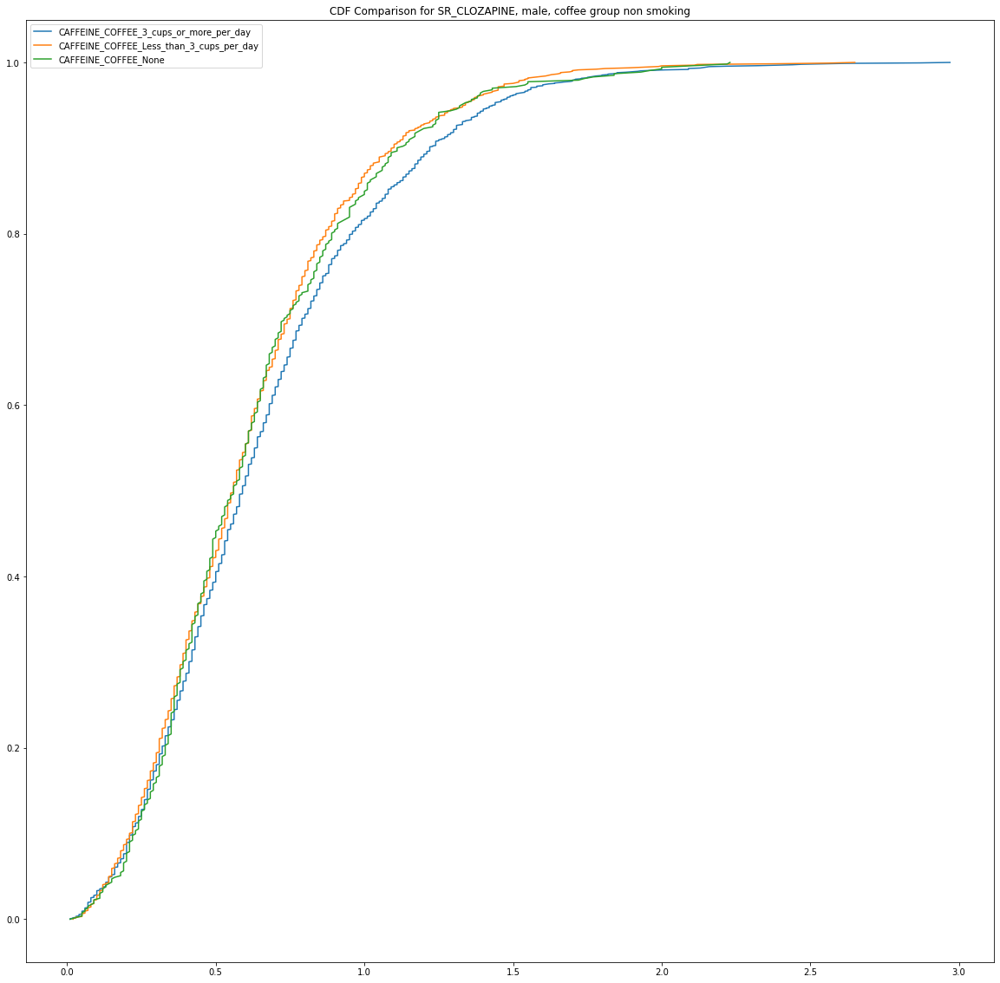

H=9.01695365515992, p=0.011015225492001823


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking males in the coffee group was statistically signficant at H (2, N = 3639)=9.02 ,p<.05
1838 1268 533
n=3639


SR_CLOZAPINE   male   chocolate group   smoking
SR_CLOZAPINE 1 1 SR_DERIVED_SMOKER_STATUS_Smoker


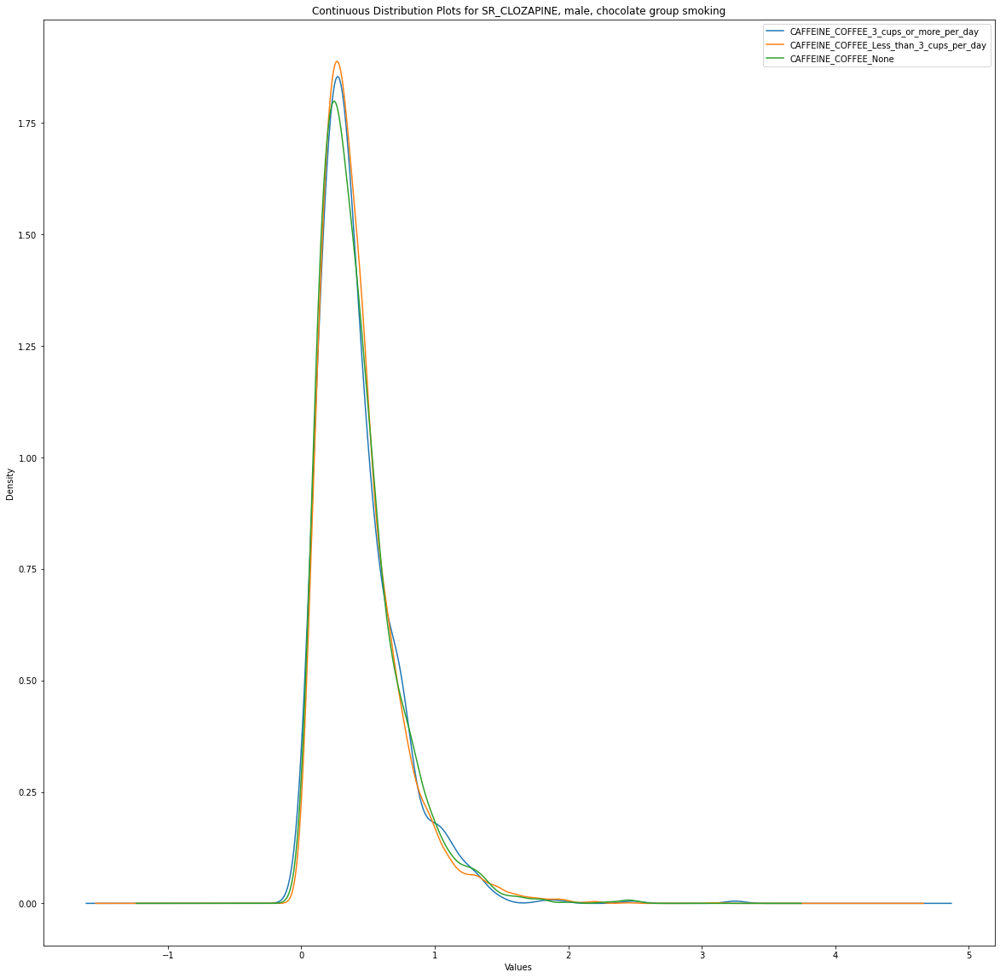

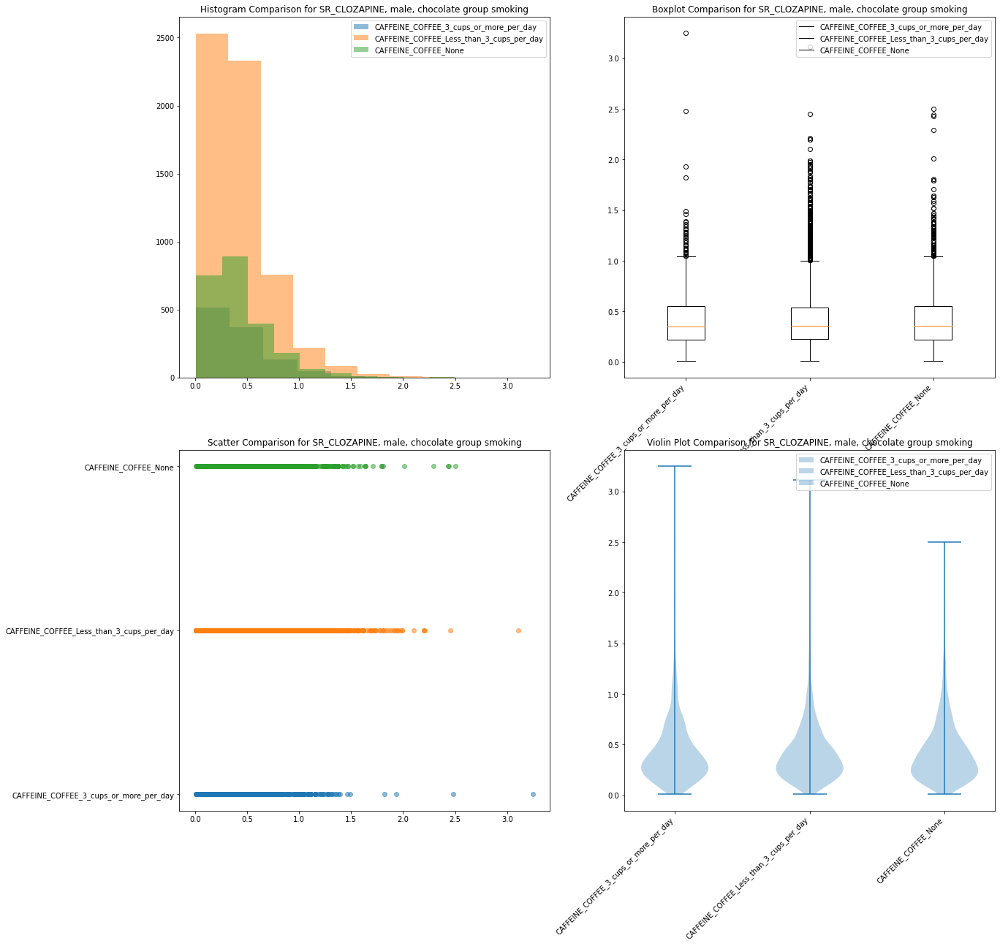

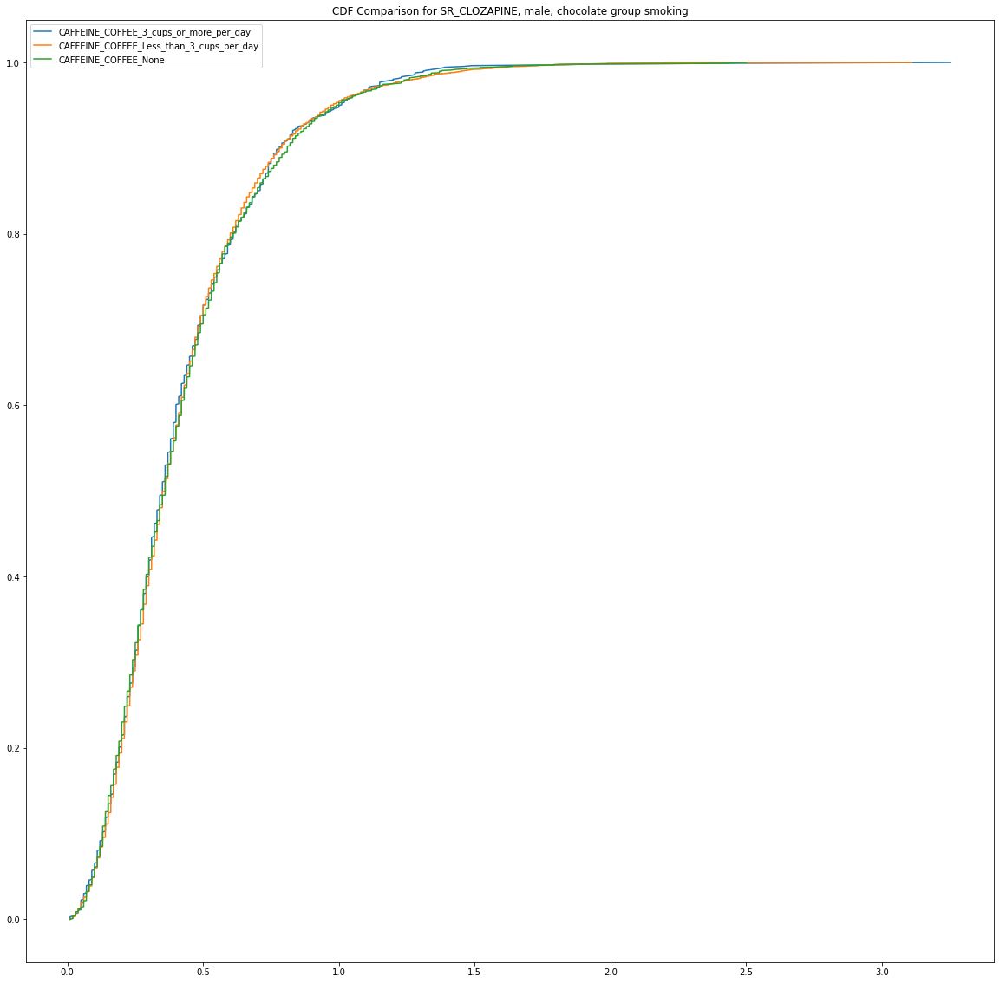

H=0.4706832939477187, p=0.7903007996238487


A Kruskal-Wallis test on SR_CLOZAPINE between smoking males in the chocolate group was not statistically signficant, H (2, N = 9368)=0.47 ,p>.05
1073 5963 2332
n=9368


SR_CLOZAPINE   male   chocolate group   non smoking
SR_CLOZAPINE 1 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


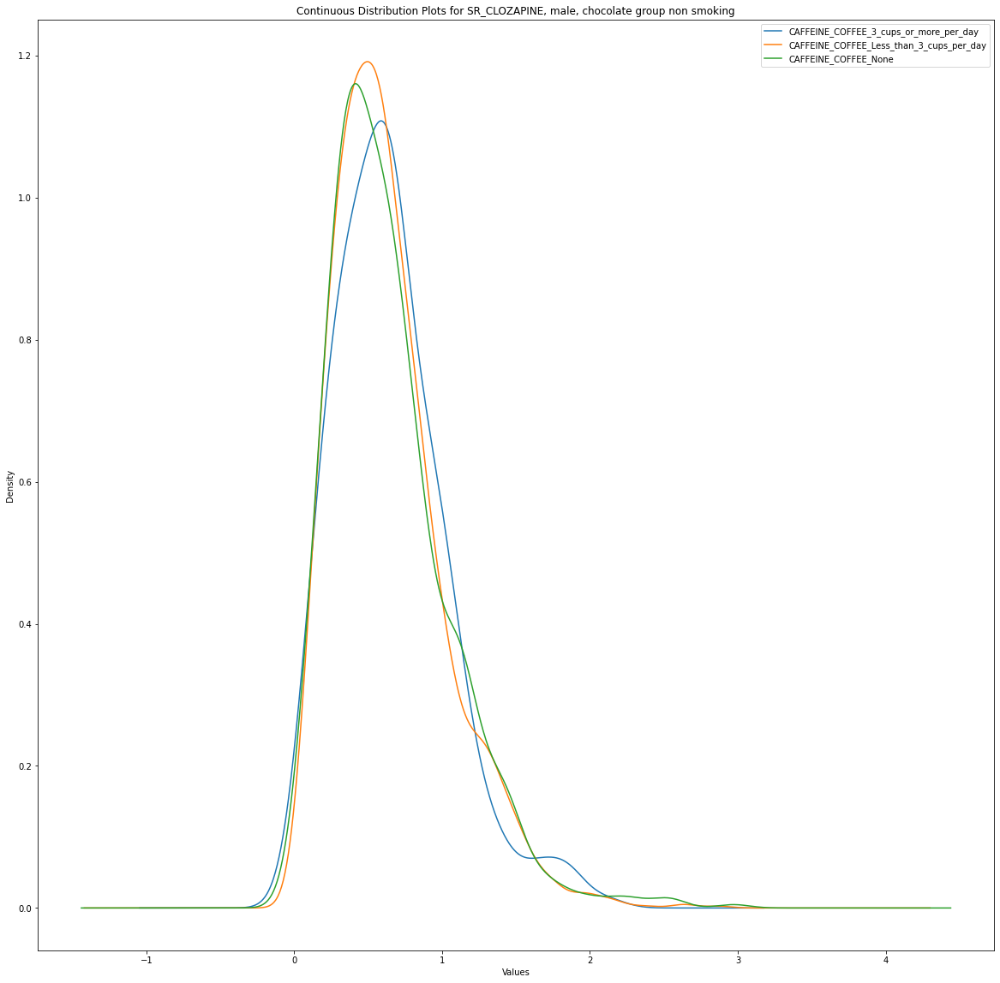

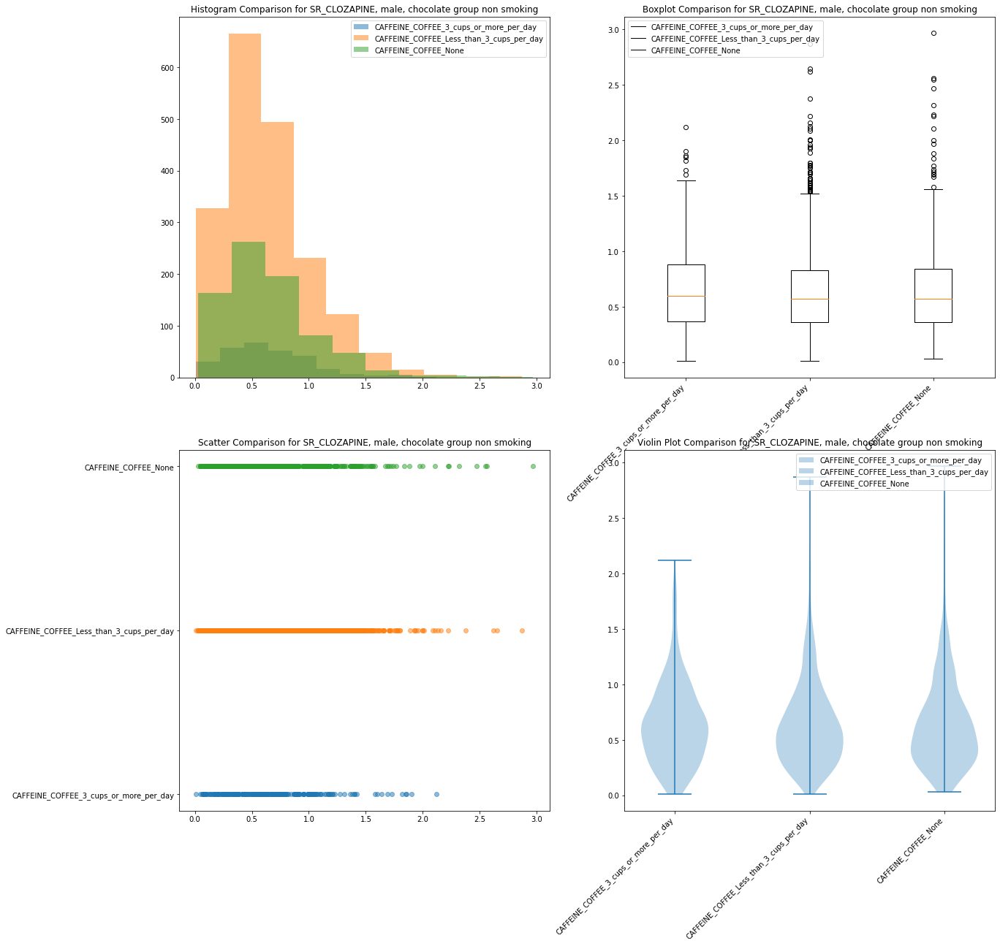

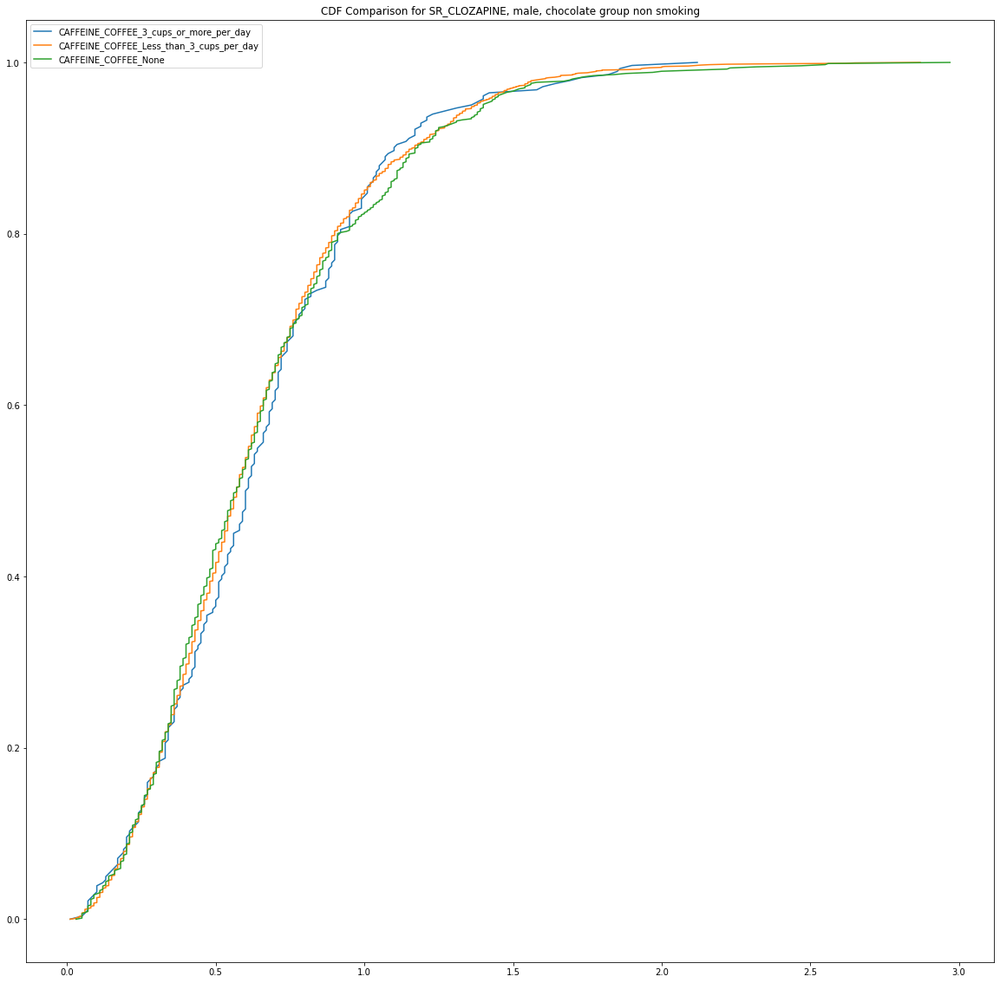

H=0.6666330130034147, p=0.7165433676269477


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking males in the chocolate group was not statistically signficant, H (2, N = 2973)=0.67 ,p>.05
283 1913 777
n=2973


SR_NORCLOZAPINE   female   coffee group   smoking
SR_NORCLOZAPINE 0 1 SR_DERIVED_SMOKER_STATUS_Smoker


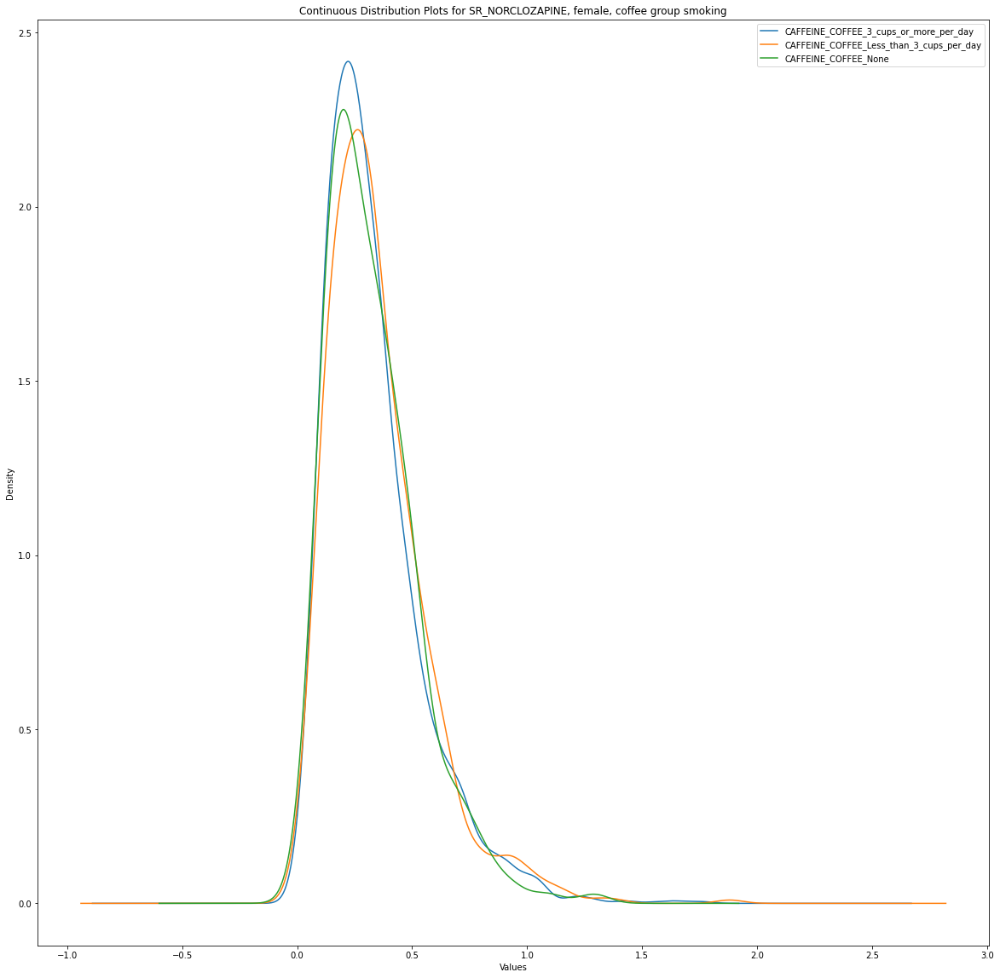

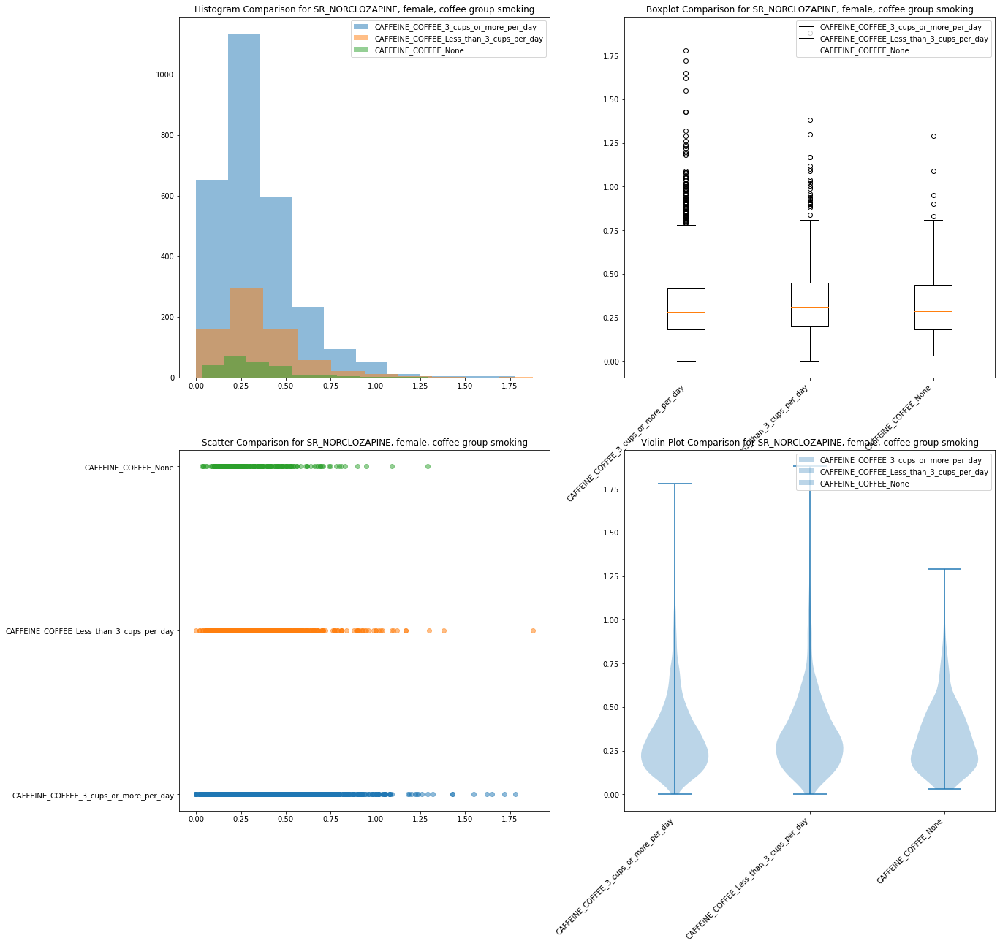

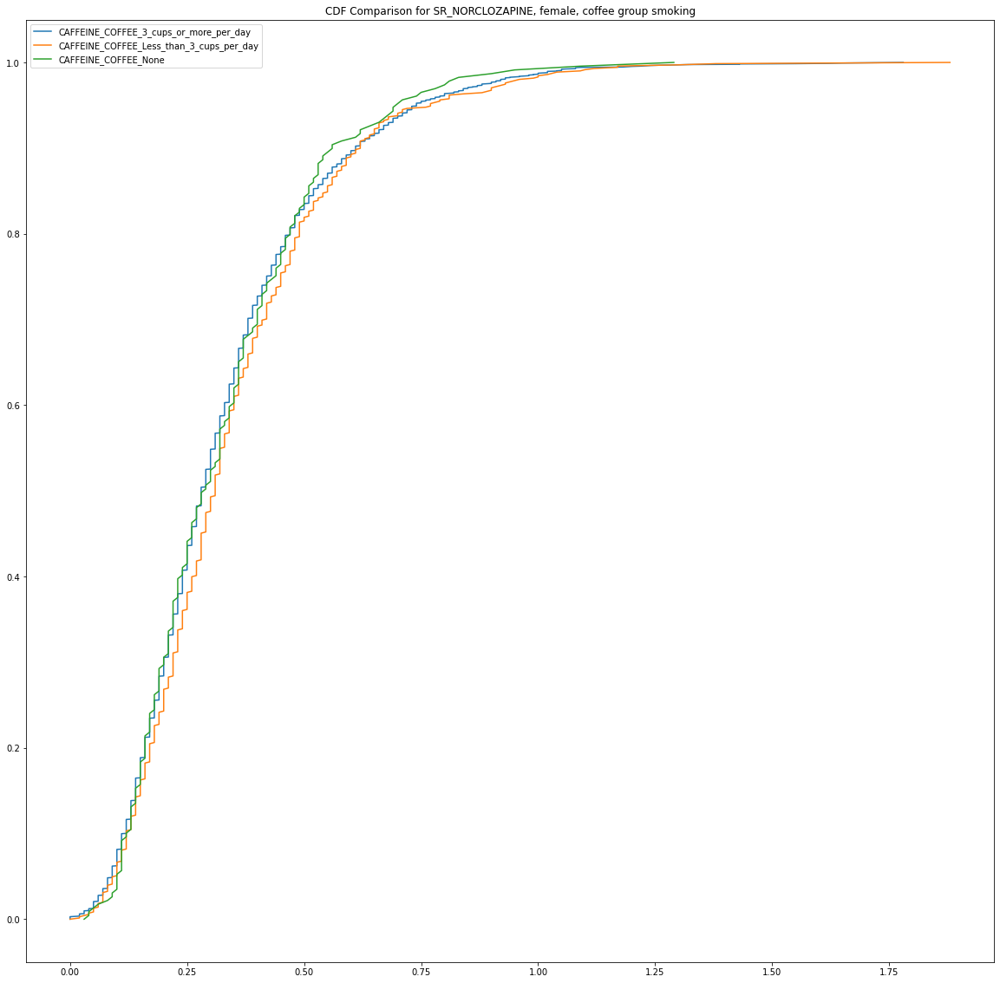

H=5.986281919276092, p=0.050129733713590134


A Kruskal-Wallis test on SR_NORCLOZAPINE between smoking females in the coffee group was not statistically signficant, H (2, N = 3715)=5.99 ,p>.05
2776 709 230
n=3715


SR_CLOZAPINE   female   coffee group   non smoking
SR_CLOZAPINE 0 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


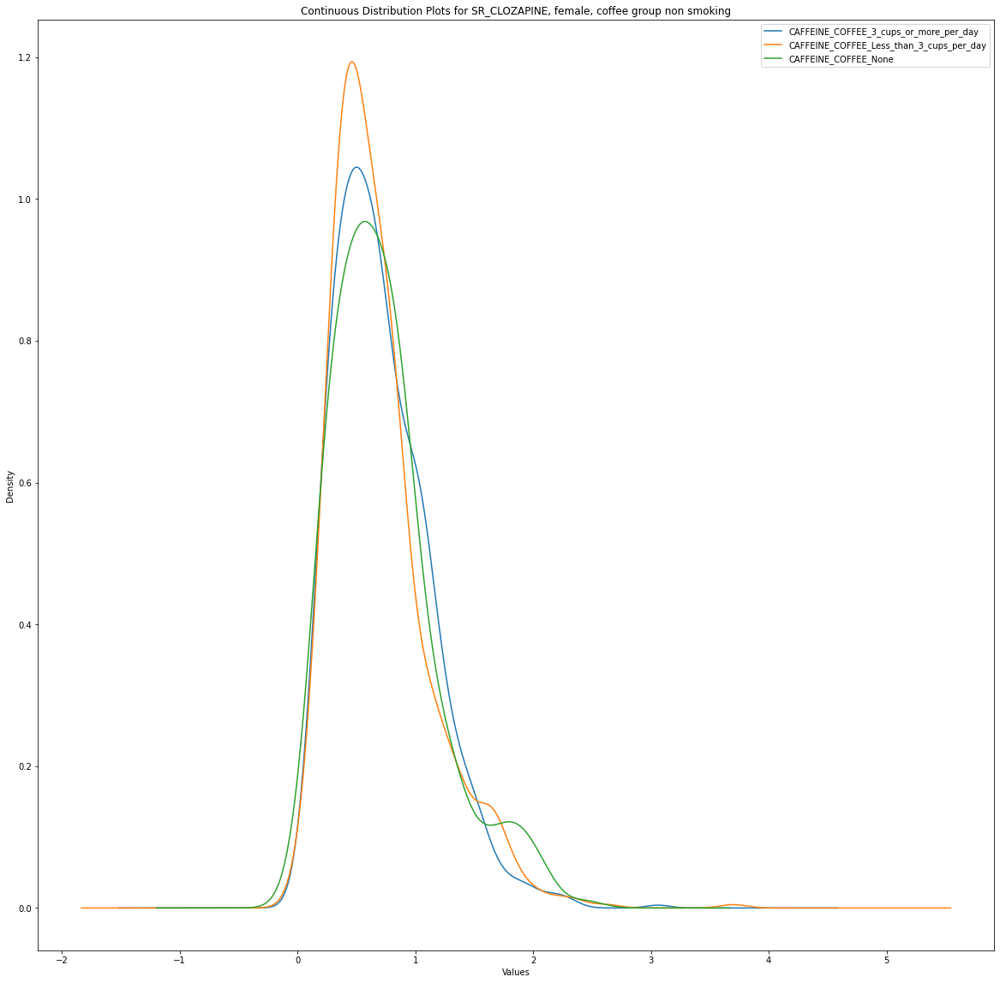

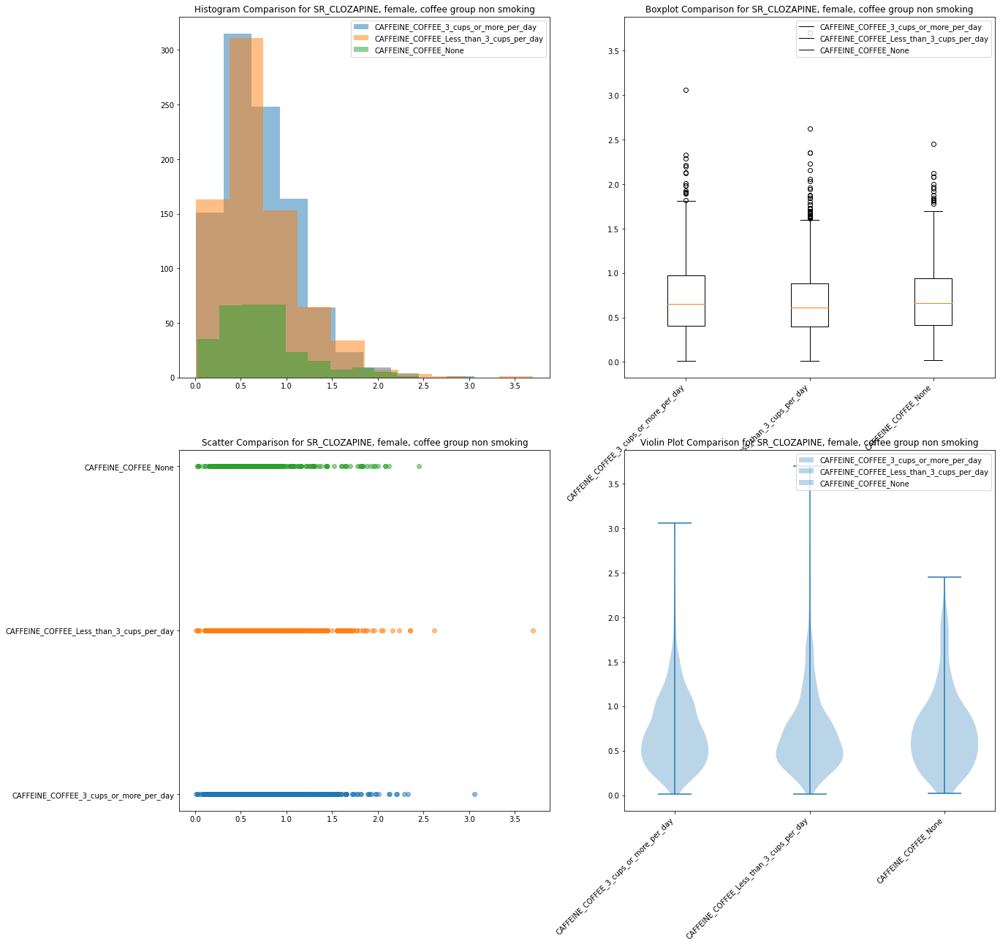

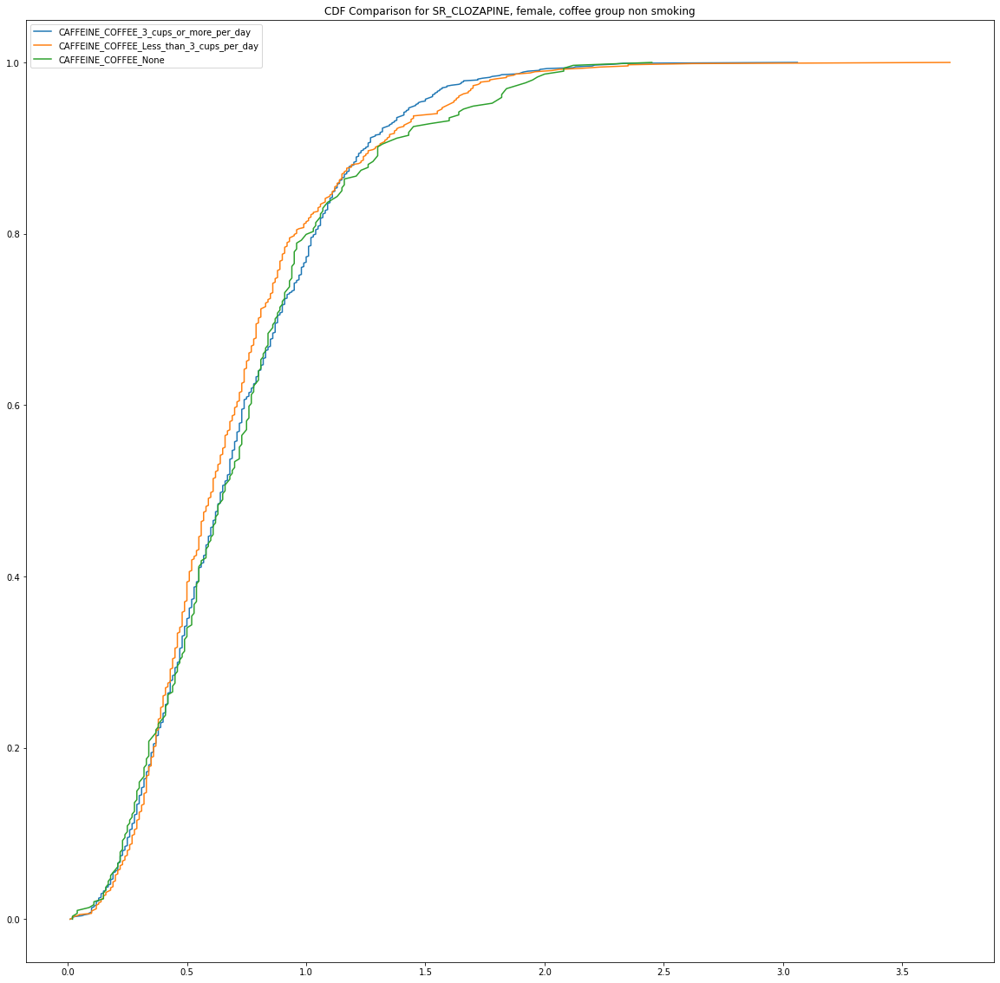

H=2.73629129607349, p=0.25457860045108704


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking females in the coffee group was not statistically signficant, H (2, N = 2012)=2.74 ,p>.05
979 738 295
n=2012


SR_CLOZAPINE   female   chocolate group   smoking
SR_CLOZAPINE 0 1 SR_DERIVED_SMOKER_STATUS_Smoker


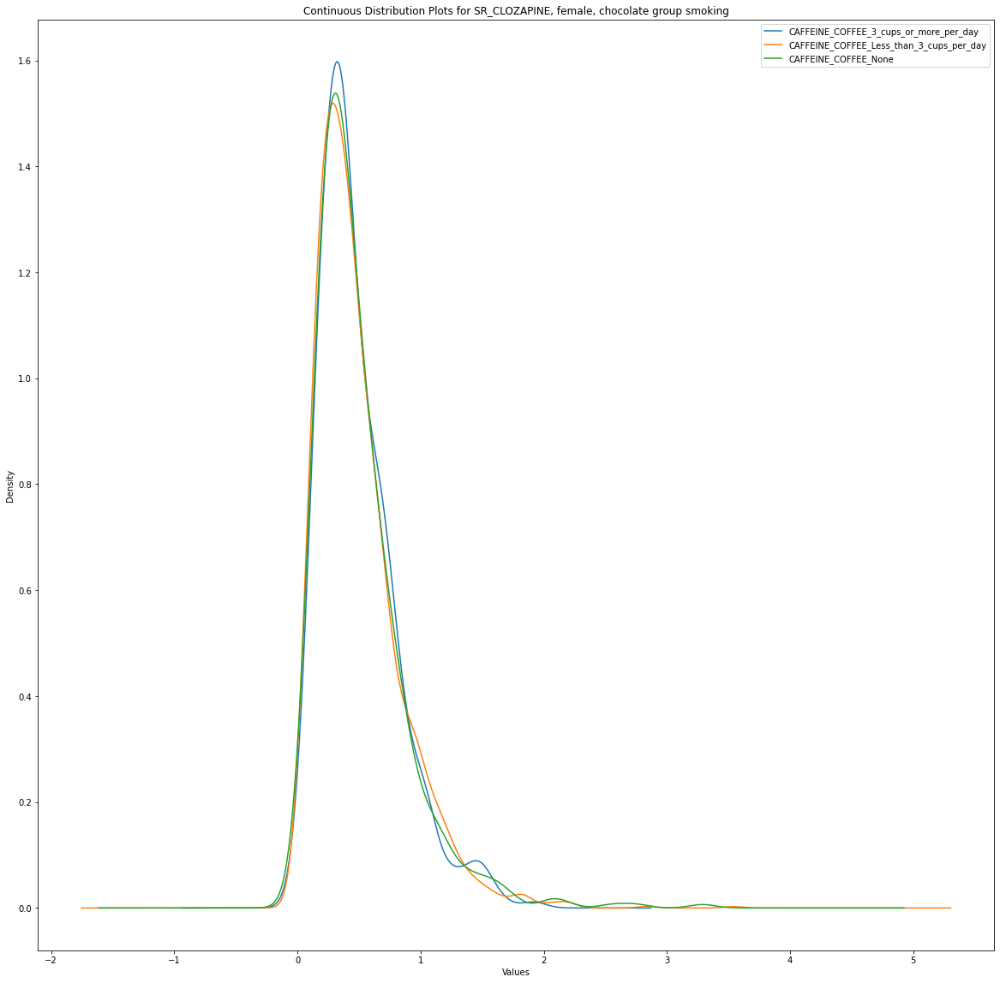

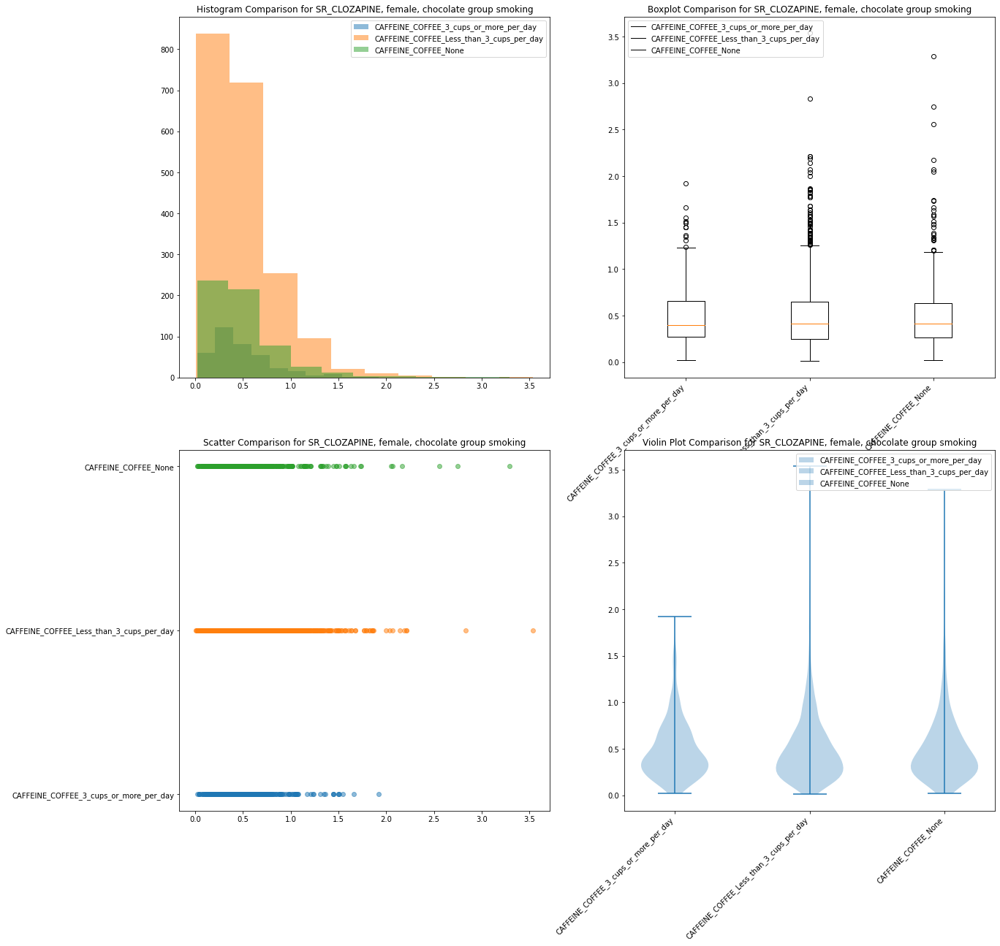

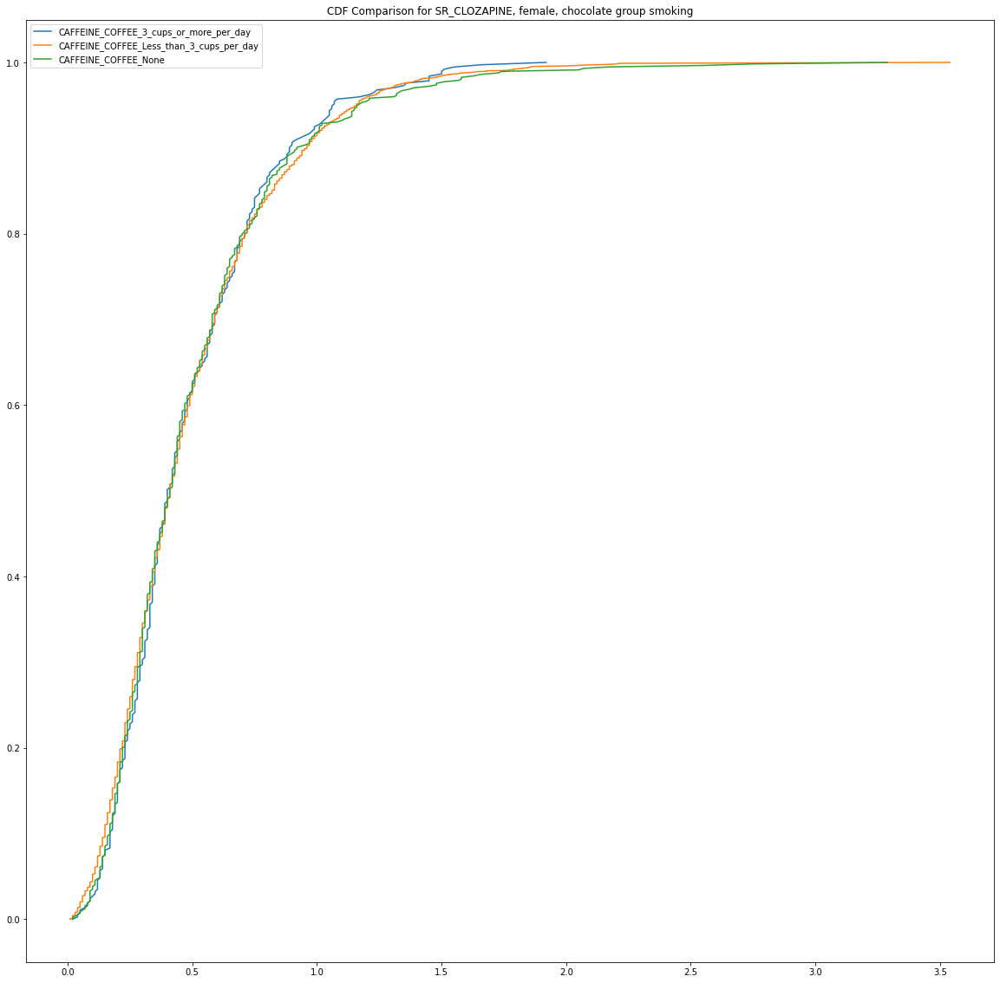

H=0.25214699475474456, p=0.8815500527854487


A Kruskal-Wallis test on SR_CLOZAPINE between smoking females in the chocolate group was not statistically signficant, H (2, N = 2893)=0.25 ,p>.05
374 1943 576
n=2893


SR_CLOZAPINE   female   chocolate group   non smoking
SR_CLOZAPINE 0 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


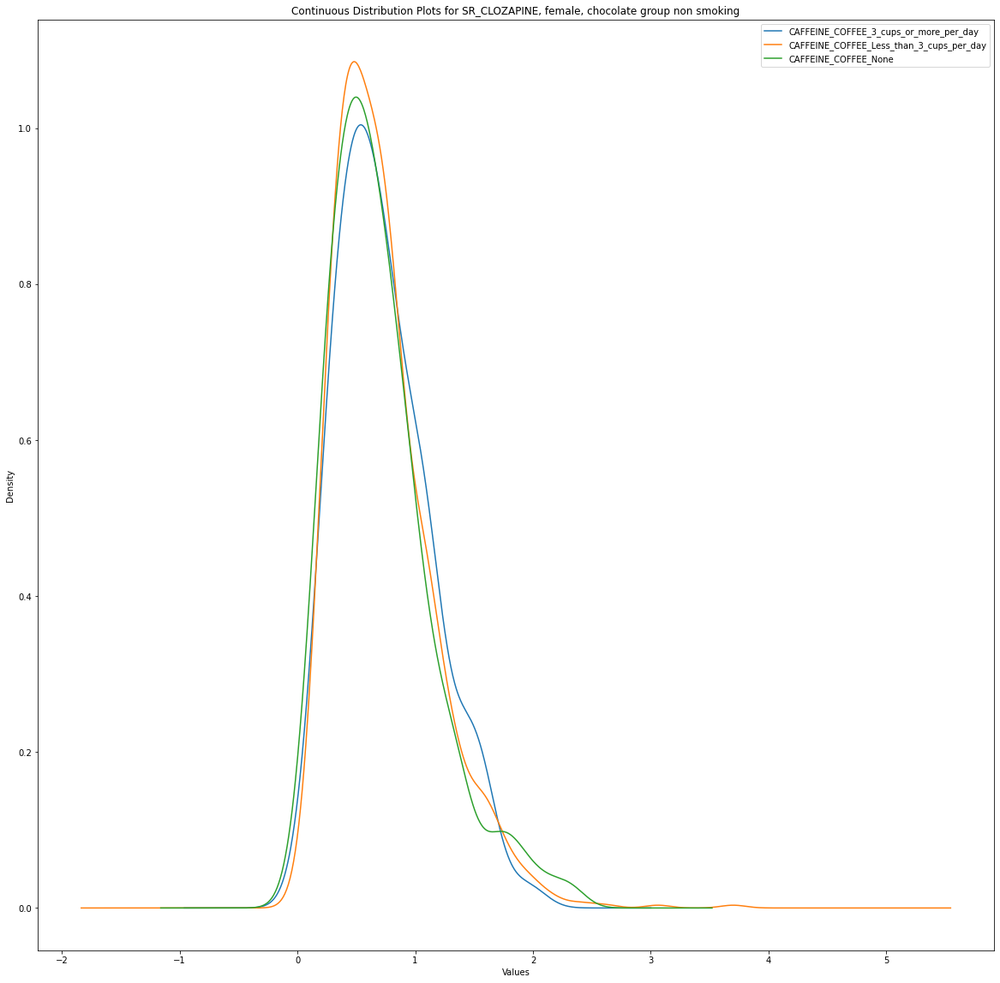

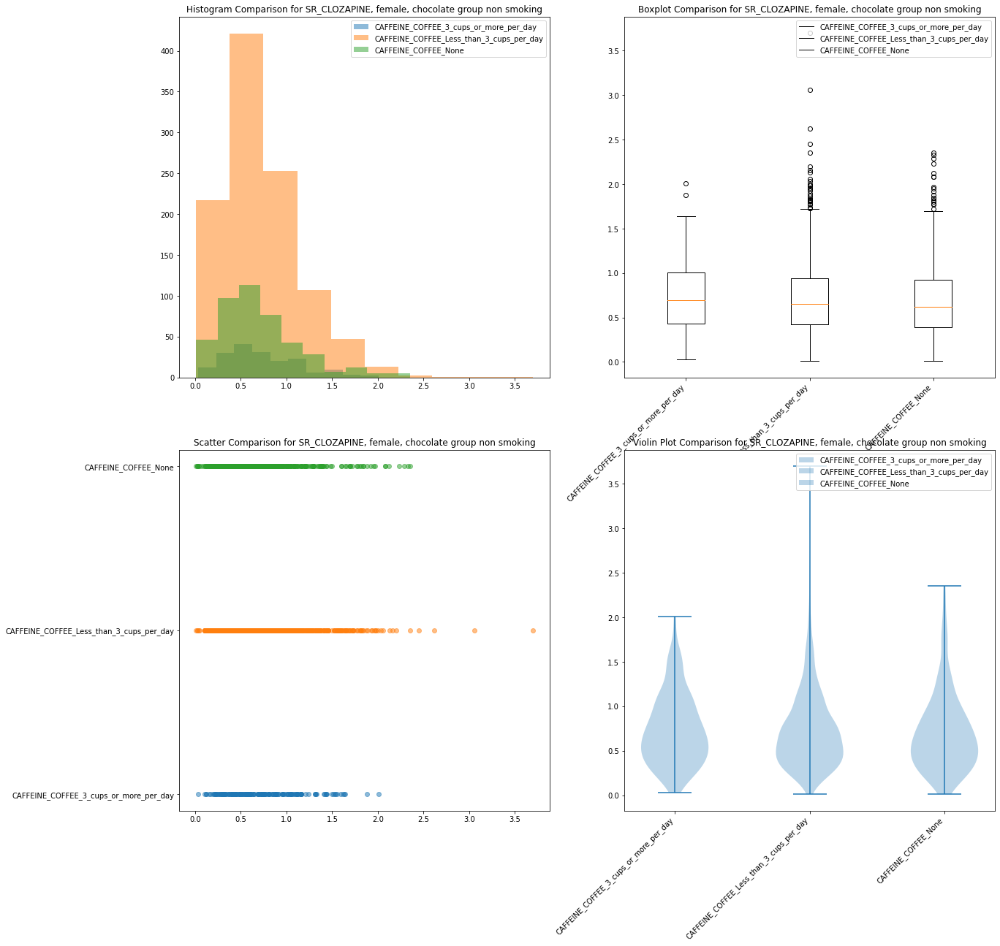

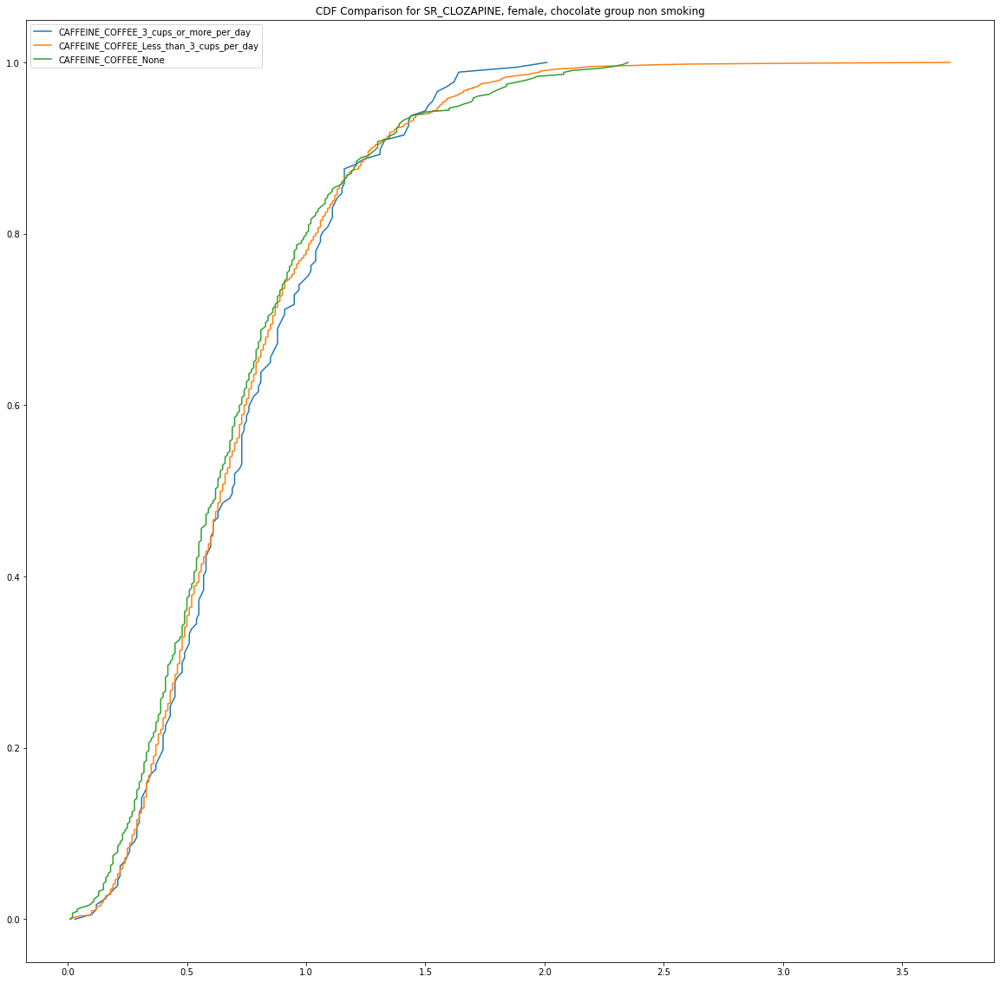

H=2.5234896055518092, p=0.2831595376851145


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking females in the chocolate group was not statistically signficant, H (2, N = 1674)=2.52 ,p>.05
178 1063 433
n=1674


SR_CLOZAPINE   male   coffee group   smoking
SR_CLOZAPINE 1 1 SR_DERIVED_SMOKER_STATUS_Smoker


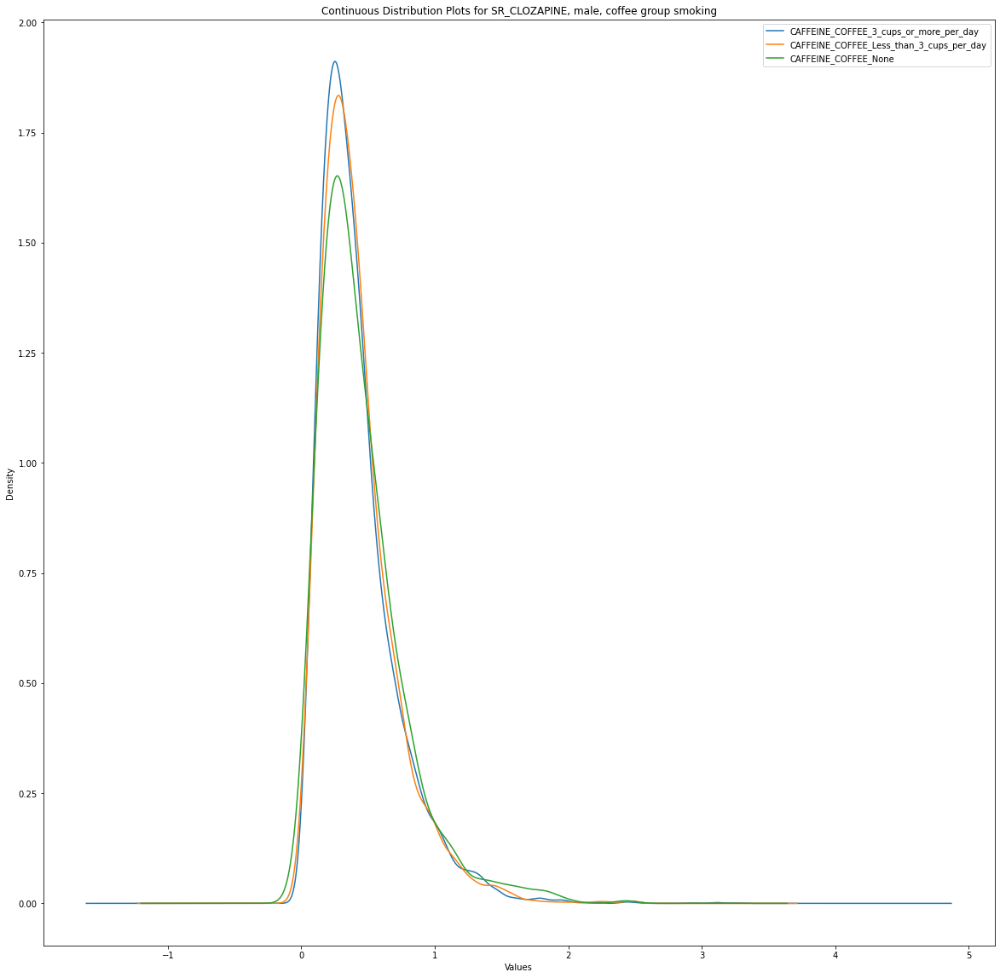

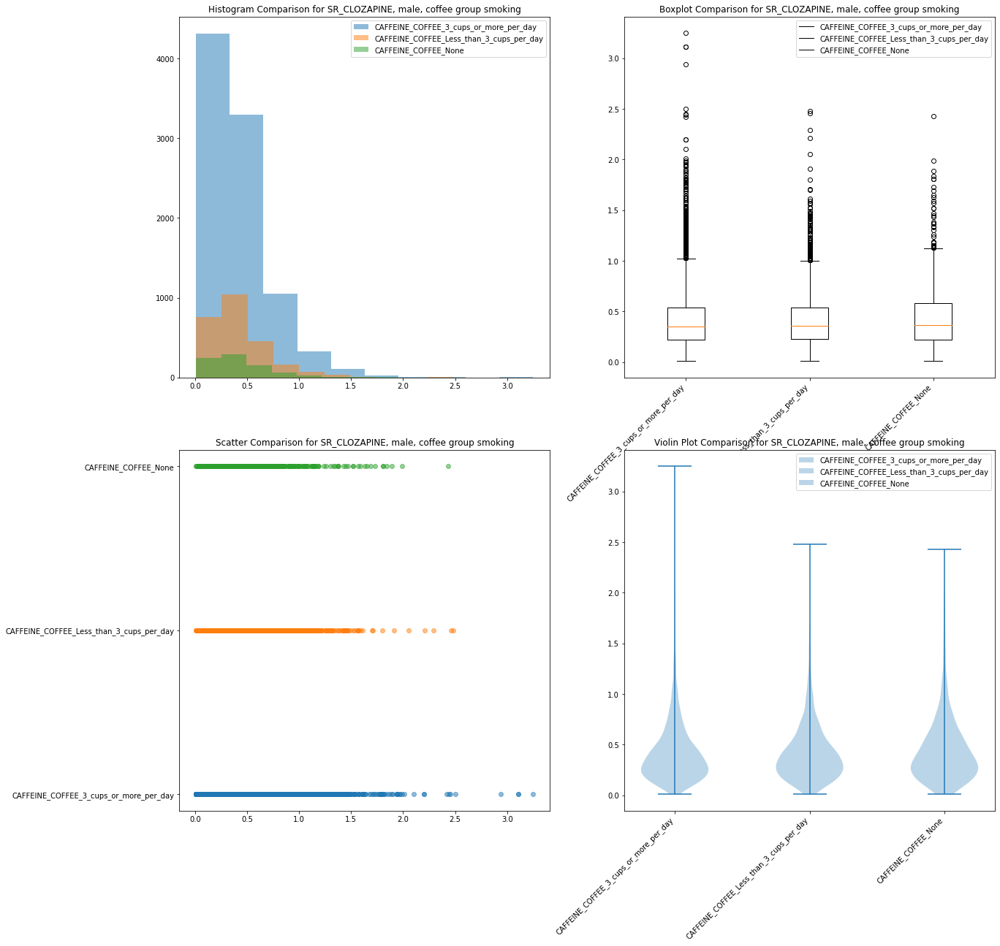

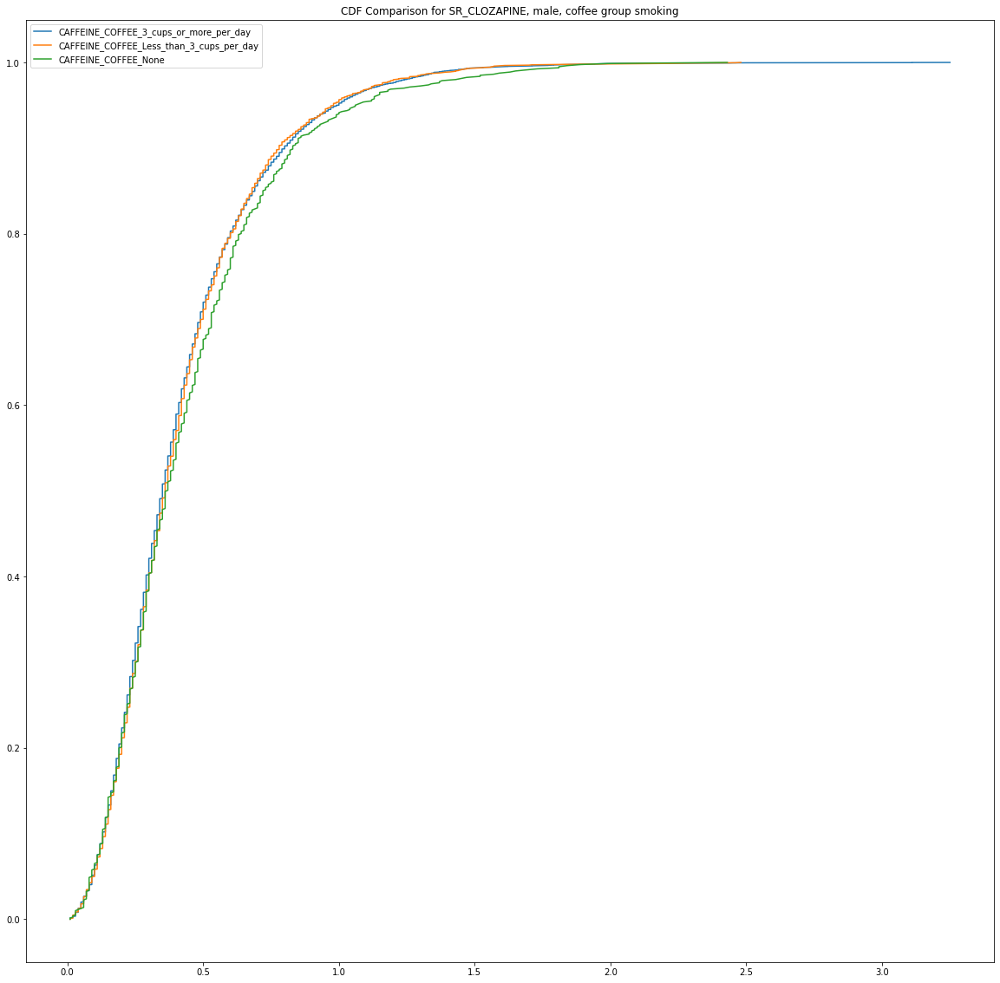

H=4.495474910872997, p=0.10563796498297016


A Kruskal-Wallis test on SR_CLOZAPINE between smoking males in the coffee group was not statistically signficant, H (2, N = 12463)=4.5 ,p>.05
9131 2530 802
n=12463


SR_CLOZAPINE   male   coffee group   non smoking
SR_CLOZAPINE 1 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


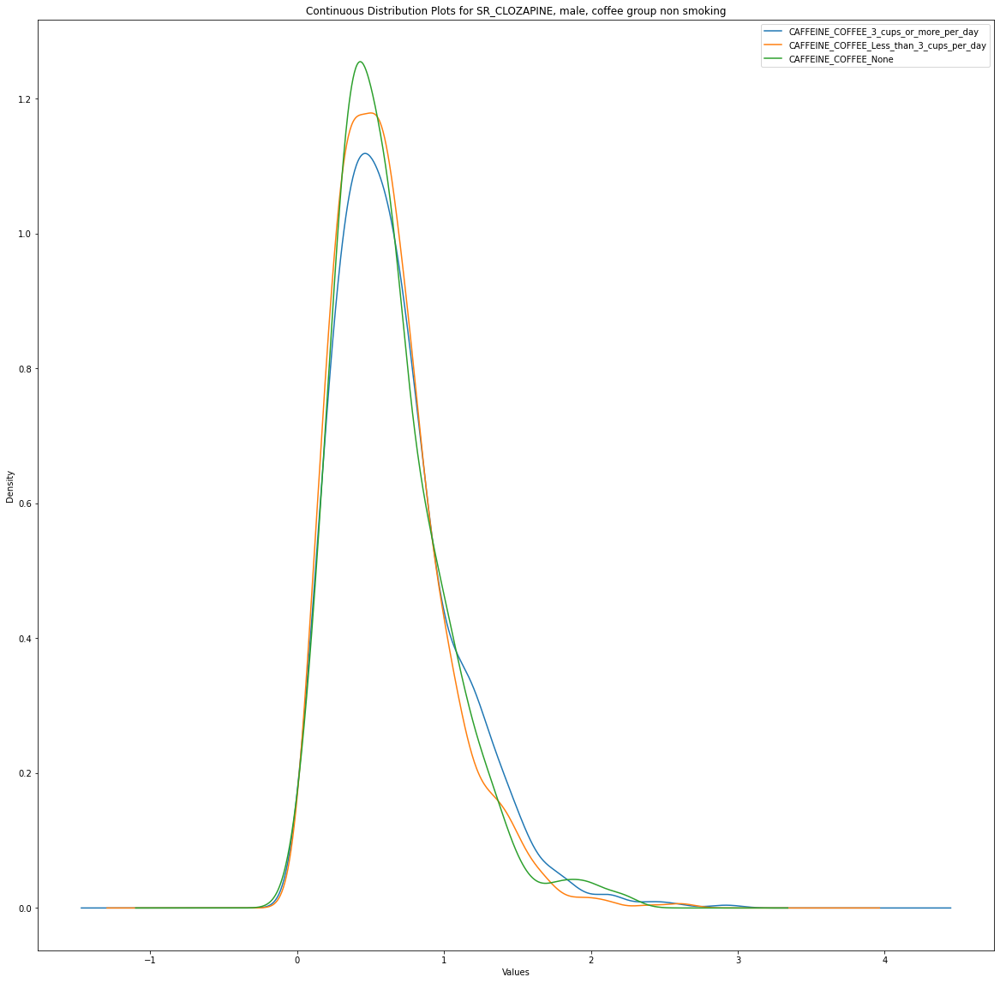

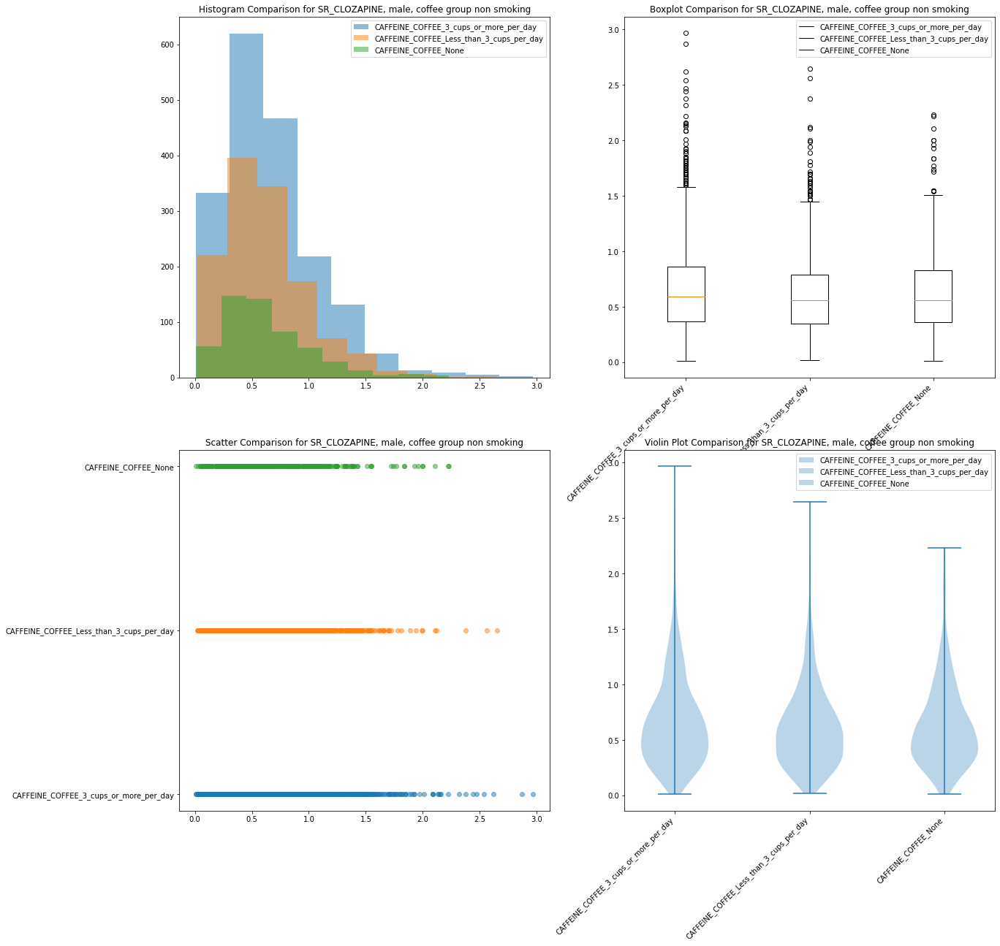

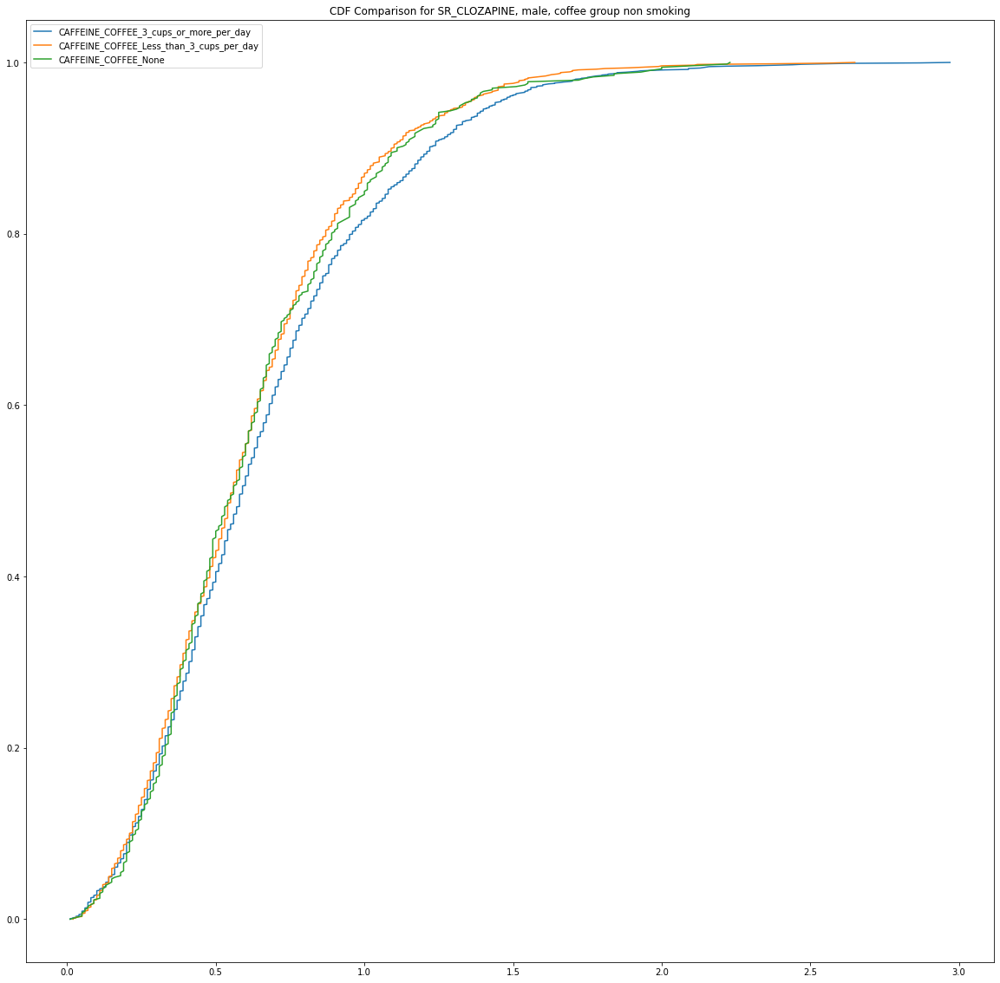

H=9.01695365515992, p=0.011015225492001823


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking males in the coffee group was statistically signficant at H (2, N = 3639)=9.02 ,p<.05
1838 1268 533
n=3639


SR_CLOZAPINE   male   chocolate group   smoking
SR_CLOZAPINE 1 1 SR_DERIVED_SMOKER_STATUS_Smoker


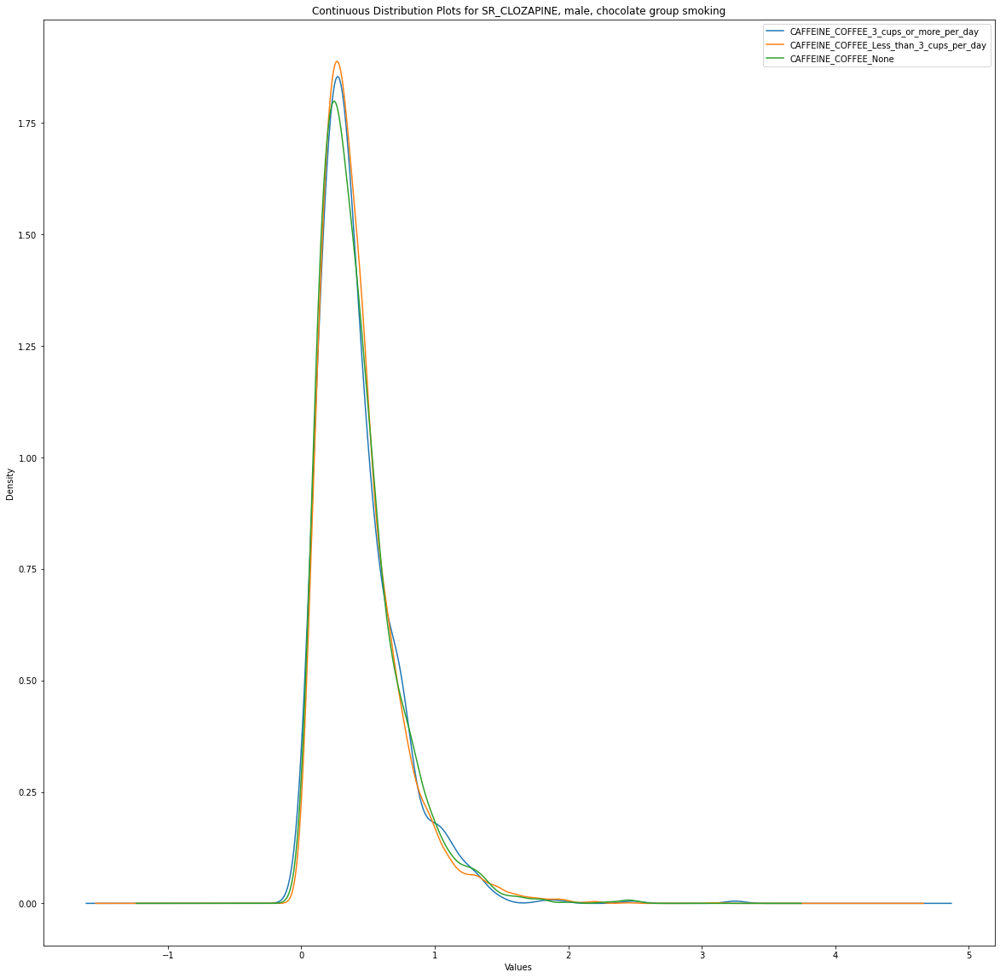

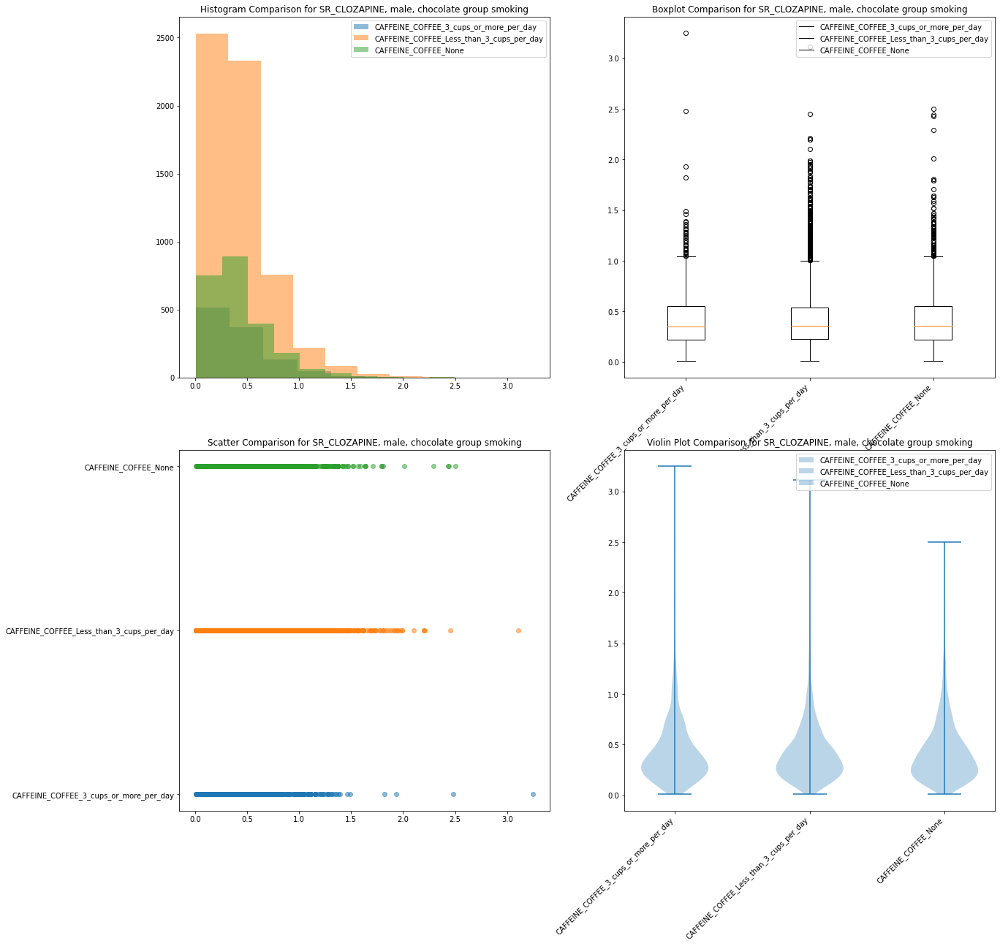

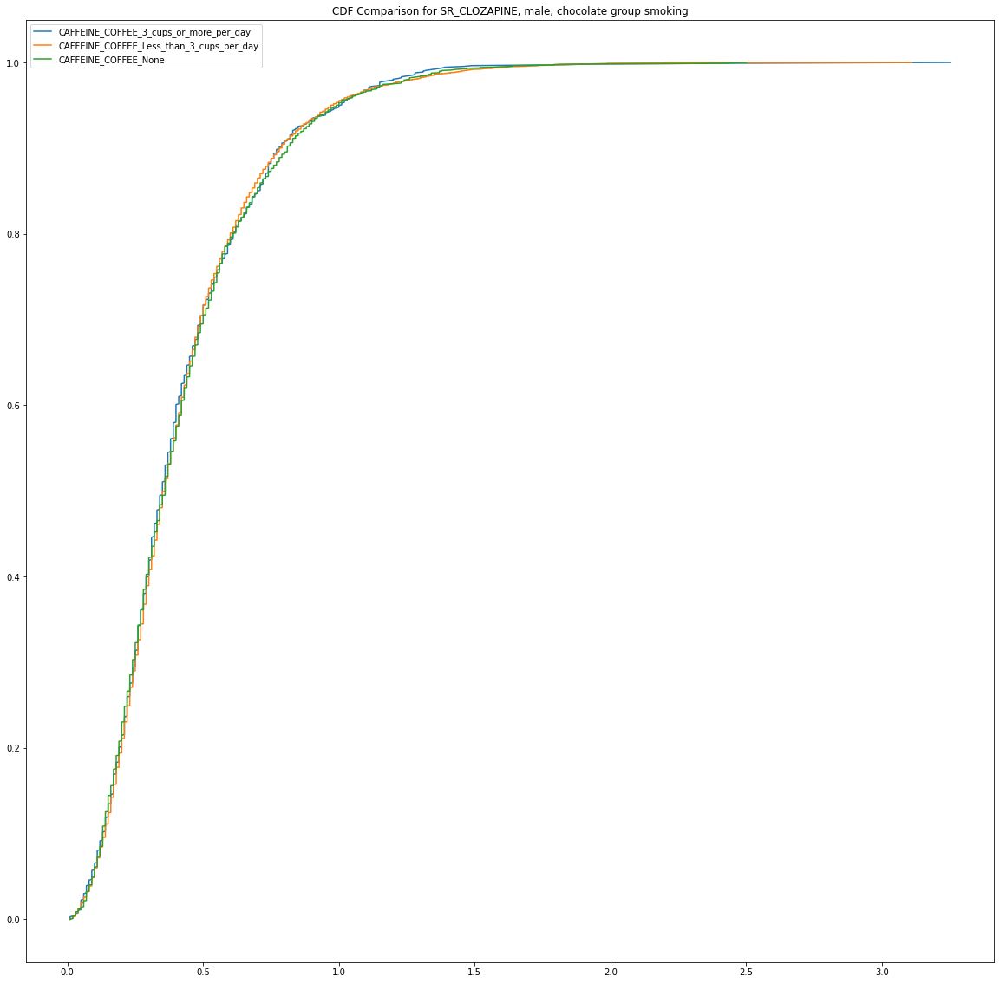

H=0.4706832939477187, p=0.7903007996238487


A Kruskal-Wallis test on SR_CLOZAPINE between smoking males in the chocolate group was not statistically signficant, H (2, N = 9368)=0.47 ,p>.05
1073 5963 2332
n=9368


SR_CLOZAPINE   male   chocolate group   non smoking
SR_CLOZAPINE 1 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker


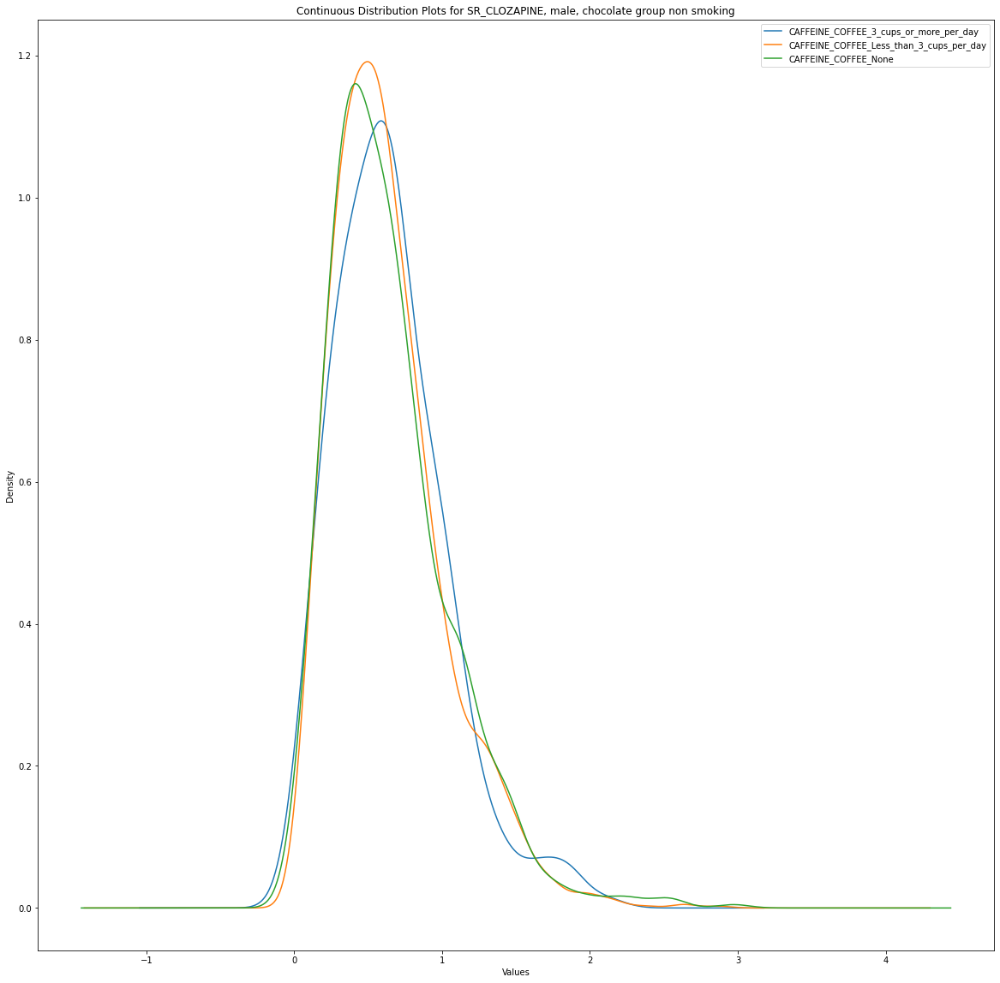

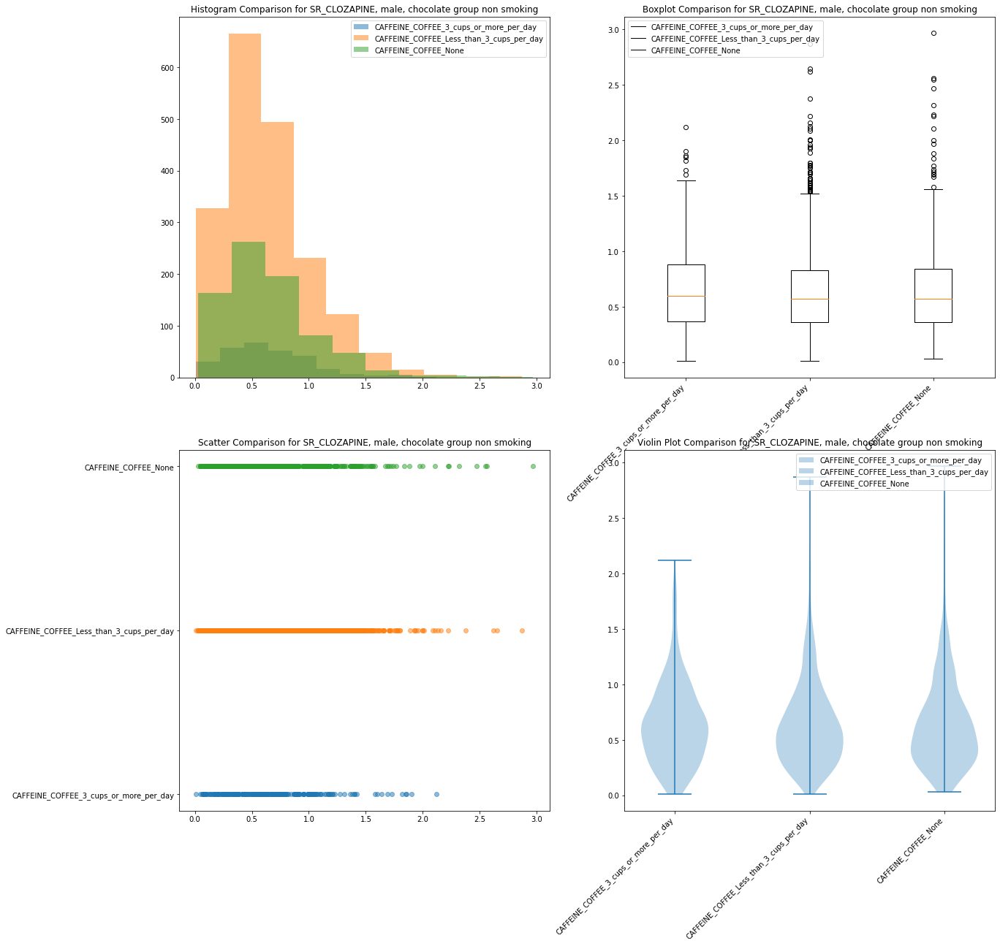

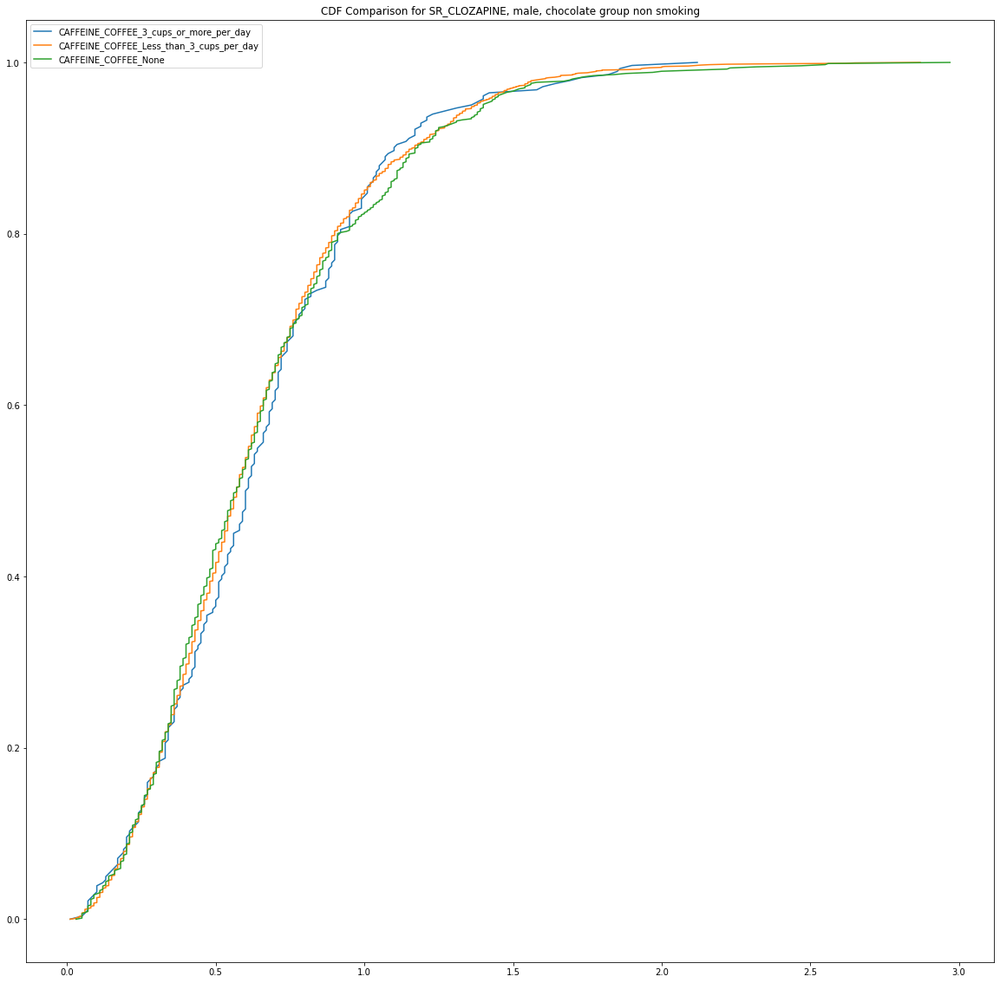

H=0.6666330130034147, p=0.7165433676269477


A Kruskal-Wallis test on SR_CLOZAPINE between non smoking males in the chocolate group was not statistically signficant, H (2, N = 2973)=0.67 ,p>.05
283 1913 777
n=2973




In [372]:
for i in range(0, len(outcome_var_list)):
    for j in range(0, len(sex_bool_keys)):
        for k in range(0, len(group_list_keys)):
            for l in range(0, len(smoking_list_keys)):
                
                label_list = ['CAFFEINE_COFFEE_3_cups_or_more_per_day',
                                       'CAFFEINE_COFFEE_Less_than_3_cups_per_day',
                                       'CAFFEINE_COFFEE_None']
                outcome_var  = outcome_var_list[i]
        
                
                sex_bool     = sex_bool_dict.get(sex_bool_keys[j])
                group_list   = group_list_dict.get(group_list_keys[k])
                smoking_bool = smoking_list_dict.get(smoking_list_keys[l]).get(list(smoking_list_dict.get(smoking_list_keys[l]).keys())[0])
                smoking_col  = list(smoking_list_dict.get(smoking_list_keys[l]).keys())[0]

                print(outcome_var," " ,sex_bool_keys[j], " ",group_list_keys[k], " ",smoking_list_keys[l])
                print(outcome_var, sex_bool, smoking_bool, smoking_col)

                g1 = group_list[0][(group_list[0]['Sex_Male']==sex_bool)  & (group_list[0][smoking_col]==smoking)][outcome_var].dropna() 
                g2 = group_list[1][(group_list[1]['Sex_Male']==sex_bool)  & (group_list[1][smoking_col]==smoking)][outcome_var].dropna()  
                g3 = group_list[2][(group_list[2]['Sex_Male']==sex_bool)  & (group_list[2][smoking_col]==smoking)][outcome_var].dropna()

                
                if(outcome_var != 'SR_DERIVED_SMOKER_STATUS'):
                    test_name = 'Kruskal-Wallis'
                    
                    stat, p = stats.kruskal(g1,
                                            g2,
                                            g3
                                 )
                
                    fig, ax = plt.subplots()
                    g1.plot(kind='kde', ax=ax, label = 'CAFFEINE_COFFEE_3_cups_or_more_per_day')
                    g2.plot(kind='kde', ax=ax, label = 'CAFFEINE_COFFEE_Less_than_3_cups_per_day')
                    g3.plot(kind='kde', ax=ax, label = 'CAFFEINE_COFFEE_None')

                    series1 = g1
                    series2 = g2
                    series3 = g3


                    # set the title and labels
                    ax.set_title(f'Continuous Distribution Plots for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]} {smoking_list_keys[l]}')
                    ax.set_xlabel('Values')
                    ax.set_ylabel('Density')

                    ax.legend()

                    # plot the series in the same figure
                    fig, axs = plt.subplots(2, 2)

                    # plot histogram for series1 and series2
                    axs[0, 0].hist(series1, alpha=0.5, label='CAFFEINE_COFFEE_3_cups_or_more_per_day')
                    axs[0, 0].hist(series2, alpha=0.5, label='CAFFEINE_COFFEE_Less_than_3_cups_per_day')
                    axs[0, 0].hist(series3, alpha=0.5, label='CAFFEINE_COFFEE_None')
                    axs[0, 0].set_title(f'Histogram Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]} {smoking_list_keys[l]}')
                    axs[0, 0].legend(label_list)

                    plt.xticks(rotation=45, ha='right')
                    # plot boxplot for series1 and series3
                    axs[0, 1].boxplot([series1, series2, series3],labels=label_list)
                    axs[0, 1].set_title(f'Boxplot Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]} {smoking_list_keys[l]}')
                    axs[0, 1].legend(label_list)
                    plt.xticks(rotation=45, ha='right')
                    for tick in axs[0, 1].get_xticklabels():
                        tick.set_rotation(45)
                        tick.set_horizontalalignment('right')


                    axs[1, 0].set_title(f'Scatter Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]} {smoking_list_keys[l]}')
                    axs[1, 0].scatter(series1, [0]*len(series1), alpha=0.5, label='CAFFEINE_COFFEE_3_cups_or_more_per_day')
                    axs[1, 0].scatter(series2, [1]*len(series2), alpha=0.5, label='CAFFEINE_COFFEE_Less_than_3_cups_per_day')
                    axs[1, 0].scatter(series3, [2]*len(series3), alpha=0.5, label='CAFFEINE_COFFEE_None')

                    axs[1, 0].set_yticks([0, 1, 2])
                    axs[1, 0].set_yticklabels(['CAFFEINE_COFFEE_3_cups_or_more_per_day', 'CAFFEINE_COFFEE_Less_than_3_cups_per_day', 'CAFFEINE_COFFEE_None'])

                    plt.legend()


                    plt.xticks(rotation=45, ha='right')
                    # plot violin plot for all three series
                    axs[1, 1].violinplot([series1, series2, series3])
                    axs[1, 1].set_xticks([1, 2, 3])
                    axs[1, 1].set_xticklabels(['CAFFEINE_COFFEE_3_cups_or_more_per_day',
                                               'CAFFEINE_COFFEE_Less_than_3_cups_per_day',
                                               'CAFFEINE_COFFEE_None'])
                    axs[1, 1].set_title(f'Violin Plot Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]} {smoking_list_keys[l]}')
                    axs[1, 1].legend(label_list)



                    # plot cdf for all three series
                    fig2 = plt.figure()
                    for i in range(3):
                        sorted_data = np.sort(eval(f'series{i+1}'))
                        yvals = np.arange(len(sorted_data))/float(len(sorted_data)-1)
                        plt.plot(sorted_data,yvals,label=f'{label_list[i]}')
                    plt.legend()
                    plt.title(f'CDF Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]} {smoking_list_keys[l]}')

                    plt.show()
                
                

                print(f"H={stat}, p={p}")
                
                p_sig_05 = p<0.05
                p_sig_001 = p<0.001
                
                dof_str = f'(2, N = {sum((g1.shape[0], g2.shape[0], g3.shape[0])) - 0})'
                
                print("\n")
                if(p_sig_001):
                    
                    
                    print(f'A {test_name} test on {outcome_var} between {smoking_list_keys[l]} {sex_bool_keys[j]}s in the {group_list_keys[k]} was statistically signficant at H {dof_str}={round(stat, 2)} ,p<.001 ')
                    
                    print(g1.shape[0], g2.shape[0], g3.shape[0])
                    print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")
                    result = 'p<0.001'
                    
                elif(p_sig_05):
                    
                    print(f'A {test_name} test on {outcome_var} between {smoking_list_keys[l]} {sex_bool_keys[j]}s in the {group_list_keys[k]} was statistically signficant at H {dof_str}={round(stat, 2)} ,p<.05')
                    
                    print(g1.shape[0], g2.shape[0], g3.shape[0])
                    print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")
                    result = 'p<0.05'
                
                else:
                    
                    print(f'A {test_name} test on {outcome_var} between {smoking_list_keys[l]} {sex_bool_keys[j]}s in the {group_list_keys[k]} was not statistically signficant, H {dof_str}={round(stat, 2)} ,p>.05')
                    
                    print(g1.shape[0], g2.shape[0], g3.shape[0])
                    print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")
                    result = 'p>0.05'
                
                print("\n")
                
                results_df = results_df.append({'Outcome': outcome_var,
                                                'Sex': sex_bool_keys[j],
                                                'Group': group_list_keys[k],
                                                'Smoking': smoking_list_keys[l],
                                                'Test': test_name,
                                                'H': stat,
                                                'p': p,
                                                'Significance': result,
                                                'Sample Size': sum((g1.shape[0], g2.shape[0], g3.shape[0])),
                                                'degrees of freedom': dof_str},
                                               ignore_index=True)

In [373]:
results_df

,Outcome,Sex,Group,Smoking,Test,H,p,Significance,Sample Size,degrees of freedom
0,PatAgeAtSampleDate,female,coffee group,smoking,Kruskal-Wallis,0.483203,0.785369,p>0.05,3715,"(2, N = 3715)"
1,SR_CLOZAPINE,female,coffee group,non smoking,Kruskal-Wallis,2.736291,0.254579,p>0.05,2012,"(2, N = 2012)"
2,SR_CLOZAPINE,female,chocolate group,smoking,Kruskal-Wallis,0.252147,0.881550,p>0.05,2893,"(2, N = 2893)"
3,SR_CLOZAPINE,female,chocolate group,non smoking,Kruskal-Wallis,2.523490,0.283160,p>0.05,1674,"(2, N = 1674)"
4,SR_CLOZAPINE,male,coffee group,smoking,Kruskal-Wallis,4.495475,0.105638,p>0.05,12463,"(2, N = 12463)"
5,SR_CLOZAPINE,male,coffee group,non smoking,Kruskal-Wallis,9.016954,0.011015,p<0.05,3639,"(2, N = 3639)"
6,SR_CLOZAPINE,male,chocolate group,smoking,Kruskal-Wallis,0.470683,0.790301,p>0.05,9368,"(2, N = 9368)"
7,SR_CLOZAPINE,male,chocolate group,non smoking,Kruskal-Wallis,0.666633,0.716543,p>0.05,2973,"(2, N = 2973)"
8,SR_CURRENT_DOSE,female,coffee group,smoking,Kruskal-Wallis,2.430133,0.296690,p>0.05,3684,"(2, N = 3684)"
9,SR_CLOZAPINE,female,coffee group,non smoking,Kruskal-Wallis,2.736291,0.254579,p>0.05,2012,"(2, N = 2012)"


In [374]:
#print medians to check...? sample sizes also

# Smoking proportion

In [375]:
group_list[0][(group_list[0]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts()

1    1073
0     341
Name: SR_DERIVED_SMOKER_STATUS_Smoker, dtype: int64

In [376]:
group_list[0][(group_list[0]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts()[1]

1073

In [377]:
group_list[0][(group_list[0]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts().sum()

1414

In [378]:
1 - (341 / (1073 + 341) )

0.7588401697312588

In [379]:
outcome_var_list = [
                    'SR_DERIVED_SMOKER_STATUS'
                   ]

In [380]:
for i in range(0, len(outcome_var_list)):
    for j in range(0, len(sex_bool_keys)):
        for k in range(0, len(group_list_keys)):
            #for l in range(0, len(smoking_list_keys)):

            print("----------------------------------------------------------------------------")


            outcome_var  = outcome_var_list[i]



            sex_bool     = sex_bool_dict.get(sex_bool_keys[j])
            group_list   = group_list_dict.get(group_list_keys[k])
            

            print(outcome_var," " ,sex_bool_keys[j], " ",group_list_keys[k], " ")
            print(outcome_var, sex_bool,  )

                
           
            g1a = group_list[0][(group_list[0]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts()[1]
            g1b = group_list[0][(group_list[0]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts().sum()
            
            g2a = group_list[1][(group_list[1]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts()[1]
            g2b = group_list[1][(group_list[1]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts().sum()
            
            g3a = group_list[2][(group_list[2]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts()[1]
            g3b = group_list[2][(group_list[2]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts().sum()
            
            
            data = pd.DataFrame({'Smokers': [g1a, g2a, g3a],
                                 'Patients': [g1b, g2b, g3b]})
            
            (stat, p, dff, arr) = ss.chi2_contingency(data, correction = False)
            
            test_name = 'Chi-squared'
            
            p_sig_001 = p<0.001
            
            p_sig_05 = p<0.05
            
            print(f"H={stat}, p={p}")
                
            print("\n")
            
            dof_str = f'(2, N = {sum((g1.shape[0], g2.shape[0], g3.shape[0])) - 0})'
            
            if(p_sig_001):
                result = 'p<0.001'

                print(f'A {test_name} test of independence on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} was statistically signficant at X2 {dof_str} = {round(stat, 2)} , p<.001')

                print(g1.shape[0], g2.shape[0], g3.shape[0])
                print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")
                
            elif(p_sig_05):
                result = 'p<0.05'

                print(f'A {test_name} test of independence on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} was statistically signficant at X2 {dof_str}={round(stat, 2)}, p<.05 ')

                print(g1.shape[0], g2.shape[0], g3.shape[0])
                print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")  
            
            else:
                result = 'p>0.05'
                

                print(f'A {test_name} test of independence on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} was not statistically signficant, X2 {dof_str}={round(stat, 2)}, p>.05')

                print(g1.shape[0], g2.shape[0], g3.shape[0])
                print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}") 
            
            results_df = results_df.append({'Outcome': outcome_var,
                                                'Sex': sex_bool_keys[j],
                                                'Group': group_list_keys[k],
                                                'Smoking': smoking_list_keys[l],
                                                'Test': test_name,
                                                'H': stat,
                                                'p': p,
                                                'Significance': result,
                                                'Sample Size': sum((g1.shape[0], g2.shape[0], g3.shape[0])),
                                               'degrees of freedom' : dof_str},
                                               ignore_index=True)
                
            results_df

----------------------------------------------------------------------------
SR_DERIVED_SMOKER_STATUS   female   coffee group  
SR_DERIVED_SMOKER_STATUS 0
H=91.09169828311657, p=1.65839906496648e-20


A Chi-squared test of independence on SR_DERIVED_SMOKER_STATUS between females in the coffee group was statistically signficant at X2 (2, N = 2973) = 91.09 , p<.001
283 1913 777
n=2973
----------------------------------------------------------------------------
SR_DERIVED_SMOKER_STATUS   female   chocolate group  
SR_DERIVED_SMOKER_STATUS 0
H=4.8793321274738455, p=0.08718996249134878


A Chi-squared test of independence on SR_DERIVED_SMOKER_STATUS between females in the chocolate group was not statistically signficant, X2 (2, N = 2973)=4.88, p>.05
283 1913 777
n=2973
----------------------------------------------------------------------------
SR_DERIVED_SMOKER_STATUS   male   coffee group  
SR_DERIVED_SMOKER_STATUS 1
H=90.76055772460103, p=1.9570201751427513e-20


A Chi-squared test of in

In [381]:
results_df.to_csv('whole group level caffeine age-dose-cloz-norcloz-kruskal and smoking chi square results.csv', index=False)

In [382]:
results_df

,Outcome,Sex,Group,Smoking,Test,H,p,Significance,Sample Size,degrees of freedom
0,PatAgeAtSampleDate,female,coffee group,smoking,Kruskal-Wallis,0.483203,7.853689e-01,p>0.05,3715,"(2, N = 3715)"
1,SR_CLOZAPINE,female,coffee group,non smoking,Kruskal-Wallis,2.736291,2.545786e-01,p>0.05,2012,"(2, N = 2012)"
2,SR_CLOZAPINE,female,chocolate group,smoking,Kruskal-Wallis,0.252147,8.815501e-01,p>0.05,2893,"(2, N = 2893)"
3,SR_CLOZAPINE,female,chocolate group,non smoking,Kruskal-Wallis,2.523490,2.831595e-01,p>0.05,1674,"(2, N = 1674)"
4,SR_CLOZAPINE,male,coffee group,smoking,Kruskal-Wallis,4.495475,1.056380e-01,p>0.05,12463,"(2, N = 12463)"
5,SR_CLOZAPINE,male,coffee group,non smoking,Kruskal-Wallis,9.016954,1.101523e-02,p<0.05,3639,"(2, N = 3639)"
6,SR_CLOZAPINE,male,chocolate group,smoking,Kruskal-Wallis,0.470683,7.903008e-01,p>0.05,9368,"(2, N = 9368)"
7,SR_CLOZAPINE,male,chocolate group,non smoking,Kruskal-Wallis,0.666633,7.165434e-01,p>0.05,2973,"(2, N = 2973)"
8,SR_CURRENT_DOSE,female,coffee group,smoking,Kruskal-Wallis,2.430133,2.966903e-01,p>0.05,3684,"(2, N = 3684)"
9,SR_CLOZAPINE,female,coffee group,non smoking,Kruskal-Wallis,2.736291,2.545786e-01,p>0.05,2012,"(2, N = 2012)"


In [383]:
"""
CAFFEINE_COFFEE_3_cups_or_more_per_day,
CAFFEINE_COFFEE_Less_than_3_cups_per_day,
CAFFEINE_COFFEE_None,
""".split()

['CAFFEINE_COFFEE_3_cups_or_more_per_day,',
 'CAFFEINE_COFFEE_Less_than_3_cups_per_day,',
 'CAFFEINE_COFFEE_None,']

In [384]:
from itertools import combinations

combination_list = list(combinations([(g1a,g1b, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (g2a,g2b, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (g3a,g3b,'CAFFEINE_COFFEE_None')], 2))

list(combination_list)

[((1073, 1414, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'),
  (5963, 8044, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day')),
 ((1073, 1414, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'),
  (2332, 3158, 'CAFFEINE_COFFEE_None')),
 ((5963, 8044, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'),
  (2332, 3158, 'CAFFEINE_COFFEE_None'))]

In [385]:
combination_list[0]

((1073, 1414, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'),
 (5963, 8044, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'))

In [386]:
combination_list[0][0]

(1073, 1414, 'CAFFEINE_COFFEE_3_cups_or_more_per_day')

In [387]:
combination_list[0][0][0]

1073

In [388]:
# run individual tests here between groups


#then also individual tests on cloz and norcloz groups



In [389]:
#ignore chocolate

In [390]:
combination_list

[((1073, 1414, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'),
  (5963, 8044, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day')),
 ((1073, 1414, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'),
  (2332, 3158, 'CAFFEINE_COFFEE_None')),
 ((5963, 8044, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'),
  (2332, 3158, 'CAFFEINE_COFFEE_None'))]

In [391]:
group_list_keys

['coffee group', 'chocolate group']

In [392]:
group_list_keys = ['coffee group']

In [393]:
results_df = pd.DataFrame(columns=['Outcome', 'Sex', 'Group', 'Smoking', 'Test', 'H', 'p', 'Significance', 'Sample Size'])


In [394]:
#check permutations:
for i in range(0, len(outcome_var_list)):
    for j in range(0, len(sex_bool_keys)):
        for k in range(0, len(group_list_keys)):
            #for l in range(0, len(smoking_list_keys)):

            print("----------------------------------------------------------------------------")


            outcome_var  = outcome_var_list[i]



            sex_bool     = sex_bool_dict.get(sex_bool_keys[j])
            group_list   = group_list_dict.get(group_list_keys[k])
            

            print(outcome_var," " ,sex_bool_keys[j], " ",group_list_keys[k], " ")
            print(outcome_var, sex_bool,  )

                
           
            g1a = group_list[0][(group_list[0]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts()[1]
            g1b = group_list[0][(group_list[0]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts().sum()
            
            g2a = group_list[1][(group_list[1]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts()[1]
            g2b = group_list[1][(group_list[1]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts().sum()
            
            g3a = group_list[2][(group_list[2]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts()[1]
            g3b = group_list[2][(group_list[2]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts().sum()
            
            
            #permute_list = [(g1a,g1b), (g2a,g2b), (g3a,g3b)]
            
            combination_list = list(combinations([(g1a,g1b, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (g2a,g2b, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (g3a,g3b,'CAFFEINE_COFFEE_None')], 2))

            
            for l in range(0, len(combination_list)):
                
                print('Groups:',combination_list[l][0][2], combination_list[l][1][2])
            
                #data = pd.DataFrame({'Smokers': [g1a, g2a, g3a],
                 #                    'Patients': [g1b, g2b, g3b]})
                           
                data = pd.DataFrame({'Smokers': [combination_list[l][0][0], combination_list[l][0][1]],
                                     'Patients': [combination_list[l][1][0], combination_list[l][1][1]]})
                           
                           

                (stat, p, dff, arr) = ss.chi2_contingency(data, correction = False)

                test_name = 'Chi-squared'

                p_sig_001 = p<0.001

                p_sig_05 = p<0.05

                print(f"H={stat}, p={p}")

                print("\n")

                dof_str = f'({dff}, N = {arr.flatten().sum()})'
                
                dof_str = f'({dff}, N = {arr.flatten().sum()})'
                

                if(p_sig_001):


                    print(f"""A {test_name} test of independence on {outcome_var}
                    between {sex_bool_keys[j]}s in the {group_list_keys[k]}
                    between {combination_list[l][0][2]} and between {combination_list[l][1][2]}
                    was statistically significant at X2 {dof_str} = {round(stat, 2)} , p<.001""")
                    
                    print(" ")
                    print("Observed frequencies:")
                    print(data)
                    print(" ")
                    print("Expected frequencies:")
                    print(arr)
                    print(f"n={arr.flatten().sum()}")
                    
                    result = 'p<0.001'

                elif(p_sig_05):


                    print(f'A {test_name} test of independence on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} between {combination_list[l][0][2]} and between {combination_list[l][1][2]} was statistically significant at X2 {dof_str}={round(stat, 2)}, p<.05 ')
                    print(" ")
                    print("Observed frequencies:")
                    print(data)
                    print(" ")
                    print("Expected frequencies:")
                    print(arr)
                    print(f"n={arr.flatten().sum()}") 
                    
                    result = 'p<0.05'

                else:



                    print(f'A {test_name} test of independence on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} between {combination_list[l][0][2]} and between {combination_list[l][1][2]} was not statistically significant, X2 {dof_str}={round(stat, 2)}, p>.05')
                    print(" ")
                    print("Observed frequencies:")
                    print(data)
                    print(" ")
                    print("Expected frequencies:")
                    print(arr)
                    print(f"n={arr.flatten().sum()}") 
                    
                    result = 'p>0.05'
                
                print(" ")
                
                
                results_df = results_df.append({'Outcome': outcome_var,
                                                'Sex': sex_bool_keys[j],
                                                'Group': (combination_list[l][0][2], combination_list[l][1][2]),
                                                'Smoking': smoking_list_keys[0],
                                                'Test': test_name,
                                                'H': stat,
                                                'p': p,
                                                'Significance': result,
                                                'Sample Size': combination_list[l][0][0] + combination_list[l][0][1]},
                                               ignore_index=True)

----------------------------------------------------------------------------
SR_DERIVED_SMOKER_STATUS   female   coffee group  
SR_DERIVED_SMOKER_STATUS 0
Groups: CAFFEINE_COFFEE_3_cups_or_more_per_day CAFFEINE_COFFEE_Less_than_3_cups_per_day
H=64.85684053970363, p=8.054199240454587e-16


A Chi-squared test of independence on SR_DERIVED_SMOKER_STATUS
                    between females in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_Less_than_3_cups_per_day
                    was statistically significant at X2 (1, N = 8838.0) = 64.86 , p<.001
 
Observed frequencies:
   Smokers  Patients
0     2776       709
1     3858      1495
 
Expected frequencies:
[[2615.9187599  869.0812401]
 [4018.0812401 1334.9187599]]
n=8838.0
 
Groups: CAFFEINE_COFFEE_3_cups_or_more_per_day CAFFEINE_COFFEE_None
H=39.14644731932506, p=3.931780577922068e-10


A Chi-squared test of independence on SR_DERIVED_SMOKER_STATUS
                    bet

In [395]:
combination_list[l][0][0] + combination_list[l][0][1]

6430

In [396]:
combination_list[l]

((2530, 3900, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'),
 (802, 1364, 'CAFFEINE_COFFEE_None'))

In [397]:
results_df

,Outcome,Sex,Group,Smoking,Test,H,p,Significance,Sample Size
0,SR_DERIVED_SMOKER_STATUS,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFE...",smoking,Chi-squared,64.856841,8.054199e-16,p<0.001,6634
1,SR_DERIVED_SMOKER_STATUS,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFE...",smoking,Chi-squared,39.146447,3.931781e-10,p<0.001,6634
2,SR_DERIVED_SMOKER_STATUS,female,"(CAFFEINE_COFFEE_Less_than_3_cups_per_day, CAF...",smoking,Chi-squared,1.117560,2.904444e-01,p>0.05,2204
3,SR_DERIVED_SMOKER_STATUS,male,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFE...",smoking,Chi-squared,57.151703,4.034583e-14,p<0.001,20425
4,SR_DERIVED_SMOKER_STATUS,male,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFE...",smoking,Chi-squared,46.863413,7.611041e-12,p<0.001,20425
5,SR_DERIVED_SMOKER_STATUS,male,"(CAFFEINE_COFFEE_Less_than_3_cups_per_day, CAF...",smoking,Chi-squared,3.673955,5.526890e-02,p>0.05,6430


In [398]:
results_df.to_csv('individual group level caffeine smoking proportion chi square results.csv', index=False)

In [399]:
combination_list[l][0][2], combination_list[l][1][2]

('CAFFEINE_COFFEE_Less_than_3_cups_per_day', 'CAFFEINE_COFFEE_None')

In [400]:
#break

In [401]:
# # Create the dataframe
# #data = {'Smokers': [5963, 8044], 'Patients': [2332, 3158]}
# df = pd.DataFrame(data)

# # Perform chi-square test
# chi2, p_value, _, _ = chi2_contingency(df)

# # Print the results
# print("Chi-square statistic:", chi2)
# print("p-value:", p_value)

In [402]:
#ss.chi2_contingency(data, correction = False)

In [403]:
#data

In [404]:
#(stat, p, df, arr) = ss.chi2_contingency(data, correction = False)

In [405]:
#arr.flatten().sum()

In [406]:
#sum(arr)

In [407]:
{'Smokers': [combination_list[l][0][0], combination_list[l][0][1]],
                                     'Patients': [combination_list[l][1][0], combination_list[l][1][1]]}

{'Smokers': [2530, 3900], 'Patients': [802, 1364]}

In [408]:
combination_list[l]

((2530, 3900, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'),
 (802, 1364, 'CAFFEINE_COFFEE_None'))

In [409]:
combination_list[l][0][0]

2530

In [410]:
combination_list[l][0][1]

3900

In [411]:
combination_list[l][1][0]

802

In [412]:
combination_list[l][1][1]

1364

In [413]:
group_list[0][(group_list[0]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts()[1]

9131

In [414]:
group_list[0][(group_list[0]['Sex_Male']==sex_bool)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts().sum()

11294

In [415]:
g1

40789     0.46
40842     0.47
40843     1.58
40880     0.96
40886     0.58
          ... 
346810    0.51
346952    1.86
347046    0.87
347110    0.30
358977    0.21
Name: SR_CLOZAPINE, Length: 283, dtype: float64

# Subset cloz > 1.5ml

In [416]:
results_df = pd.DataFrame(columns=['Outcome', 'Sex', 'Group', 'Smoking', 'Test', 'H', 'p', 'Significance', 'Sample Size'])


In [417]:
cloz_threshold = 1.5

In [418]:
sex_bool_dict = {'female': 0,
                 'male': 1
    
}

group_list_dict = {'coffee group': coffee_group_list,
                   'chocolate group': chocolate_group_list}

smoking_list_dict = {'smoking': {'SR_DERIVED_SMOKER_STATUS_Smoker':1},
                     'non smoking': {'SR_DERIVED_SMOKER_STATUS_Non_Smoker':0}}

outcome_var_list = ['PatAgeAtSampleDate',
                    'SR_CURRENT_DOSE',
                    'SR_CLOZAPINE',
                    'SR_NORCLOZAPINE',
                    #'SR_DERIVED_SMOKER_STATUS'
                   ]

In [419]:
for i in range(0, len(outcome_var_list)):
    for j in range(0, len(sex_bool_keys)):
        for k in range(0, len(group_list_keys)):
            for l in range(0, len(smoking_list_keys)):
                
    


                outcome_var  = outcome_var_list[i]
        
                
            
                sex_bool     = sex_bool_dict.get(sex_bool_keys[j])
                group_list   = group_list_dict.get(group_list_keys[k])
                smoking_bool = smoking_list_dict.get(smoking_list_keys[l]).get(list(smoking_list_dict.get(smoking_list_keys[l]).keys())[0])
                smoking_col  = list(smoking_list_dict.get(smoking_list_keys[l]).keys())[0]

                print(outcome_var," " ,sex_bool_keys[j], " ",group_list_keys[k], " ",smoking_list_keys[l])
                print(outcome_var, sex_bool, smoking_bool, smoking_col)

                g1 = group_list[0][(group_list[0]['Sex_Male']==sex_bool)  & (group_list[0][smoking_col]==smoking) & (group_list[0]['SR_CLOZAPINE']>=cloz_threshold)][outcome_var].dropna() 
                g2 = group_list[1][(group_list[1]['Sex_Male']==sex_bool)  & (group_list[1][smoking_col]==smoking) & (group_list[1]['SR_CLOZAPINE']>=cloz_threshold)][outcome_var].dropna()  
                g3 = group_list[2][(group_list[2]['Sex_Male']==sex_bool)  & (group_list[2][smoking_col]==smoking) & (group_list[2]['SR_CLOZAPINE']>=cloz_threshold)][outcome_var].dropna()

                
                if(outcome_var != 'SR_DERIVED_SMOKER_STATUS'):
                    test_name = 'Kruskal-Wallis'
                    
                    stat, p = stats.kruskal(g1,
                                            g2,
                                            g3
                                 )
                

                print(f"H={stat}, p={p}")
                
                p_sig_05 = p<0.05
                p_sig_001 = p<0.001
                
                dof_str = f'(2, N = {sum((g1.shape[0], g2.shape[0], g3.shape[0])) - 0})'
                
                print("\n")
                if(p_sig_001):
                    
                    result = 'p<0.001'
                    print(f'A {test_name} test on {outcome_var} between {smoking_list_keys[l]} {sex_bool_keys[j]}s in the {group_list_keys[k]} was statistically signficant at H {dof_str}={round(stat, 2)} ,p<.001 ')
                    
                    print(g1.shape[0], g2.shape[0], g3.shape[0])
                    print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")
                    
                    
                elif(p_sig_05):
                    
                    print(f'A {test_name} test on {outcome_var} between {smoking_list_keys[l]} {sex_bool_keys[j]}s in the {group_list_keys[k]} was statistically signficant at H {dof_str}={round(stat, 2)} ,p<.05')
                    
                    print(g1.shape[0], g2.shape[0], g3.shape[0])
                    print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")
                
                    result = 'p<0.05'
                else:
                    
                    print(f'A {test_name} test on {outcome_var} between {smoking_list_keys[l]} {sex_bool_keys[j]}s in the {group_list_keys[k]} was not statistically signficant, H {dof_str}={round(stat, 2)} ,p>.05')
                    
                    print(g1.shape[0], g2.shape[0], g3.shape[0])
                    print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")
                
                    result = 'p>0.05'
                    
                print("\n")
                
                results_df = results_df.append({'Outcome': outcome_var,
                                                'Sex': sex_bool_keys[j],
                                                'Group': group_list_keys[k],
                                                'Smoking': smoking_list_keys[l],
                                                'Test': test_name,
                                                'H': stat,
                                                'p': p,
                                                'Significance': result,
                                                'Sample Size': sum((g1.shape[0], g2.shape[0], g3.shape[0])),
                                               'degrees of freedom' : dof_str},
                                               ignore_index=True)

PatAgeAtSampleDate   female   coffee group   smoking
PatAgeAtSampleDate 0 1 SR_DERIVED_SMOKER_STATUS_Smoker
H=0.19174541054118696, p=0.9085796661104714


A Kruskal-Wallis test on PatAgeAtSampleDate between smoking females in the coffee group was not statistically signficant, H (2, N = 63)=0.19 ,p>.05
47 12 4
n=63


PatAgeAtSampleDate   female   coffee group   non smoking
PatAgeAtSampleDate 0 0 SR_DERIVED_SMOKER_STATUS_Non_Smoker
H=2.0428644428266125, p=0.36007885803839274


A Kruskal-Wallis test on PatAgeAtSampleDate between non smoking females in the coffee group was not statistically signficant, H (2, N = 113)=2.04 ,p>.05
45 46 22
n=113


PatAgeAtSampleDate   male   coffee group   smoking
PatAgeAtSampleDate 1 1 SR_DERIVED_SMOKER_STATUS_Smoker
H=0.4998235062839266, p=0.7788695128260953


A Kruskal-Wallis test on PatAgeAtSampleDate between smoking males in the coffee group was not statistically signficant, H (2, N = 90)=0.5 ,p>.05
59 17 14
n=90


PatAgeAtSampleDate   male   coffee grou

In [420]:
results_df.to_csv('subset cloz greaterthan 1dot5ml whole group level caffeine age-dose-cloz-norcloz-kruskal and smoking chi square results.csv', index=False)

In [421]:
results_df = pd.DataFrame(columns=['Outcome', 'Sex', 'Group', 'Smoking', 'Test', 'H', 'p', 'Significance', 'Sample Size'])


In [422]:
outcome_var_list = [
                    'SR_DERIVED_SMOKER_STATUS'
                   ]

In [423]:
for i in range(0, len(outcome_var_list)):
    for j in range(0, len(sex_bool_keys)):
        for k in range(0, len(group_list_keys)):
            #for l in range(0, len(smoking_list_keys)):

            print("----------------------------------------------------------------------------")


            outcome_var  = outcome_var_list[i]



            sex_bool     = sex_bool_dict.get(sex_bool_keys[j])
            group_list   = group_list_dict.get(group_list_keys[k])
            

            print(outcome_var," " ,sex_bool_keys[j], " ",group_list_keys[k], " ")
            print(outcome_var, sex_bool,  )

                
           
            g1a = group_list[0][(group_list[0]['Sex_Male']==sex_bool)& (group_list[0]['SR_CLOZAPINE']>=cloz_threshold)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts()[1]
            g1b = group_list[0][(group_list[0]['Sex_Male']==sex_bool)& (group_list[0]['SR_CLOZAPINE']>=cloz_threshold)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts().sum()
            
            g2a = group_list[1][(group_list[1]['Sex_Male']==sex_bool)& (group_list[1]['SR_CLOZAPINE']>=cloz_threshold)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts()[1]
            g2b = group_list[1][(group_list[1]['Sex_Male']==sex_bool)& (group_list[1]['SR_CLOZAPINE']>=cloz_threshold)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts().sum()
            
            g3a = group_list[2][(group_list[2]['Sex_Male']==sex_bool)& (group_list[2]['SR_CLOZAPINE']>=cloz_threshold)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts()[1]
            g3b = group_list[2][(group_list[2]['Sex_Male']==sex_bool)& (group_list[2]['SR_CLOZAPINE']>=cloz_threshold)]['SR_DERIVED_SMOKER_STATUS_Smoker'].value_counts().sum()
            
            
            data = pd.DataFrame({'Smokers': [g1a, g2a, g3a],
                                 'Patients': [g1b, g2b, g3b]})
            
            (stat, p, dof, arr) = ss.chi2_contingency(data, correction = False)
            
            test_name = 'Chi-squared'
            
            p_sig_001 = p<0.001
            
            p_sig_05 = p<0.05
            
            print(f"H={stat}, p={p}")
                
            print("\n")
            
            dof_str = f'(2, N = {sum((g1.shape[0], g2.shape[0], g3.shape[0])) - 0})'
            
            if(p_sig_001):
                
                result  = 'p<0.001'


                print(f'A {test_name} test of independence on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} was statistically signficant at X2 {dof_str} = {round(stat, 2)} , p<.001')

                print(g1.shape[0], g2.shape[0], g3.shape[0])
                print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")
                
            elif(p_sig_05):

                result = 'p<0.05'

                print(f'A {test_name} test of independence on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} was statistically signficant at X2 {dof_str}={round(stat, 2)}, p<.05 ')

                print(g1.shape[0], g2.shape[0], g3.shape[0])
                print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")  
            
            else:
                
                result = 'p>0.05'

                print(f'A {test_name} test of independence on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} was not statistically signficant, X2 {dof_str}={round(stat, 2)}, p>.05')

                print(g1.shape[0], g2.shape[0], g3.shape[0])
                print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}") 
                
            results_df = results_df.append({'Outcome': outcome_var,
                                                'Sex': sex_bool_keys[j],
                                                'Group': (combination_list[l][0][2], combination_list[l][1][2]),
                                                'Smoking': smoking_list_keys[0],
                                                'Test': test_name,
                                                'H': stat,
                                                'p': p,
                                                'Significance': result,
                                                'Sample Size': combination_list[l][0][0] + combination_list[l][0][1]},
                                               ignore_index=True)

----------------------------------------------------------------------------
SR_DERIVED_SMOKER_STATUS   female   coffee group  
SR_DERIVED_SMOKER_STATUS 0
H=9.380413910347857, p=0.00918478512073473


A Chi-squared test of independence on SR_DERIVED_SMOKER_STATUS between females in the coffee group was statistically signficant at X2 (2, N = 120)=9.38, p<.05 
72 32 16
n=120
----------------------------------------------------------------------------
SR_DERIVED_SMOKER_STATUS   male   coffee group  
SR_DERIVED_SMOKER_STATUS 1
H=0.5781749135780944, p=0.7489467020646252


A Chi-squared test of independence on SR_DERIVED_SMOKER_STATUS between males in the coffee group was not statistically signficant, X2 (2, N = 120)=0.58, p>.05
72 32 16
n=120


In [424]:
results_df.to_csv('subset cloz greaterthan 1dot5ml whole group level caffeine smoking chi square results.csv', index=False)

In [425]:
results_df

,Outcome,Sex,Group,Smoking,Test,H,p,Significance,Sample Size
0,SR_DERIVED_SMOKER_STATUS,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFE...",smoking,Chi-squared,9.380414,0.009185,p<0.05,20425
1,SR_DERIVED_SMOKER_STATUS,male,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFE...",smoking,Chi-squared,0.578175,0.748947,p>0.05,20425


In [426]:
# CIGARETTE PAPER:
#smoking and clozapine 4

# Fig1: KS test on dose between the groups, are the distributions different
# are the proportions for each group (from the whole) different ... chi square.
# Groups are :
# male non smoker 
# male smoker 
# female non smoker
# female smoker

#* use raw dose. 

#Fig 2:
# same ks test 

# are the apex of the curves similar/same?
# >research if its possible to test the "apex"?

#push results to a table, possibly table 2a/2a


#2b c. supplementary table 2. 
#t test cloz nor cloz ratio male smokers v non smokers
##t test cloz nor weight male smokers v non smokers

#can parametric?

In [427]:
df.columns

Index(['P_MASTER_ID', 'DOB', 'Ethnicity', 'PatAgeAtSampleDate', 'SR_SAMPLE_ID',
       'SR_SAMPLE_NO', 'SR_P_MASTER_ID', 'SR_P_ORIG_PAT_ID', 'SR_TMS_NO',
       'SR_SAMPLE_DATETM', 'SR_LAST_DOSE_DATETM', 'SR_CURRENT_DOSE',
       'SR_CURRENT_DOSE_TM', 'SR_CURRENT_DOSE_TM_UNITS', 'SR_DOSAGE_MORNING',
       'SR_DOSAGE_NOON', 'SR_DOSAGE_AFTERNOON', 'SR_DOSAGE_EVENING',
       'FORMULATION', 'SR_FORMULATION_ID', 'SR_ARIVAL_DATETM',
       'SR_TMS_FROM_LIMS', 'SR_WEIGHT', 'SR_WEIGHT_DATA_ENTRY_CONVERSION',
       'SMOKER_QUAL', 'SR_SMOKER_QUANTITY', 'ETHANOL_QUAL',
       'SR_ETHANOL_QUANTITY', 'CAFFEINE_COFFEE', 'CAFFEINE_CHOCOLATE',
       'CONSTIPATED', 'SR_REASON_FOR_ASSAY_BASELINE',
       'SR_REASON_FOR_ASSAY_DOSE_CORRECT',
       'SR_REASON_FOR_ASSAY_ADVERSE_REACTION',
       'SR_REASON_FOR_ASSAY_NON_COMPLIANCE',
       'SR_REASON_FOR_ASSAY_DRUG_INTERACTION', 'SR_REASON_FOR_ASSAY_OTHER',
       'SR_CANNABIS', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE', 'SR_RAW_NORCLOZAPINE',
       'P_AGE_AT

<AxesSubplot:ylabel='Density'>

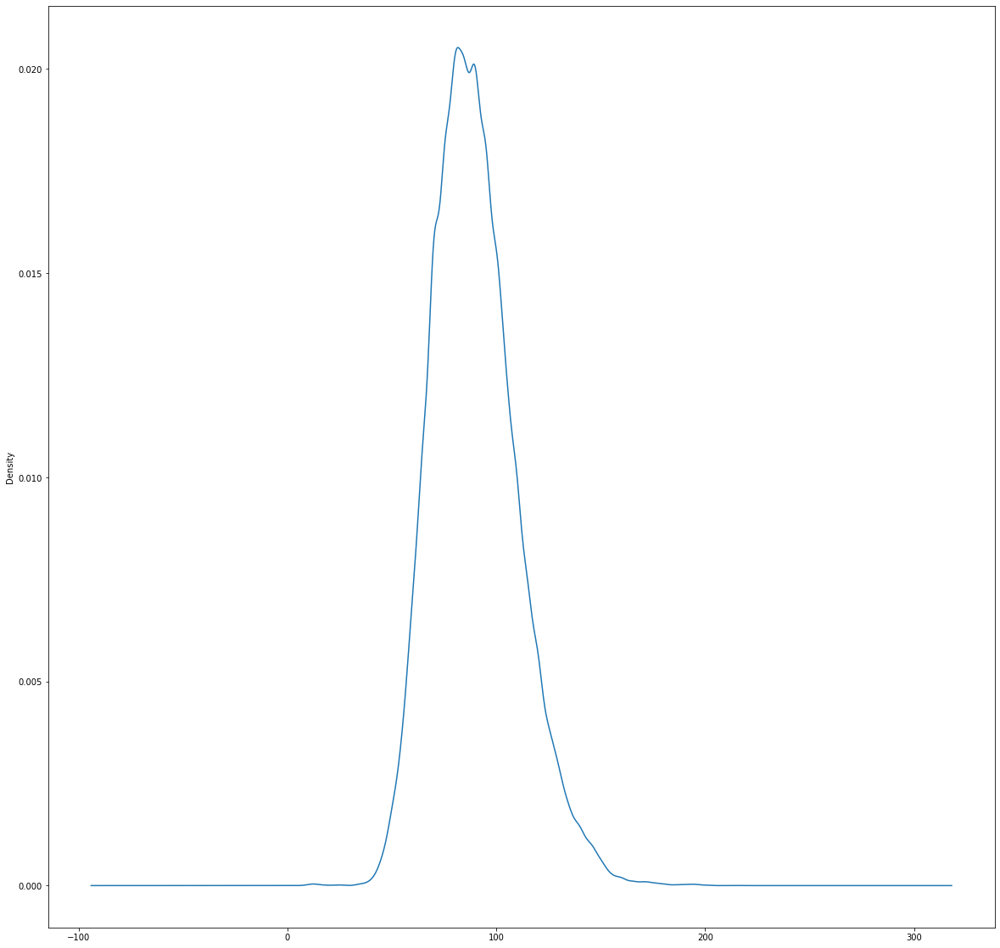

In [428]:
df['SR_WEIGHT'].plot(kind='density')

In [429]:
scipy.stats.normaltest(df['SR_WEIGHT'], axis=0, nan_policy='omit')
#p < 0.05 ==not normal

NormaltestResult(statistic=5071.740154792844, pvalue=0.0)

In [430]:
rng = np.random.default_rng()
a = rng.normal(0, 1, size=1000)
stats.normaltest(a)

NormaltestResult(statistic=1.6663054446163266, pvalue=0.4346767088238517)

In [431]:
# Shapiro-Wilk Test
from scipy.stats import shapiro
# normality test
stat, p = shapiro(df['SR_WEIGHT'].dropna())
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret results
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.982, p=0.000
Sample does not look Gaussian (reject H0)


p-value may not be accurate for N > 5000.


# calculate for each individual additional 

table 1 annotated

make table for results 

large sheet and new individual

# 23 06 2023
# table 2 no chocolate 

#look for individual level differences (combinations)

#highlighted green and yellow

#also table of results for table 2



In [432]:
outcome_var_list =['PatAgeAtSampleDate','SR_CURRENT_DOSE', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE']

In [433]:
results_df = pd.DataFrame(columns=['Outcome', 'Sex', 'Group', 'Smoking', 'Test', 'H', 'p', 'Significance', 'Sample Size'])


In [434]:
#split this for each outcome var inc age

In [435]:
outcome_var = outcome_var_list[0]

In [436]:
from scipy.stats import ks_2samp

In [437]:
#check permutations:
for i in range(0, len(outcome_var_list)):
    for j in range(0, len(sex_bool_keys)):
        for k in range(0, len(group_list_keys)):
            #for l in range(0, len(smoking_list_keys)):

            print("----------------------------------------------------------------------------")

            outcome_var  = outcome_var_list[i]

            sex_bool     = sex_bool_dict.get(sex_bool_keys[j])
            group_list   = group_list_dict.get(group_list_keys[k])
            

            print(outcome_var," " ,sex_bool_keys[j], " ",group_list_keys[k], " ")
            print(outcome_var, sex_bool,  )

                
            g1a = group_list[0][(group_list[0]['Sex_Male']==sex_bool)][outcome_var]

            
            g2a = group_list[1][(group_list[1]['Sex_Male']==sex_bool)][outcome_var]

            
            g3a = group_list[2][(group_list[2]['Sex_Male']==sex_bool)][outcome_var]

            
            combination_list = list(combinations([(g1a, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (g2a, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (g3a,'CAFFEINE_COFFEE_None')], 2))

            
            for l in range(0, len(combination_list)):
                
            
                x = combination_list[l][0][0].dropna()
                y = combination_list[l][1][0].dropna()

                stat, p = scipy.stats.mannwhitneyu(x, y)
                

                test_name = 'Mann-Whitney U'

                p_sig_001 = p<0.001

                p_sig_05 = p<0.05

                print(f"H={stat}, p={p}")

                print("\n")
                
                dff = min(len(x), len(y)) - 1
                
                dof_str = f'({dff}, N = {len(x) + len(y)})'
                
                #dof_str = f'({df}, N = {arr.flatten().sum()})'

                if(p_sig_001):


                    print(f"""A {test_name} test on {outcome_var}
                    between {sex_bool_keys[j]}s in the {group_list_keys[k]}
                    between {combination_list[l][0][1]} and between {combination_list[l][1][1]}
                    was statistically significant at X2 {dof_str} = {round(stat, 2)} , p<.001""")
                    
                    print(" ")
                    print(f"n={arr.flatten().sum()}")
                    
                    result = 'p<0.001'

                elif(p_sig_05):


                    print(f'A {test_name} test of independence on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} between {combination_list[l][0][1]} and between {combination_list[l][1][1]} was statistically significant at X2 {dof_str}={round(stat, 2)}, p<.05 ')
                    print(" ")
                    print(f"n={arr.flatten().sum()}") 
                    
                    result = 'p<0.05'

                else:



                    print(f'A {test_name} test of independence on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} between {combination_list[l][0][1]} and between {combination_list[l][1][1]} was not statistically significant, X2 {dof_str}={round(stat, 2)}, p>.05')
                    print(" ")
                    print(f"n={arr.flatten().sum()}") 
                    
                    result = 'p>0.05'
                
                print(" ")
                
                
                results_df = results_df.append({'Outcome': outcome_var,
                                                'Sex': sex_bool_keys[j],
                                                'Group': (combination_list[l][0][1], combination_list[l][1][1]),
                                                'Smoking': smoking_list_keys[0],
                                                'Test': test_name,
                                                'H': stat,
                                                'p': p,
                                                'Significance': result,
                                                'Sample Size': len(combination_list[l][0][0]) + len(combination_list[l][1][0])},
                                               ignore_index=True)

----------------------------------------------------------------------------
PatAgeAtSampleDate   female   coffee group  
PatAgeAtSampleDate 0
H=2917248.5, p=0.5102059125214325


A Mann-Whitney U test of independence on PatAgeAtSampleDate between females in the coffee group between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_Less_than_3_cups_per_day was not statistically significant, X2 (1494, N = 5353)=2917248.5, p>.05
 
n=305.0
 
H=1032520.0, p=0.9293638543499959


A Mann-Whitney U test of independence on PatAgeAtSampleDate between females in the coffee group between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_None was not statistically significant, X2 (533, N = 4392)=1032520.0, p>.05
 
n=305.0
 
H=394814.0, p=0.708040415274636


A Mann-Whitney U test of independence on PatAgeAtSampleDate between females in the coffee group between CAFFEINE_COFFEE_Less_than_3_cups_per_day and between CAFFEINE_COFFEE_None was not statistically significant,

In [438]:
x.shape

(3900,)

In [439]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.


In [440]:
results_df

,Outcome,Sex,Group,Smoking,Test,H,p,Significance,Sample Size
0,PatAgeAtSampleDate,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_Less_than_3_cups_per_day)",smoking,Mann-Whitney U,2917248.5,5.102059e-01,p>0.05,5353
1,PatAgeAtSampleDate,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_None)",smoking,Mann-Whitney U,1032520.0,9.293639e-01,p>0.05,4392
2,PatAgeAtSampleDate,female,"(CAFFEINE_COFFEE_Less_than_3_cups_per_day, CAFFEINE_COFFEE_None)",smoking,Mann-Whitney U,394814.0,7.080404e-01,p>0.05,2029
3,PatAgeAtSampleDate,male,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_Less_than_3_cups_per_day)",smoking,Mann-Whitney U,22713951.5,3.434083e-03,p<0.05,15194
4,PatAgeAtSampleDate,male,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_None)",smoking,Mann-Whitney U,7583377.5,3.497897e-01,p>0.05,12658
5,PatAgeAtSampleDate,male,"(CAFFEINE_COFFEE_Less_than_3_cups_per_day, CAFFEINE_COFFEE_None)",smoking,Mann-Whitney U,2542568.0,1.519533e-02,p<0.05,5264
6,SR_CURRENT_DOSE,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_Less_than_3_cups_per_day)",smoking,Mann-Whitney U,3155002.5,8.032526e-10,p<0.001,5353
7,SR_CURRENT_DOSE,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_None)",smoking,Mann-Whitney U,1139106.0,5.069654e-06,p<0.001,4392
8,SR_CURRENT_DOSE,female,"(CAFFEINE_COFFEE_Less_than_3_cups_per_day, CAFFEINE_COFFEE_None)",smoking,Mann-Whitney U,399951.0,5.913468e-01,p>0.05,2029
9,SR_CURRENT_DOSE,male,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_Less_than_3_cups_per_day)",smoking,Mann-Whitney U,23981761.0,1.783337e-20,p<0.001,15194


In [441]:
results_df.to_csv('individual level mann-whitney-utests coffee all outcomes.csv', index=False)

In [442]:
x = combination_list[0][0][0]
y = combination_list[0][0][1]

#scipy.stats.mannwhitneyu(x, y)

In [443]:
combination_list[0][0][0].shape

(11294,)

In [444]:
combination_list[0][0][1]

'CAFFEINE_COFFEE_3_cups_or_more_per_day'

In [445]:
smoking_list_keys

['smoking', 'non smoking']

In [446]:
sex_bool_dict = {'female': 0,
                 'male': 1
    
}

group_list_dict = {'coffee group': coffee_group_list}
                #   'chocolate group': chocolate_group_list}

smoking_list_dict = {'smoking': {'SR_DERIVED_SMOKER_STATUS_Smoker':1},
                     'non smoking': {'SR_DERIVED_SMOKER_STATUS_Non_Smoker':0}}

outcome_var_list = ['PatAgeAtSampleDate',
                    'SR_CURRENT_DOSE',
                    'SR_CLOZAPINE',
                    'SR_NORCLOZAPINE',
                    #'SR_DERIVED_SMOKER_STATUS'
                   ]

In [447]:

results_df = pd.DataFrame(columns=['Outcome', 'Sex', 'Group', 'Smoking', 'Test', 'H', 'p', 'Significance', 'Sample Size'])

counter = 0

In [448]:
#l overwrite: mistake!!! reedit word doc fixed

In [449]:
group_list_keys = ['coffee group']

In [450]:
group_list_keys

['coffee group']

In [451]:
#split by smoking as per table 2 amendment:
#check permutations:
for i in range(0, len(outcome_var_list)):
    for j in range(0, len(sex_bool_keys)):
        for k in range(0, len(group_list_keys)):
            for m in range(0, len(smoking_list_keys)):
                
                print(i,j,k,m)
                
                print("----------------------------------------------------------------------------")
                print(f"{group_list_keys[k]}")

                outcome_var  = outcome_var_list[i]



                sex_bool     = sex_bool_dict.get(sex_bool_keys[j])
                group_list   = group_list_dict.get(group_list_keys[k])

                smoking_bool = smoking_list_dict.get(smoking_list_keys[m]).get(list(smoking_list_dict.get(smoking_list_keys[m]).keys())[0])
                smoking_col  = list(smoking_list_dict.get(smoking_list_keys[m]).keys())[0]
                

                print(outcome_var," " ,sex_bool_keys[j], " ",group_list_keys[k], " ")
                print(outcome_var, sex_bool,  )

                #add smoking condition

                g1a = group_list[0][(group_list[0]['Sex_Male']==sex_bool) & (group_list[0][smoking_col]==smoking)][outcome_var]
                #g1b = group_list[0][(group_list[0]['Sex_Male']==sex_bool)][outcome_var]

                g2a = group_list[1][(group_list[1]['Sex_Male']==sex_bool) & (group_list[1][smoking_col]==smoking)][outcome_var]
                #g2b = group_list[1][(group_list[1]['Sex_Male']==sex_bool)][outcome_var]

                g3a = group_list[2][(group_list[2]['Sex_Male']==sex_bool) & (group_list[2][smoking_col]==smoking)][outcome_var]
                #g3b = group_list[2][(group_list[2]['Sex_Male']==sex_bool)][outcome_var]

                
                print(f"{outcome_var} {(g1a.median(), 'CAFFEINE_COFFEE_3_cups_or_more_per_day')}, {(g2a.median(), 'CAFFEINE_COFFEE_Less_than_3_cups_per_day')}, {(g3a.median(),'CAFFEINE_COFFEE_None')}")
                
                #permute_list = [(g1a,g1b), (g2a,g2b), (g3a,g3b)]

                combination_list = list(combinations([(g1a, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (g2a, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (g3a,'CAFFEINE_COFFEE_None')], 2))


                for l in range(0, len(combination_list)):
                    print(i,j,k,m,l)
                    #print('Groups:',combination_list[l][0], combination_list[l][1])
                    
                    print("Mean:")
                    print(int(combination_list[l][0][0].mean()), int(combination_list[l][1][0].mean()))
                    print("Median:")
                    print(int(combination_list[l][0][0].median()), int(combination_list[l][1][0].median()))
                    
                    if(combination_list[l][0][0].median() > 1):
                        g_medians = (int(combination_list[l][0][0].median()), int(combination_list[l][1][0].median()))
                    else:
                        g_medians = (round(float(combination_list[l][0][0].median()), 2), round(float(combination_list[l][1][0].median()), 2))
                    
                    
                    if(combination_list[l][0][0].mean() > 1):
                        g_means = (int(combination_list[l][0][0].mean()), int(combination_list[l][1][0].mean()))
                    else:
                        g_means = (round(float(combination_list[l][0][0].mean()), 2), round(float(combination_list[l][1][0].mean()), 2))
                    #data = pd.DataFrame({'Smokers': [g1a, g2a, g3a],
                     #                    'Patients': [g1b, g2b, g3b]})

    #                 data = pd.DataFrame({'Group1': [combination_list[l][0][0], combination_list[l][0][1]],
    #                                      'Group2': [combination_list[l][1][0], combination_list[l][1][1]]})



                    #(stat, p, df, arr) = ss.chi2_contingency(data, correction = False)

                    x = combination_list[l][0][0].dropna()
                    y = combination_list[l][1][0].dropna()

                    stat, p = scipy.stats.mannwhitneyu(x, y)


                    test_name = 'Mann-Whitney U'

                    p_sig_001 = p<0.001

                    p_sig_05 = p<0.05

                    print(f"H={stat}, p={p}")

                    print("\n")

                    dof_str = f'({dff}, N = {arr.flatten().sum()})'

                    dof_str = f'({dff}, N = {arr.flatten().sum()})'


                    if(p_sig_001):


                        print(f"""A {test_name} test on {outcome_var}
                        in {smoking_list_keys[m]}
                        between {sex_bool_keys[j]}s in the {group_list_keys[k]}
                        between {combination_list[l][0][1]} and between {combination_list[l][1][1]}
                        was statistically significant at X2 {dof_str} = {round(stat, 2)} , p<.001""")

                        print(" ")
                        print("Observed frequencies:")
                        print(data)
                        print(" ")
                        print("Expected frequencies:")
                        print(arr)
                        print(f"n={arr.flatten().sum()}")

                        result = 'p<0.001'

                    elif(p_sig_05):


                        print(f'A {test_name} test of independence on {outcome_var} in {smoking_list_keys[m]} between {sex_bool_keys[j]}s in the {group_list_keys[k]} between {combination_list[l][0][1]} and between {combination_list[l][1][1]} was statistically significant at X2 {dof_str}={round(stat, 2)}, p<.05 ')
                        print(" ")
                        print("Observed frequencies:")
                        print(data)
                        print(" ")
                        print("Expected frequencies:")
                        print(arr)
                        print(f"n={arr.flatten().sum()}") 

                        result = 'p<0.05'

                    else:



                        print(f'A {test_name} test of independence on {outcome_var} in {smoking_list_keys[m]} between {sex_bool_keys[j]}s in the {group_list_keys[k]} between {combination_list[l][0][1]} and between {combination_list[l][1][1]} was not statistically significant, X2 {dof_str}={round(stat, 2)}, p>.05')
                        print(" ")
                        print("Observed frequencies:")
                        print(data)
                        print(" ")
                        print("Expected frequencies:")
                        print(arr)
                        print(f"n={arr.flatten().sum()}") 

                        result = 'p>0.05'

                    print(" ")
                    
                    counter = counter + 1

                    if(counter==19):
                        print("Counter break")
                        #input()
                        #break
                    
                    results_df = results_df.append({'Outcome': outcome_var,
                                                    'Sex': sex_bool_keys[j],
                                                    'Group': (combination_list[l][0][1], combination_list[l][1][1]),
                                                    'Smoking': smoking_list_keys[m],
                                                    'Test': test_name,
                                                    'H': int(stat),
                                                    'p': p,
                                                    'Significance': result,
                                                    'Sample Size': len(combination_list[l][0][0]) + len(combination_list[l][1][0]),                                               
                                                    'group_medians': g_medians,
                                                    'group_means' : g_means},
                                                   ignore_index=True)

0 0 0 0
----------------------------------------------------------------------------
coffee group
PatAgeAtSampleDate   female   coffee group  
PatAgeAtSampleDate 0
PatAgeAtSampleDate (38.0, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (38.0, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (38.0, 'CAFFEINE_COFFEE_None')
0 0 0 0 0
Mean:
38 38
Median:
38 38
H=998902.0, p=0.5355248906610148


A Mann-Whitney U test of independence on PatAgeAtSampleDate in smoking between females in the coffee group between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_Less_than_3_cups_per_day was not statistically significant, X2 (1363, N = 305.0)=998902.0, p>.05
 
Observed frequencies:
   Smokers  Patients
0  59       135     
1  17       49      
2  14       31      
 
Expected frequencies:
[[ 57.24590164 136.75409836]
 [ 19.47540984  46.52459016]
 [ 13.27868852  31.72131148]]
n=305.0
 
0 0 0 0 1
Mean:
38 38
Median:
38 38
H=324171.5, p=0.6965346581568503


A Mann-Whitney U test of independ

In [452]:
p

0.8501496711027758

In [453]:
data

,Smokers,Patients
0,59,135
1,17,49
2,14,31


In [454]:
counter

48

In [455]:
pd.set_option('display.width', 5000)

In [456]:
pd.set_option('display.expand_frame_repr', False)

In [457]:
pd.set_option('max_colwidth', -1)

Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.


In [458]:
results_df['p'] = results_df['p'].astype(float)

In [459]:
pd.options.display.float_format = '{:.05f}'.format


In [460]:
results_df.to_csv('two_group_comparisons_mannwhitney.csv')

In [461]:
results_df

,Outcome,Sex,Group,Smoking,Test,H,p,Significance,Sample Size,group_means,group_medians
0,PatAgeAtSampleDate,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_Less_than_3_cups_per_day)",smoking,Mann-Whitney U,998902,0.53552,p>0.05,3485,"(38, 38)","(38, 38)"
1,PatAgeAtSampleDate,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_None)",smoking,Mann-Whitney U,324171,0.69653,p>0.05,3006,"(38, 38)","(38, 38)"
2,PatAgeAtSampleDate,female,"(CAFFEINE_COFFEE_Less_than_3_cups_per_day, CAFFEINE_COFFEE_None)",smoking,Mann-Whitney U,81473,0.98627,p>0.05,939,"(38, 38)","(38, 38)"
3,PatAgeAtSampleDate,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_Less_than_3_cups_per_day)",non smoking,Mann-Whitney U,363071,0.85793,p>0.05,1717,"(39, 38)","(38, 38)"
4,PatAgeAtSampleDate,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_None)",non smoking,Mann-Whitney U,143626,0.88863,p>0.05,1274,"(39, 39)","(38, 38)"
5,PatAgeAtSampleDate,female,"(CAFFEINE_COFFEE_Less_than_3_cups_per_day, CAFFEINE_COFFEE_None)",non smoking,Mann-Whitney U,107429,0.74206,p>0.05,1033,"(38, 39)","(38, 38)"
6,PatAgeAtSampleDate,male,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_Less_than_3_cups_per_day)",smoking,Mann-Whitney U,12292761,0.00000,p<0.001,11661,"(35, 34)","(34, 33)"
7,PatAgeAtSampleDate,male,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_None)",smoking,Mann-Whitney U,3550611,0.15405,p>0.05,9933,"(35, 35)","(34, 35)"
8,PatAgeAtSampleDate,male,"(CAFFEINE_COFFEE_Less_than_3_cups_per_day, CAFFEINE_COFFEE_None)",smoking,Mann-Whitney U,924864,0.00016,p<0.001,3332,"(34, 35)","(33, 35)"
9,PatAgeAtSampleDate,male,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_Less_than_3_cups_per_day)",non smoking,Mann-Whitney U,1174825,0.69783,p>0.05,3106,"(36, 36)","(35, 35)"


In [462]:
# only males and female splits:

In [463]:

results_df = pd.DataFrame(columns=['Outcome', 'Sex', 'Group', 'Test', 'H', 'p', 'Significance', 'Sample Size'])

counter = 0

----------------------------------------------------------------------------
coffee group
PatAgeAtSampleDate   female   coffee group  
PatAgeAtSampleDate 0
PatAgeAtSampleDate (38.0, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (38.0, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (38.0, 'CAFFEINE_COFFEE_None')


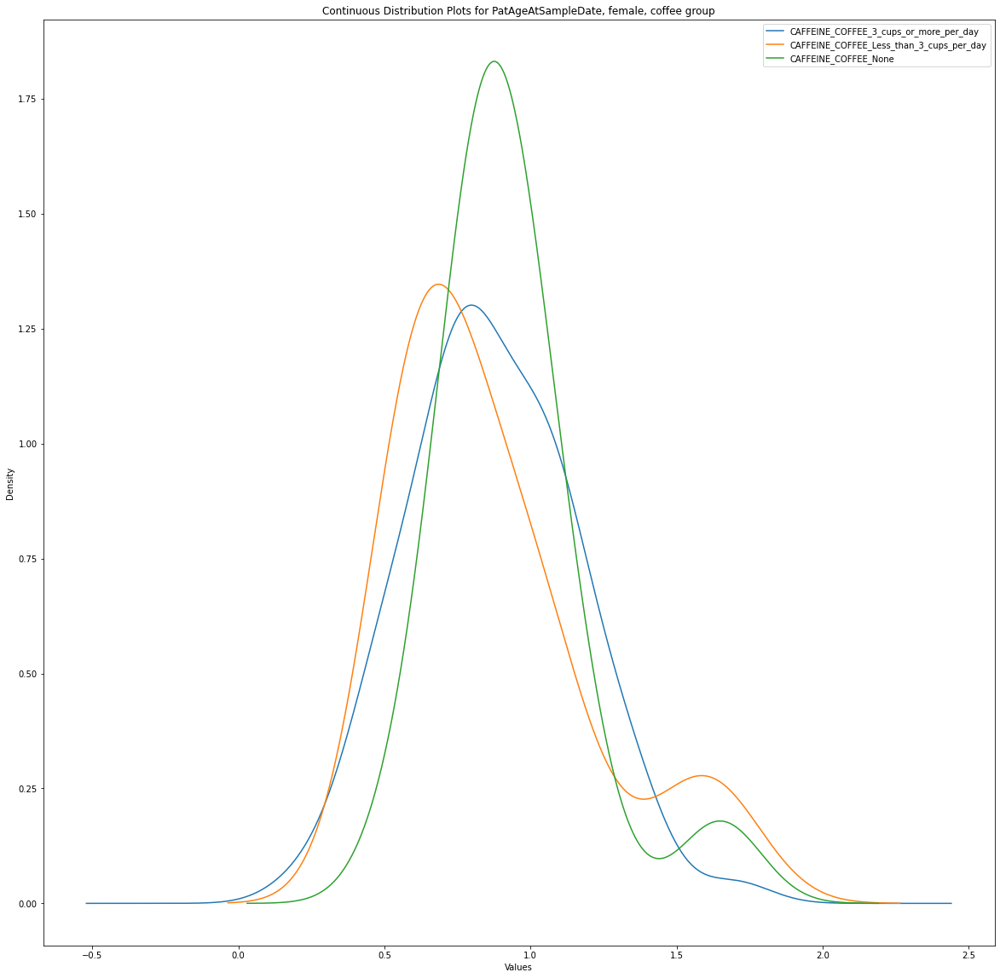

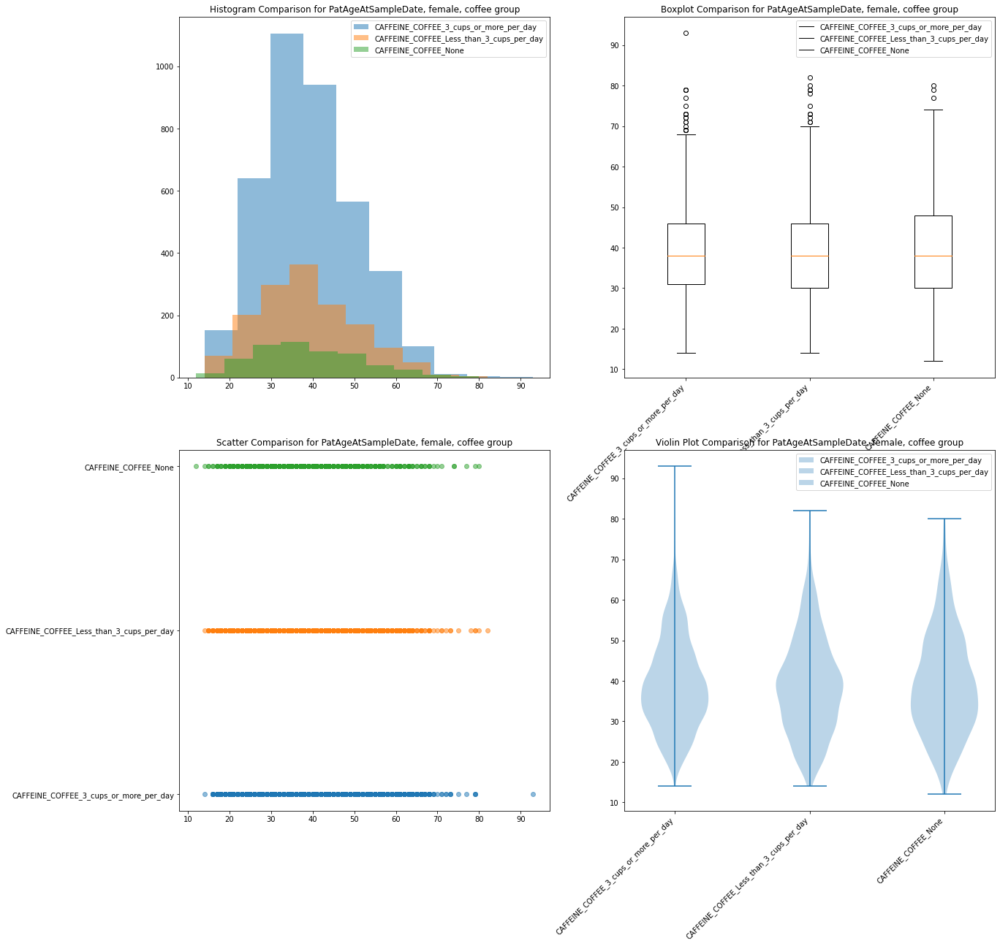

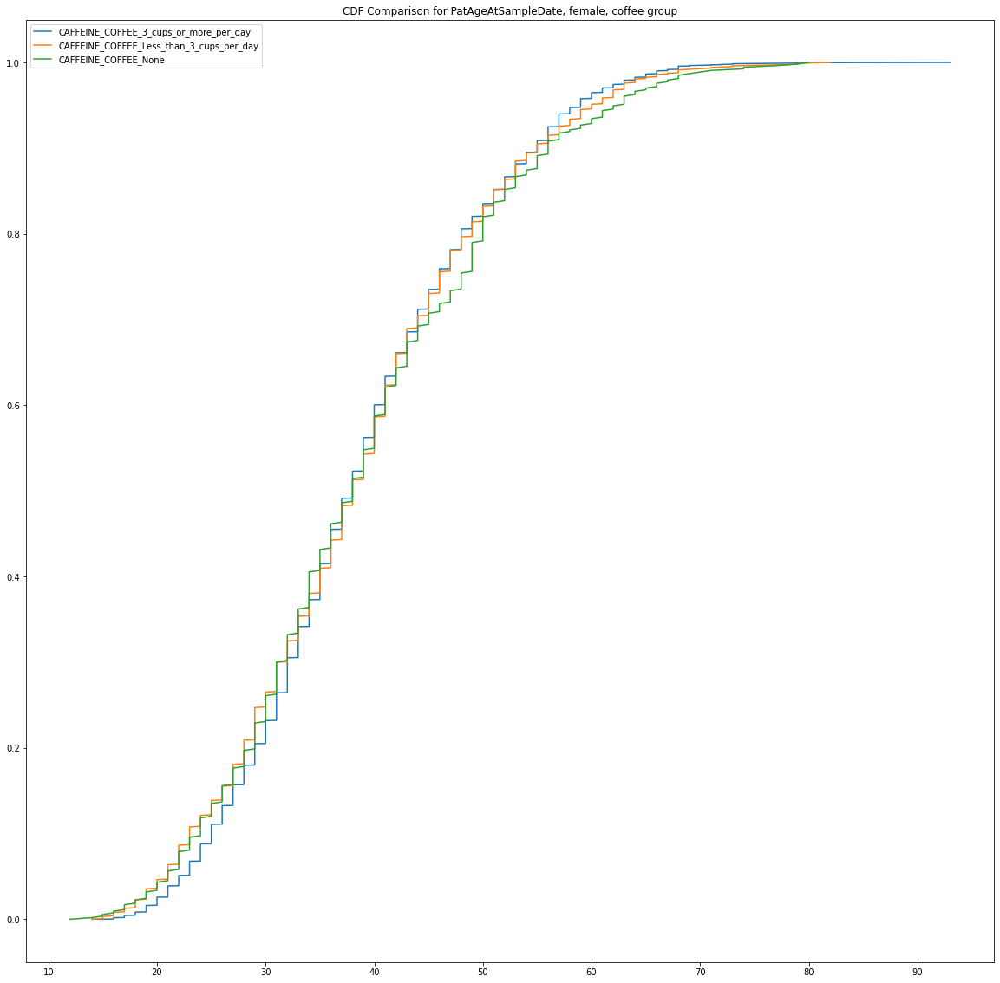

Mean:
38 38
Median:
38 38
H=2917248.5, p=0.5102059125214325


A Mann-Whitney U test of independence on PatAgeAtSampleDate  between females in the coffee group between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_Less_than_3_cups_per_day was not statistically significant, X2 (2, N = 305.0)=2917248.5, p>.05
 
Observed frequencies:
   Smokers  Patients
0  59       135     
1  17       49      
2  14       31      
 
Expected frequencies:
[[ 57.24590164 136.75409836]
 [ 19.47540984  46.52459016]
 [ 13.27868852  31.72131148]]
n=305.0
 
Mean:
38 39
Median:
38 38
H=1032520.0, p=0.9293638543499959


A Mann-Whitney U test of independence on PatAgeAtSampleDate  between females in the coffee group between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_None was not statistically significant, X2 (2, N = 305.0)=1032520.0, p>.05
 
Observed frequencies:
   Smokers  Patients
0  59       135     
1  17       49      
2  14       31      
 
Expected frequencies:


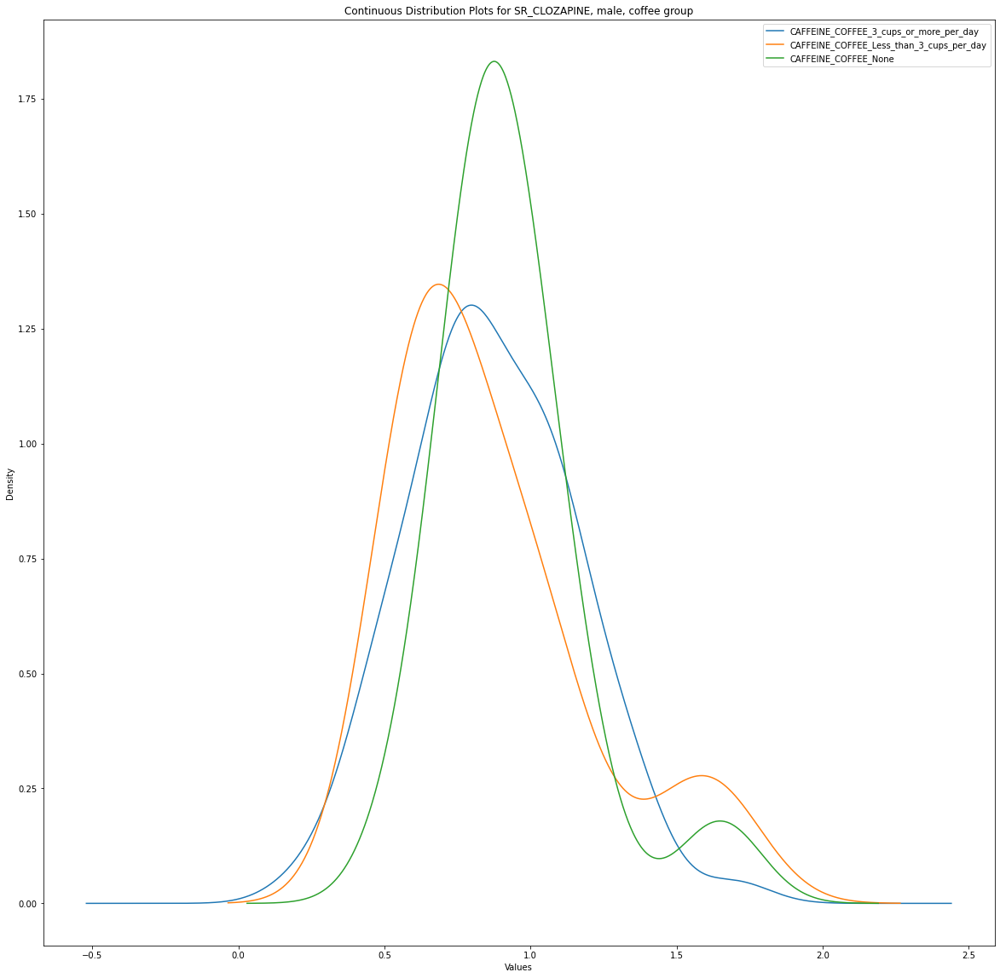

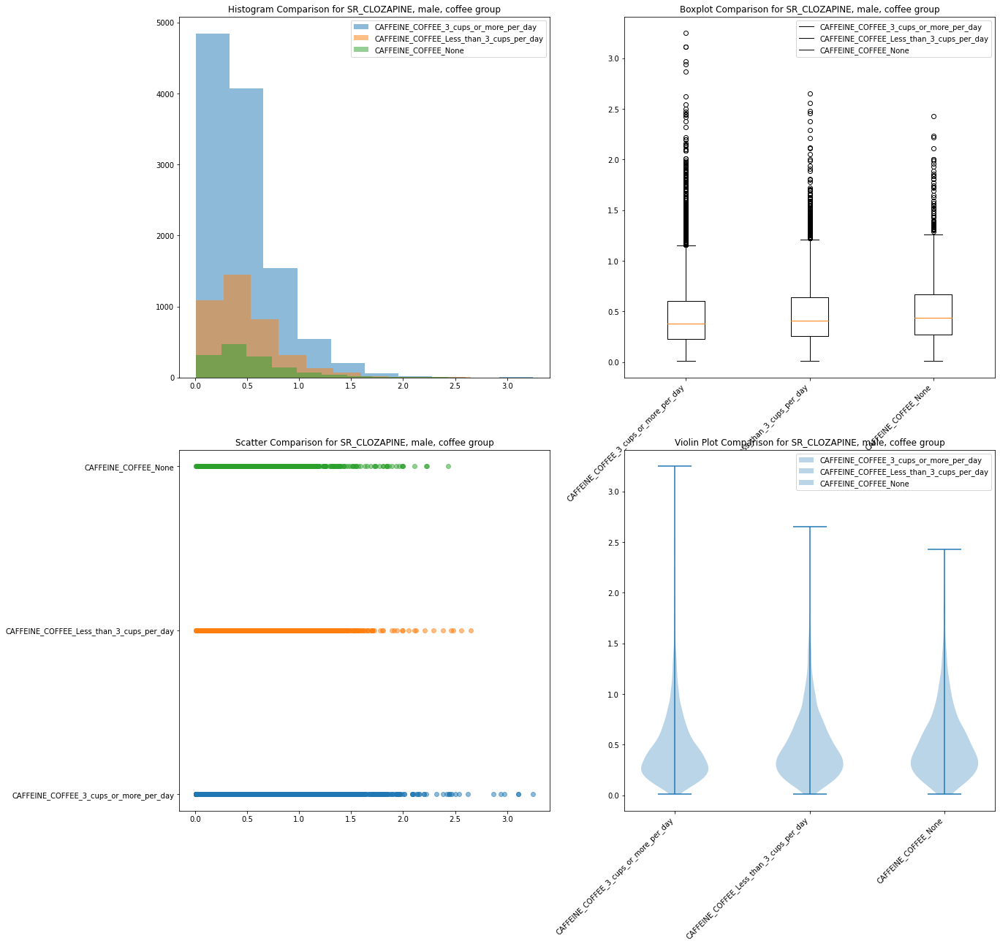

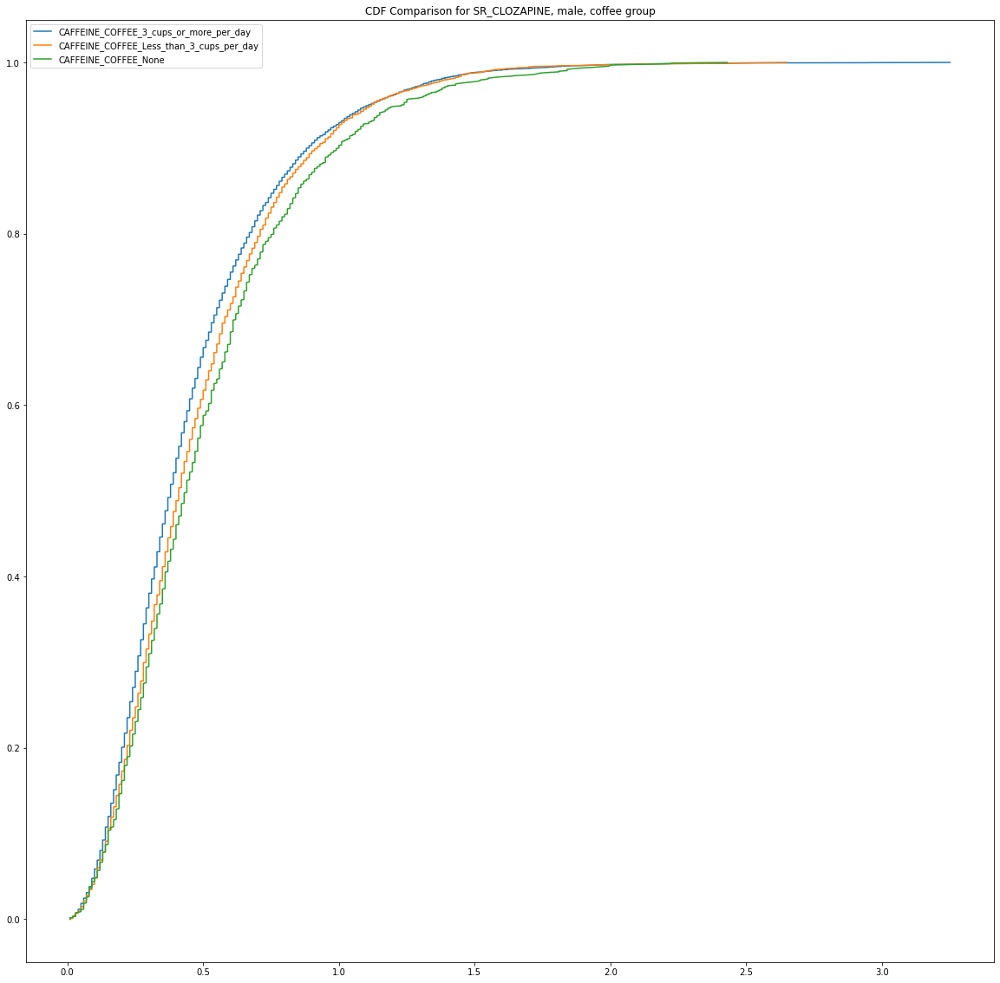

Mean:
0 0
Median:
0 0
H=20671193.0, p=1.0300014891002081e-08


A Mann-Whitney U test on SR_CLOZAPINE
                    
                    between males in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_Less_than_3_cups_per_day
                    was statistically significant at X2 (2, N = 305.0) = 20671193.0 , p<.001
 
Observed frequencies:
   Smokers  Patients
0  59       135     
1  17       49      
2  14       31      
 
Expected frequencies:
[[ 57.24590164 136.75409836]
 [ 19.47540984  46.52459016]
 [ 13.27868852  31.72131148]]
n=305.0
 
Mean:
0 0
Median:
0 0
H=6891024.5, p=1.9387966197070445e-10


A Mann-Whitney U test on SR_CLOZAPINE
                    
                    between males in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_None
                    was statistically significant at X2 (2, N = 305.0) = 6891024.5 , p<.001
 
Observed fre

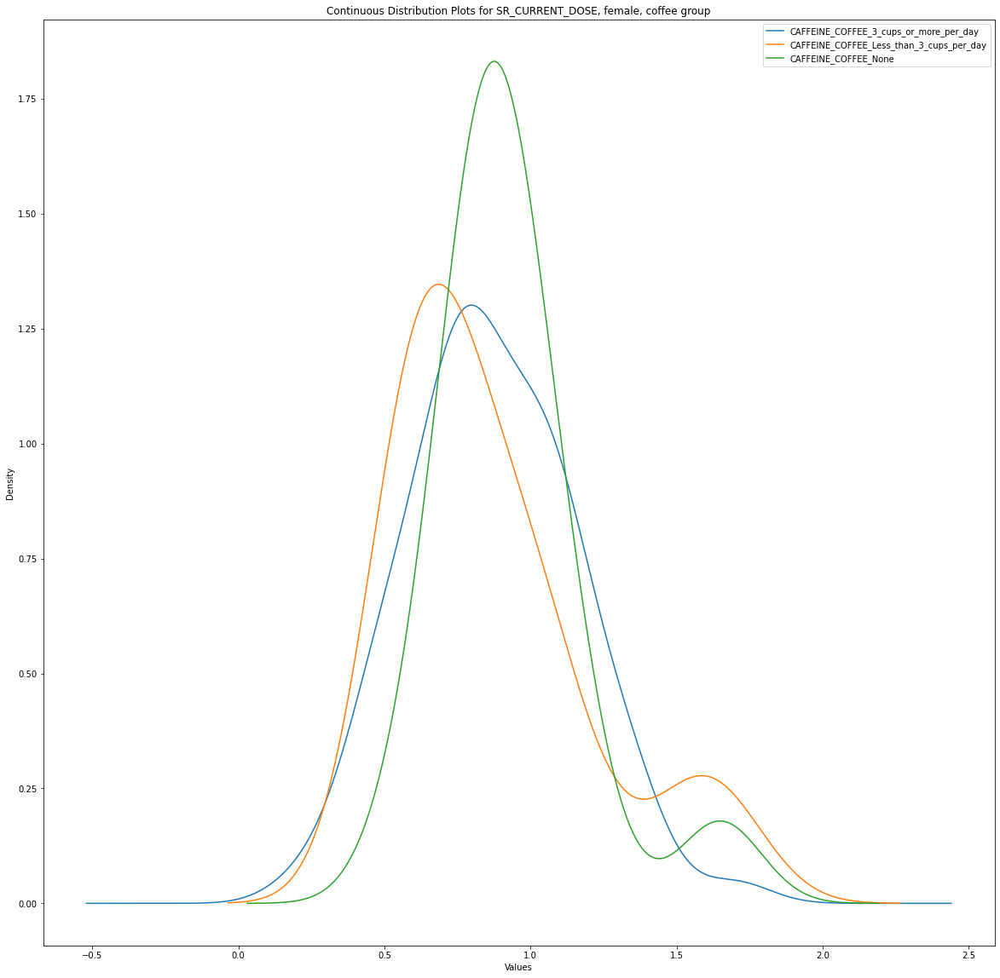

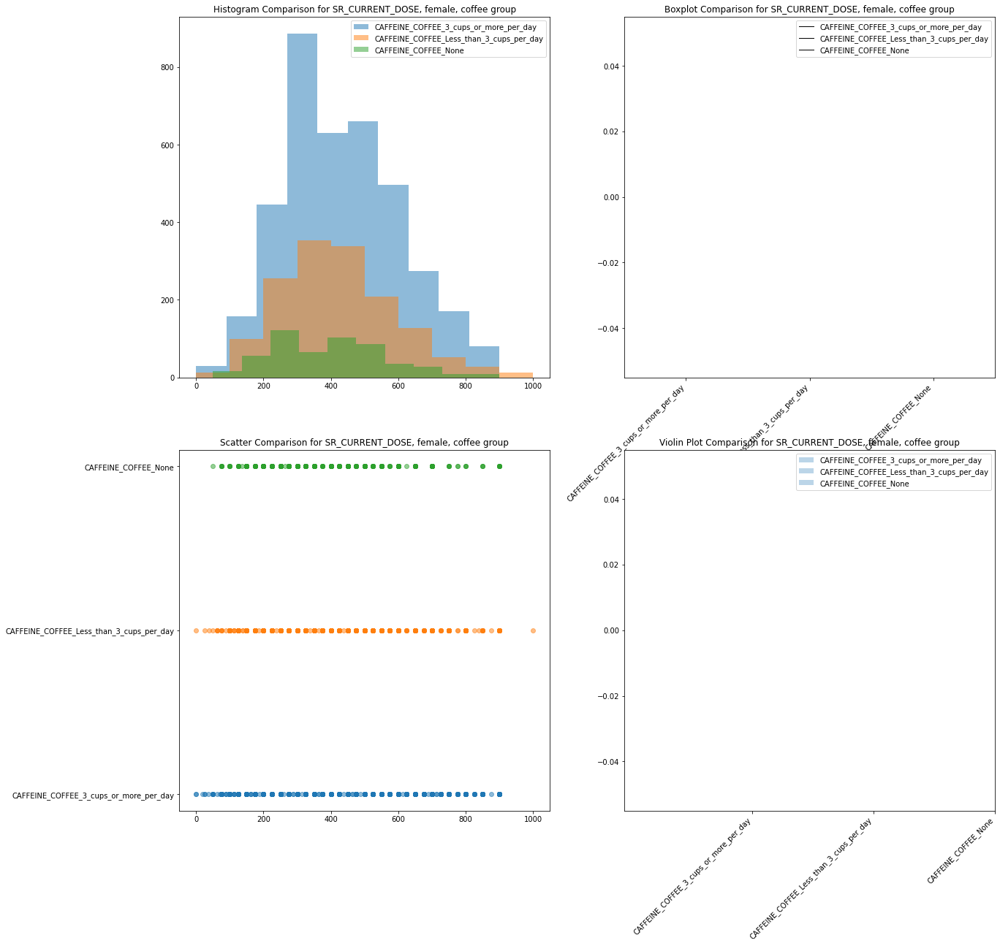

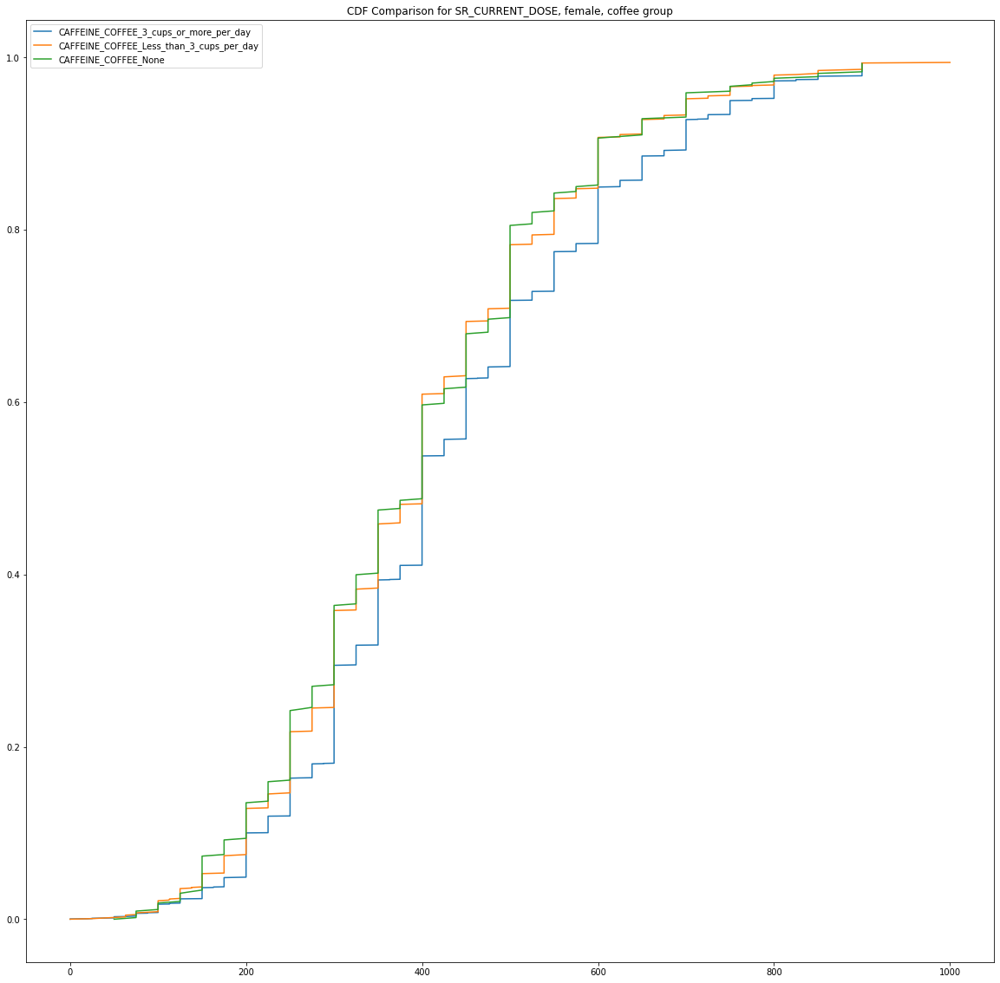

Mean:
430 397
Median:
400 400
H=3155002.5, p=8.03252635557937e-10


A Mann-Whitney U test on SR_CURRENT_DOSE
                    
                    between females in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_Less_than_3_cups_per_day
                    was statistically significant at X2 (2, N = 305.0) = 3155002.5 , p<.001
 
Observed frequencies:
   Smokers  Patients
0  59       135     
1  17       49      
2  14       31      
 
Expected frequencies:
[[ 57.24590164 136.75409836]
 [ 19.47540984  46.52459016]
 [ 13.27868852  31.72131148]]
n=305.0
 
Mean:
430 393
Median:
400 400
H=1139106.0, p=5.069654226412836e-06


A Mann-Whitney U test on SR_CURRENT_DOSE
                    
                    between females in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_None
                    was statistically significant at X2 (2, N = 305.0) = 1139106.0 , 

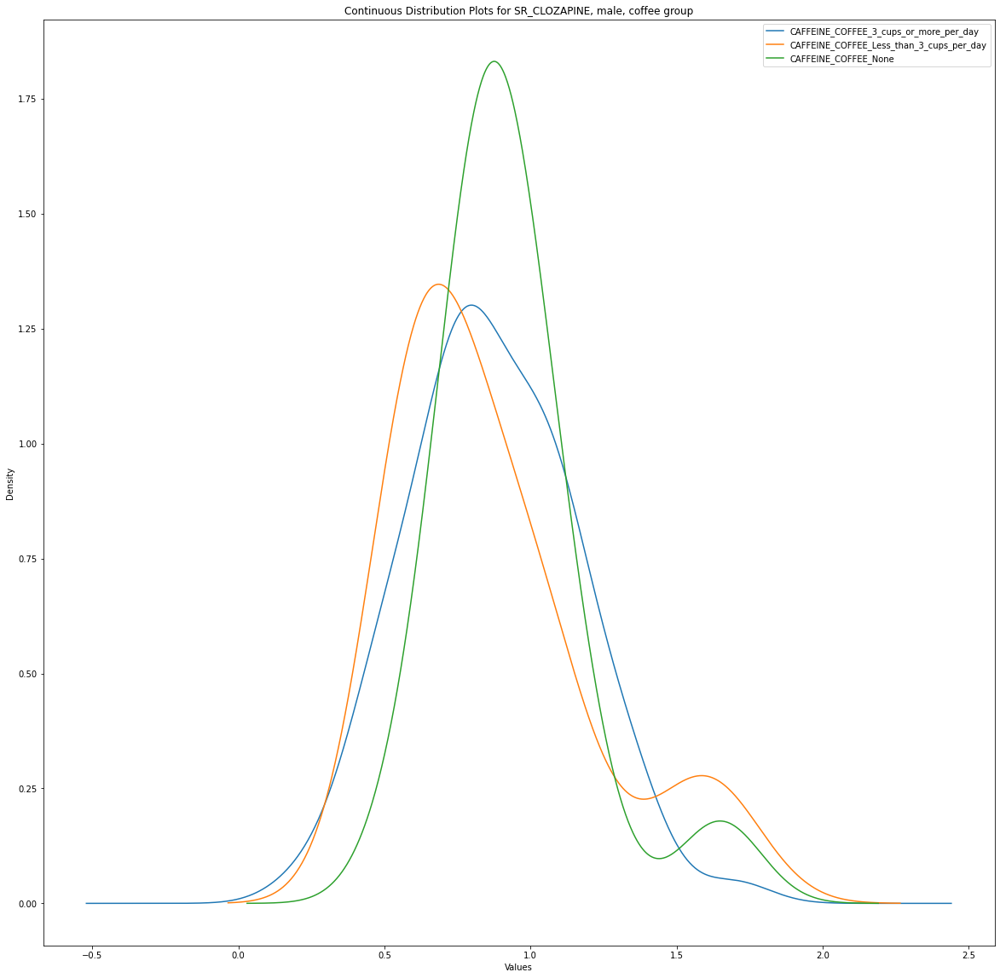

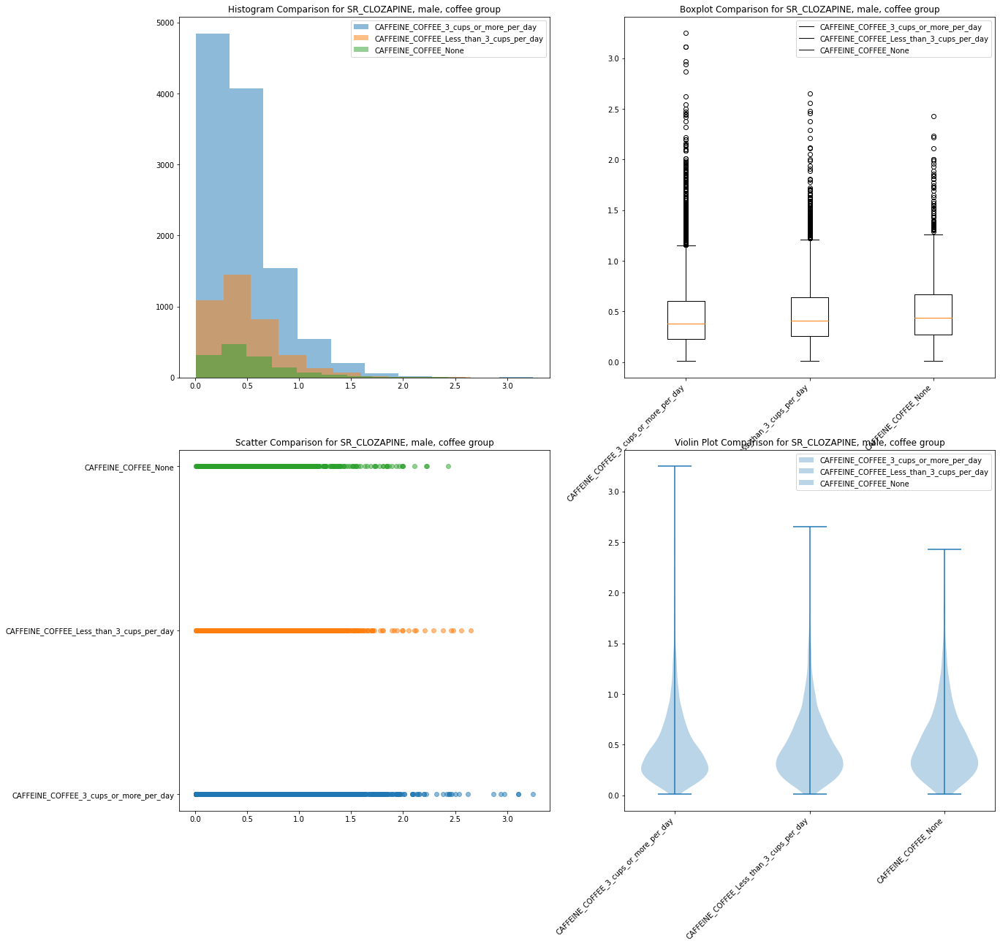

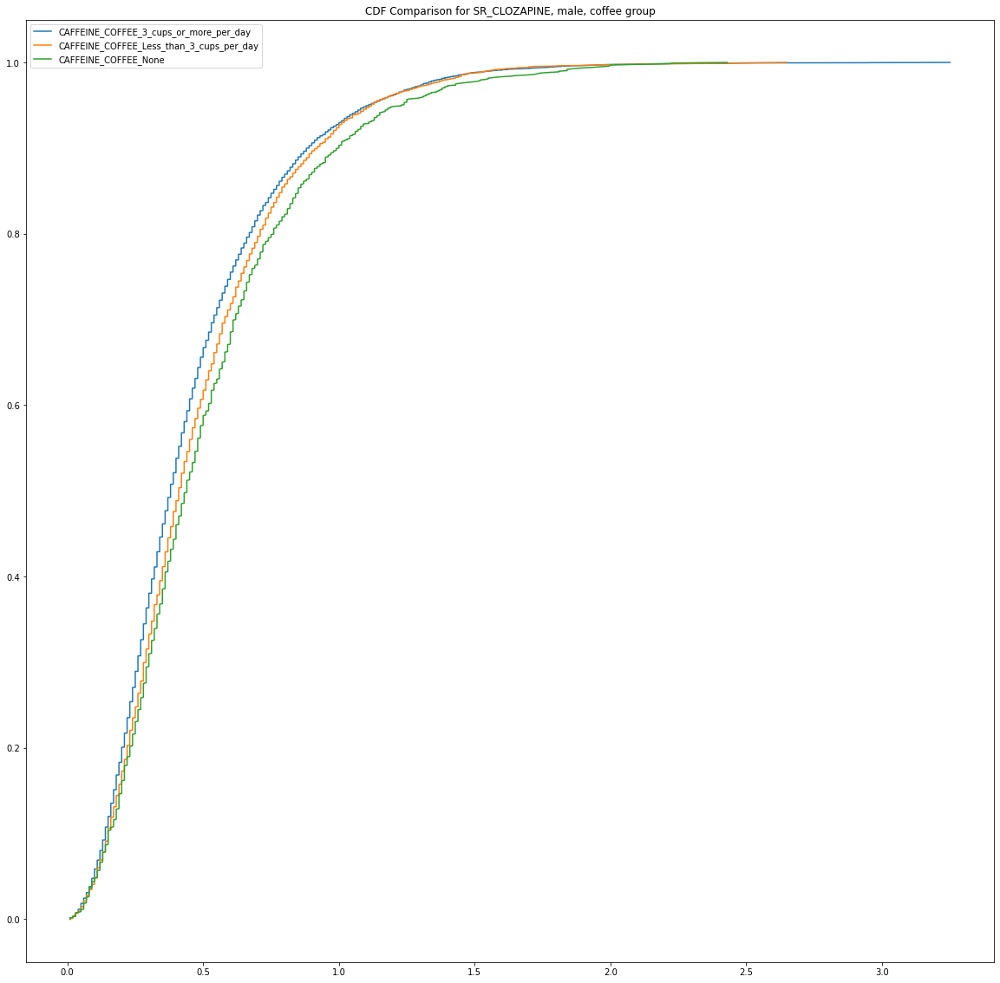

Mean:
0 0
Median:
0 0
H=20671193.0, p=1.0300014891002081e-08


A Mann-Whitney U test on SR_CLOZAPINE
                    
                    between males in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_Less_than_3_cups_per_day
                    was statistically significant at X2 (2, N = 305.0) = 20671193.0 , p<.001
 
Observed frequencies:
   Smokers  Patients
0  59       135     
1  17       49      
2  14       31      
 
Expected frequencies:
[[ 57.24590164 136.75409836]
 [ 19.47540984  46.52459016]
 [ 13.27868852  31.72131148]]
n=305.0
 
Mean:
0 0
Median:
0 0
H=6891024.5, p=1.9387966197070445e-10


A Mann-Whitney U test on SR_CLOZAPINE
                    
                    between males in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_None
                    was statistically significant at X2 (2, N = 305.0) = 6891024.5 , p<.001
 
Observed fre

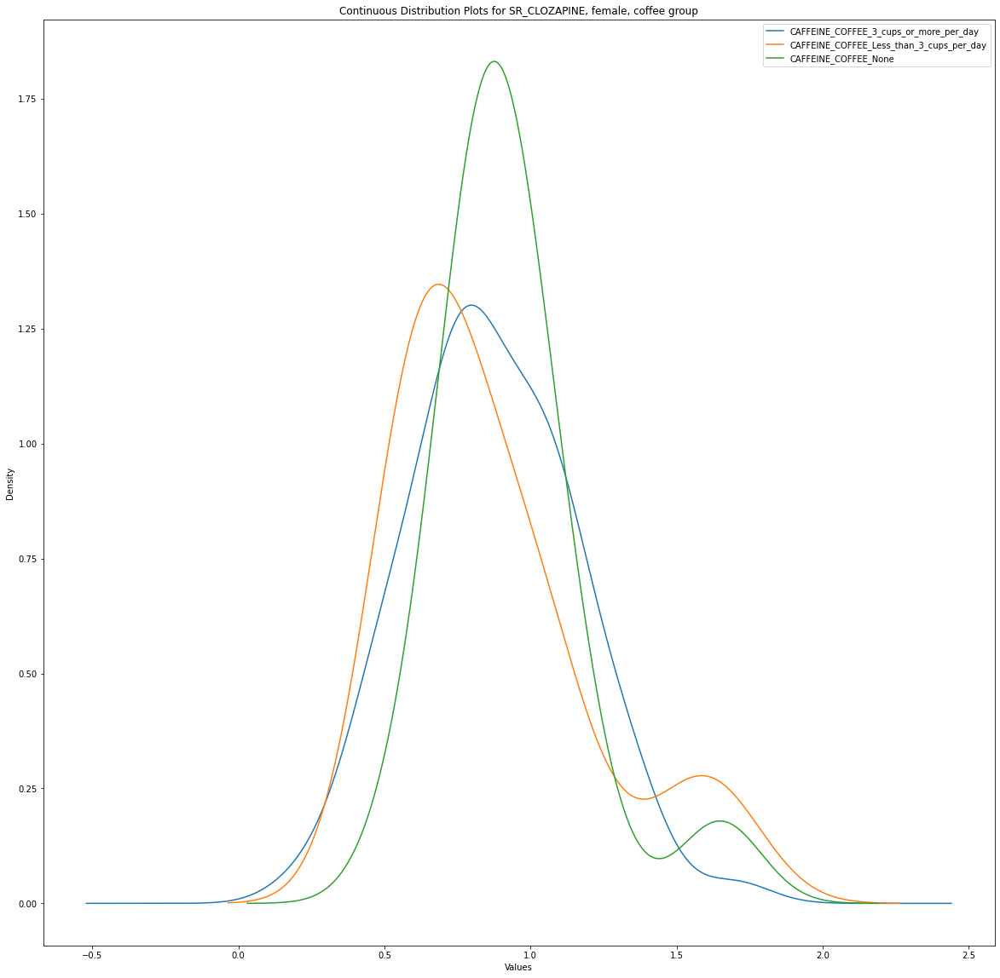

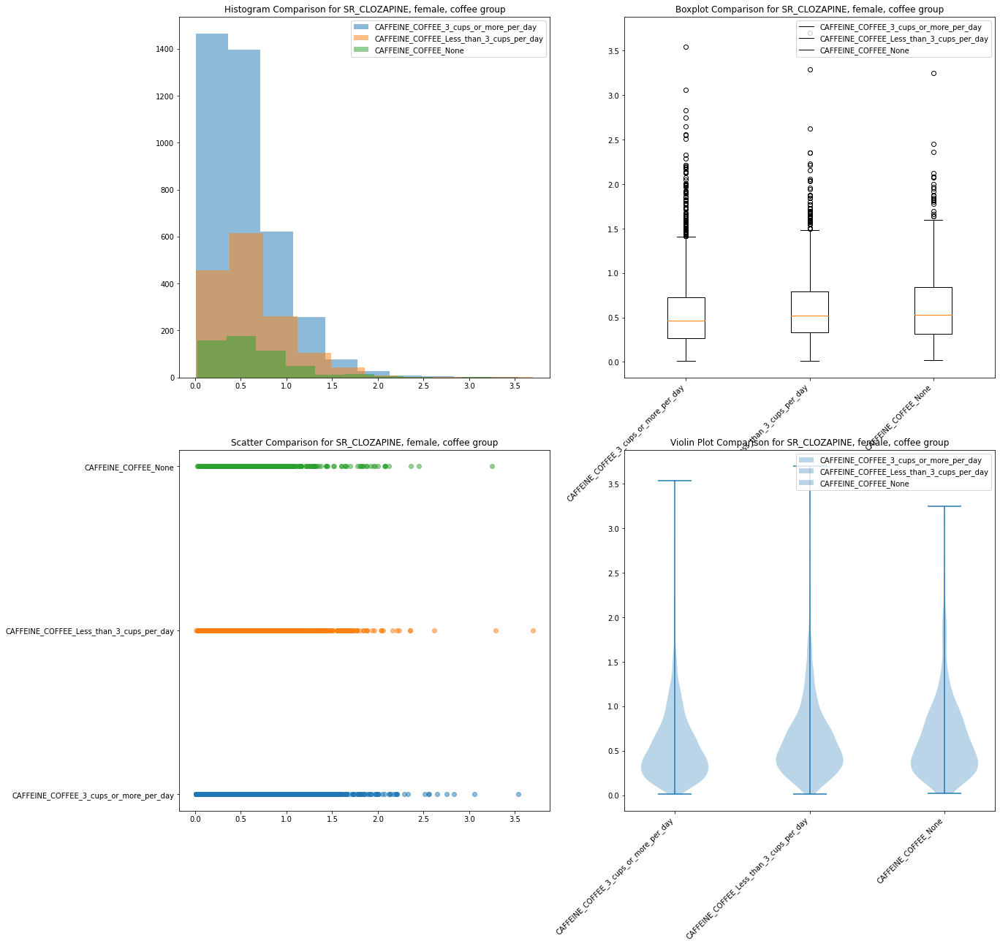

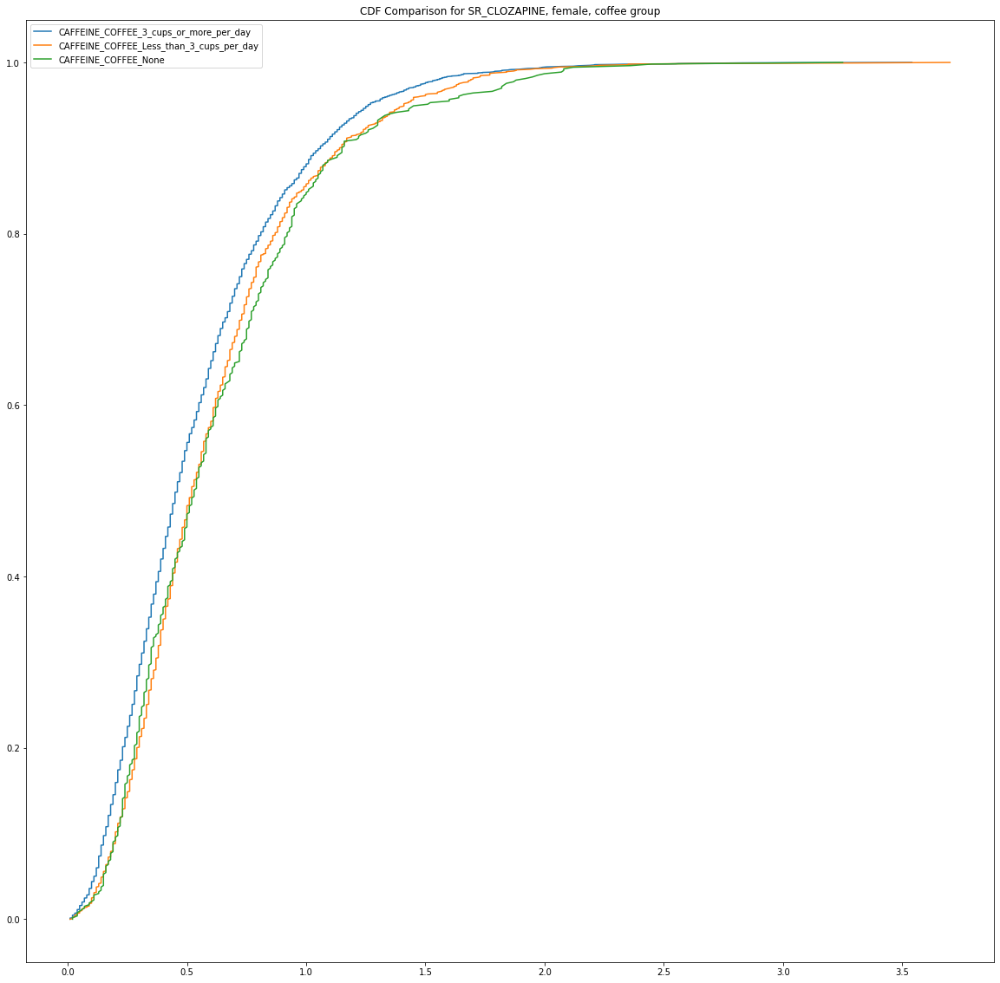

Mean:
0 0
Median:
0 0
H=2560844.0, p=1.9175834383616364e-10


A Mann-Whitney U test on SR_CLOZAPINE
                    
                    between females in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_Less_than_3_cups_per_day
                    was statistically significant at X2 (2, N = 305.0) = 2560844.0 , p<.001
 
Observed frequencies:
   Smokers  Patients
0  59       135     
1  17       49      
2  14       31      
 
Expected frequencies:
[[ 57.24590164 136.75409836]
 [ 19.47540984  46.52459016]
 [ 13.27868852  31.72131148]]
n=305.0
 
Mean:
0 0
Median:
0 0
H=910278.0, p=1.2840465317700699e-05


A Mann-Whitney U test on SR_CLOZAPINE
                    
                    between females in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_None
                    was statistically significant at X2 (2, N = 305.0) = 910278.0 , p<.001
 
Observed fre

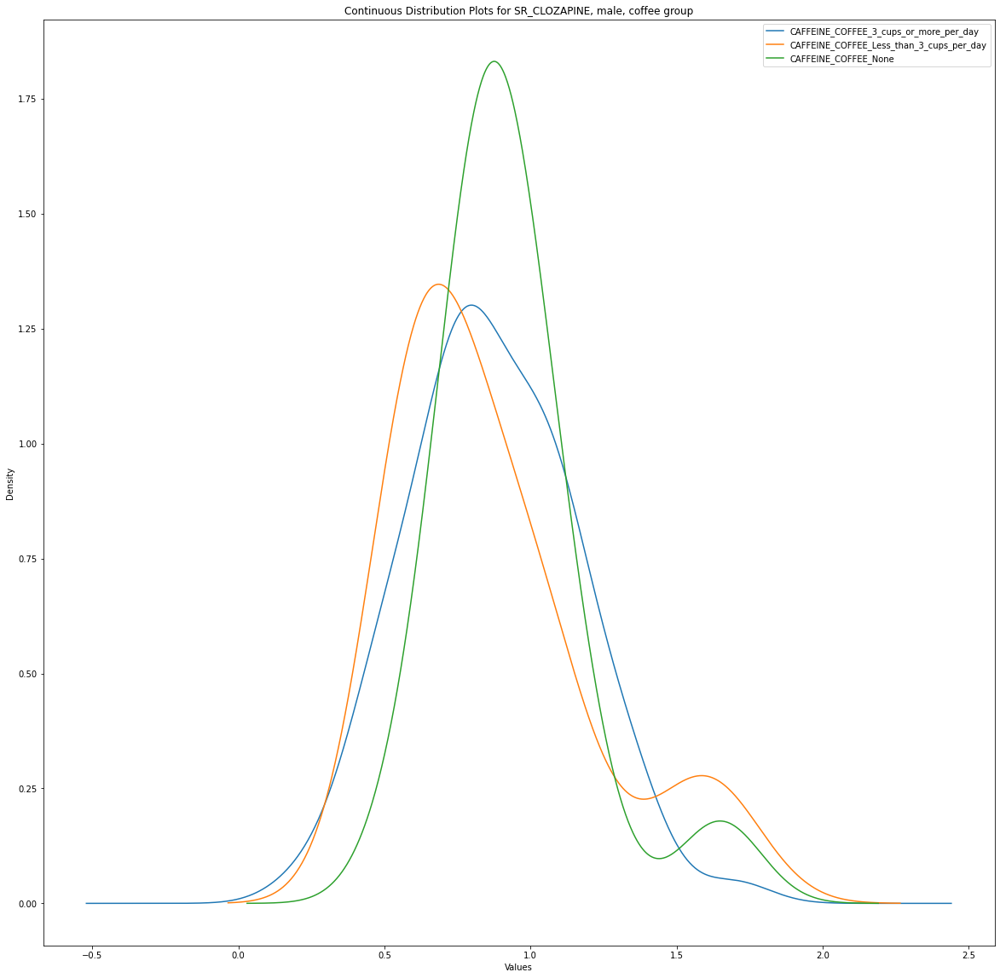

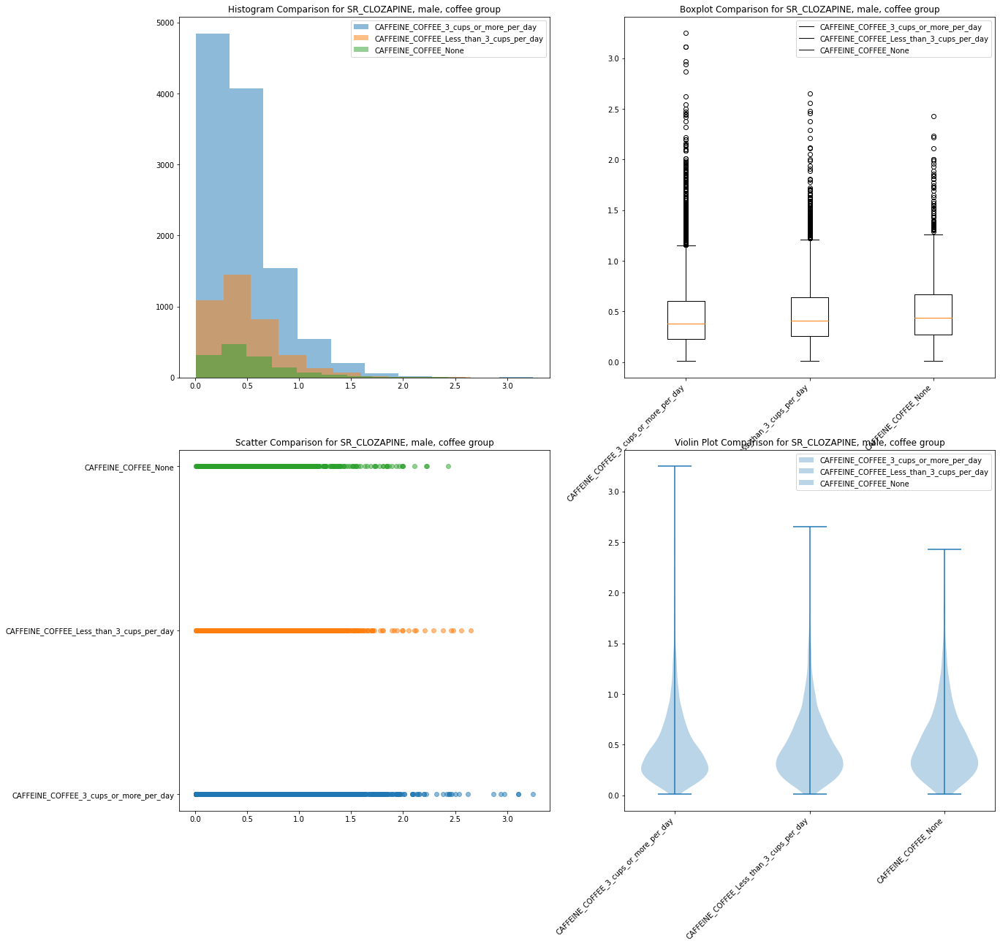

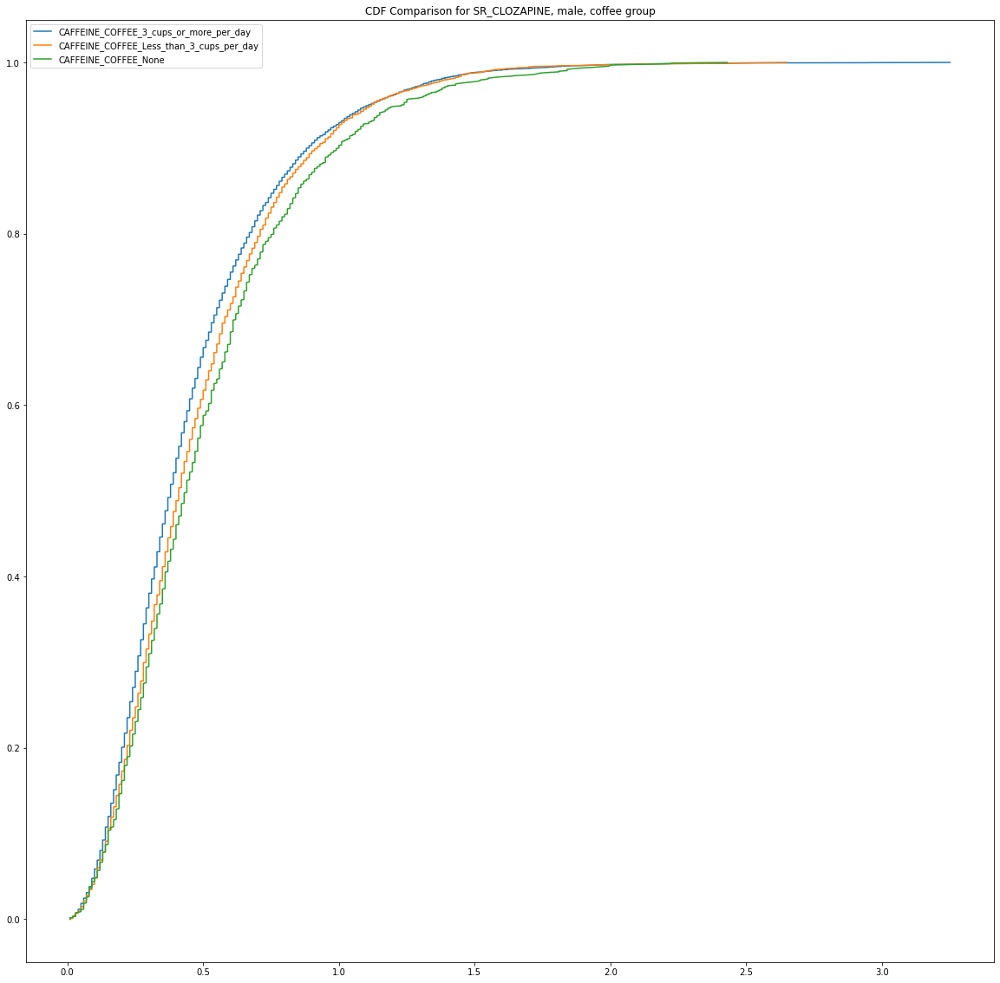

Mean:
0 0
Median:
0 0
H=20671193.0, p=1.0300014891002081e-08


A Mann-Whitney U test on SR_CLOZAPINE
                    
                    between males in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_Less_than_3_cups_per_day
                    was statistically significant at X2 (2, N = 305.0) = 20671193.0 , p<.001
 
Observed frequencies:
   Smokers  Patients
0  59       135     
1  17       49      
2  14       31      
 
Expected frequencies:
[[ 57.24590164 136.75409836]
 [ 19.47540984  46.52459016]
 [ 13.27868852  31.72131148]]
n=305.0
 
Mean:
0 0
Median:
0 0
H=6891024.5, p=1.9387966197070445e-10


A Mann-Whitney U test on SR_CLOZAPINE
                    
                    between males in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_None
                    was statistically significant at X2 (2, N = 305.0) = 6891024.5 , p<.001
 
Observed fre

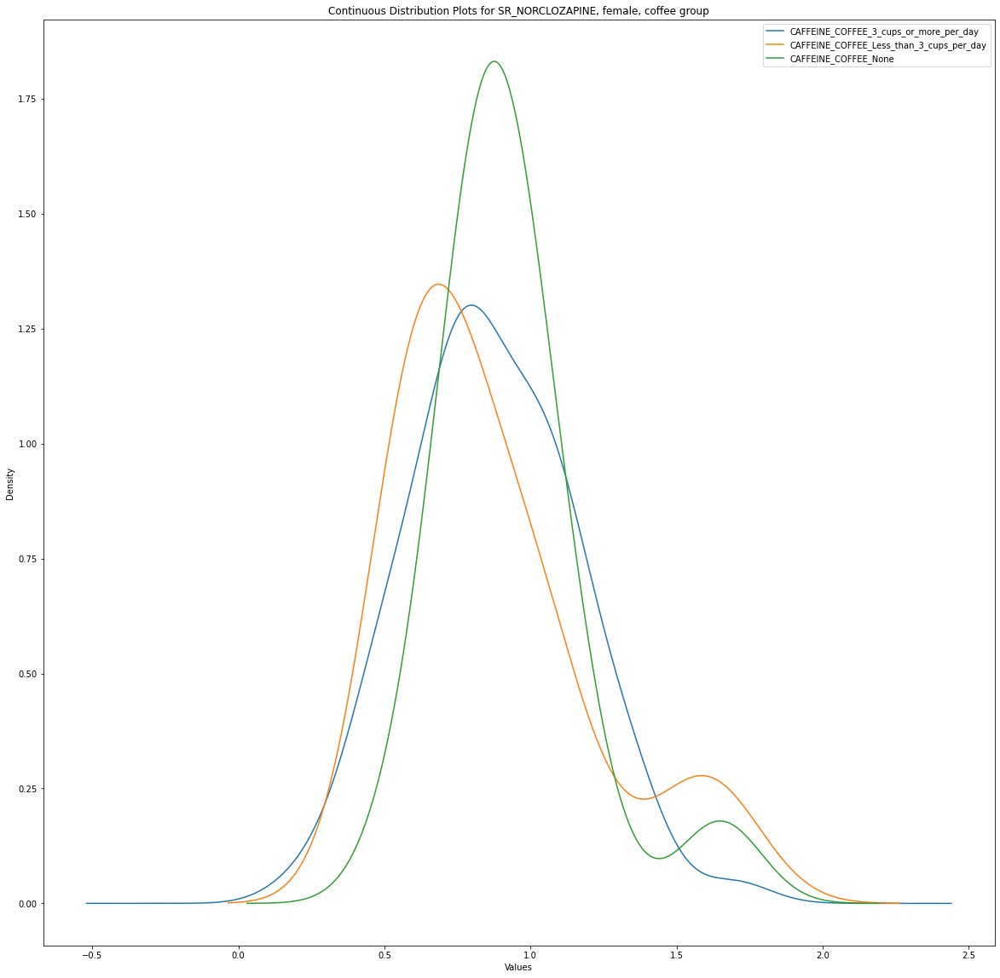

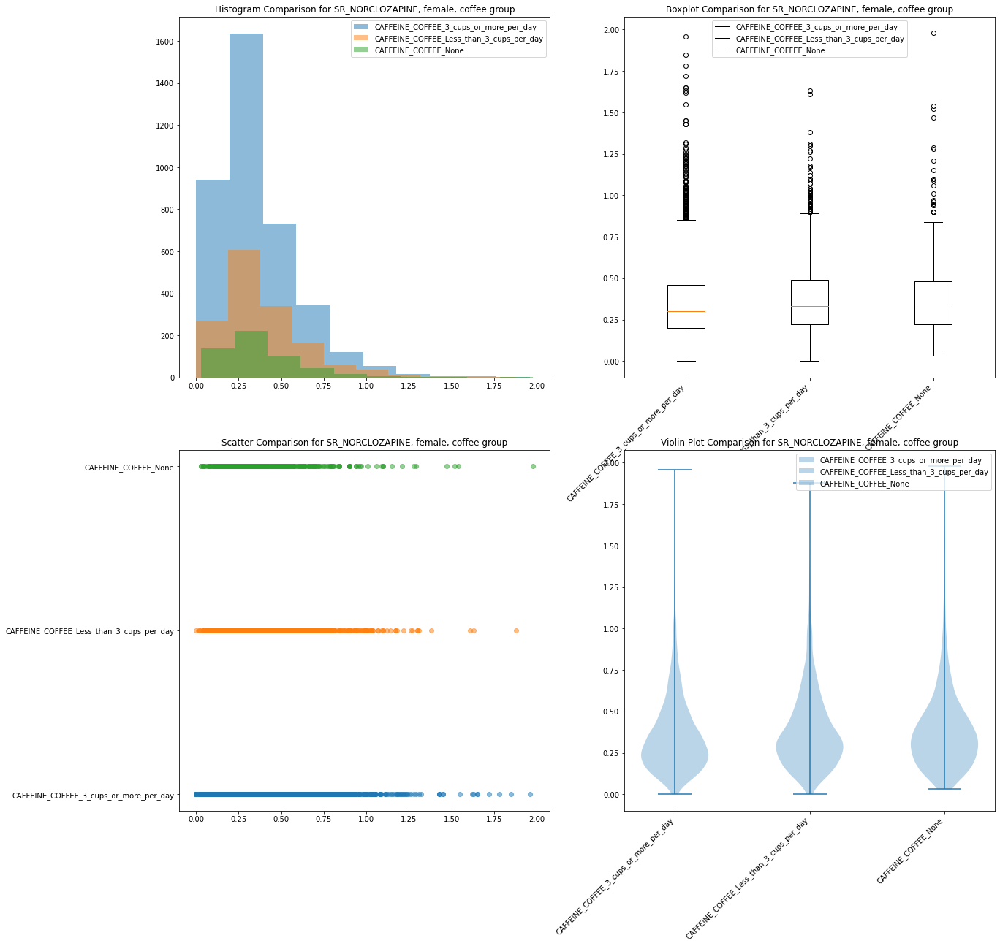

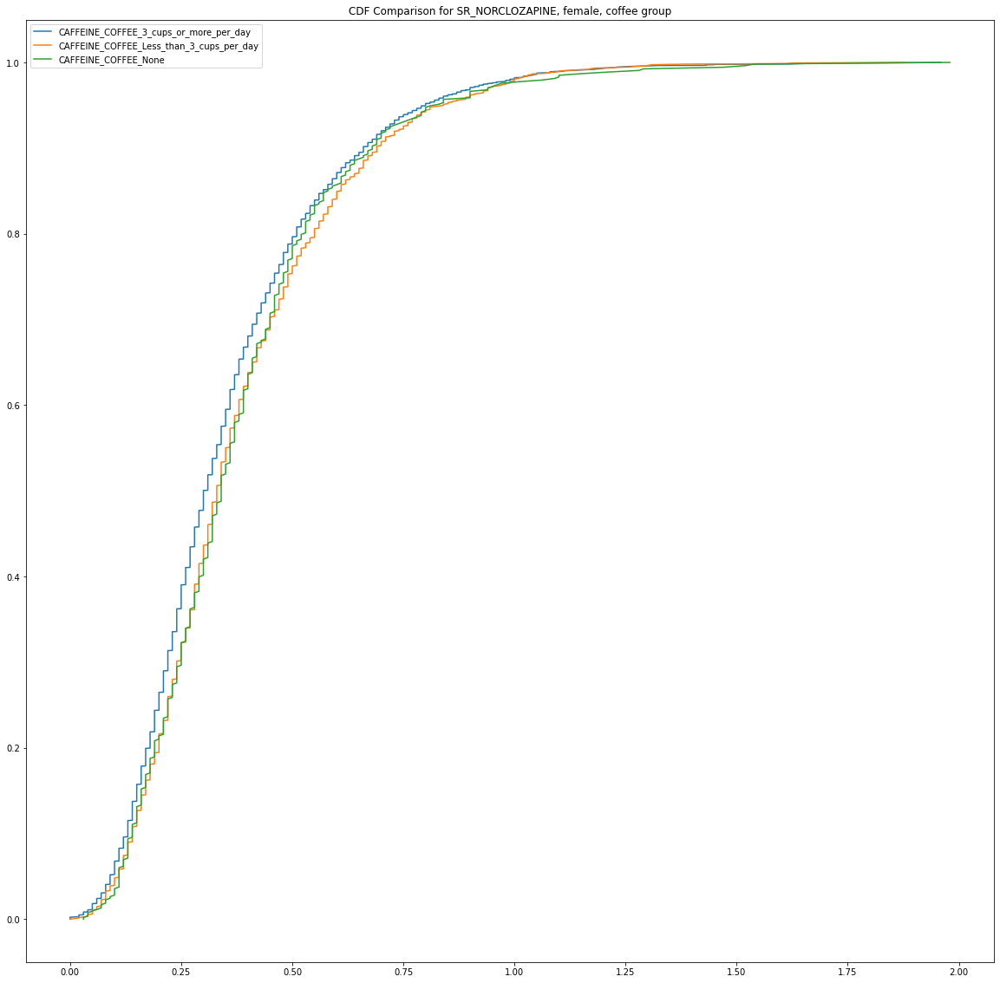

Mean:
0 0
Median:
0 0
H=2658802.0, p=9.118266915035123e-06


A Mann-Whitney U test on SR_NORCLOZAPINE
                    
                    between females in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_Less_than_3_cups_per_day
                    was statistically significant at X2 (2, N = 305.0) = 2658802.0 , p<.001
 
Observed frequencies:
   Smokers  Patients
0  59       135     
1  17       49      
2  14       31      
 
Expected frequencies:
[[ 57.24590164 136.75409836]
 [ 19.47540984  46.52459016]
 [ 13.27868852  31.72131148]]
n=305.0
 
Counter break
Mean:
0 0
Median:
0 0
H=950490.5, p=0.0037465439076824715


A Mann-Whitney U test of independence on SR_NORCLOZAPINE  between females in the coffee group between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_None was statistically significant at X2 (2, N = 305.0)=950490.5, p<.05 
 
Observed frequencies:
   Smokers  Patients
0  59       135   

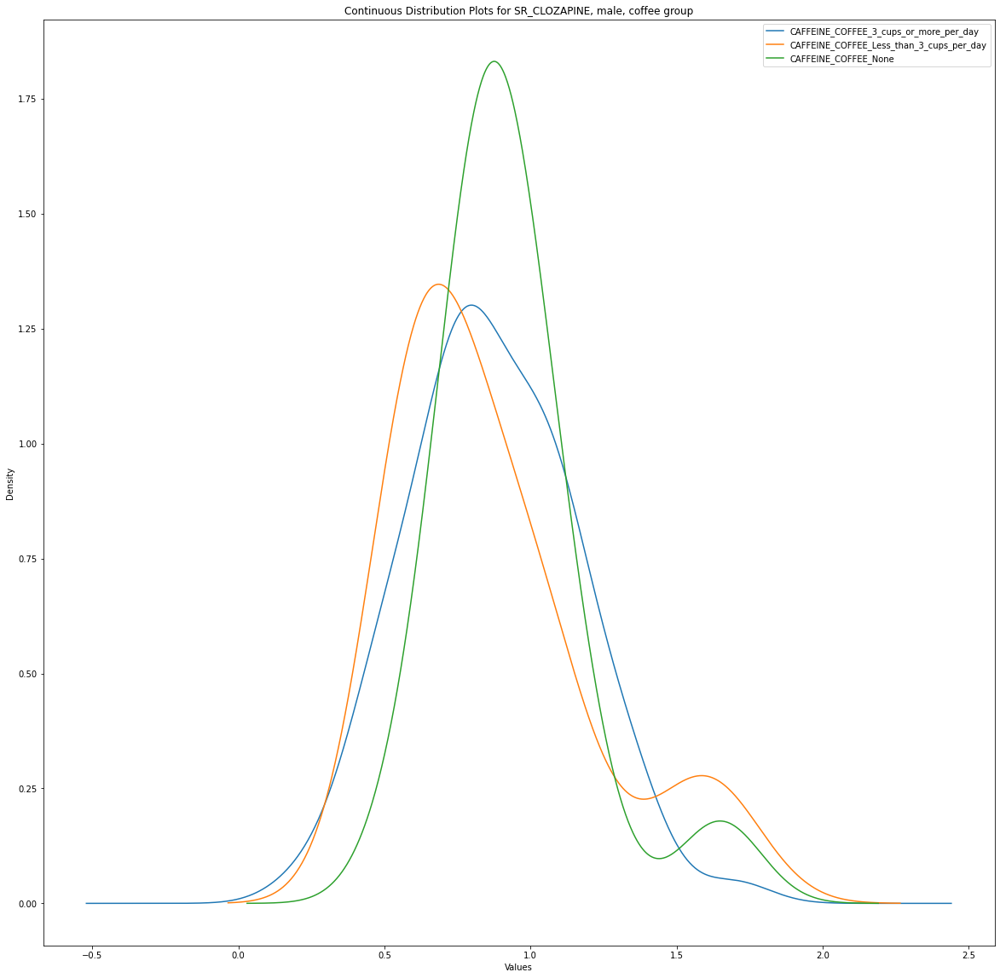

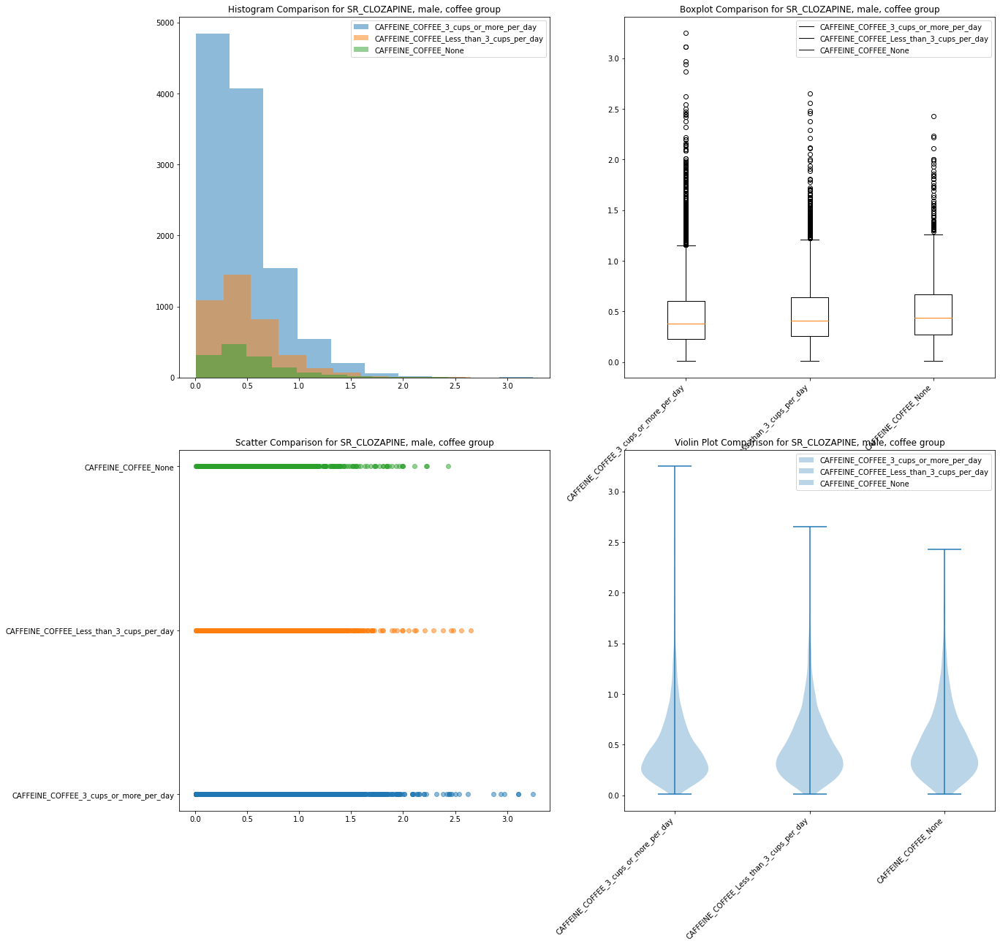

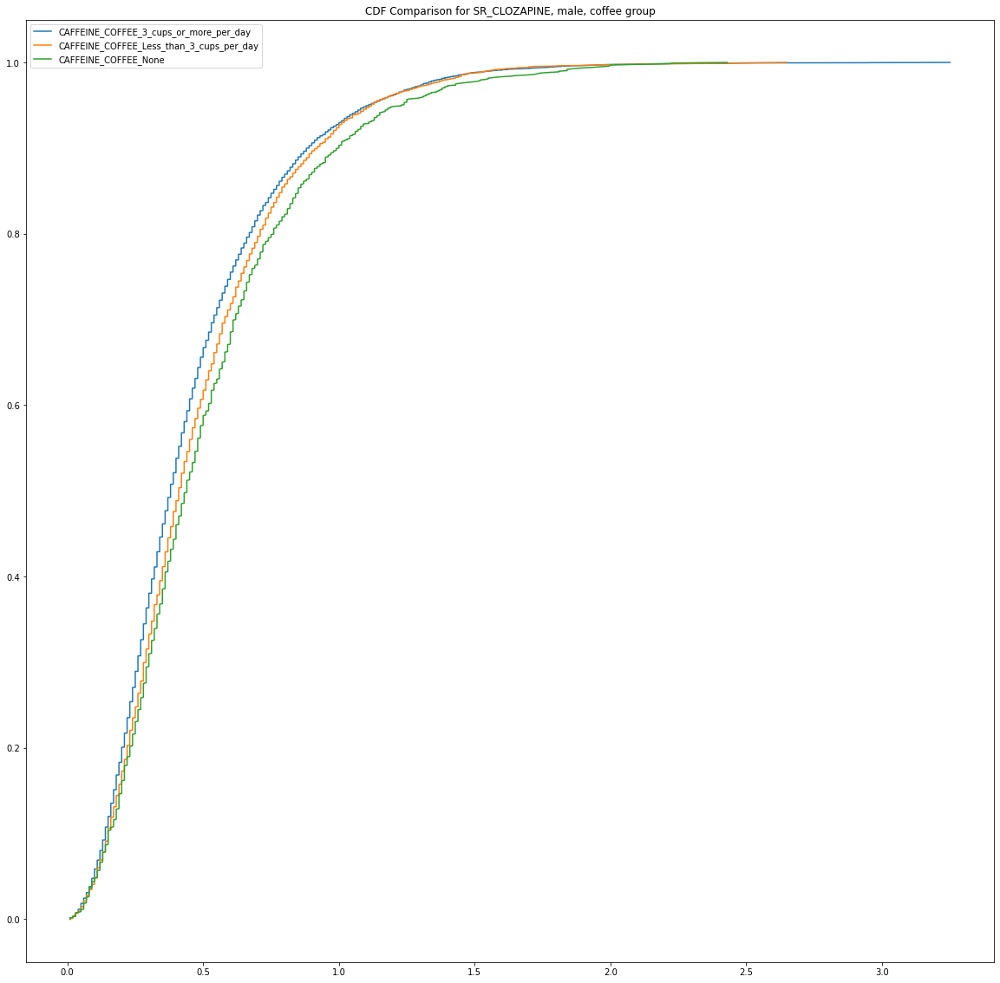

Mean:
0 0
Median:
0 0
H=20671193.0, p=1.0300014891002081e-08


A Mann-Whitney U test on SR_CLOZAPINE
                    
                    between males in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_Less_than_3_cups_per_day
                    was statistically significant at X2 (2, N = 305.0) = 20671193.0 , p<.001
 
Observed frequencies:
   Smokers  Patients
0  59       135     
1  17       49      
2  14       31      
 
Expected frequencies:
[[ 57.24590164 136.75409836]
 [ 19.47540984  46.52459016]
 [ 13.27868852  31.72131148]]
n=305.0
 
Mean:
0 0
Median:
0 0
H=6891024.5, p=1.9387966197070445e-10


A Mann-Whitney U test on SR_CLOZAPINE
                    
                    between males in the coffee group
                    between CAFFEINE_COFFEE_3_cups_or_more_per_day and between CAFFEINE_COFFEE_None
                    was statistically significant at X2 (2, N = 305.0) = 6891024.5 , p<.001
 
Observed fre

In [464]:
#split by smoking as per table 2 amendment:
#check permutations:
for i in range(0, len(outcome_var_list)):
    for j in range(0, len(sex_bool_keys)):
        for k in range(0, len(group_list_keys)):
            #for m in range(0, len(smoking_list_keys)):

            print("----------------------------------------------------------------------------")
            print(f"{group_list_keys[k]}")

            outcome_var  = outcome_var_list[i]

            label_list = ['CAFFEINE_COFFEE_3_cups_or_more_per_day',
                                       'CAFFEINE_COFFEE_Less_than_3_cups_per_day',
                                       'CAFFEINE_COFFEE_None']

            sex_bool     = sex_bool_dict.get(sex_bool_keys[j])
            group_list   = group_list_dict.get(group_list_keys[k])

            smoking_bool = smoking_list_dict.get(smoking_list_keys[m]).get(list(smoking_list_dict.get(smoking_list_keys[m]).keys())[0])
            smoking_col  = list(smoking_list_dict.get(smoking_list_keys[m]).keys())[0]


            print(outcome_var," " ,sex_bool_keys[j], " ",group_list_keys[k], " ")
            print(outcome_var, sex_bool,  )

            #add smoking condition

            g1a = group_list[0][(group_list[0]['Sex_Male']==sex_bool) ][outcome_var]
            #g1b = group_list[0][(group_list[0]['Sex_Male']==sex_bool)][outcome_var]

            g2a = group_list[1][(group_list[1]['Sex_Male']==sex_bool) ][outcome_var]
            #g2b = group_list[1][(group_list[1]['Sex_Male']==sex_bool)][outcome_var]

            g3a = group_list[2][(group_list[2]['Sex_Male']==sex_bool) ][outcome_var]
            #g3b = group_list[2][(group_list[2]['Sex_Male']==sex_bool)][outcome_var]


            print(f"{outcome_var} {(g1a.median(), 'CAFFEINE_COFFEE_3_cups_or_more_per_day')}, {(g2a.median(), 'CAFFEINE_COFFEE_Less_than_3_cups_per_day')}, {(g3a.median(),'CAFFEINE_COFFEE_None')}")

            #permute_list = [(g1a,g1b), (g2a,g2b), (g3a,g3b)]

            combination_list = list(combinations([(g1a, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (g2a, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (g3a,'CAFFEINE_COFFEE_None')], 2))

            
                        # plot the series in the same figure
            fig, ax = plt.subplots()
            g1.plot(kind='kde', ax=ax, label = 'CAFFEINE_COFFEE_3_cups_or_more_per_day')
            g2.plot(kind='kde', ax=ax, label = 'CAFFEINE_COFFEE_Less_than_3_cups_per_day')
            g3.plot(kind='kde', ax=ax, label = 'CAFFEINE_COFFEE_None')

            series1 = g1a
            series2 = g2a
            series3 = g3a
            
            
            # set the title and labels
            ax.set_title(f'Continuous Distribution Plots for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}')
            ax.set_xlabel('Values')
            ax.set_ylabel('Density')
            
            ax.legend()
            
            # plot the series in the same figure
            fig, axs = plt.subplots(2, 2)

            # plot histogram for series1 and series2
            axs[0, 0].hist(series1, alpha=0.5, label='CAFFEINE_COFFEE_3_cups_or_more_per_day')
            axs[0, 0].hist(series2, alpha=0.5, label='CAFFEINE_COFFEE_Less_than_3_cups_per_day')
            axs[0, 0].hist(series3, alpha=0.5, label='CAFFEINE_COFFEE_None')
            axs[0, 0].set_title(f'Histogram Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}')
            axs[0, 0].legend(label_list)
            
            plt.xticks(rotation=45, ha='right')
            # plot boxplot for series1 and series3
            axs[0, 1].boxplot([series1, series2, series3],labels=label_list)
            axs[0, 1].set_title(f'Boxplot Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}')
            axs[0, 1].legend(label_list)
            plt.xticks(rotation=45, ha='right')
            for tick in axs[0, 1].get_xticklabels():
                tick.set_rotation(45)
                tick.set_horizontalalignment('right')

#             # plot scatter plot for series1 and series2
#             axs[1, 0].scatter(series1.index, series1.values)
#             axs[1, 0].scatter(series2.index, series2.values)
#             axs[1, 0].set_title(f"""Scatter Plot Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}
#                                    CAFFEINE_COFFEE_3_cups_or_more_per_day &  CAFFEINE_COFFEE_Less_than_3_cups_per_day""")
#             axs[1, 0].legend(['CAFFEINE_COFFEE_3_cups_or_more_per_day', 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'])
            
    
        
            axs[1, 0].set_title(f'Scatter Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}')
            axs[1, 0].scatter(series1, [0]*len(series1), alpha=0.5, label='CAFFEINE_COFFEE_3_cups_or_more_per_day')
            axs[1, 0].scatter(series2, [1]*len(series2), alpha=0.5, label='CAFFEINE_COFFEE_Less_than_3_cups_per_day')
            axs[1, 0].scatter(series3, [2]*len(series3), alpha=0.5, label='CAFFEINE_COFFEE_None')

            axs[1, 0].set_yticks([0, 1, 2])
            axs[1, 0].set_yticklabels(['CAFFEINE_COFFEE_3_cups_or_more_per_day', 'CAFFEINE_COFFEE_Less_than_3_cups_per_day', 'CAFFEINE_COFFEE_None'])

            plt.legend()
            #plt.show()
            
#                         # create a dataframe with the three series
#             df = pd.DataFrame({'series1': series1,
#                                'series2': series2,
#                                'series3': series3})

#             # plot a scatter graph
#             df.plot(kind='scatter', x='series1', y='series2', color='red')
#             df.plot(kind='scatter', x='series1', y='series3', color='blue')
#             df.plot(kind='scatter', x='series2', y='series3', color='green')

#             # show the graph
#             plt.show()
            # plot a scatter graph
#             plt.scatter(series1, series2, color='red')
#             plt.scatter(series1, series3, color='blue')
#             plt.scatter(series2, series3, color='green')

#             # show the graph
#             plt.show()
            
            plt.xticks(rotation=45, ha='right')
            # plot violin plot for all three series
            axs[1, 1].violinplot([series1, series2, series3])
            axs[1, 1].set_xticks([1, 2, 3])
            axs[1, 1].set_xticklabels(['CAFFEINE_COFFEE_3_cups_or_more_per_day',
                                       'CAFFEINE_COFFEE_Less_than_3_cups_per_day',
                                       'CAFFEINE_COFFEE_None'])
            axs[1, 1].set_title(f'Violin Plot Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}')
            axs[1, 1].legend(label_list)
            
            
            
            
            # plot cdf for all three series
            fig2 = plt.figure()
            for i in range(3):
                sorted_data = np.sort(eval(f'series{i+1}'))
                yvals = np.arange(len(sorted_data))/float(len(sorted_data)-1)
                plt.plot(sorted_data,yvals,label=f'{label_list[i]}')
            plt.legend()
            plt.title(f'CDF Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}')

            plt.show()
            

            for l in range(0, len(combination_list)):

                #print('Groups:',combination_list[l][0], combination_list[l][1])

                print("Mean:")
                print(int(combination_list[l][0][0].mean()), int(combination_list[l][1][0].mean()))
                print("Median:")
                print(int(combination_list[l][0][0].median()), int(combination_list[l][1][0].median()))

                if(combination_list[l][0][0].median() > 1):
                    g_medians = (int(combination_list[l][0][0].median()), int(combination_list[l][1][0].median()))
                else:
                    g_medians = (round(float(combination_list[l][0][0].median()), 2), round(float(combination_list[l][1][0].median()), 2))


                if(combination_list[l][0][0].mean() > 1):
                    g_means = (int(combination_list[l][0][0].mean()), int(combination_list[l][1][0].mean()))
                else:
                    g_means = (round(float(combination_list[l][0][0].mean()), 2), round(float(combination_list[l][1][0].mean()), 2))
                #data = pd.DataFrame({'Smokers': [g1a, g2a, g3a],
                 #                    'Patients': [g1b, g2b, g3b]})

#                 data = pd.DataFrame({'Group1': [combination_list[l][0][0], combination_list[l][0][1]],
#                                      'Group2': [combination_list[l][1][0], combination_list[l][1][1]]})



                #(stat, p, df, arr) = ss.chi2_contingency(data, correction = False)

                x = combination_list[l][0][0].dropna()
                y = combination_list[l][1][0].dropna()

                stat, p = scipy.stats.mannwhitneyu(x, y)


                test_name = 'Mann-Whitney U'

                p_sig_001 = p<0.001

                p_sig_05 = p<0.05

                print(f"H={stat}, p={p}")

                print("\n")

                dof_str = f'({dof}, N = {arr.flatten().sum()})'

                dof_str = f'({dof}, N = {arr.flatten().sum()})'


                if(p_sig_001):


                    print(f"""A {test_name} test on {outcome_var}
                    
                    between {sex_bool_keys[j]}s in the {group_list_keys[k]}
                    between {combination_list[l][0][1]} and between {combination_list[l][1][1]}
                    was statistically significant at X2 {dof_str} = {round(stat, 2)} , p<.001""")

                    print(" ")
                    print("Observed frequencies:")
                    print(data)
                    print(" ")
                    print("Expected frequencies:")
                    print(arr)
                    print(f"n={arr.flatten().sum()}")

                    result = 'p<0.001'

                elif(p_sig_05):


                    print(f'A {test_name} test of independence on {outcome_var}  between {sex_bool_keys[j]}s in the {group_list_keys[k]} between {combination_list[l][0][1]} and between {combination_list[l][1][1]} was statistically significant at X2 {dof_str}={round(stat, 2)}, p<.05 ')
                    print(" ")
                    print("Observed frequencies:")
                    print(data)
                    print(" ")
                    print("Expected frequencies:")
                    print(arr)
                    print(f"n={arr.flatten().sum()}") 

                    result = 'p<0.05'

                else:



                    print(f'A {test_name} test of independence on {outcome_var}  between {sex_bool_keys[j]}s in the {group_list_keys[k]} between {combination_list[l][0][1]} and between {combination_list[l][1][1]} was not statistically significant, X2 {dof_str}={round(stat, 2)}, p>.05')
                    print(" ")
                    print("Observed frequencies:")
                    print(data)
                    print(" ")
                    print("Expected frequencies:")
                    print(arr)
                    print(f"n={arr.flatten().sum()}") 

                    result = 'p>0.05'

                print(" ")

                counter = counter + 1

                if(counter==19):
                    print("Counter break")
                    #input()
                    #break

                results_df = results_df.append({'Outcome': outcome_var,
                                                'Sex': sex_bool_keys[j],
                                                'Group': (combination_list[l][0][1], combination_list[l][1][1]),
                                                #'Smoking': smoking_list_keys[m],
                                                'Test': test_name,
                                                'H': int(stat),
                                                'p': p,
                                                'Significance': result,
                                                'Sample Size': len(combination_list[l][0][0]) + len(combination_list[l][1][0]),                                               
                                                'group_medians': g_medians,
                                                'group_means' : g_means},
                                               ignore_index=True)

In [465]:
results_df

,Outcome,Sex,Group,Test,H,p,Significance,Sample Size,group_means,group_medians
0,PatAgeAtSampleDate,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_Less_than_3_cups_per_day)",Mann-Whitney U,2917248,0.51021,p>0.05,5353,"(38, 38)","(38, 38)"
1,PatAgeAtSampleDate,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_None)",Mann-Whitney U,1032520,0.92936,p>0.05,4392,"(38, 39)","(38, 38)"
2,PatAgeAtSampleDate,female,"(CAFFEINE_COFFEE_Less_than_3_cups_per_day, CAFFEINE_COFFEE_None)",Mann-Whitney U,394814,0.70804,p>0.05,2029,"(38, 39)","(38, 38)"
3,SR_CLOZAPINE,male,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_Less_than_3_cups_per_day)",Mann-Whitney U,20671193,0.00000,p<0.001,15194,"(0.46, 0.49)","(0.38, 0.41)"
4,SR_CLOZAPINE,male,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_None)",Mann-Whitney U,6891024,0.00000,p<0.001,12658,"(0.46, 0.52)","(0.38, 0.44)"
5,SR_CLOZAPINE,male,"(CAFFEINE_COFFEE_Less_than_3_cups_per_day, CAFFEINE_COFFEE_None)",Mann-Whitney U,2537910,0.01163,p<0.05,5264,"(0.49, 0.52)","(0.41, 0.44)"
6,SR_CURRENT_DOSE,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_Less_than_3_cups_per_day)",Mann-Whitney U,3155002,0.00000,p<0.001,5353,"(430, 397)","(400, 400)"
7,SR_CURRENT_DOSE,female,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_None)",Mann-Whitney U,1139106,0.00001,p<0.001,4392,"(430, 393)","(400, 400)"
8,SR_CURRENT_DOSE,female,"(CAFFEINE_COFFEE_Less_than_3_cups_per_day, CAFFEINE_COFFEE_None)",Mann-Whitney U,399951,0.59135,p>0.05,2029,"(397, 393)","(400, 400)"
9,SR_CLOZAPINE,male,"(CAFFEINE_COFFEE_3_cups_or_more_per_day, CAFFEINE_COFFEE_Less_than_3_cups_per_day)",Mann-Whitney U,20671193,0.00000,p<0.001,15194,"(0.46, 0.49)","(0.38, 0.41)"


##  ignore smoking

In [466]:
results_df = pd.DataFrame(columns=['Outcome', 'Sex', 'Group', 'Test', 'H', 'p', 'Significance', 'Sample Size'])


In [467]:
outcome_var_list = ['PatAgeAtSampleDate',
                    'SR_CURRENT_DOSE',
                    'SR_CLOZAPINE',
                    'SR_NORCLOZAPINE',
                    #'SR_DERIVED_SMOKER_STATUS'
                   ]

In [468]:
outcome_var_list

['PatAgeAtSampleDate', 'SR_CURRENT_DOSE', 'SR_CLOZAPINE', 'SR_NORCLOZAPINE']

In [469]:
df

PatAgeAtSampleDate   female   coffee group  


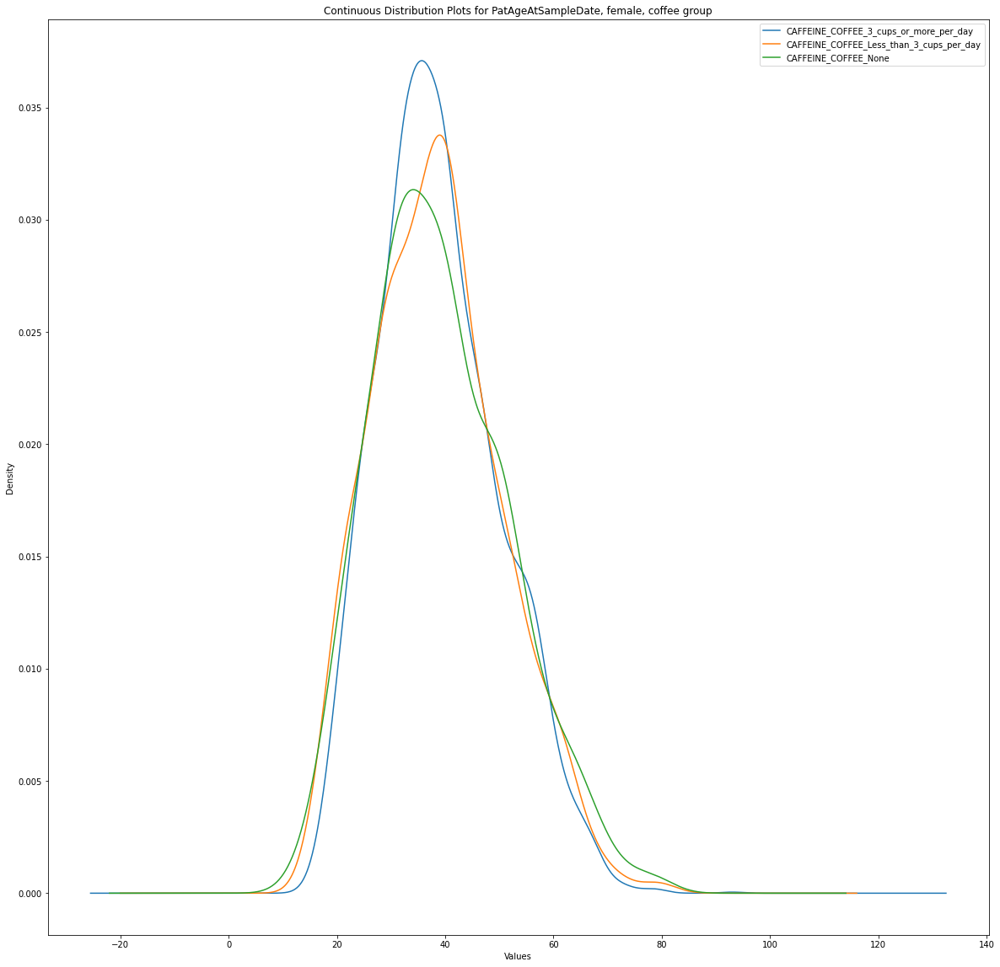

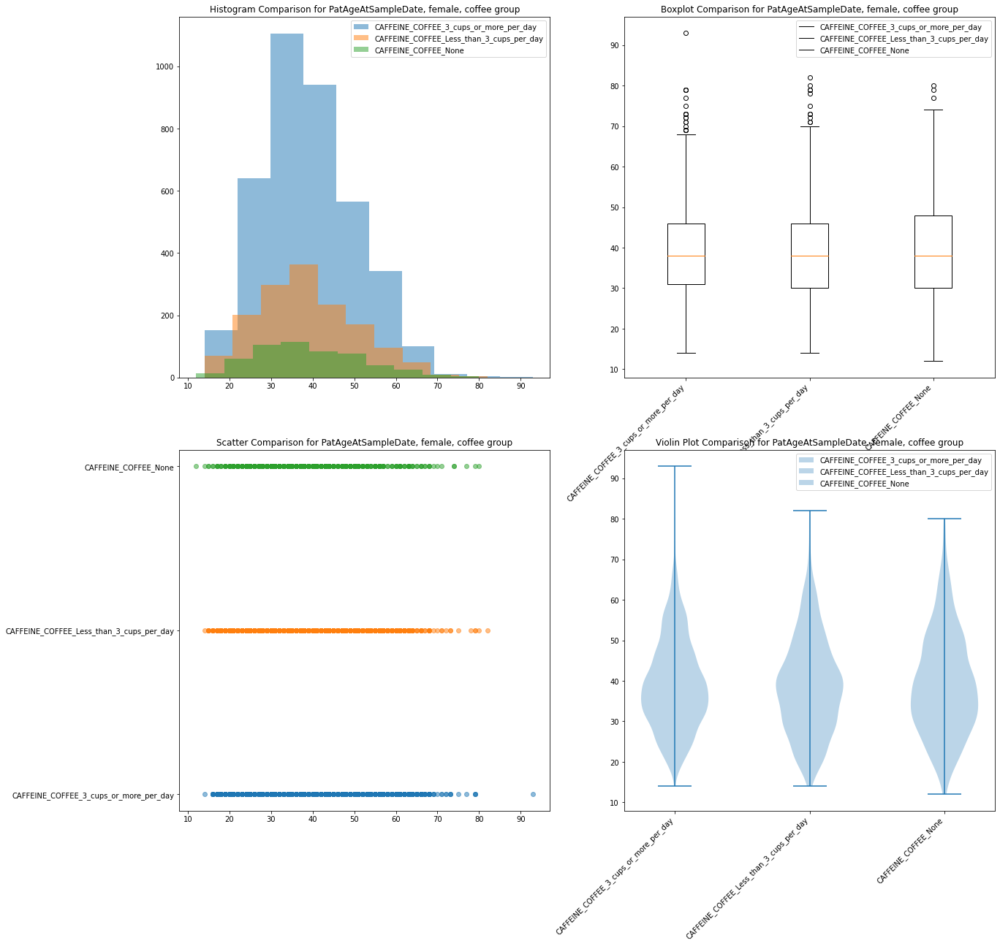

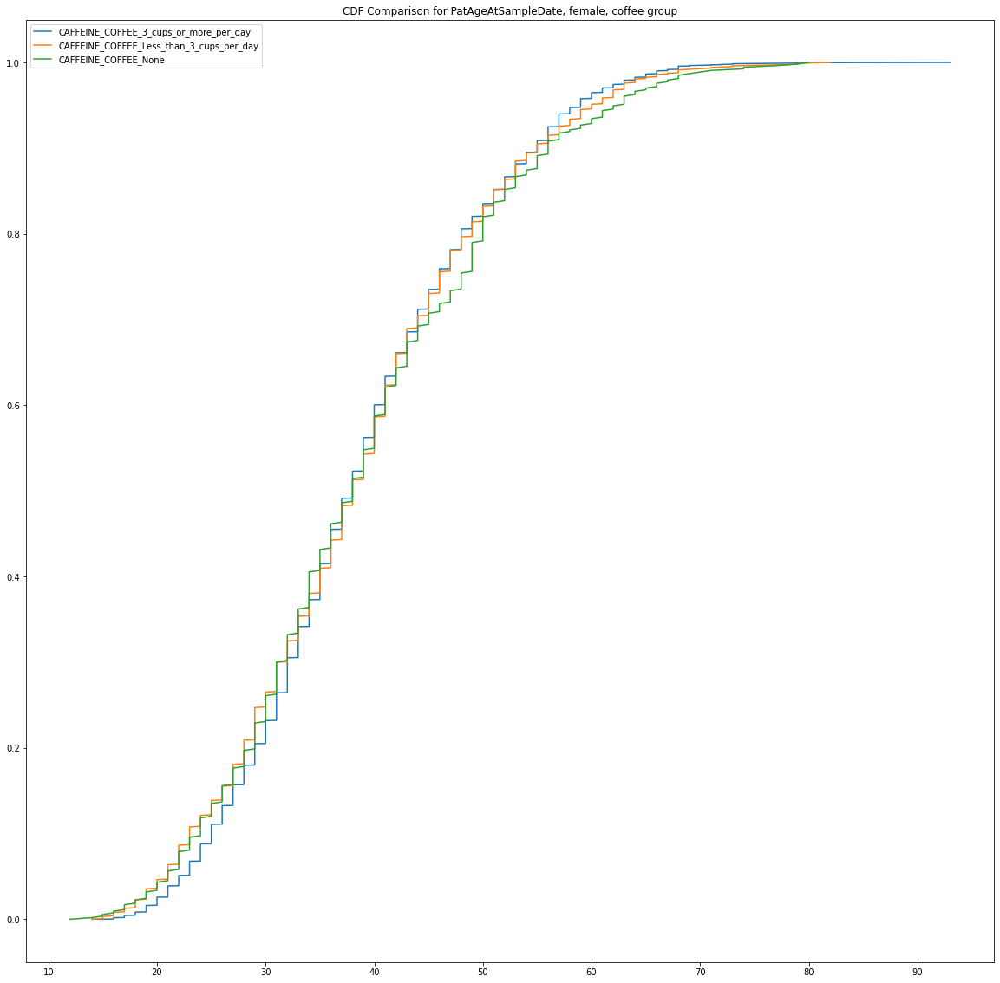

PatAgeAtSampleDate (38.0, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (38.0, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (38.0, 'CAFFEINE_COFFEE_None')
PatAgeAtSampleDate (38.0, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (38.71103678929766, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (39.153558052434455, 'CAFFEINE_COFFEE_None')
H=0.4477949490906468, p=0.7993970887180779


A Kruskal-Wallis test on PatAgeAtSampleDate between females in the coffee group was not statistically signficant, H (2, N = 5887)=0.45 ,p>.05
3858 1495 534
n=5887


SR_CLOZAPINE   male   coffee group  


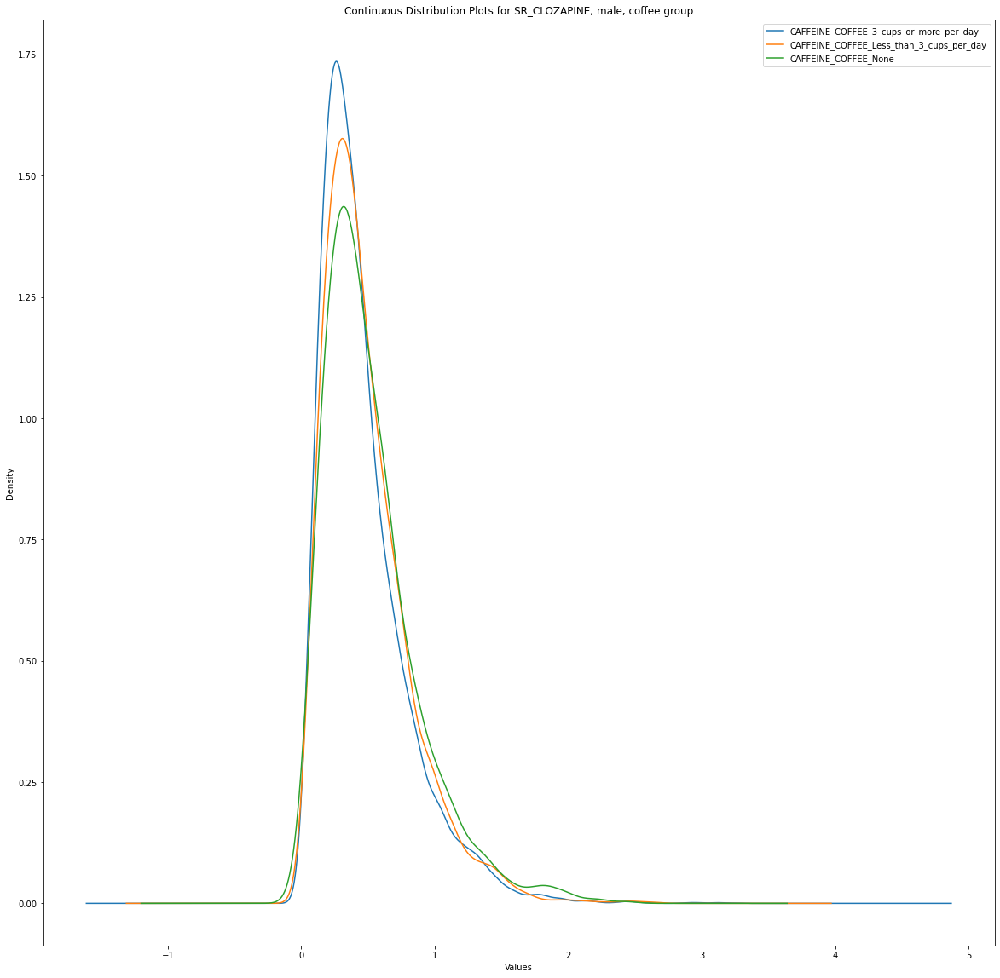

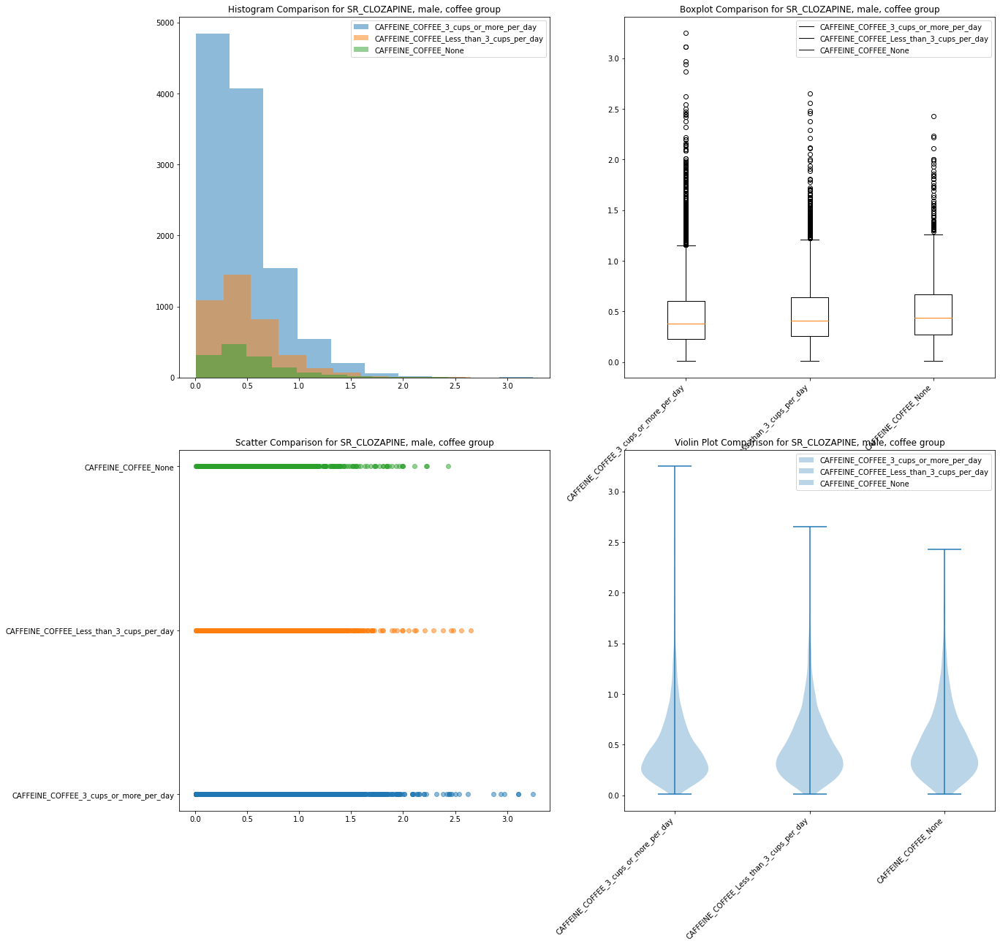

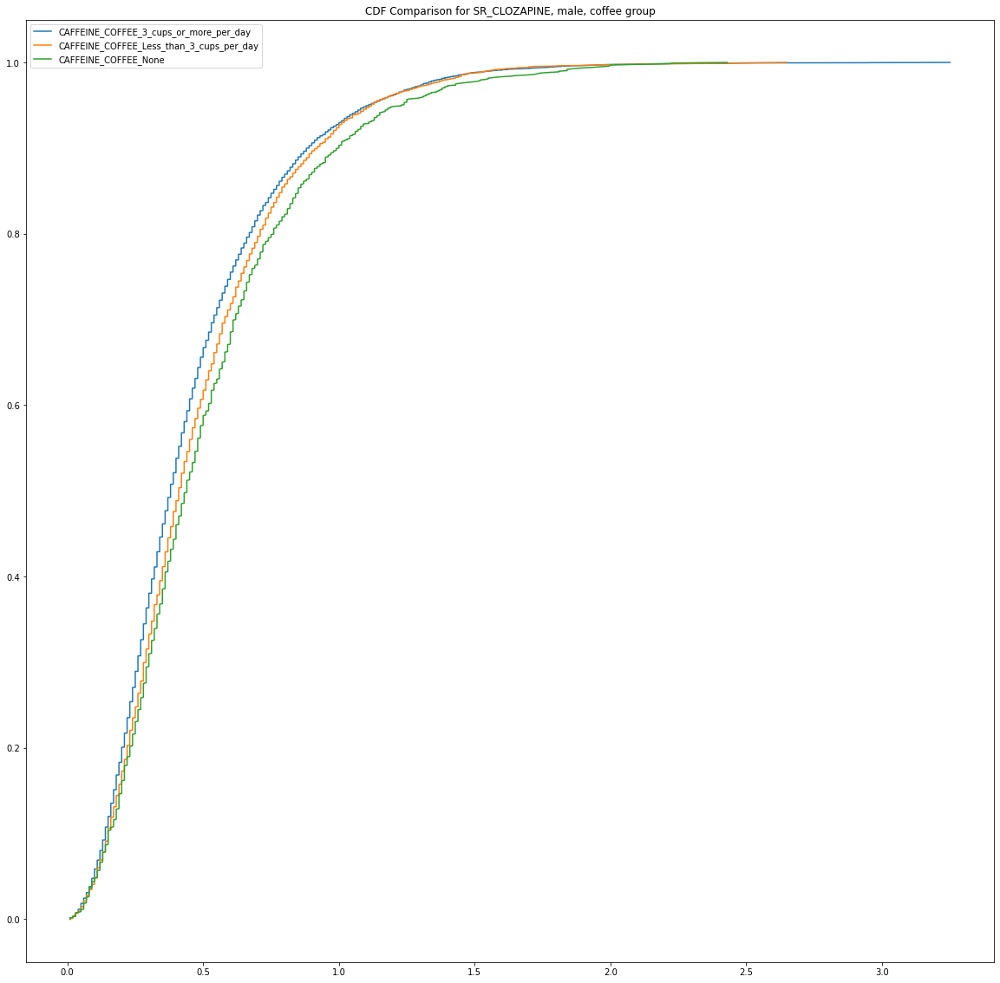

SR_CLOZAPINE (0.38, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (0.41, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (0.44, 'CAFFEINE_COFFEE_None')
SR_CLOZAPINE (0.38, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (0.4869102564102564, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (0.5203739002932551, 'CAFFEINE_COFFEE_None')
H=63.08738956517107, p=1.9986991008105474e-14


A Kruskal-Wallis test on SR_CLOZAPINE between males in the coffee group was statistically signficant at H (2, N = 16558)=63.09 ,p<.001 
11294 3900 1364
n=16558


SR_CURRENT_DOSE   female   coffee group  


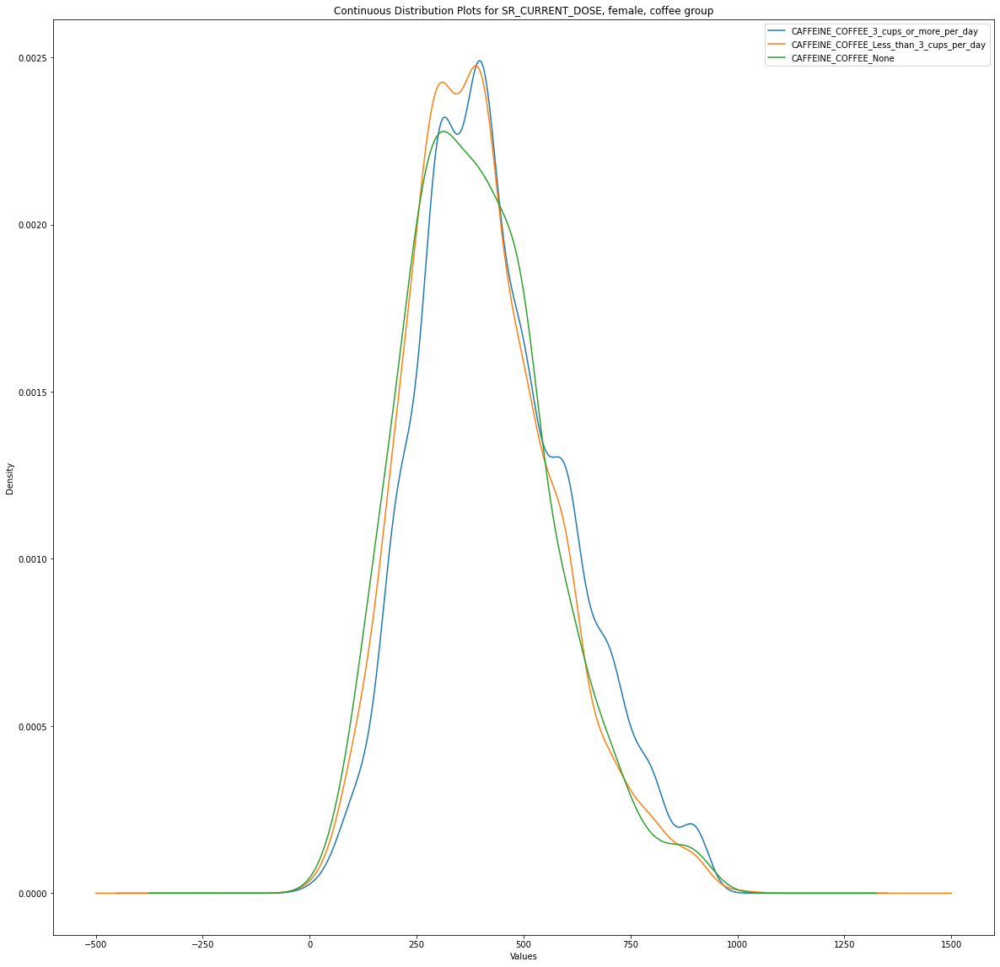

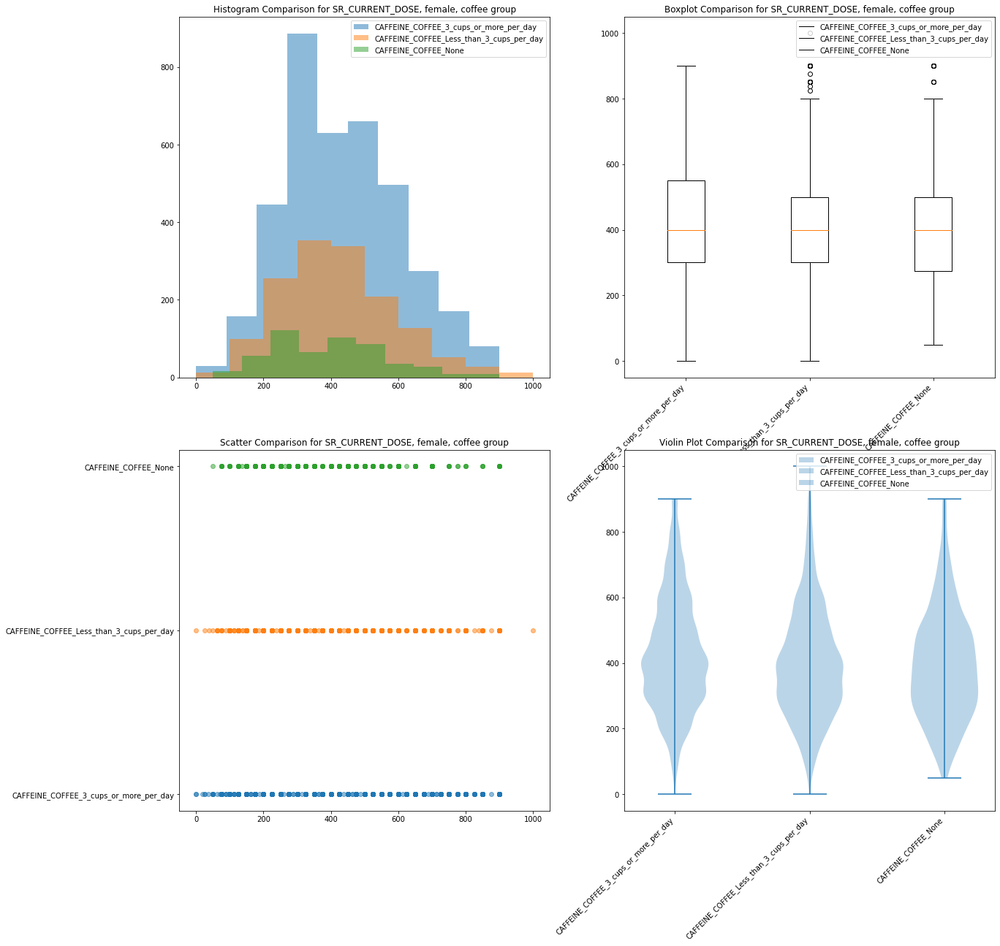

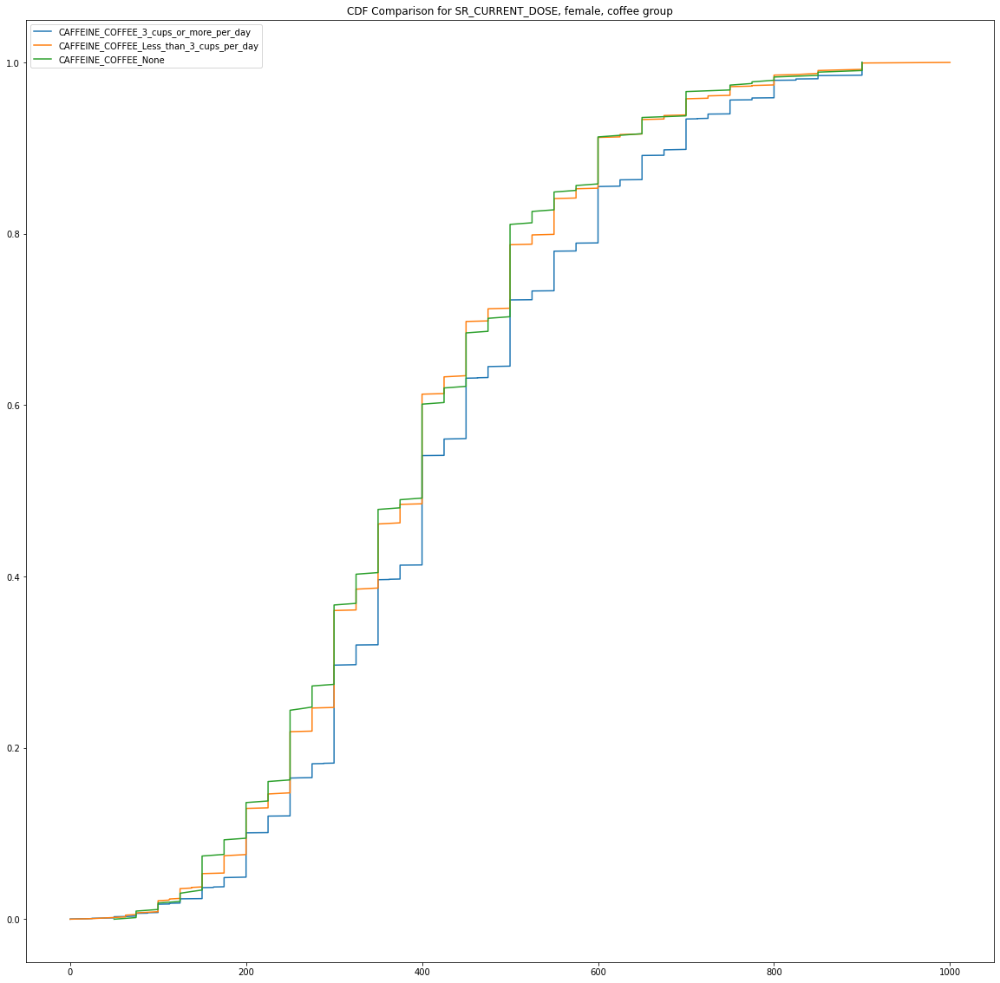

SR_CURRENT_DOSE (400.0, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (400.0, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (400.0, 'CAFFEINE_COFFEE_None')
SR_CURRENT_DOSE (400.0, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (397.72476446837146, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (393.0660377358491, 'CAFFEINE_COFFEE_None')
H=49.95031884019286, p=1.4237248953213279e-11


A Kruskal-Wallis test on SR_CURRENT_DOSE between females in the coffee group was statistically signficant at H (2, N = 5848)=49.95 ,p<.001 
3832 1486 530
n=5848


SR_CLOZAPINE   male   coffee group  


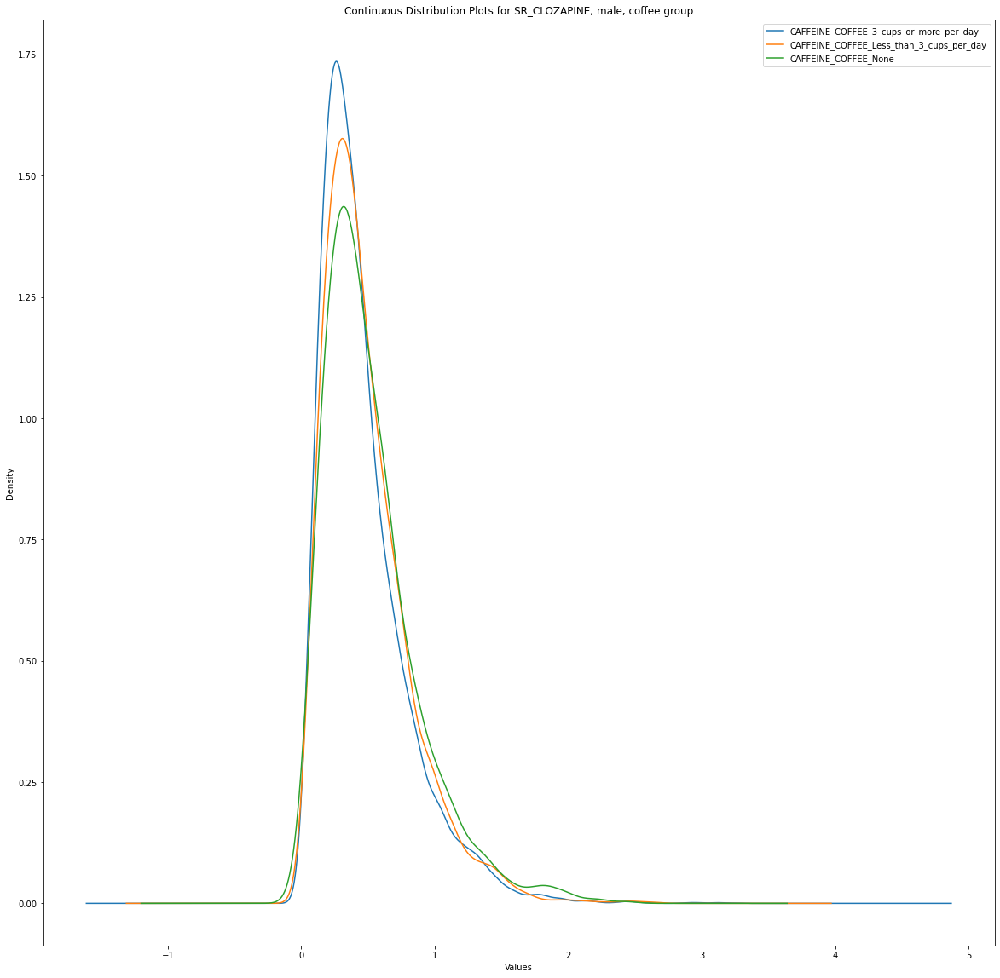

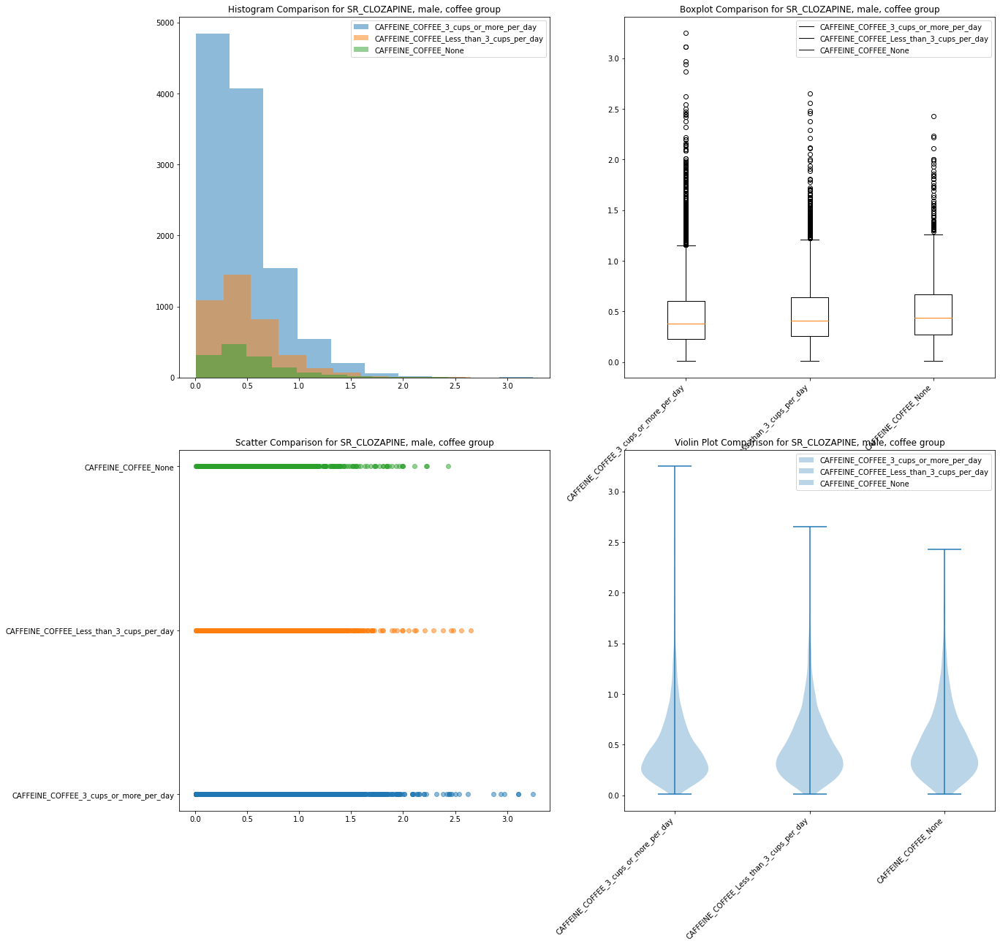

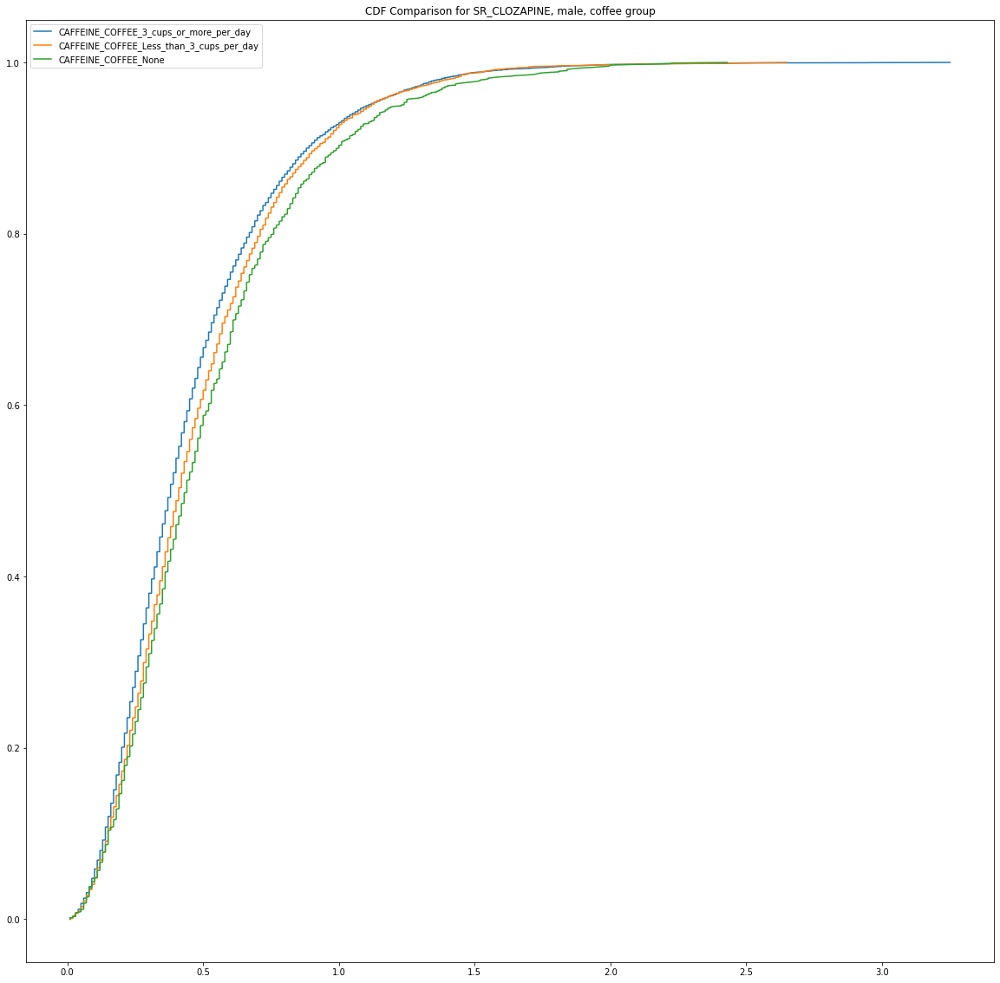

SR_CLOZAPINE (0.38, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (0.41, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (0.44, 'CAFFEINE_COFFEE_None')
SR_CLOZAPINE (0.38, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (0.4869102564102564, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (0.5203739002932551, 'CAFFEINE_COFFEE_None')
H=63.08738956517107, p=1.9986991008105474e-14


A Kruskal-Wallis test on SR_CLOZAPINE between males in the coffee group was statistically signficant at H (2, N = 16558)=63.09 ,p<.001 
11294 3900 1364
n=16558


SR_CLOZAPINE   female   coffee group  


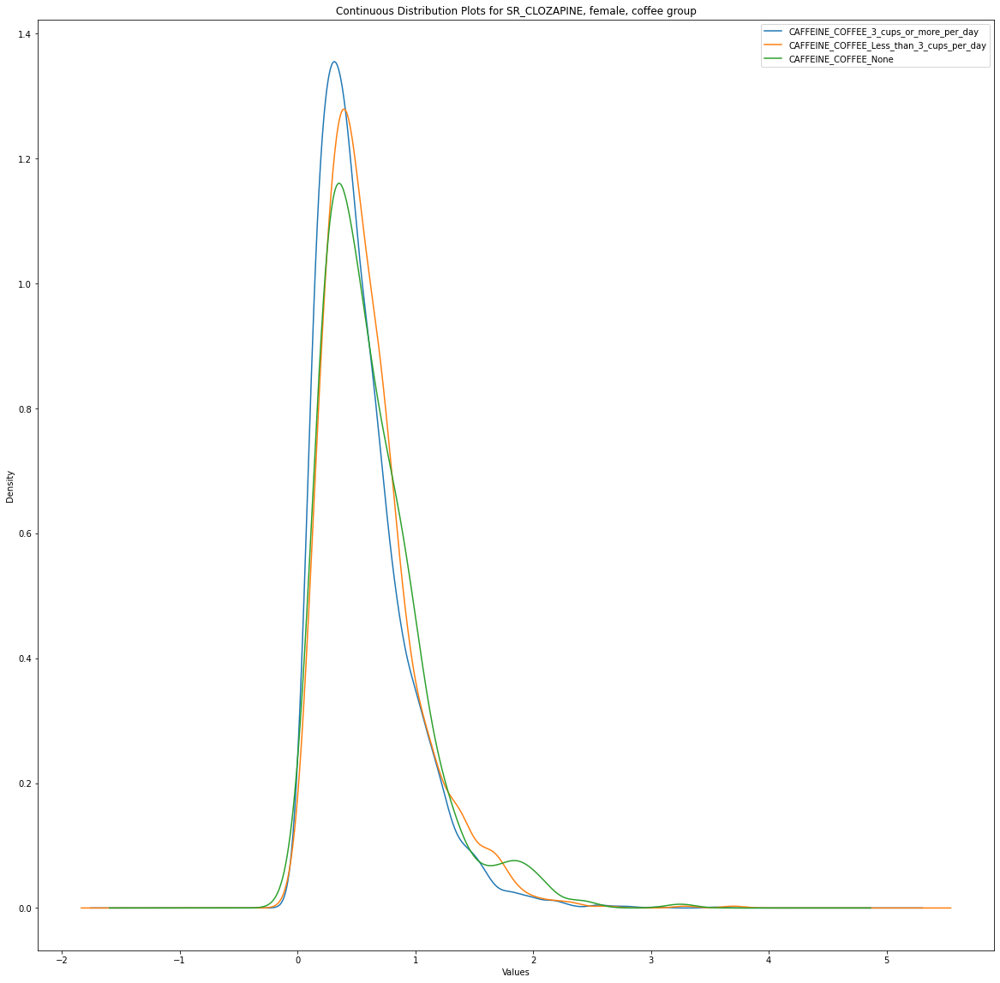

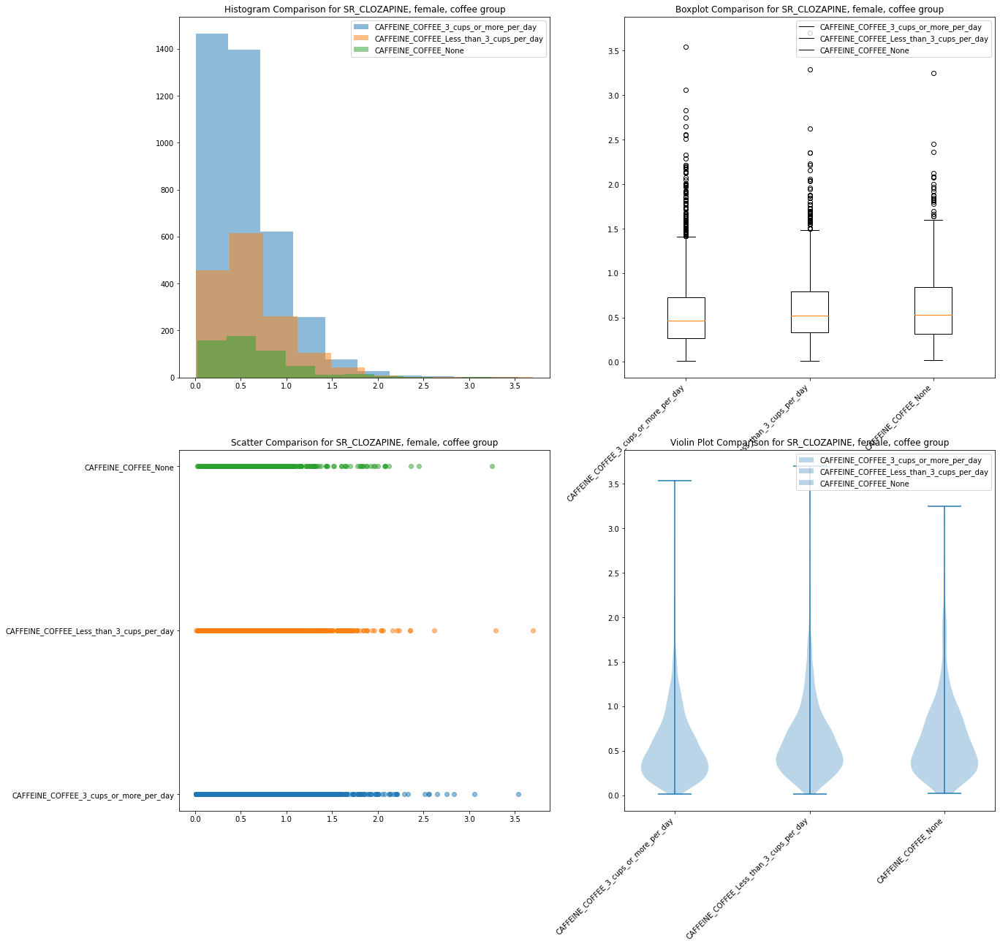

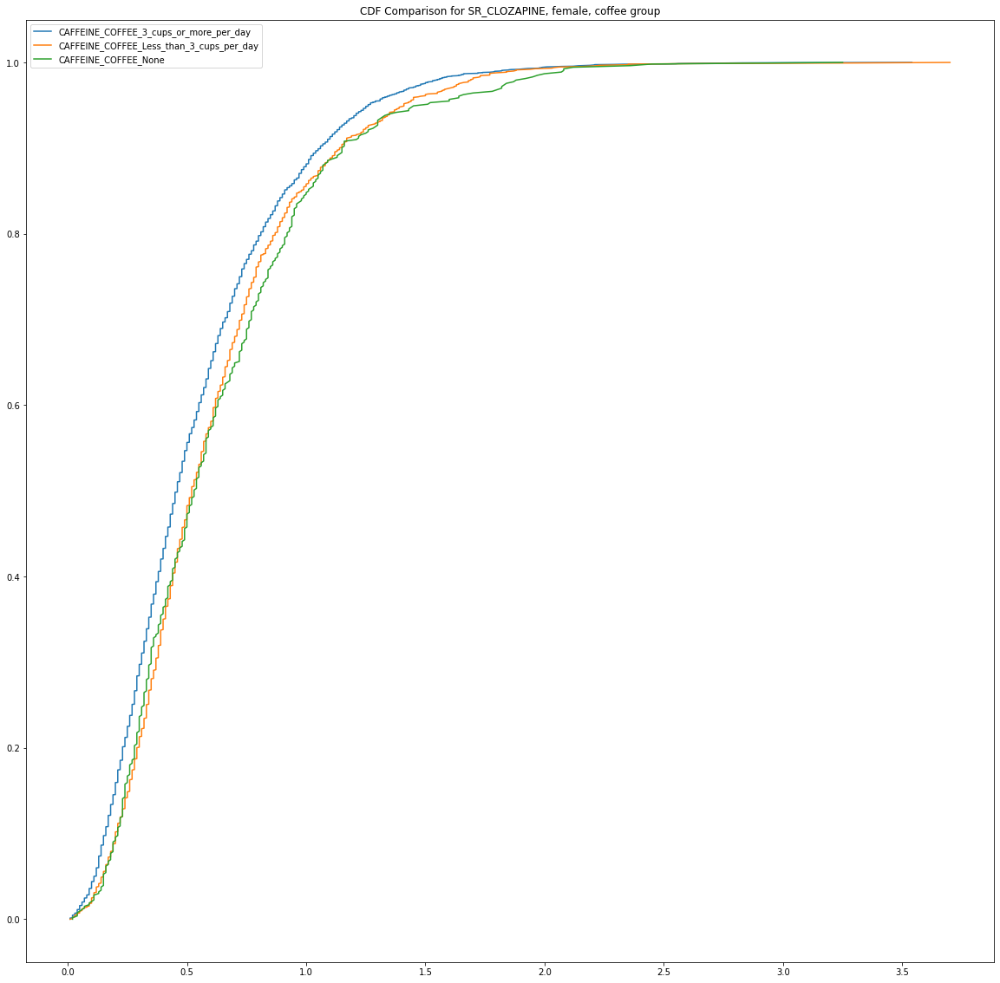

SR_CLOZAPINE (0.46, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (0.52, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (0.53, 'CAFFEINE_COFFEE_None')
SR_CLOZAPINE (0.46, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (0.6133377926421404, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (0.6315917602996254, 'CAFFEINE_COFFEE_None')
H=51.09478682438173, p=8.033559490187129e-12


A Kruskal-Wallis test on SR_CLOZAPINE between females in the coffee group was statistically signficant at H (2, N = 5887)=51.09 ,p<.001 
3858 1495 534
n=5887


SR_CLOZAPINE   male   coffee group  


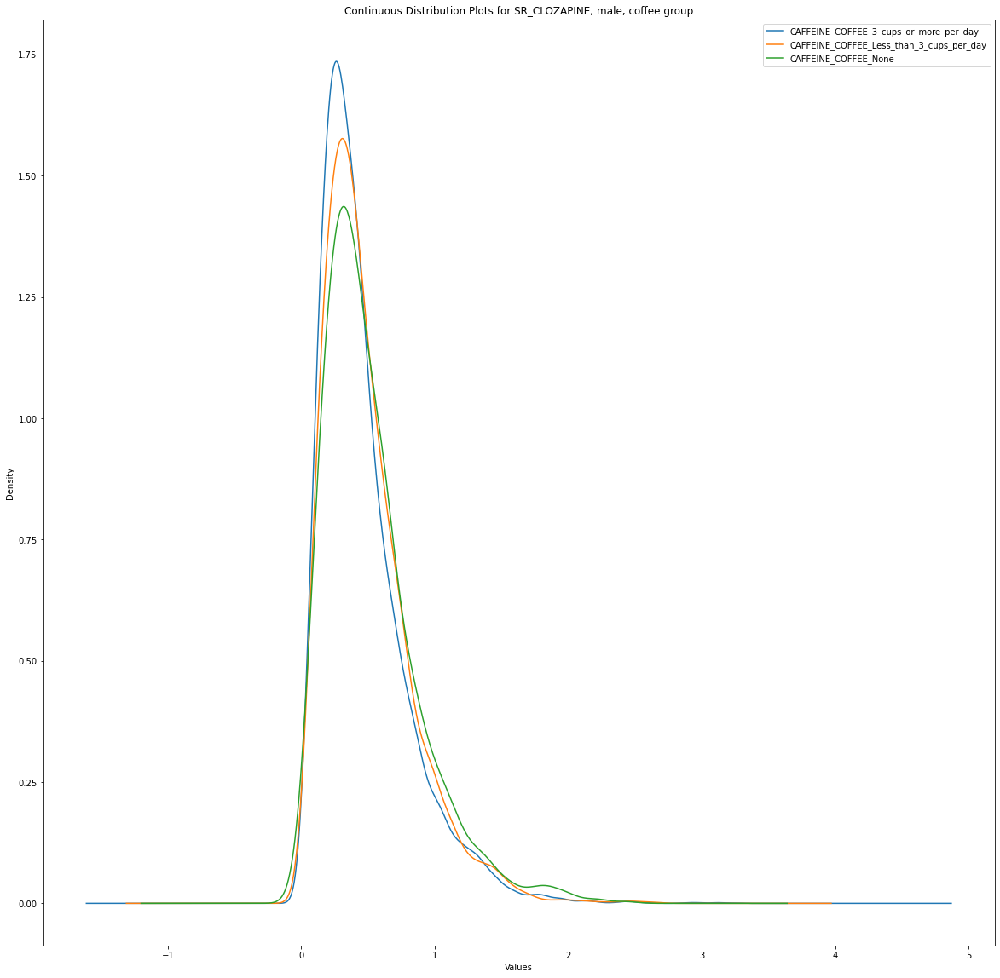

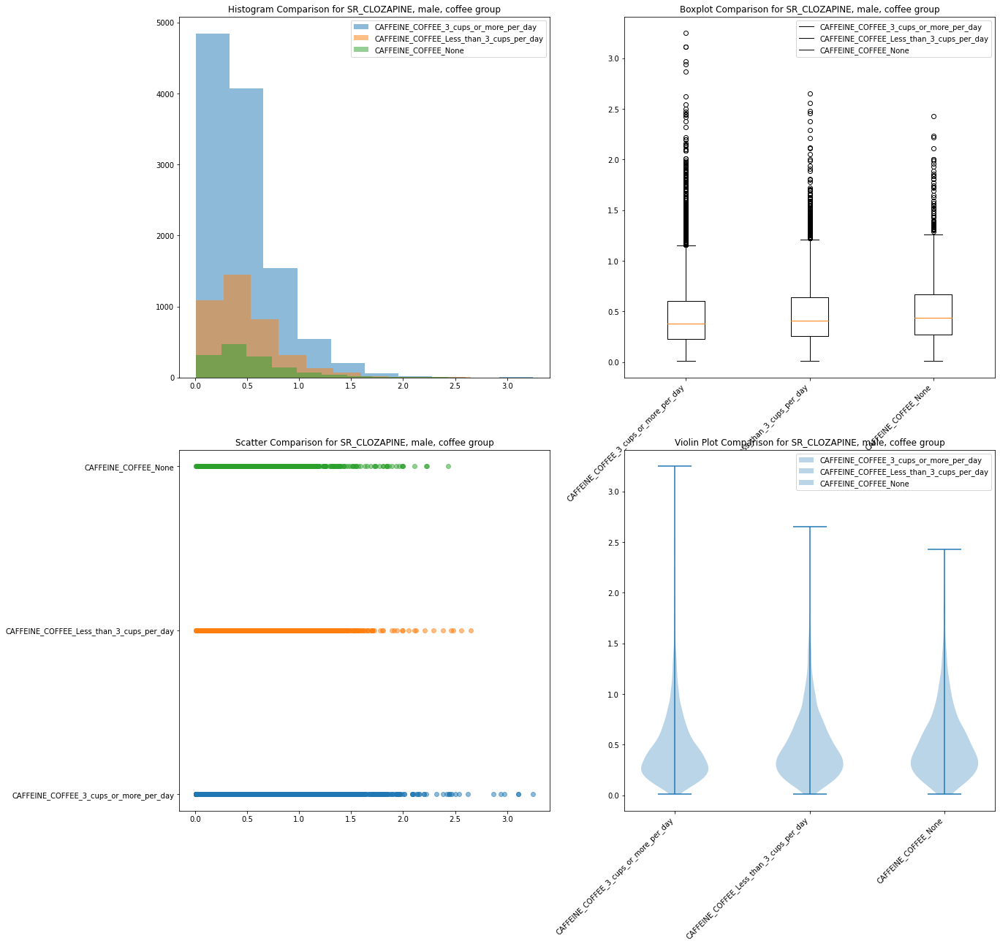

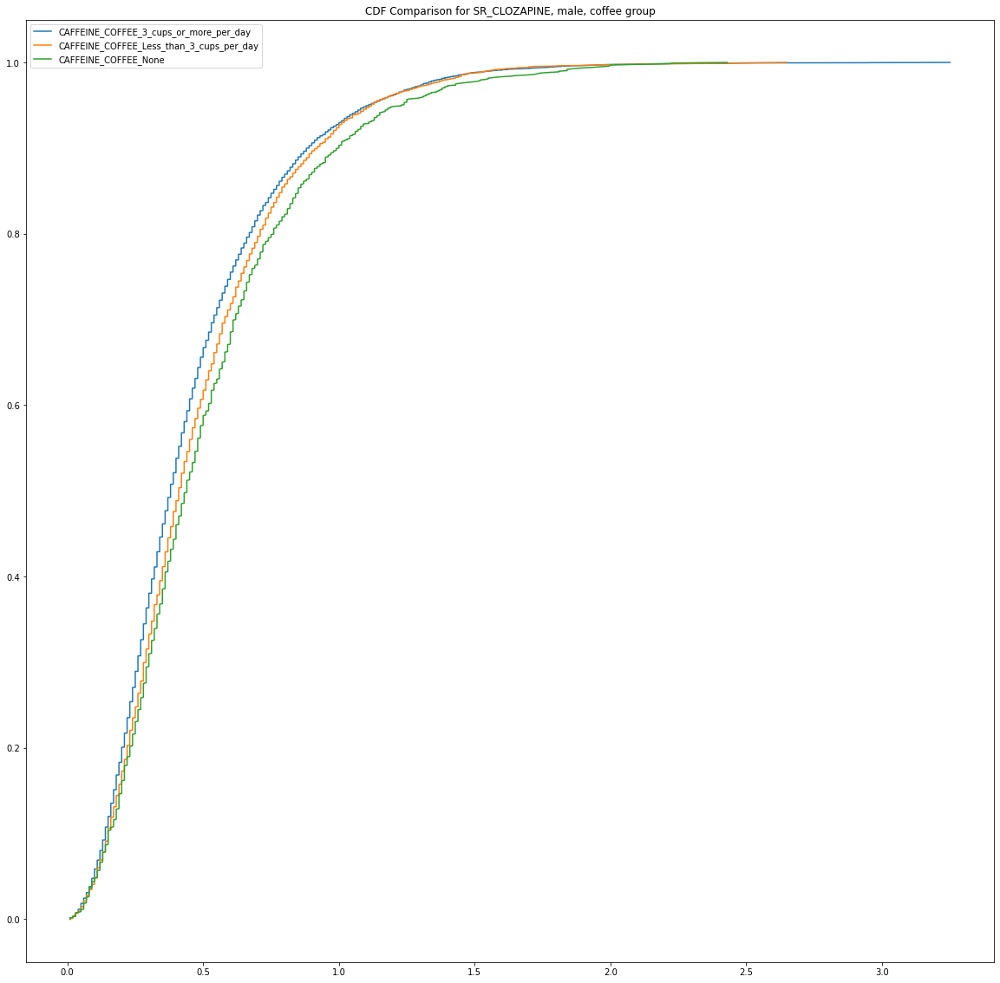

SR_CLOZAPINE (0.38, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (0.41, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (0.44, 'CAFFEINE_COFFEE_None')
SR_CLOZAPINE (0.38, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (0.4869102564102564, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (0.5203739002932551, 'CAFFEINE_COFFEE_None')
H=63.08738956517107, p=1.9986991008105474e-14


A Kruskal-Wallis test on SR_CLOZAPINE between males in the coffee group was statistically signficant at H (2, N = 16558)=63.09 ,p<.001 
11294 3900 1364
n=16558


SR_NORCLOZAPINE   female   coffee group  


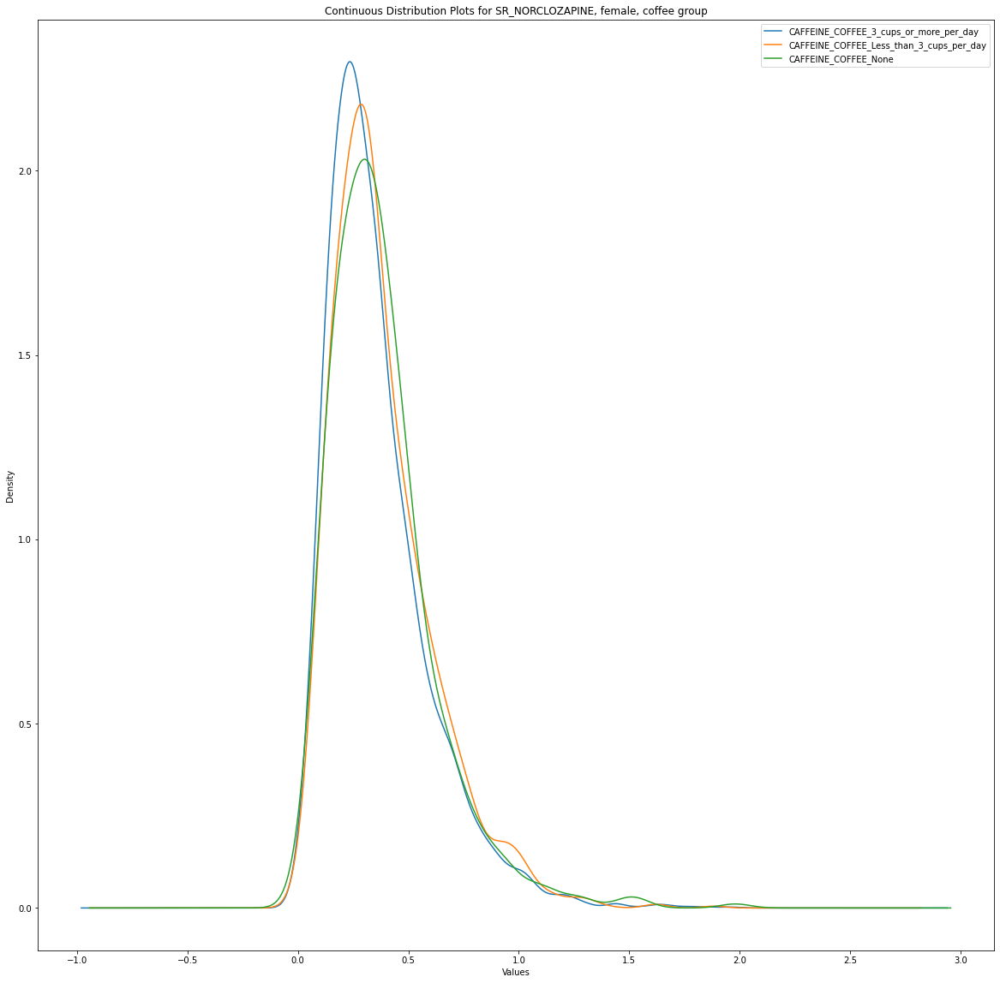

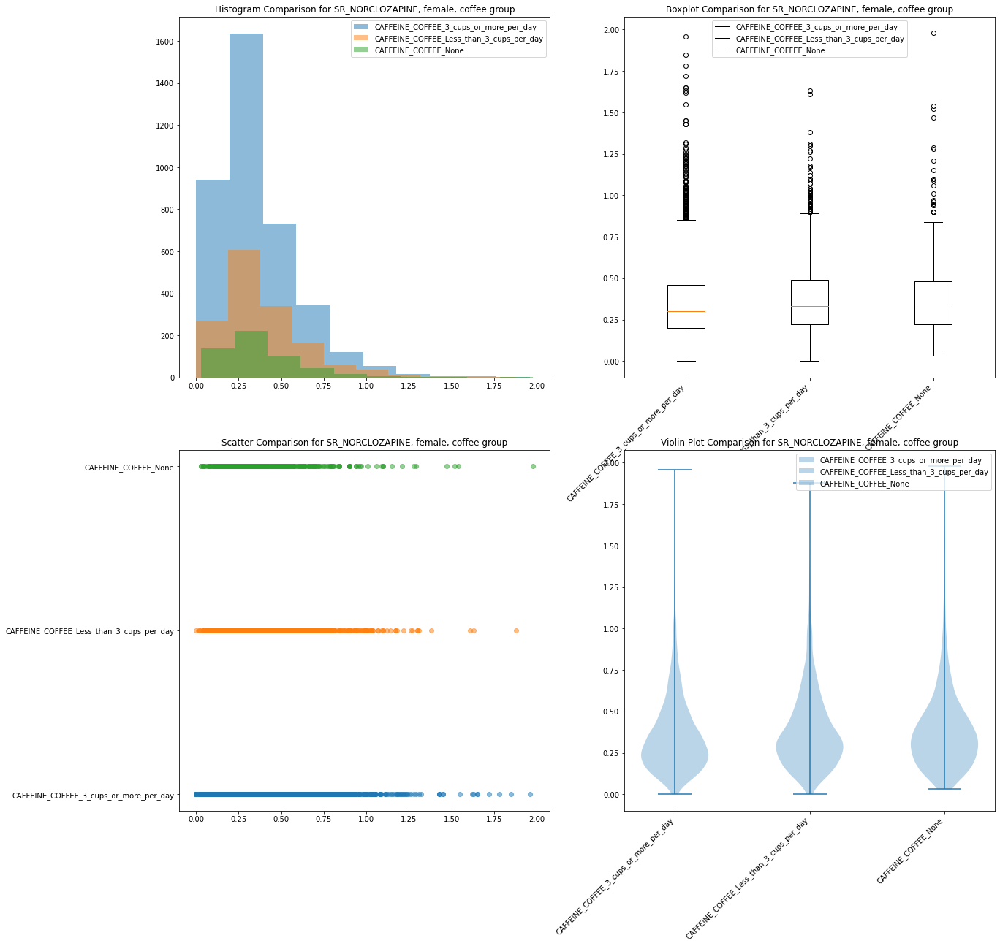

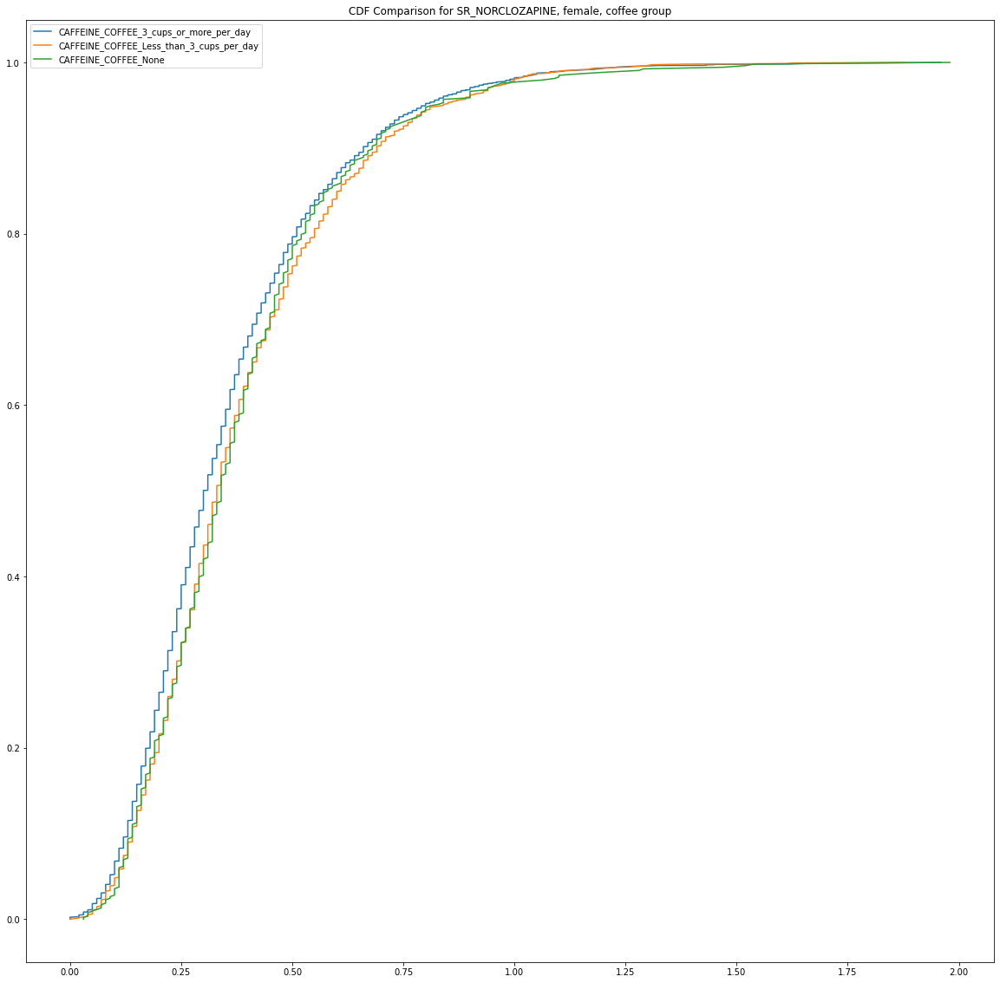

SR_NORCLOZAPINE (0.3, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (0.33, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (0.34, 'CAFFEINE_COFFEE_None')
SR_NORCLOZAPINE (0.3, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (0.38371237458193985, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (0.3839325842696629, 'CAFFEINE_COFFEE_None')
H=24.171833564391402, p=5.638363003471683e-06


A Kruskal-Wallis test on SR_NORCLOZAPINE between females in the coffee group was statistically signficant at H (2, N = 5887)=24.17 ,p<.001 
3858 1495 534
n=5887


SR_CLOZAPINE   male   coffee group  


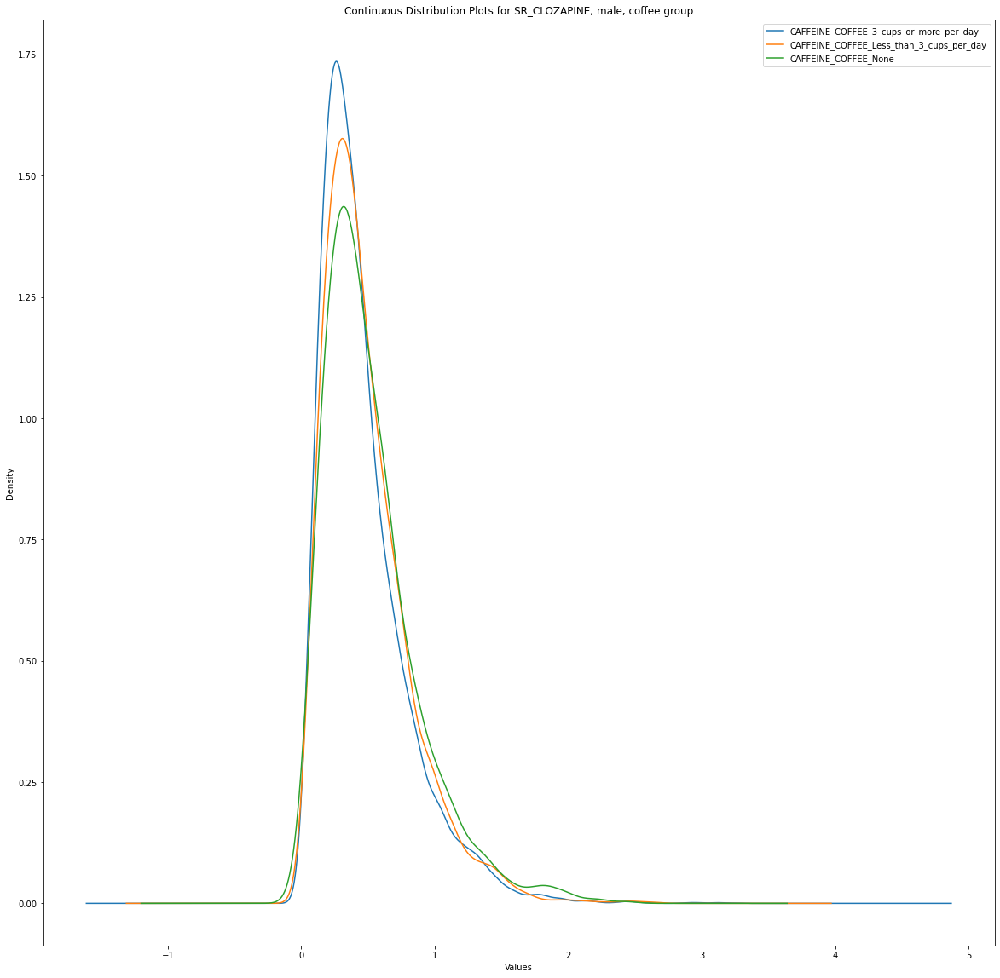

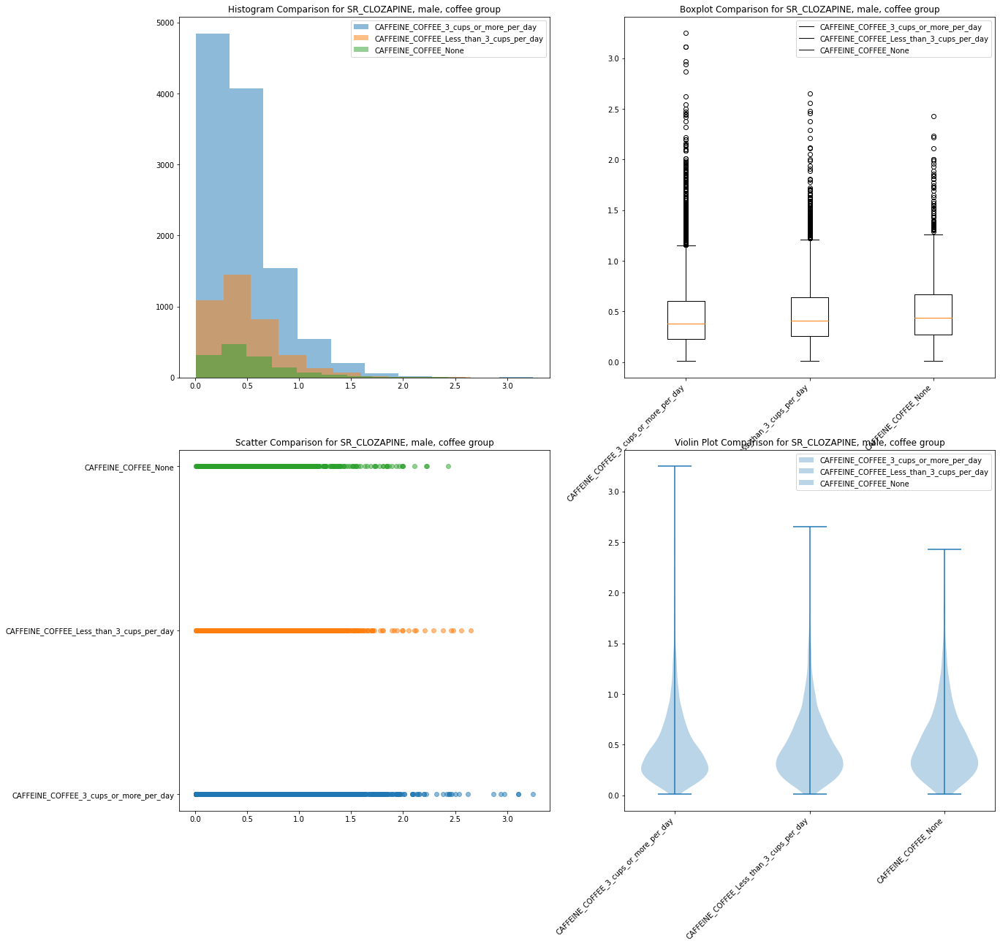

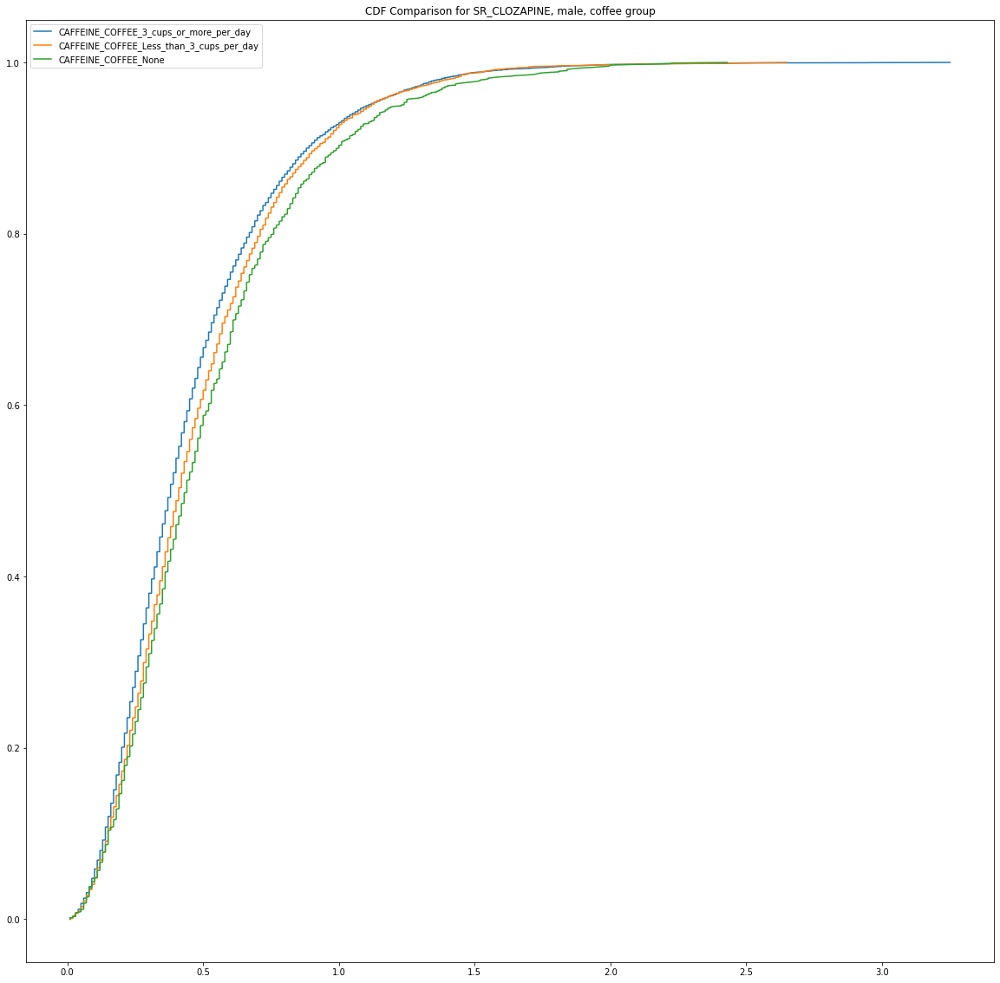

SR_CLOZAPINE (0.38, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (0.41, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (0.44, 'CAFFEINE_COFFEE_None')
SR_CLOZAPINE (0.38, 'CAFFEINE_COFFEE_3_cups_or_more_per_day'), (0.4869102564102564, 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'), (0.5203739002932551, 'CAFFEINE_COFFEE_None')
H=63.08738956517107, p=1.9986991008105474e-14


A Kruskal-Wallis test on SR_CLOZAPINE between males in the coffee group was statistically signficant at H (2, N = 16558)=63.09 ,p<.001 
11294 3900 1364
n=16558




In [470]:
for i in range(0, len(outcome_var_list)):
    for j in range(0, len(sex_bool_keys)):
        for k in range(0, len(group_list_keys)):
            #for l in range(0, len(smoking_list_keys)):

            label_list = ['CAFFEINE_COFFEE_3_cups_or_more_per_day',
                                       'CAFFEINE_COFFEE_Less_than_3_cups_per_day',
                                       'CAFFEINE_COFFEE_None']


            outcome_var  = outcome_var_list[i]



            sex_bool     = sex_bool_dict.get(sex_bool_keys[j])
            group_list   = group_list_dict.get(group_list_keys[k])
            #smoking_bool = smoking_list_dict.get(smoking_list_keys[l]).get(list(smoking_list_dict.get(smoking_list_keys[l]).keys())[0])
            #smoking_col  = list(smoking_list_dict.get(smoking_list_keys[l]).keys())[0]

            print(outcome_var," " ,sex_bool_keys[j], " ",group_list_keys[k], " ",)
            #print(outcome_var, sex_bool, smoking_bool, smoking_col)

            g1 = group_list[0][(group_list[0]['Sex_Male']==sex_bool)  ][outcome_var].dropna() 
            g2 = group_list[1][(group_list[1]['Sex_Male']==sex_bool)  ][outcome_var].dropna()  
            g3 = group_list[2][(group_list[2]['Sex_Male']==sex_bool)  ][outcome_var].dropna()

            import pandas as pd
            import matplotlib.pyplot as plt

            # create three pandas series
            #series1 = pd.Series([1, 2, 3, 4, 5])
           # series2 = pd.Series([2, 4, 6, 8, 10])
            #series3 = pd.Series([3, 6, 9, 12, 15])

            # plot the series in the same figure
            fig, ax = plt.subplots()
            g1.plot(kind='kde', ax=ax, label = 'CAFFEINE_COFFEE_3_cups_or_more_per_day')
            g2.plot(kind='kde', ax=ax, label = 'CAFFEINE_COFFEE_Less_than_3_cups_per_day')
            g3.plot(kind='kde', ax=ax, label = 'CAFFEINE_COFFEE_None')

            series1 = g1
            series2 = g2
            series3 = g3
            
            
            # set the title and labels
            ax.set_title(f'Continuous Distribution Plots for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}')
            ax.set_xlabel('Values')
            ax.set_ylabel('Density')
            
            ax.legend()
            
            # plot the series in the same figure
            fig, axs = plt.subplots(2, 2)

            # plot histogram for series1 and series2
            axs[0, 0].hist(series1, alpha=0.5, label='CAFFEINE_COFFEE_3_cups_or_more_per_day')
            axs[0, 0].hist(series2, alpha=0.5, label='CAFFEINE_COFFEE_Less_than_3_cups_per_day')
            axs[0, 0].hist(series3, alpha=0.5, label='CAFFEINE_COFFEE_None')
            axs[0, 0].set_title(f'Histogram Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}')
            axs[0, 0].legend(label_list)
            
            plt.xticks(rotation=45, ha='right')
            # plot boxplot for series1 and series3
            axs[0, 1].boxplot([series1, series2, series3],labels=label_list)
            axs[0, 1].set_title(f'Boxplot Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}')
            axs[0, 1].legend(label_list)
            plt.xticks(rotation=45, ha='right')
            for tick in axs[0, 1].get_xticklabels():
                tick.set_rotation(45)
                tick.set_horizontalalignment('right')

#             # plot scatter plot for series1 and series2
#             axs[1, 0].scatter(series1.index, series1.values)
#             axs[1, 0].scatter(series2.index, series2.values)
#             axs[1, 0].set_title(f"""Scatter Plot Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}
#                                    CAFFEINE_COFFEE_3_cups_or_more_per_day &  CAFFEINE_COFFEE_Less_than_3_cups_per_day""")
#             axs[1, 0].legend(['CAFFEINE_COFFEE_3_cups_or_more_per_day', 'CAFFEINE_COFFEE_Less_than_3_cups_per_day'])
            
    
        
            axs[1, 0].set_title(f'Scatter Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}')
            axs[1, 0].scatter(series1, [0]*len(series1), alpha=0.5, label='CAFFEINE_COFFEE_3_cups_or_more_per_day')
            axs[1, 0].scatter(series2, [1]*len(series2), alpha=0.5, label='CAFFEINE_COFFEE_Less_than_3_cups_per_day')
            axs[1, 0].scatter(series3, [2]*len(series3), alpha=0.5, label='CAFFEINE_COFFEE_None')

            axs[1, 0].set_yticks([0, 1, 2])
            axs[1, 0].set_yticklabels(['CAFFEINE_COFFEE_3_cups_or_more_per_day', 'CAFFEINE_COFFEE_Less_than_3_cups_per_day', 'CAFFEINE_COFFEE_None'])

            plt.legend()
            #plt.show()
            
#                         # create a dataframe with the three series
#             df = pd.DataFrame({'series1': series1,
#                                'series2': series2,
#                                'series3': series3})

#             # plot a scatter graph
#             df.plot(kind='scatter', x='series1', y='series2', color='red')
#             df.plot(kind='scatter', x='series1', y='series3', color='blue')
#             df.plot(kind='scatter', x='series2', y='series3', color='green')

#             # show the graph
#             plt.show()
            # plot a scatter graph
#             plt.scatter(series1, series2, color='red')
#             plt.scatter(series1, series3, color='blue')
#             plt.scatter(series2, series3, color='green')

#             # show the graph
#             plt.show()
            
            plt.xticks(rotation=45, ha='right')
            # plot violin plot for all three series
            axs[1, 1].violinplot([series1, series2, series3])
            axs[1, 1].set_xticks([1, 2, 3])
            axs[1, 1].set_xticklabels(['CAFFEINE_COFFEE_3_cups_or_more_per_day',
                                       'CAFFEINE_COFFEE_Less_than_3_cups_per_day',
                                       'CAFFEINE_COFFEE_None'])
            axs[1, 1].set_title(f'Violin Plot Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}')
            axs[1, 1].legend(label_list)
            
            
            
            
            # plot cdf for all three series
            fig2 = plt.figure()
            for i in range(3):
                sorted_data = np.sort(eval(f'series{i+1}'))
                yvals = np.arange(len(sorted_data))/float(len(sorted_data)-1)
                plt.plot(sorted_data,yvals,label=f'{label_list[i]}')
            plt.legend()
            plt.title(f'CDF Comparison for {outcome_var}, {sex_bool_keys[j]}, {group_list_keys[k]}')

            plt.show()
            
            

            print(f"{outcome_var} {(g1.median(), 'CAFFEINE_COFFEE_3_cups_or_more_per_day')}, {(g2.median(), 'CAFFEINE_COFFEE_Less_than_3_cups_per_day')}, {(g3.median(),'CAFFEINE_COFFEE_None')}")
             
            print(f"{outcome_var} {(g1.median(), 'CAFFEINE_COFFEE_3_cups_or_more_per_day')}, {(g2.mean(), 'CAFFEINE_COFFEE_Less_than_3_cups_per_day')}, {(g3.mean(),'CAFFEINE_COFFEE_None')}")
                   
            
            if(outcome_var != 'SR_DERIVED_SMOKER_STATUS'):
                test_name = 'Kruskal-Wallis'

                stat, p = stats.kruskal(g1,
                                        g2,
                                        g3
                             )


            print(f"H={stat}, p={p}")

            p_sig_05 = p<0.05
            p_sig_001 = p<0.001

            dof_str = f'(2, N = {sum((g1.shape[0], g2.shape[0], g3.shape[0])) - 0})'

            print("\n")
            if(p_sig_001):


                print(f'A {test_name} test on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} was statistically signficant at H {dof_str}={round(stat, 2)} ,p<.001 ')

                print(g1.shape[0], g2.shape[0], g3.shape[0])
                print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")
                result = 'p<0.001'

            elif(p_sig_05):

                print(f'A {test_name} test on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} was statistically signficant at H {dof_str}={round(stat, 2)} ,p<.05')

                print(g1.shape[0], g2.shape[0], g3.shape[0])
                print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")
                result = 'p<0.05'

            else:

                print(f'A {test_name} test on {outcome_var} between {sex_bool_keys[j]}s in the {group_list_keys[k]} was not statistically signficant, H {dof_str}={round(stat, 2)} ,p>.05')

                print(g1.shape[0], g2.shape[0], g3.shape[0])
                print(f"n={sum((g1.shape[0], g2.shape[0], g3.shape[0]))}")
                result = 'p>0.05'

            print("\n")

            results_df = results_df.append({'Outcome': outcome_var,
                                            'Sex': sex_bool_keys[j],
                                            'Group': group_list_keys[k],
                                            #'Smoking': smoking_list_keys[l],
                                            'Test': test_name,
                                            'H': stat,
                                            'p': p,
                                            'Significance': result,
                                            'Sample Size': sum((g1.shape[0], g2.shape[0], g3.shape[0])),
                                            'degrees of freedom': dof_str},
                                           ignore_index=True)

In [471]:
len(series1), len(series2)

(11294, 3900)

In [472]:
results_df

,Outcome,Sex,Group,Test,H,p,Significance,Sample Size,degrees of freedom
0,PatAgeAtSampleDate,female,coffee group,Kruskal-Wallis,0.44779,0.79940,p>0.05,5887,"(2, N = 5887)"
1,SR_CLOZAPINE,male,coffee group,Kruskal-Wallis,63.08739,0.00000,p<0.001,16558,"(2, N = 16558)"
2,SR_CURRENT_DOSE,female,coffee group,Kruskal-Wallis,49.95032,0.00000,p<0.001,5848,"(2, N = 5848)"
3,SR_CLOZAPINE,male,coffee group,Kruskal-Wallis,63.08739,0.00000,p<0.001,16558,"(2, N = 16558)"
4,SR_CLOZAPINE,female,coffee group,Kruskal-Wallis,51.09479,0.00000,p<0.001,5887,"(2, N = 5887)"
5,SR_CLOZAPINE,male,coffee group,Kruskal-Wallis,63.08739,0.00000,p<0.001,16558,"(2, N = 16558)"
6,SR_NORCLOZAPINE,female,coffee group,Kruskal-Wallis,24.17183,0.00001,p<0.001,5887,"(2, N = 5887)"
7,SR_CLOZAPINE,male,coffee group,Kruskal-Wallis,63.08739,0.00000,p<0.001,16558,"(2, N = 16558)"
